## Inventory Demand Dataset

In [ ]:
#import import_ipynb 
import Template_2 as t
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline

In [ ]:
df=t.load_data('csv')

Enter path of fileSalesKaggle3.csv


In [ ]:
df

,Order,File_Type,SKU_number,SoldFlag,SoldCount,MarketingType,ReleaseNumber,New_Release_Flag,StrengthFactor,PriceReg,ReleaseYear,ItemCount,LowUserPrice,LowNetPrice
0,2,Historical,1737127,0.0,0.0,D,15,1,6.827430e+05,44.99,2015,8,28.97,31.84
1,3,Historical,3255963,0.0,0.0,D,7,1,1.016014e+06,24.81,2005,39,0.00,15.54
2,4,Historical,612701,0.0,0.0,D,0,0,3.404640e+05,46.00,2013,34,30.19,27.97
3,6,Historical,115883,1.0,1.0,D,4,1,3.340110e+05,100.00,2006,20,133.93,83.15
4,7,Historical,863939,1.0,1.0,D,2,1,1.287938e+06,121.95,2010,28,4.00,23.99
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
198912,208023,Active,109683,NaN,NaN,D,7,1,2.101869e+05,72.87,2006,54,8.46,60.59
198913,208024,Active,416462,NaN,NaN,D,8,1,4.555041e+05,247.00,2009,65,8.40,74.85
198914,208025,Active,658242,NaN,NaN,S,2,1,1.692746e+05,50.00,2012,23,23.98,32.62
198915,208026,Active,2538340,NaN,NaN,S,2,1,3.775266e+05,46.95,2001,23,27.42,37.89


In [ ]:
t.missing_details(df)

,"Missing value, %",Missing value count,N unique value
Order,0.0,0,198917
File_Type,0.0,0,2
SKU_number,0.0,0,133360
SoldFlag,62.0,122921,2
SoldCount,62.0,122921,37
MarketingType,0.0,0,2
ReleaseNumber,0.0,0,71
New_Release_Flag,0.0,0,2
StrengthFactor,0.0,0,197424
PriceReg,0.0,0,11627


The label we are trying to predict here is the soldflag. Only those rows will be considered which have the label and are not empty.

In [ ]:
df2=df.loc[df['SoldFlag'].notnull()]

In [ ]:
df2

,Order,File_Type,SKU_number,SoldFlag,SoldCount,MarketingType,ReleaseNumber,New_Release_Flag,StrengthFactor,PriceReg,ReleaseYear,ItemCount,LowUserPrice,LowNetPrice
0,2,Historical,1737127,0.0,0.0,D,15,1,682743.0,44.99,2015,8,28.97,31.84
1,3,Historical,3255963,0.0,0.0,D,7,1,1016014.0,24.81,2005,39,0.00,15.54
2,4,Historical,612701,0.0,0.0,D,0,0,340464.0,46.00,2013,34,30.19,27.97
3,6,Historical,115883,1.0,1.0,D,4,1,334011.0,100.00,2006,20,133.93,83.15
4,7,Historical,863939,1.0,1.0,D,2,1,1287938.0,121.95,2010,28,4.00,23.99
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
75991,85102,Historical,863599,0.0,0.0,S,2,1,119056.0,64.99,2008,34,32.49,53.00
75992,85103,Historical,614304,0.0,0.0,S,6,1,1115312.0,21.50,2004,53,47.99,21.97
75993,85104,Historical,109021,0.0,0.0,S,7,1,1315446.0,142.75,2006,19,47.99,53.99
75994,85105,Historical,658242,0.0,0.0,S,2,1,877788.0,50.00,2012,21,27.07,32.62


In [ ]:
t.missing_details(df2)

,"Missing value, %",Missing value count,N unique value
Order,0.0,0,75996
File_Type,0.0,0,1
SKU_number,0.0,0,75996
SoldFlag,0.0,0,2
SoldCount,0.0,0,37
MarketingType,0.0,0,2
ReleaseNumber,0.0,0,66
New_Release_Flag,0.0,0,2
StrengthFactor,0.0,0,74603
PriceReg,0.0,0,9010


In [ ]:
t.overview(df2,'head',10)

The shape is : (75996, 14)
The column data types are: 

Order                 int64
File_Type            object
SKU_number            int64
SoldFlag            float64
SoldCount           float64
MarketingType        object
ReleaseNumber         int64
New_Release_Flag      int64
StrengthFactor      float64
PriceReg            float64
ReleaseYear           int64
ItemCount             int64
LowUserPrice        float64
LowNetPrice         float64
dtype: object


The first 10 rows are :


,Order,File_Type,SKU_number,SoldFlag,SoldCount,MarketingType,ReleaseNumber,New_Release_Flag,StrengthFactor,PriceReg,ReleaseYear,ItemCount,LowUserPrice,LowNetPrice
0,2,Historical,1737127,0.0,0.0,D,15,1,682743.0,44.99,2015,8,28.97,31.84
1,3,Historical,3255963,0.0,0.0,D,7,1,1016014.0,24.81,2005,39,0.00,15.54
2,4,Historical,612701,0.0,0.0,D,0,0,340464.0,46.00,2013,34,30.19,27.97
3,6,Historical,115883,1.0,1.0,D,4,1,334011.0,100.00,2006,20,133.93,83.15
4,7,Historical,863939,1.0,1.0,D,2,1,1287938.0,121.95,2010,28,4.00,23.99
5,8,Historical,214948,0.0,0.0,D,0,0,1783153.0,132.00,2011,33,138.98,13.64
6,9,Historical,484059,0.0,0.0,D,13,1,2314801.0,95.95,2010,33,90.77,46.49
7,10,Historical,146401,0.0,0.0,D,4,1,721111.0,207.80,2011,57,187.90,30.56
8,11,Historical,110568,0.0,0.0,D,11,1,436667.0,119.81,2008,36,63.99,96.92
9,12,Historical,764270,0.0,0.0,D,5,1,6652211.0,49.95,2004,19,53.99,28.99


Removing unnecessary columns.

In [ ]:
t.remove_cols(df2,'Order')

E:\ProgramData\Anaconda3\lib\site-packages\pandas\core\frame.py:4102: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


In [ ]:
t.remove_cols(df2,'SKU_number','File_Type')

In [ ]:
df2

,SoldFlag,SoldCount,MarketingType,ReleaseNumber,New_Release_Flag,StrengthFactor,PriceReg,ReleaseYear,ItemCount,LowUserPrice,LowNetPrice
0,0.0,0.0,D,15,1,682743.0,44.99,2015,8,28.97,31.84
1,0.0,0.0,D,7,1,1016014.0,24.81,2005,39,0.00,15.54
2,0.0,0.0,D,0,0,340464.0,46.00,2013,34,30.19,27.97
3,1.0,1.0,D,4,1,334011.0,100.00,2006,20,133.93,83.15
4,1.0,1.0,D,2,1,1287938.0,121.95,2010,28,4.00,23.99
...,...,...,...,...,...,...,...,...,...,...,...
75991,0.0,0.0,S,2,1,119056.0,64.99,2008,34,32.49,53.00
75992,0.0,0.0,S,6,1,1115312.0,21.50,2004,53,47.99,21.97
75993,0.0,0.0,S,7,1,1315446.0,142.75,2006,19,47.99,53.99
75994,0.0,0.0,S,2,1,877788.0,50.00,2012,21,27.07,32.62


0.0    63000
1.0    12996
Name: SoldFlag, dtype: int64


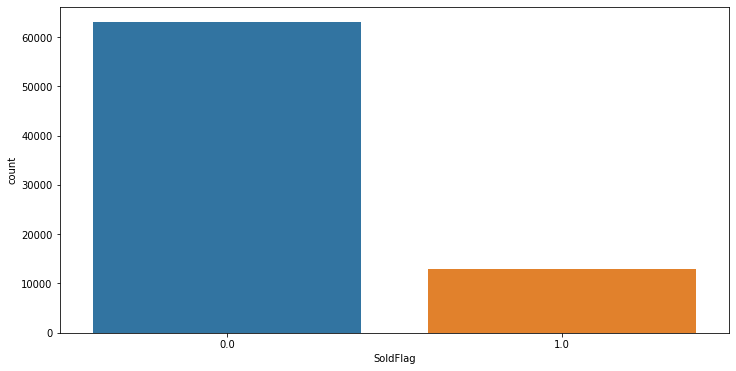

In [ ]:
t.categorical_analysis(df2,'SoldFlag')

There exists a class imbalance for the target variable. 

0.0     63000
1.0      8179
2.0      2545
3.0      1018
4.0       483
5.0       253
6.0       149
7.0       121
8.0        62
9.0        32
10.0       30
12.0       28
11.0       21
14.0       11
13.0       10
16.0        9
15.0        6
18.0        5
19.0        4
22.0        4
17.0        3
26.0        3
27.0        3
24.0        2
21.0        2
36.0        2
33.0        1
28.0        1
51.0        1
25.0        1
30.0        1
20.0        1
34.0        1
69.0        1
35.0        1
73.0        1
40.0        1
Name: SoldCount, dtype: int64


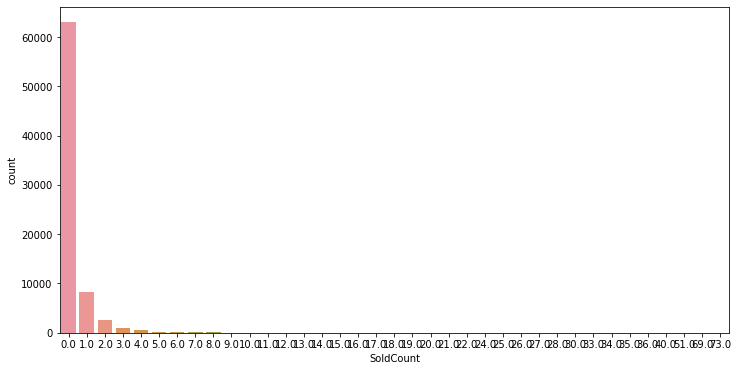

In [ ]:
t.categorical_analysis(df2,'SoldCount')

S    40877
D    35119
Name: MarketingType, dtype: int64


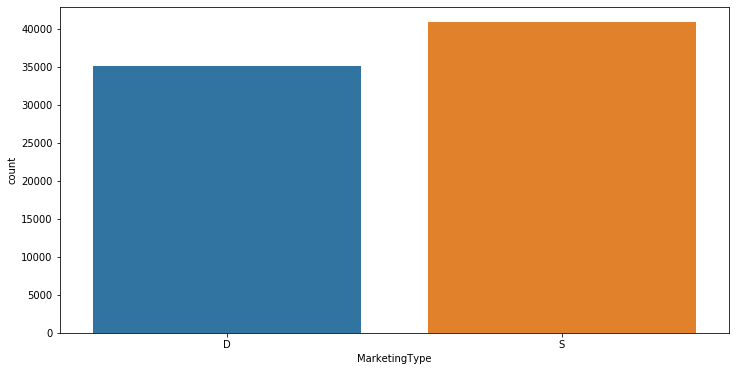

In [ ]:
t.categorical_analysis(df2,'MarketingType')

1    59966
0    16030
Name: New_Release_Flag, dtype: int64


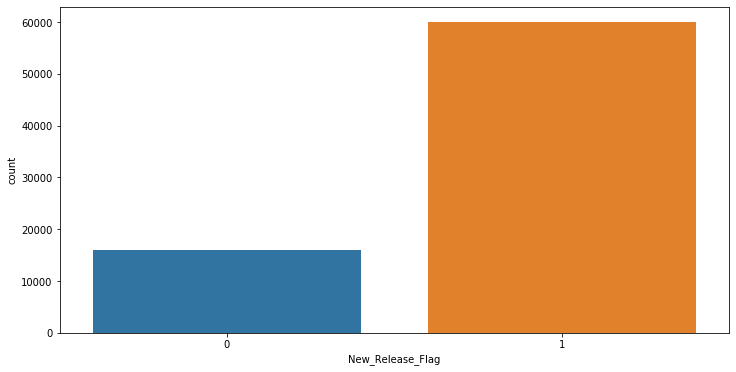

In [ ]:
t.categorical_analysis(df2,'New_Release_Flag')

2010    6269
2008    5931
2009    5903
2007    5807
2011    5601
        ... 
1958       1
1964       1
1935       1
2017       1
1953       1
Name: ReleaseYear, Length: 68, dtype: int64


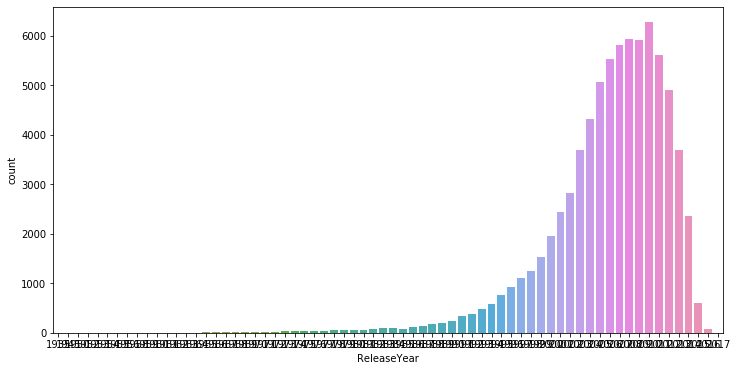

In [ ]:
t.categorical_analysis(df2,'ReleaseYear')

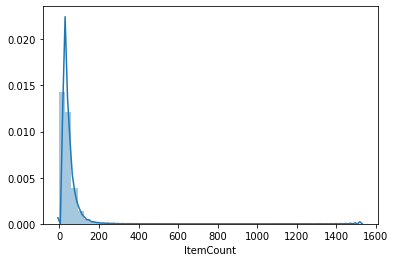

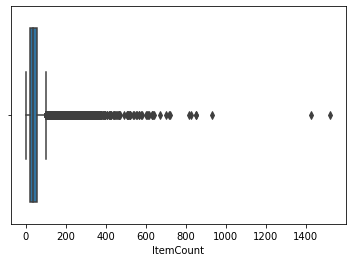

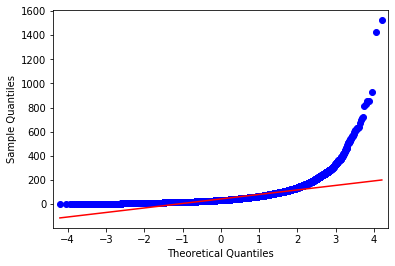

count    75996.000000
mean        43.843637
std         37.362231
min          0.000000
25%         22.000000
50%         34.000000
75%         53.000000
max       1523.000000
Name: ItemCount, dtype: float64

Skew is 5.810544955695266
Kurtosis is 101.52444126008797
Cannot be considered normally distributed on the basis of skewness and kurtosis


Shapiro Wilk Test for Normality
stat=0.665,p=0.000

Not Normally distributed according to shapiro test


Anderson Test for Normality
stat=4907.800
Probably Not Normally distributed 0.576 critical value at 15.0 level of significance
Probably Not Normally distributed 0.656 critical value at 10.0 level of significance
Probably Not Normally distributed 0.787 critical value at 5.0 level of significance
Probably Not Normally distributed 0.918 critical value at 2.5 level of significance
Probably Not Normally distributed 1.092 critical value at 1.0 level of significance


Chi square Normality test
stat=2419602.692,p=0.000

Not Normally distributed according to chisquare test


Lilliefors Test for Normality
stat=0.171,p=0.000

Not Normally distributed according to lilliefors test


Kolmogorov-Smirnov test
stat=0.998,p=0.000

Not normally distributed accordin

E:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\morestats.py:1660: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


In [ ]:
t.numerical_analysis(df2,'ItemCount')

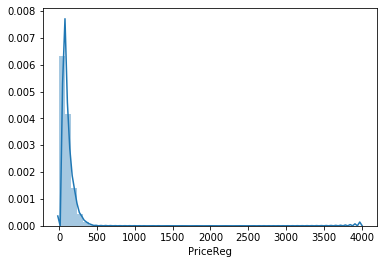

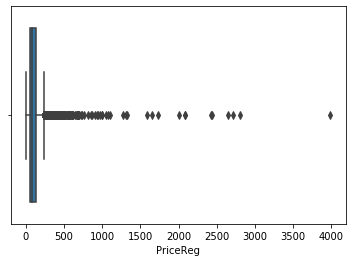

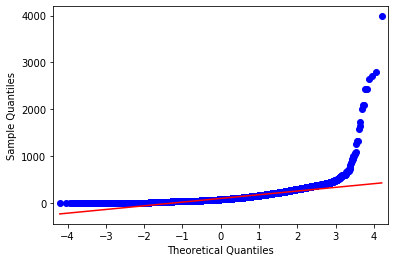

count    75996.000000
mean        98.730594
std         78.712358
min          0.000000
25%         49.950000
50%         78.950000
75%        127.000000
max       3986.310000
Name: PriceReg, dtype: float64

Skew is 6.263113376146574
Kurtosis is 174.92238578978237
Cannot be considered normally distributed on the basis of skewness and kurtosis


Shapiro Wilk Test for Normality
stat=0.761,p=0.000

Not Normally distributed according to shapiro test


Anderson Test for Normality
stat=2956.644
Probably Not Normally distributed 0.576 critical value at 15.0 level of significance
Probably Not Normally distributed 0.656 critical value at 10.0 level of significance
Probably Not Normally distributed 0.787 critical value at 5.0 level of significance
Probably Not Normally distributed 0.918 critical value at 2.5 level of significance
Probably Not Normally distributed 1.092 critical value at 1.0 level of significance


Chi square Normality test
stat=4768909.907,p=0.000

Not Normally distributed according to chisquare test


Lilliefors Test for Normality
stat=0.132,p=0.000

Not Normally distributed according to lilliefors test


Kolmogorov-Smirnov test
stat=0.981,p=0.000

Not normally distributed accordin

E:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\morestats.py:1660: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


In [ ]:
t.numerical_analysis(df2,'PriceReg')

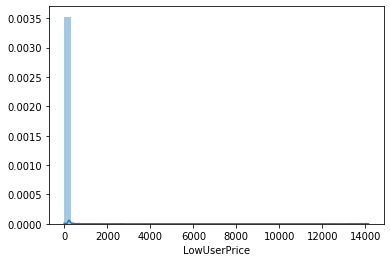

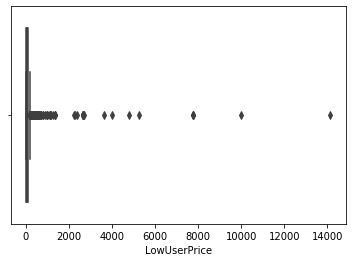

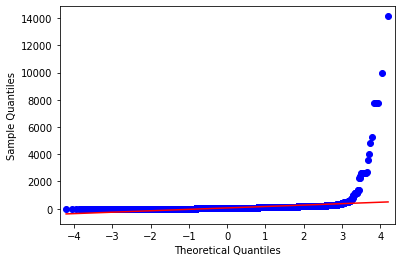

count    75996.000000
mean        56.708431
std        104.758351
min          0.000000
25%         20.490000
50%         44.030000
75%         79.380000
max      14140.210000
Name: LowUserPrice, dtype: float64

Skew is 65.76531505810003
Kurtosis is 6768.6942945541605
Cannot be considered normally distributed on the basis of skewness and kurtosis


Shapiro Wilk Test for Normality
stat=0.239,p=0.000

Not Normally distributed according to shapiro test


Anderson Test for Normality
stat=8795.358
Probably Not Normally distributed 0.576 critical value at 15.0 level of significance
Probably Not Normally distributed 0.656 critical value at 10.0 level of significance
Probably Not Normally distributed 0.787 critical value at 5.0 level of significance
Probably Not Normally distributed 0.918 critical value at 2.5 level of significance
Probably Not Normally distributed 1.092 critical value at 1.0 level of significance


Chi square Normality test
stat=14706681.785,p=0.000

Not Normally distributed according to chisquare test


Lilliefors Test for Normality
stat=0.294,p=0.000

Not Normally distributed according to lilliefors test


Kolmogorov-Smirnov test
stat=0.880,p=0.000

Not normally distributed accordi

E:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\morestats.py:1660: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


In [ ]:
t.numerical_analysis(df2,'LowUserPrice')

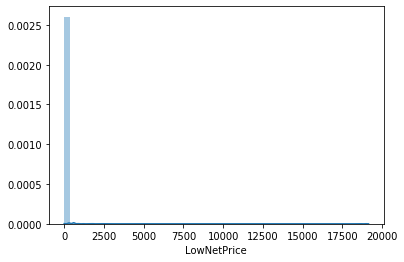

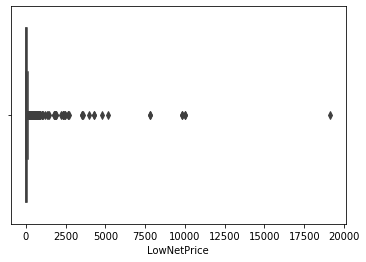

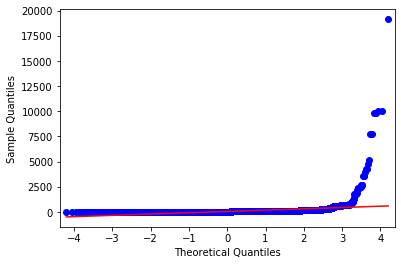

count    75996.000000
mean        47.186160
std        129.814719
min          0.000000
25%         18.740000
50%         36.130000
75%         56.920000
max      19138.790000
Name: LowNetPrice, dtype: float64

Skew is 75.60499259804281
Kurtosis is 8383.488957935244
Cannot be considered normally distributed on the basis of skewness and kurtosis


Shapiro Wilk Test for Normality
stat=0.118,p=0.000

Not Normally distributed according to shapiro test


Anderson Test for Normality
stat=15758.821
Probably Not Normally distributed 0.576 critical value at 15.0 level of significance
Probably Not Normally distributed 0.656 critical value at 10.0 level of significance
Probably Not Normally distributed 0.787 critical value at 5.0 level of significance
Probably Not Normally distributed 0.918 critical value at 2.5 level of significance
Probably Not Normally distributed 1.092 critical value at 1.0 level of significance


Chi square Normality test
stat=27140526.012,p=0.000

Not Normally distributed according to chisquare test


Lilliefors Test for Normality
stat=0.358,p=0.000

Not Normally distributed according to lilliefors test


Kolmogorov-Smirnov test
stat=0.970,p=0.000

Not normally distributed accordi

E:\ProgramData\Anaconda3\lib\site-packages\scipy\stats\morestats.py:1660: UserWarning: p-value may not be accurate for N > 5000.
  warnings.warn("p-value may not be accurate for N > 5000.")


In [ ]:
t.numerical_analysis(df2,'LowNetPrice')

Performing statistical tests to check significance of variables with respect to target variable.

In [ ]:
t.chi_square_test(df2,'MarketingType','New_Release_Flag')

Enter target variableSoldFlag
MarketingType
p value is 0.0
Dependent (reject H0)


New_Release_Flag
p value is 0.05958043546225899
Independent (H0 holds true)




In [ ]:
t.chi_square_test(df2,'ReleaseYear')

Enter target variableSoldFlag
ReleaseYear
p value is 1.9678201619374674e-107
Dependent (reject H0)




Chi square test suggests marketing type and realease year have a significant effect on the target variable whereas new release does not affect the target variable.

In [ ]:
df2.columns

Index(['SoldFlag', 'SoldCount', 'MarketingType', 'ReleaseNumber',
       'New_Release_Flag', 'StrengthFactor', 'PriceReg', 'ReleaseYear',
       'ItemCount', 'LowUserPrice', 'LowNetPrice'],
      dtype='object')

In [ ]:
t.anova(df2,'StrengthFactor','SoldFlag')

,df,sum_sq,mean_sq,F,PR(>F)
SoldFlag,1.0,3.782271e+15,3.782271e+15,1627.858204,0.0
Residual,75994.0,1.765694e+17,2.323465e+12,NaN,NaN


In [ ]:
t.anova(df2,'ItemCount','SoldFlag')

,df,sum_sq,mean_sq,F,PR(>F)
SoldFlag,1.0,5.951595e+06,5.951595e+06,4516.866742,0.0
Residual,75994.0,1.001326e+08,1.317638e+03,NaN,NaN


In [ ]:
t.anova(df2,'LowNetPrice','SoldFlag')

,df,sum_sq,mean_sq,F,PR(>F)
SoldFlag,1.0,2.415657e+05,241565.743624,14.337178,0.000153
Residual,75994.0,1.280416e+09,16848.904372,NaN,NaN


In [ ]:
t.anova(df2,'LowUserPrice','SoldFlag')

,df,sum_sq,mean_sq,F,PR(>F)
SoldFlag,1.0,2.856615e+06,2.856615e+06,261.191391,1.182531e-58
Residual,75994.0,8.311362e+08,1.093687e+04,NaN,NaN


In [ ]:
t.anova(df2,'PriceReg','SoldFlag')

,df,sum_sq,mean_sq,F,PR(>F)
SoldFlag,1.0,3.339067e+06,3.339067e+06,542.780834,1.232923e-119
Residual,75994.0,4.674982e+08,6.151778e+03,NaN,NaN


All the above numerical columns have a significant relationship with target variable.

## Clustering 

In [ ]:
df3=t.deep_copy(df2)

In [ ]:
df3

,SoldFlag,SoldCount,MarketingType,ReleaseNumber,New_Release_Flag,StrengthFactor,PriceReg,ReleaseYear,ItemCount,LowUserPrice,LowNetPrice
0,0.0,0.0,D,15,1,682743.0,44.99,2015,8,28.97,31.84
1,0.0,0.0,D,7,1,1016014.0,24.81,2005,39,0.00,15.54
2,0.0,0.0,D,0,0,340464.0,46.00,2013,34,30.19,27.97
3,1.0,1.0,D,4,1,334011.0,100.00,2006,20,133.93,83.15
4,1.0,1.0,D,2,1,1287938.0,121.95,2010,28,4.00,23.99
...,...,...,...,...,...,...,...,...,...,...,...
75991,0.0,0.0,S,2,1,119056.0,64.99,2008,34,32.49,53.00
75992,0.0,0.0,S,6,1,1115312.0,21.50,2004,53,47.99,21.97
75993,0.0,0.0,S,7,1,1315446.0,142.75,2006,19,47.99,53.99
75994,0.0,0.0,S,2,1,877788.0,50.00,2012,21,27.07,32.62


In [ ]:
df3['MarketingType'].loc[df3['MarketingType']=='D']=0
df3['MarketingType'].loc[df3['MarketingType']=='S']=1

E:\ProgramData\Anaconda3\lib\site-packages\pandas\core\indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)


In [ ]:
df3

,SoldFlag,SoldCount,MarketingType,ReleaseNumber,New_Release_Flag,StrengthFactor,PriceReg,ReleaseYear,ItemCount,LowUserPrice,LowNetPrice
0,0.0,0.0,0,15,1,682743.0,44.99,2015,8,28.97,31.84
1,0.0,0.0,0,7,1,1016014.0,24.81,2005,39,0.00,15.54
2,0.0,0.0,0,0,0,340464.0,46.00,2013,34,30.19,27.97
3,1.0,1.0,0,4,1,334011.0,100.00,2006,20,133.93,83.15
4,1.0,1.0,0,2,1,1287938.0,121.95,2010,28,4.00,23.99
...,...,...,...,...,...,...,...,...,...,...,...
75991,0.0,0.0,1,2,1,119056.0,64.99,2008,34,32.49,53.00
75992,0.0,0.0,1,6,1,1115312.0,21.50,2004,53,47.99,21.97
75993,0.0,0.0,1,7,1,1315446.0,142.75,2006,19,47.99,53.99
75994,0.0,0.0,1,2,1,877788.0,50.00,2012,21,27.07,32.62


In [ ]:
df3.columns

Index(['SoldFlag', 'SoldCount', 'MarketingType', 'ReleaseNumber',
       'New_Release_Flag', 'StrengthFactor', 'PriceReg', 'ReleaseYear',
       'ItemCount', 'LowUserPrice', 'LowNetPrice'],
      dtype='object')

In [ ]:
from sklearn.preprocessing import MinMaxScaler
ss=MinMaxScaler()
ss=ss.fit(df3)
df3=ss.transform(df3)

In [ ]:
df3=pd.DataFrame(df3,columns=['SoldFlag', 'SoldCount', 'MarketingType', 'ReleaseNumber',
       'New_Release_Flag', 'StrengthFactor', 'PriceReg', 'ReleaseYear',
       'ItemCount', 'LowUserPrice', 'LowNetPrice'])

In [ ]:
df3

,SoldFlag,SoldCount,MarketingType,ReleaseNumber,New_Release_Flag,StrengthFactor,PriceReg,ReleaseYear,ItemCount,LowUserPrice,LowNetPrice
0,0.0,0.000000,0.0,0.151515,1.0,0.040953,0.011286,0.975610,0.005253,0.002049,0.001664
1,0.0,0.000000,0.0,0.070707,1.0,0.060946,0.006224,0.853659,0.025607,0.000000,0.000812
2,0.0,0.000000,0.0,0.000000,0.0,0.020420,0.011539,0.951220,0.022324,0.002135,0.001461
3,1.0,0.013699,0.0,0.040404,1.0,0.020033,0.025086,0.865854,0.013132,0.009472,0.004345
4,1.0,0.013699,0.0,0.020202,1.0,0.077259,0.030592,0.914634,0.018385,0.000283,0.001253
...,...,...,...,...,...,...,...,...,...,...,...
75991,0.0,0.000000,1.0,0.020202,1.0,0.007138,0.016303,0.890244,0.022324,0.002298,0.002769
75992,0.0,0.000000,1.0,0.060606,1.0,0.066903,0.005393,0.841463,0.034800,0.003394,0.001148
75993,0.0,0.000000,1.0,0.070707,1.0,0.078909,0.035810,0.865854,0.012475,0.003394,0.002821
75994,0.0,0.000000,1.0,0.020202,1.0,0.052654,0.012543,0.939024,0.013789,0.001914,0.001704


### Kmeans

E:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\deprecation.py:143: FutureWarning: The sklearn.metrics.classification module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.metrics. Anything that cannot be imported from sklearn.metrics is now part of the private API.
  warnings.warn(message, FutureWarning)


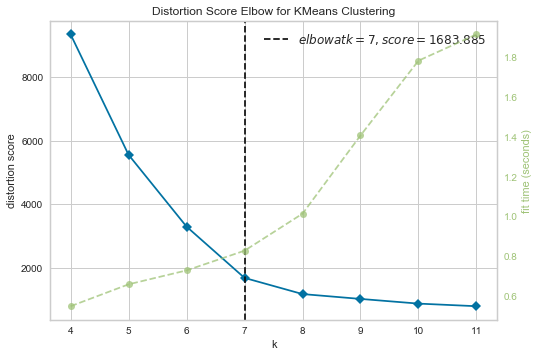

In [ ]:
t.elbow_plot_kmeans(df3,yellow=True) 

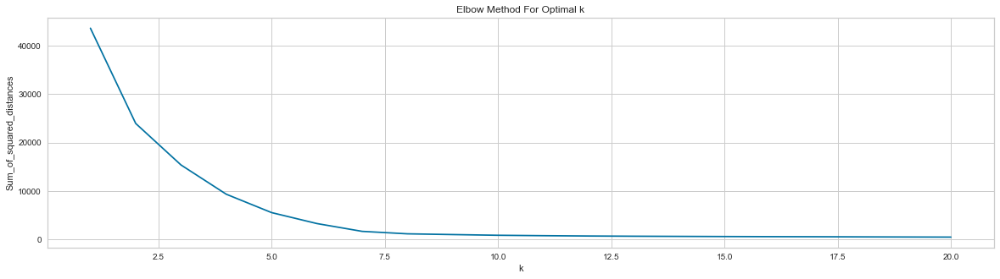

In [ ]:
t.elbow_plot_kmeans(df3,yellow=False) 

Both elbow plots confirm that the optimal number of clusters for kmeans is 7.

In [ ]:
model,kmeans_labels=t.kmeans(7,df3)

Calculating SI score.

In [ ]:
t.SI_score(df3,kmeans_labels)

Silhouette score: 0.8477746859780971


Visualizing clusters.

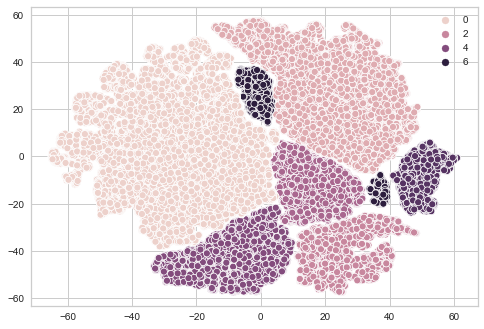

In [ ]:
t.cluster_viz(df3,kmeans_labels)

### Dbscan

In [ ]:
db,dblabels=t.dbscan(df3,eps=0.5,min_samples=7)

Dbscan and Hierarchical clustering algorithms failed due to insufficient memory.

### Mean Shift

In [ ]:
ms,mslabels=t.meanshift(df3,quantile=0.3)

In [ ]:
t.SI_score(df3,mslabels)

Silhouette score: 0.859234952780604


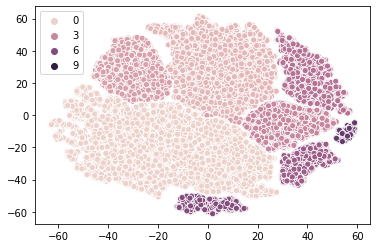

In [ ]:
t.cluster_viz(df3,mslabels)

### Affinity Propagation

In [ ]:
af,aflabels=t.ap(df3)

MemoryError: Unable to allocate 43.0 GiB for an array with shape (75996, 75996) and data type float64

Affinity propagation failed due to insufficent memory resources.

### GMM

In [ ]:
gmm,gmmlabels=t.gmm(df3,7)

In [ ]:
t.SI_score(df3,gmmlabels)

Silhouette score: 0.8465116134112425


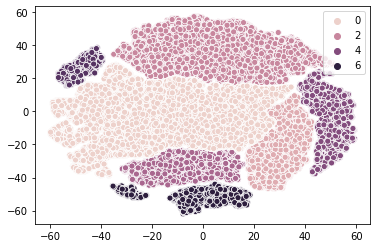

In [ ]:
t.cluster_viz(df3,gmmlabels)

Clustering algorithms have produced more or less similar results. Mean shift algorithm has a slight edge above the rest as it has identified potential outliers and has highest SI score.

Selecting important features and visualizing clusters

In [ ]:
df4=ss.inverse_transform(df3)

In [ ]:
df4=pd.DataFrame(df4,columns=['SoldFlag', 'SoldCount', 'MarketingType', 'ReleaseNumber',
       'New_Release_Flag', 'StrengthFactor', 'PriceReg', 'ReleaseYear',
       'ItemCount', 'LowUserPrice', 'LowNetPrice'])

In [ ]:
df4

,SoldFlag,SoldCount,MarketingType,ReleaseNumber,New_Release_Flag,StrengthFactor,PriceReg,ReleaseYear,ItemCount,LowUserPrice,LowNetPrice
0,0.0,0.0,0.0,15.0,1.0,682743.0,44.99,2015.0,8.0,28.97,31.84
1,0.0,0.0,0.0,7.0,1.0,1016014.0,24.81,2005.0,39.0,0.00,15.54
2,0.0,0.0,0.0,0.0,0.0,340464.0,46.00,2013.0,34.0,30.19,27.97
3,1.0,1.0,0.0,4.0,1.0,334011.0,100.00,2006.0,20.0,133.93,83.15
4,1.0,1.0,0.0,2.0,1.0,1287938.0,121.95,2010.0,28.0,4.00,23.99
...,...,...,...,...,...,...,...,...,...,...,...
75991,0.0,0.0,1.0,2.0,1.0,119056.0,64.99,2008.0,34.0,32.49,53.00
75992,0.0,0.0,1.0,6.0,1.0,1115312.0,21.50,2004.0,53.0,47.99,21.97
75993,0.0,0.0,1.0,7.0,1.0,1315446.0,142.75,2006.0,19.0,47.99,53.99
75994,0.0,0.0,1.0,2.0,1.0,877788.0,50.00,2012.0,21.0,27.07,32.62


In [ ]:
catdf=df4[['SoldFlag','ReleaseYear','LowUserPrice']]

In [ ]:
catdf_hac = catdf.assign(Cluster=mslabels)
grouped_hac = catdf_hac.groupby(['Cluster']).mean().round(1)
grouped_hac

,SoldFlag,ReleaseYear,LowUserPrice
Cluster,,,
0,0.0,2006.6,46.4
1,0.0,2005.8,73.3
2,0.0,2002.5,55.7
3,1.0,2007.4,84.3
4,0.0,2005.4,30.4
5,1.0,2007.6,52.0
6,1.0,2004.5,62.5
7,1.0,2006.1,29.1
8,1.0,1994.0,10.5


 Mean Shift


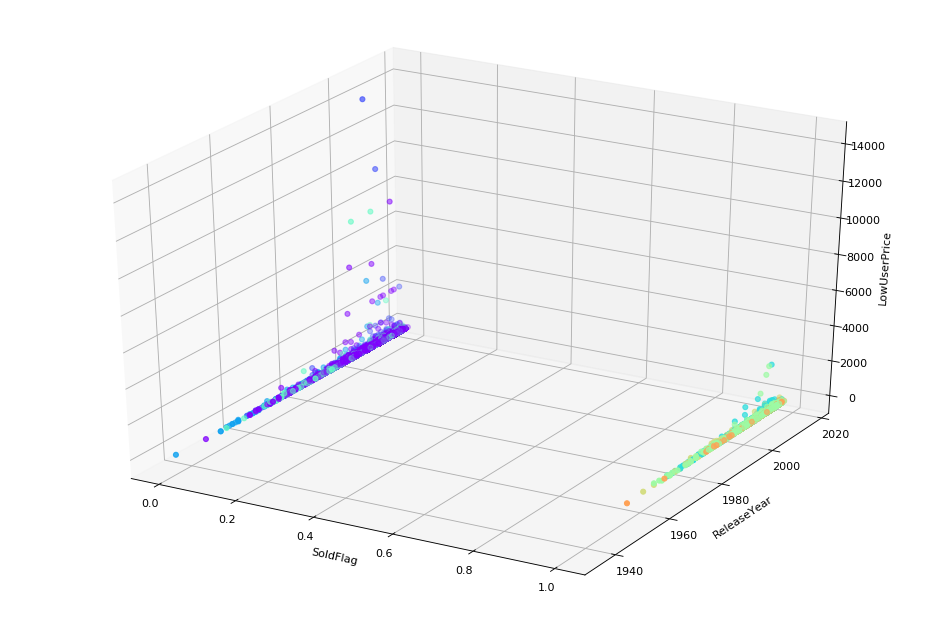

In [ ]:
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(num=None, figsize=(15, 10), dpi=80, facecolor='w', edgecolor='k')
ax = plt.axes(projection="3d")

ax.scatter3D(catdf['SoldFlag'],catdf['ReleaseYear'],catdf['LowUserPrice'],c=mslabels, cmap='rainbow')

xLabel = ax.set_xlabel('SoldFlag', linespacing=3.2)
yLabel = ax.set_ylabel('ReleaseYear', linespacing=3.1)
zLabel = ax.set_zlabel('LowUserPrice', linespacing=3.4)
print(" Mean Shift") 

In [ ]:
catdf1=df4[['SoldFlag','PriceReg','ItemCount']]
catdf1_hac = catdf1.assign(Cluster=mslabels)
grouped_hac1 = catdf1_hac.groupby(['Cluster']).mean().round(1)
grouped_hac1

,SoldFlag,PriceReg,ItemCount
Cluster,,,
0,0.0,91.6,37.3
1,0.0,111.8,47.1
2,0.0,88.0,30.6
3,1.0,125.4,73.6
4,0.0,76.6,42.0
5,1.0,104.9,49.5
6,1.0,90.1,49.4
7,1.0,92.9,57.9
8,1.0,12.0,1523.0


 Mean Shift


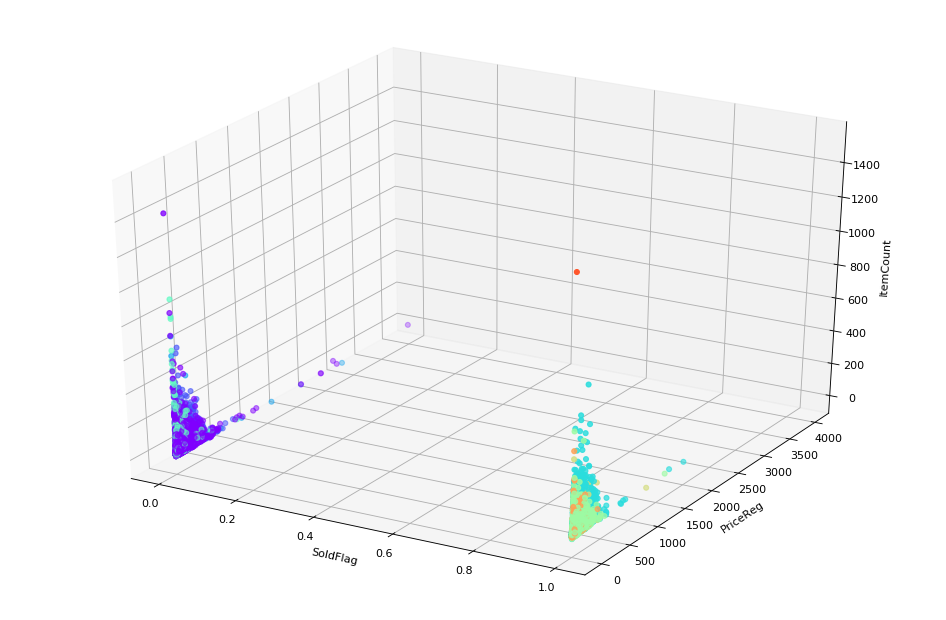

In [ ]:
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(num=None, figsize=(15, 10), dpi=80, facecolor='w', edgecolor='k')
ax = plt.axes(projection="3d")

ax.scatter3D(catdf1['SoldFlag'],catdf1['PriceReg'],catdf1['ItemCount'],c=mslabels, cmap='rainbow')

xLabel = ax.set_xlabel('SoldFlag', linespacing=3.2)
yLabel = ax.set_ylabel('PriceReg', linespacing=3.1)
zLabel = ax.set_zlabel('ItemCount', linespacing=3.4)
print(" Mean Shift") 

Nothing conclusive can be said about the difference in features with respect to the target variable.

## MACHINE LEARNING

In [ ]:
df4=t.deep_copy(df2)

In [ ]:
df4

,SoldFlag,SoldCount,MarketingType,ReleaseNumber,New_Release_Flag,StrengthFactor,PriceReg,ReleaseYear,ItemCount,LowUserPrice,LowNetPrice
0,0.0,0.0,D,15,1,682743.0,44.99,2015,8,28.97,31.84
1,0.0,0.0,D,7,1,1016014.0,24.81,2005,39,0.00,15.54
2,0.0,0.0,D,0,0,340464.0,46.00,2013,34,30.19,27.97
3,1.0,1.0,D,4,1,334011.0,100.00,2006,20,133.93,83.15
4,1.0,1.0,D,2,1,1287938.0,121.95,2010,28,4.00,23.99
...,...,...,...,...,...,...,...,...,...,...,...
75991,0.0,0.0,S,2,1,119056.0,64.99,2008,34,32.49,53.00
75992,0.0,0.0,S,6,1,1115312.0,21.50,2004,53,47.99,21.97
75993,0.0,0.0,S,7,1,1315446.0,142.75,2006,19,47.99,53.99
75994,0.0,0.0,S,2,1,877788.0,50.00,2012,21,27.07,32.62


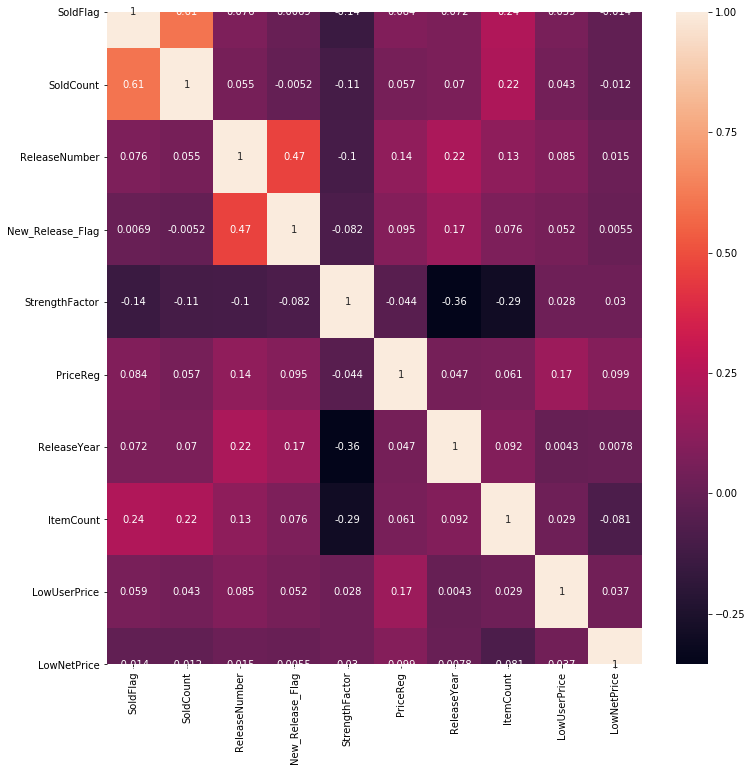

In [ ]:
t.corr_heatmap(df4)

In [ ]:
df4.corr()

,SoldFlag,SoldCount,ReleaseNumber,New_Release_Flag,StrengthFactor,PriceReg,ReleaseYear,ItemCount,LowUserPrice,LowNetPrice
SoldFlag,1.000000,0.607248,0.075940,0.006877,-0.144816,0.084213,0.071994,0.236860,0.058525,-0.013734
SoldCount,0.607248,1.000000,0.055435,-0.005201,-0.109237,0.056702,0.070090,0.224002,0.042608,-0.011965
ReleaseNumber,0.075940,0.055435,1.000000,0.465882,-0.101569,0.136153,0.220363,0.126416,0.085282,0.015092
New_Release_Flag,0.006877,-0.005201,0.465882,1.000000,-0.082150,0.095029,0.167505,0.075784,0.052381,0.005525
StrengthFactor,-0.144816,-0.109237,-0.101569,-0.082150,1.000000,-0.043543,-0.355762,-0.293981,0.027959,0.030402
PriceReg,0.084213,0.056702,0.136153,0.095029,-0.043543,1.000000,0.047376,0.061155,0.171063,0.098846
ReleaseYear,0.071994,0.070090,0.220363,0.167505,-0.355762,0.047376,1.000000,0.092392,0.004307,0.007832
ItemCount,0.236860,0.224002,0.126416,0.075784,-0.293981,0.061155,0.092392,1.000000,0.028667,-0.081048
LowUserPrice,0.058525,0.042608,0.085282,0.052381,0.027959,0.171063,0.004307,0.028667,1.000000,0.036565
LowNetPrice,-0.013734,-0.011965,0.015092,0.005525,0.030402,0.098846,0.007832,-0.081048,0.036565,1.000000


There are no highly correlated features in the dataset.

Sold Count cannot be considered in this analysis as its role comes after sold flag. Since our role is to predict sold flag, count will be removed from the dataframe.

In [ ]:
t.remove_cols(df4,'SoldCount')

In [ ]:
df4

,SoldFlag,MarketingType,ReleaseNumber,New_Release_Flag,StrengthFactor,PriceReg,ReleaseYear,ItemCount,LowUserPrice,LowNetPrice
0,0.0,D,15,1,682743.0,44.99,2015,8,28.97,31.84
1,0.0,D,7,1,1016014.0,24.81,2005,39,0.00,15.54
2,0.0,D,0,0,340464.0,46.00,2013,34,30.19,27.97
3,1.0,D,4,1,334011.0,100.00,2006,20,133.93,83.15
4,1.0,D,2,1,1287938.0,121.95,2010,28,4.00,23.99
...,...,...,...,...,...,...,...,...,...,...
75991,0.0,S,2,1,119056.0,64.99,2008,34,32.49,53.00
75992,0.0,S,6,1,1115312.0,21.50,2004,53,47.99,21.97
75993,0.0,S,7,1,1315446.0,142.75,2006,19,47.99,53.99
75994,0.0,S,2,1,877788.0,50.00,2012,21,27.07,32.62


In [ ]:
df4['MarketingType'].loc[df4['MarketingType']=='D']=0
df4['MarketingType'].loc[df4['MarketingType']=='S']=1

E:\ProgramData\Anaconda3\lib\site-packages\pandas\core\indexing.py:205: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_with_indexer(indexer, value)


In [ ]:
df4

,SoldFlag,MarketingType,ReleaseNumber,New_Release_Flag,StrengthFactor,PriceReg,ReleaseYear,ItemCount,LowUserPrice,LowNetPrice
0,0.0,0,15,1,682743.0,44.99,2015,8,28.97,31.84
1,0.0,0,7,1,1016014.0,24.81,2005,39,0.00,15.54
2,0.0,0,0,0,340464.0,46.00,2013,34,30.19,27.97
3,1.0,0,4,1,334011.0,100.00,2006,20,133.93,83.15
4,1.0,0,2,1,1287938.0,121.95,2010,28,4.00,23.99
...,...,...,...,...,...,...,...,...,...,...
75991,0.0,1,2,1,119056.0,64.99,2008,34,32.49,53.00
75992,0.0,1,6,1,1115312.0,21.50,2004,53,47.99,21.97
75993,0.0,1,7,1,1315446.0,142.75,2006,19,47.99,53.99
75994,0.0,1,2,1,877788.0,50.00,2012,21,27.07,32.62


Obtaining list of important features using random forest feature selector.

In [ ]:
x=df4.drop(['SoldFlag'], axis=1)
y=df4['SoldFlag']

In [ ]:
from sklearn.preprocessing import StandardScaler
ss=StandardScaler()
for i in x.columns:
    x[i] = ss.fit_transform(x[[i]])

In [ ]:
from sklearn.model_selection import train_test_split
xtrain , xtest , ytrain, ytest =train_test_split(x,y,test_size=0.20,random_state=42 )

In [ ]:
def RFfeatureimportance(df, xtrain, xtest, ytrain, ytest, trees=35, random=None, regression=False):
    import pandas as pd
    import numpy as np
    import matplotlib.pyplot as plt
    import seaborn as sns
    from sklearn.ensemble import RandomForestClassifier
    from sklearn.ensemble import RandomForestRegressor
    if regression:
        clf  = RandomForestRegressor(n_estimators=trees, random_state=random)
    else:
        clf  = RandomForestClassifier(n_estimators=trees, random_state=random)
    clf.fit(xtrain,ytrain)
    #validationmetrics(clf,testX,testY)
    res = pd.Series(clf.feature_importances_, index=xtrain.columns.values).sort_values(ascending=False)*100
    print(res)
    return res

In [ ]:
RFfeatureimportance(df4, xtrain, xtest, ytrain, ytest, trees=35, random=None, regression=False)

StrengthFactor      18.273436
ItemCount           15.839496
LowUserPrice        15.016562
PriceReg            14.988697
LowNetPrice         14.777892
ReleaseYear          8.729817
ReleaseNumber        7.168264
MarketingType        4.428745
New_Release_Flag     0.777092
dtype: float64


StrengthFactor      18.273436
ItemCount           15.839496
LowUserPrice        15.016562
PriceReg            14.988697
LowNetPrice         14.777892
ReleaseYear          8.729817
ReleaseNumber        7.168264
MarketingType        4.428745
New_Release_Flag     0.777092
dtype: float64

Random forest feature selector confirms the results of chi-square test with respect to the feature New_Release_Flag. This will be removed from analysis.

In [ ]:
t.remove_cols(df4,'New_Release_Flag')

Since there exists a class imbalance in the target variable, f1 score and recall score will be used to judge performance.

### ML Algorithms without Cross Validation

E:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\deprecation.py:143: FutureWarning: The sklearn.metrics.classification module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.metrics. Anything that cannot be imported from sklearn.metrics is now part of the private API.
  warnings.warn(message, FutureWarning)


---------Logistic Regression------------
Accuracy  (%): 
 83.07236842105263
Precision: 
 62.874251497005986
Recall (%): 
 7.897705904475366
f1 score (%): 
 14.0327430671567
logistic loss :
 5.846603343038588
              precision    recall  f1-score   support

         0.0       0.84      0.99      0.91     12541
         1.0       0.63      0.08      0.14      2659

    accuracy                           0.83     15200
   macro avg       0.73      0.53      0.52     15200
weighted avg       0.80      0.83      0.77     15200

AUC  (%): 
 74.76127568217838
Best Threshold=0.151633, G-Mean=0.687


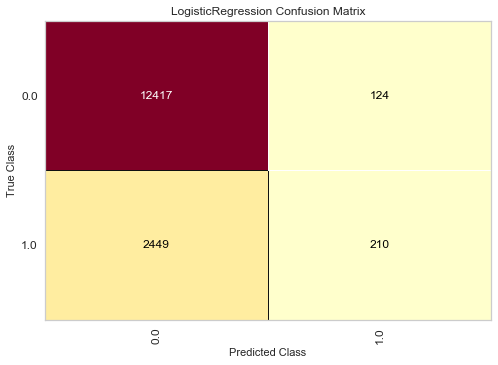

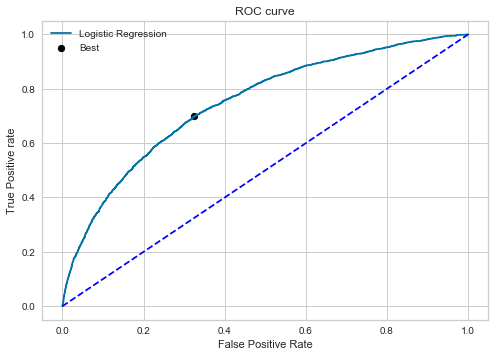

---------Nearest Neighbors------------
Accuracy  (%): 
 81.3157894736842
Precision: 
 42.76578737010392
Recall (%): 
 20.120345994734862
f1 score (%): 
 27.365728900255753
logistic loss :
 6.453335360085945
              precision    recall  f1-score   support

         0.0       0.85      0.94      0.89     12541
         1.0       0.43      0.20      0.27      2659

    accuracy                           0.81     15200
   macro avg       0.64      0.57      0.58     15200
weighted avg       0.77      0.81      0.78     15200

AUC  (%): 
 66.60750706842893
Best Threshold=0.200000, G-Mean=0.620


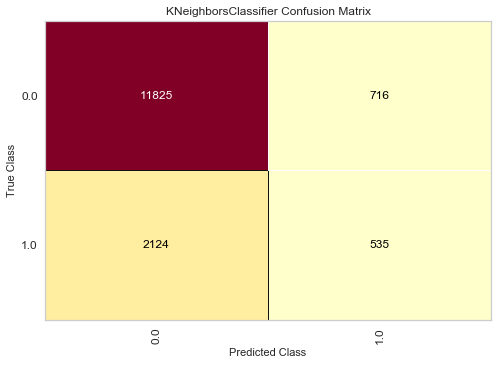

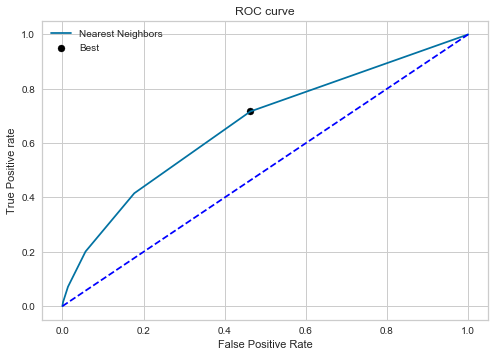

---------Decision Tree------------
Accuracy  (%): 
 74.5592105263158
Precision: 
 28.320172290021535
Recall (%): 
 29.67280932681459
f1 score (%): 
 28.98071625344352
logistic loss :
 8.787042441788666
              precision    recall  f1-score   support

         0.0       0.85      0.84      0.85     12541
         1.0       0.28      0.30      0.29      2659

    accuracy                           0.75     15200
   macro avg       0.57      0.57      0.57     15200
weighted avg       0.75      0.75      0.75     15200

AUC  (%): 
 56.874519646263536
Best Threshold=1.000000, G-Mean=0.499


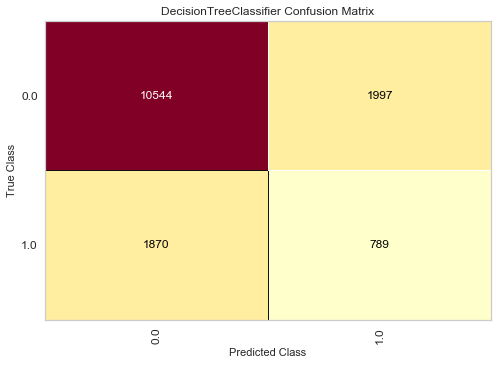

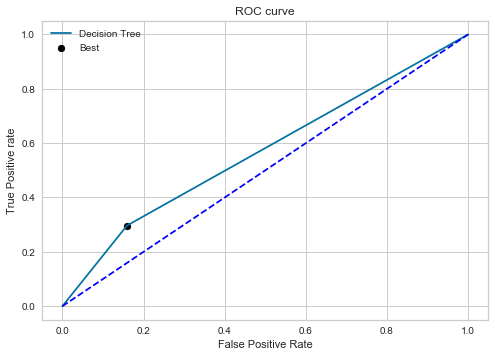

---------Naive Bayes------------
Accuracy  (%): 
 72.34210526315789
Precision: 
 33.43341196654514
Recall (%): 
 58.63106430989093
f1 score (%): 
 42.58399344441409
logistic loss :
 9.552861704909725
              precision    recall  f1-score   support

         0.0       0.90      0.75      0.82     12541
         1.0       0.33      0.59      0.43      2659

    accuracy                           0.72     15200
   macro avg       0.61      0.67      0.62     15200
weighted avg       0.80      0.72      0.75     15200

AUC  (%): 
 72.18068098802158
Best Threshold=0.378140, G-Mean=0.681


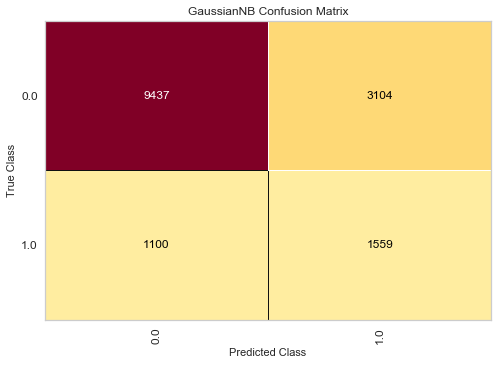

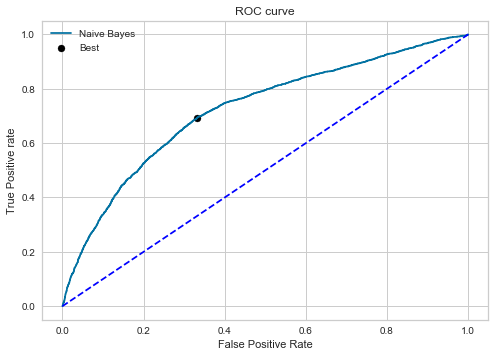

---------Random Forest------------
Accuracy  (%): 
 83.21052631578948
Precision: 
 57.72005772005772
Recall (%): 
 15.043249341857843
f1 score (%): 
 23.86634844868735
logistic loss :
 5.798894186964415
              precision    recall  f1-score   support

         0.0       0.84      0.98      0.91     12541
         1.0       0.58      0.15      0.24      2659

    accuracy                           0.83     15200
   macro avg       0.71      0.56      0.57     15200
weighted avg       0.80      0.83      0.79     15200

AUC  (%): 
 74.76617424445412
Best Threshold=0.180000, G-Mean=0.689


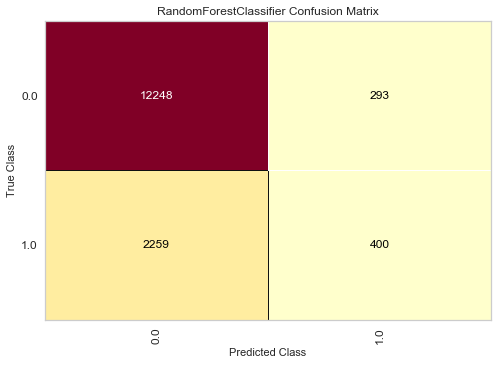

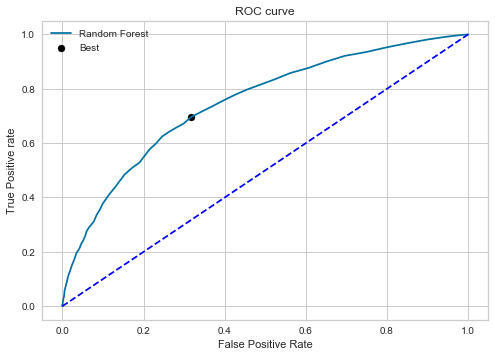

---------xgboost------------
Accuracy  (%): 
 83.15789473684211
Precision: 
 56.9620253164557
Recall (%): 
 15.231289958631065
f1 score (%): 
 24.03560830860534
logistic loss :
 5.8170731741963815
              precision    recall  f1-score   support

         0.0       0.84      0.98      0.91     12541
         1.0       0.57      0.15      0.24      2659

    accuracy                           0.83     15200
   macro avg       0.71      0.56      0.57     15200
weighted avg       0.80      0.83      0.79     15200

AUC  (%): 
 75.5378499926784
Best Threshold=0.142106, G-Mean=0.694


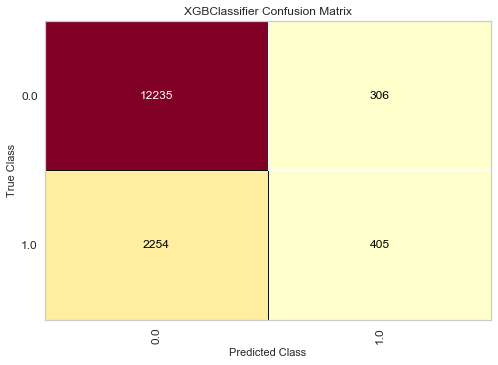

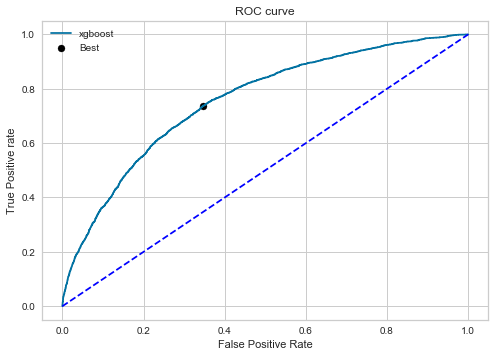

---------Ada Boost------------
Accuracy  (%): 
 83.44736842105263
Precision: 
 62.391681109185434
Recall (%): 
 13.538924407672056
f1 score (%): 
 22.24969097651421
logistic loss :
 5.717087823831424
              precision    recall  f1-score   support

         0.0       0.84      0.98      0.91     12541
         1.0       0.62      0.14      0.22      2659

    accuracy                           0.83     15200
   macro avg       0.73      0.56      0.56     15200
weighted avg       0.80      0.83      0.79     15200

AUC  (%): 
 75.2887400331051
Best Threshold=0.492115, G-Mean=0.689


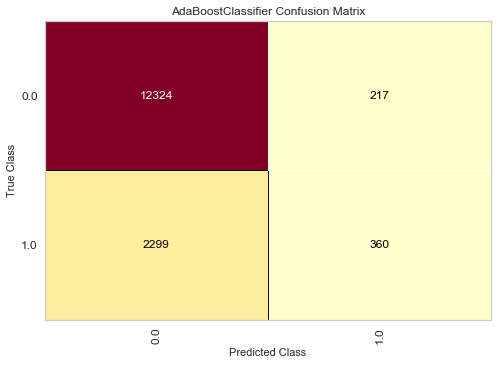

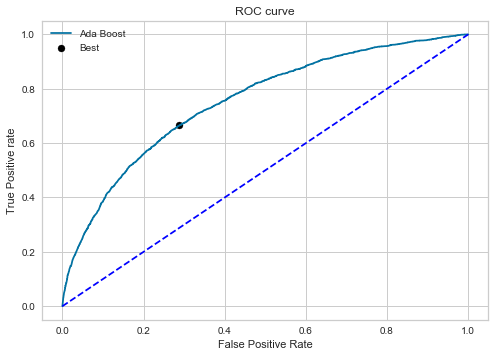

---------SVM------------
Accuracy  (%): 
 82.8157894736842
Precision: 
 61.92893401015228
Recall (%): 
 4.588191049266642
f1 score (%): 
 8.543417366946777
logistic loss :
 5.935219994296971
              precision    recall  f1-score   support

         0.0       0.83      0.99      0.91     12541
         1.0       0.62      0.05      0.09      2659

    accuracy                           0.83     15200
   macro avg       0.73      0.52      0.50     15200
weighted avg       0.79      0.83      0.76     15200

AUC  (%): 
 51.99507630766498


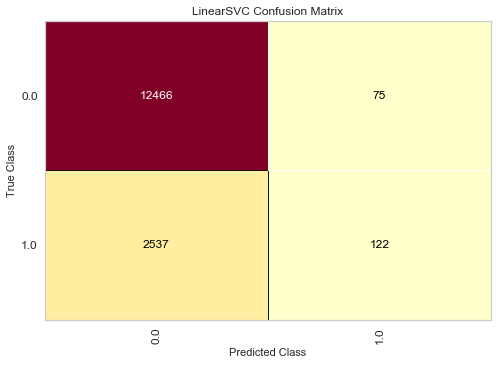

---------MLP Classifier------------
Accuracy  (%): 
 83.03947368421053
Precision: 
 55.98227474150664
Recall (%): 
 14.253478751410304
f1 score (%): 
 22.72182254196642
logistic loss :
 5.857973935928548
              precision    recall  f1-score   support

         0.0       0.84      0.98      0.90     12541
         1.0       0.56      0.14      0.23      2659

    accuracy                           0.83     15200
   macro avg       0.70      0.56      0.57     15200
weighted avg       0.79      0.83      0.79     15200

AUC  (%): 
 75.54173195708972
Best Threshold=0.158075, G-Mean=0.691


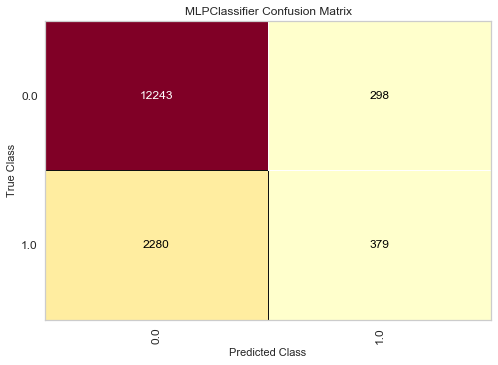

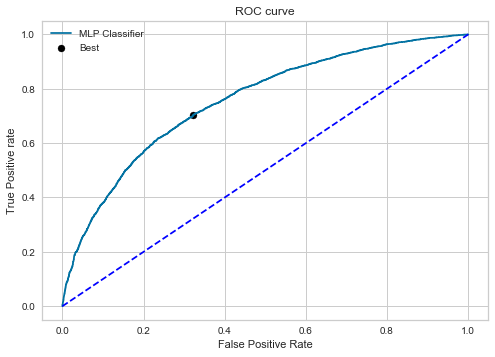

---------light Gradient Boosting------------
Accuracy  (%): 
 83.46710526315789
Precision: 
 62.12624584717608
Recall (%): 
 14.065438134637082
f1 score (%): 
 22.9377491567004
logistic loss :
 5.710271538725305
              precision    recall  f1-score   support

         0.0       0.84      0.98      0.91     12541
         1.0       0.62      0.14      0.23      2659

    accuracy                           0.83     15200
   macro avg       0.73      0.56      0.57     15200
weighted avg       0.80      0.83      0.79     15200

AUC  (%): 
 76.22138460689105
Best Threshold=0.154675, G-Mean=0.695


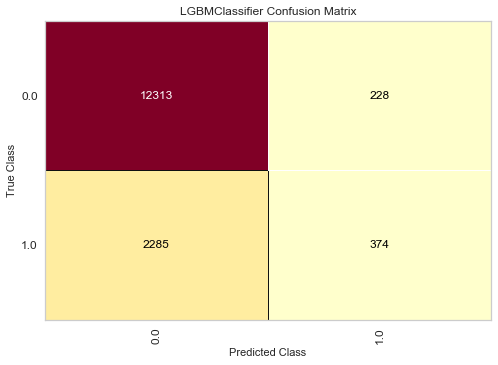

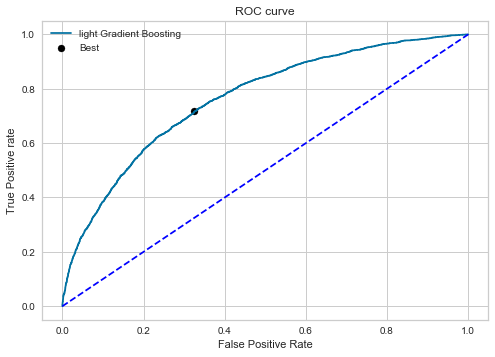

---------Gradient Boosting Classifier------------
Accuracy  (%): 
 83.44736842105263
Precision: 
 63.5673624288425
Recall (%): 
 12.598721323805941
f1 score (%): 
 21.02950408035154
logistic loss :
 5.71708650870407
              precision    recall  f1-score   support

         0.0       0.84      0.98      0.91     12541
         1.0       0.64      0.13      0.21      2659

    accuracy                           0.83     15200
   macro avg       0.74      0.56      0.56     15200
weighted avg       0.81      0.83      0.79     15200

AUC  (%): 
 76.06478955119724
Best Threshold=0.154788, G-Mean=0.694


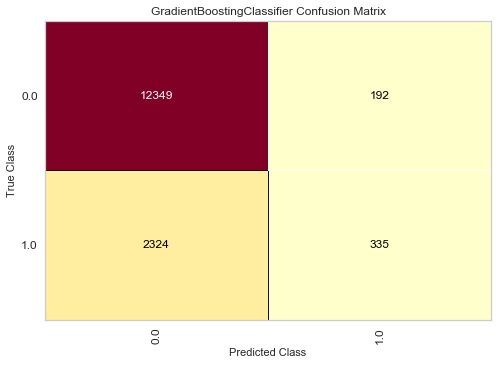

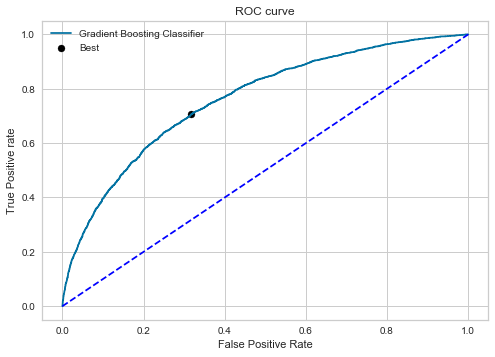

,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,62.874251,7.897706,0.747613,83.072368
1,Nearest Neighbors,42.765787,20.120346,0.666075,81.315789
2,Decision Tree,28.320172,29.672809,0.568745,74.559211
3,Naive Bayes,33.433412,58.631064,0.721807,72.342105
4,Random Forest,57.720058,15.043249,0.747662,83.210526
5,xgboost,56.962025,15.231290,0.755378,83.157895
6,Ada Boost,62.391681,13.538924,0.752887,83.447368
7,SVM,61.928934,4.588191,51.995076,82.815789
8,MLP Classifier,55.982275,14.253479,0.755417,83.039474
9,light Gradient Boosting,62.126246,14.065438,0.762214,83.467105


,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,62.874251,7.897706,0.747613,83.072368
1,Nearest Neighbors,42.765787,20.120346,0.666075,81.315789
2,Decision Tree,28.320172,29.672809,0.568745,74.559211
3,Naive Bayes,33.433412,58.631064,0.721807,72.342105
4,Random Forest,57.720058,15.043249,0.747662,83.210526
5,xgboost,56.962025,15.231290,0.755378,83.157895
6,Ada Boost,62.391681,13.538924,0.752887,83.447368
7,SVM,61.928934,4.588191,51.995076,82.815789
8,MLP Classifier,55.982275,14.253479,0.755417,83.039474
9,light Gradient Boosting,62.126246,14.065438,0.762214,83.467105


In [ ]:
t.fit_model(df4,'SoldFlag',classification=True,min_max=False,svm_type = "Linear")

### ML Algorithms with Random Forest Feature selection

StrengthFactor    18.027049
ItemCount         16.138239
LowUserPrice      15.242400
PriceReg          14.949983
LowNetPrice       14.806845
ReleaseYear        8.975945
ReleaseNumber      7.761428
MarketingType      4.098110
dtype: float64
Selected Features =['StrengthFactor', 'ItemCount', 'LowUserPrice', 'PriceReg', 'LowNetPrice', 'ReleaseYear', 'ReleaseNumber']
---------Logistic Regression------------
Accuracy  (%): 
 82.65789473684211
Precision: 
 54.85232067510548
Recall (%): 
 4.889056036103798
f1 score (%): 
 8.977900552486187
logistic loss :
 5.98975658775721
              precision    recall  f1-score   support

         0.0       0.83      0.99      0.90     12541
         1.0       0.55      0.05      0.09      2659

    accuracy                           0.83     15200
   macro avg       0.69      0.52      0.50     15200
weighted avg       0.78      0.83      0.76     15200

AUC  (%): 
 70.20355557951942
Best Threshold=0.162941, G-Mean=0.652


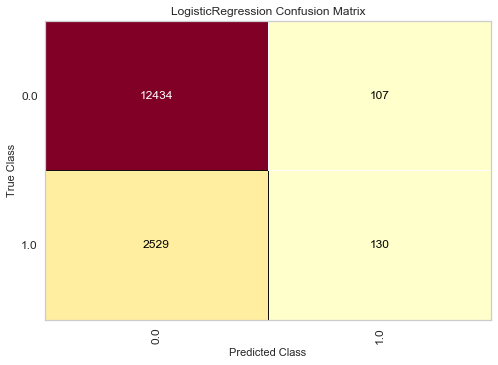

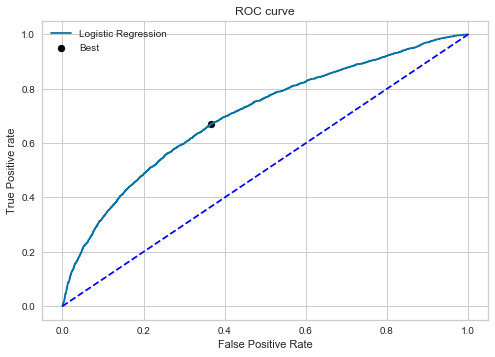

---------Nearest Neighbors------------
Accuracy  (%): 
 81.09868421052632
Precision: 
 40.58098591549296
Recall (%): 
 17.33734486649116
f1 score (%): 
 24.29512516469038
logistic loss :
 6.528318704660775
              precision    recall  f1-score   support

         0.0       0.84      0.95      0.89     12541
         1.0       0.41      0.17      0.24      2659

    accuracy                           0.81     15200
   macro avg       0.62      0.56      0.57     15200
weighted avg       0.77      0.81      0.78     15200

AUC  (%): 
 63.710185162055446
Best Threshold=0.200000, G-Mean=0.595


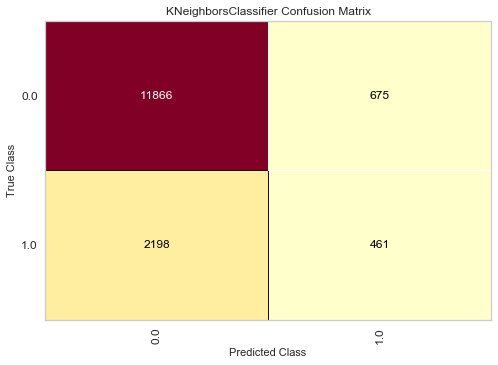

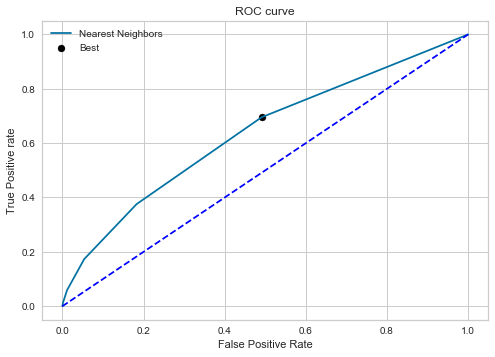

---------Decision Tree------------
Accuracy  (%): 
 74.36184210526315
Precision: 
 27.490909090909092
Recall (%): 
 28.43174125611132
f1 score (%): 
 27.953410981697168
logistic loss :
 8.855210921594917
              precision    recall  f1-score   support

         0.0       0.85      0.84      0.84     12541
         1.0       0.27      0.28      0.28      2659

    accuracy                           0.74     15200
   macro avg       0.56      0.56      0.56     15200
weighted avg       0.75      0.74      0.75     15200

AUC  (%): 
 56.26594637959062
Best Threshold=1.000000, G-Mean=0.489


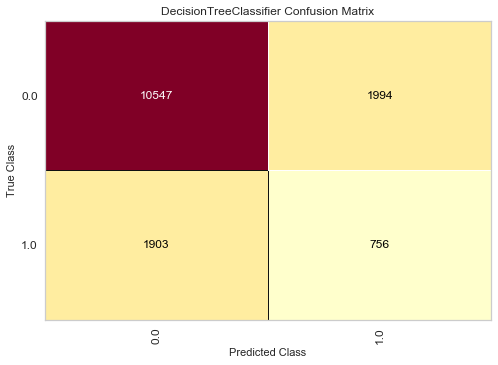

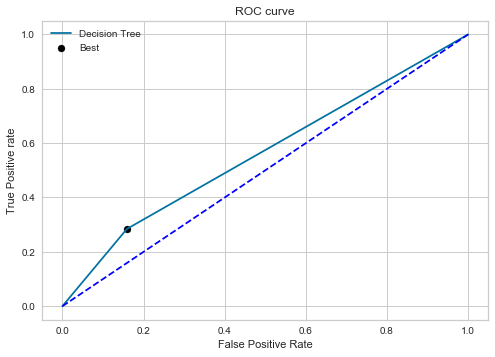

---------Naive Bayes------------
Accuracy  (%): 
 71.84868421052632
Precision: 
 31.789568345323744
Recall (%): 
 53.17788642346747
f1 score (%): 
 39.79175460813283
logistic loss :
 9.723279616606975
              precision    recall  f1-score   support

         0.0       0.88      0.76      0.82     12541
         1.0       0.32      0.53      0.40      2659

    accuracy                           0.72     15200
   macro avg       0.60      0.64      0.61     15200
weighted avg       0.79      0.72      0.74     15200

AUC  (%): 
 67.9676265459672
Best Threshold=0.482238, G-Mean=0.639


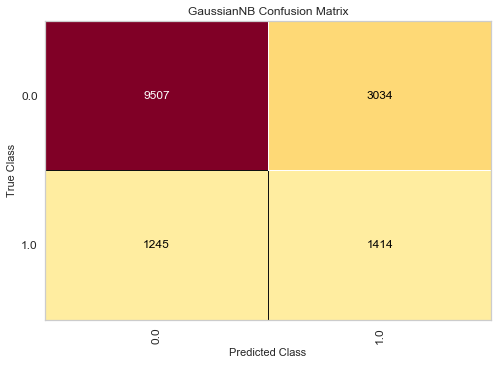

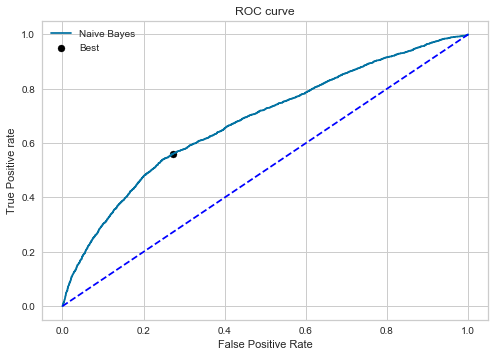

---------Random Forest------------
Accuracy  (%): 
 82.97368421052632
Precision: 
 56.28318584070796
Recall (%): 
 11.959383226776984
f1 score (%): 
 19.727047146401986
logistic loss :
 5.880694132275928
              precision    recall  f1-score   support

         0.0       0.84      0.98      0.90     12541
         1.0       0.56      0.12      0.20      2659

    accuracy                           0.83     15200
   macro avg       0.70      0.55      0.55     15200
weighted avg       0.79      0.83      0.78     15200

AUC  (%): 
 71.69090572842101
Best Threshold=0.190000, G-Mean=0.659


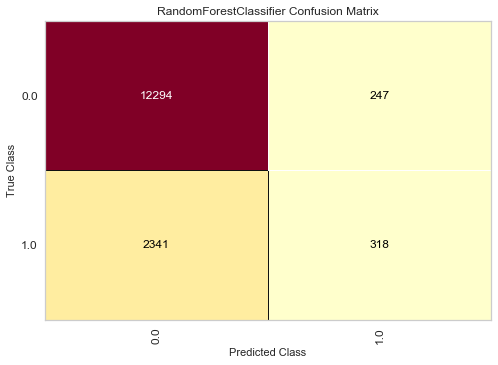

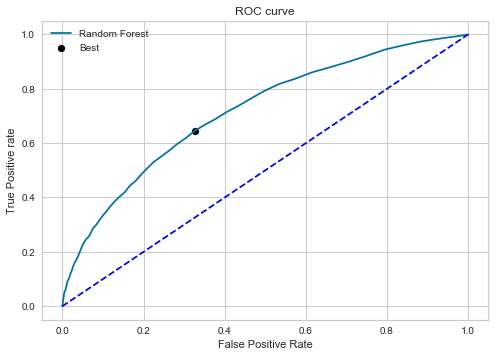

---------xgboost------------
Accuracy  (%): 
 82.90789473684211
Precision: 
 55.008210180623976
Recall (%): 
 12.598721323805941
f1 score (%): 
 20.501835985312116
logistic loss :
 5.903418431820646
              precision    recall  f1-score   support

         0.0       0.84      0.98      0.90     12541
         1.0       0.55      0.13      0.21      2659

    accuracy                           0.83     15200
   macro avg       0.70      0.55      0.55     15200
weighted avg       0.79      0.83      0.78     15200

AUC  (%): 
 72.8076894622794
Best Threshold=0.163727, G-Mean=0.670


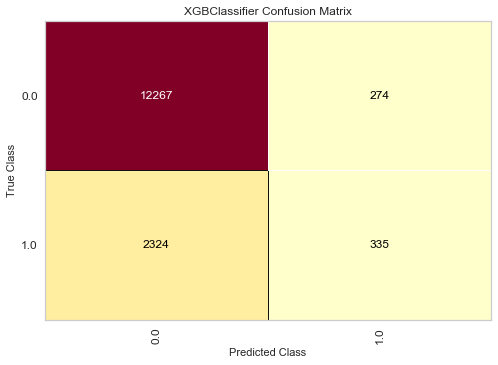

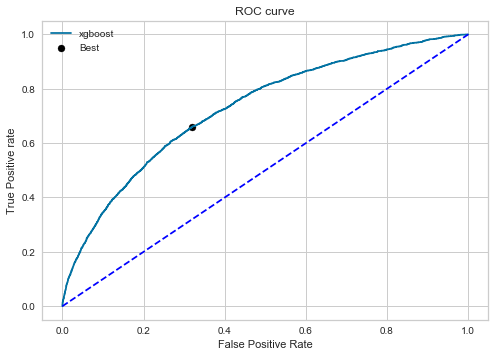

---------Ada Boost------------
Accuracy  (%): 
 83.07236842105263
Precision: 
 61.31578947368421
Recall (%): 
 8.762692741632193
f1 score (%): 
 15.33399144455413
logistic loss :
 5.8466045529557515
              precision    recall  f1-score   support

         0.0       0.84      0.99      0.91     12541
         1.0       0.61      0.09      0.15      2659

    accuracy                           0.83     15200
   macro avg       0.72      0.54      0.53     15200
weighted avg       0.80      0.83      0.77     15200

AUC  (%): 
 71.92914348871017
Best Threshold=0.491984, G-Mean=0.665


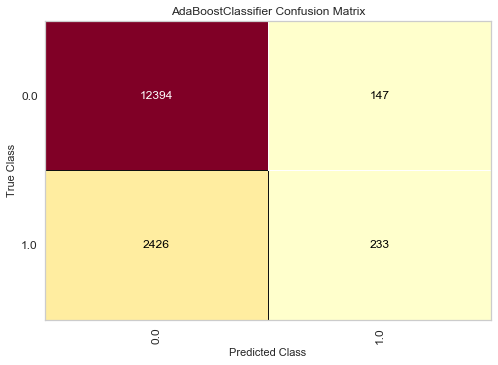

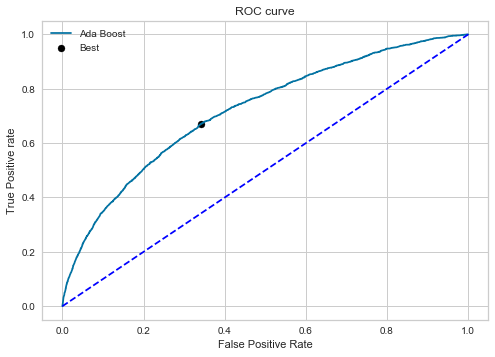

---------SVM------------
Accuracy  (%): 
 82.55921052631578
Precision: 
 52.352941176470594
Recall (%): 
 3.3471229785633696
f1 score (%): 
 6.291975963237893
logistic loss :
 6.0238395388355315
              precision    recall  f1-score   support

         0.0       0.83      0.99      0.90     12541
         1.0       0.52      0.03      0.06      2659

    accuracy                           0.83     15200
   macro avg       0.68      0.51      0.48     15200
weighted avg       0.78      0.83      0.76     15200

AUC score cannot be calculated for linear SVM


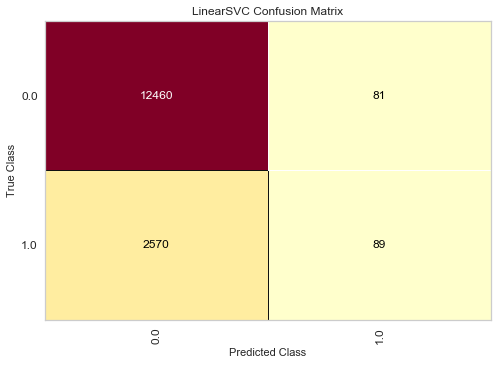

---------MLP Classifier------------
Accuracy  (%): 
 83.01973684210526
Precision: 
 58.590308370044056
Recall (%): 
 10.003760812335464
f1 score (%): 
 17.089624156761964
logistic loss :
 5.864785013130351
              precision    recall  f1-score   support

         0.0       0.84      0.99      0.91     12541
         1.0       0.59      0.10      0.17      2659

    accuracy                           0.83     15200
   macro avg       0.71      0.54      0.54     15200
weighted avg       0.79      0.83      0.78     15200

AUC  (%): 
 72.19916417662665
Best Threshold=0.150051, G-Mean=0.663


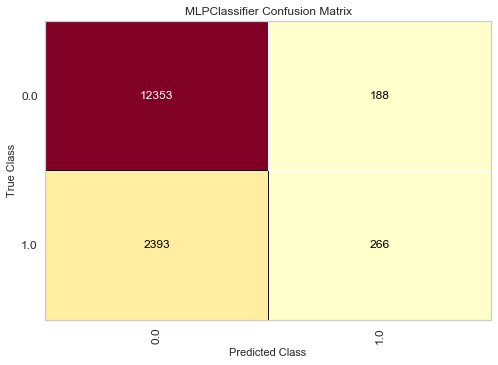

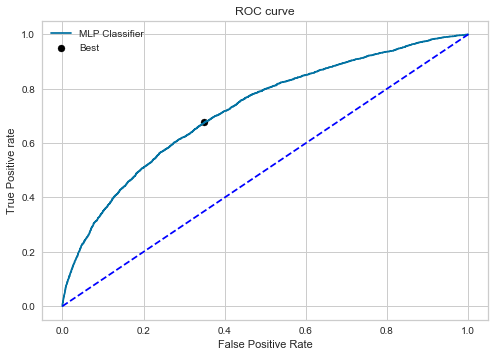

---------light Gradient Boosting------------
Accuracy  (%): 
 83.17763157894737
Precision: 
 60.851063829787236
Recall (%): 
 10.755923279428355
f1 score (%): 
 18.280600830936397
logistic loss :
 5.810249892612749
              precision    recall  f1-score   support

         0.0       0.84      0.99      0.91     12541
         1.0       0.61      0.11      0.18      2659

    accuracy                           0.83     15200
   macro avg       0.72      0.55      0.54     15200
weighted avg       0.80      0.83      0.78     15200

AUC  (%): 
 73.46042176096401
Best Threshold=0.174212, G-Mean=0.674


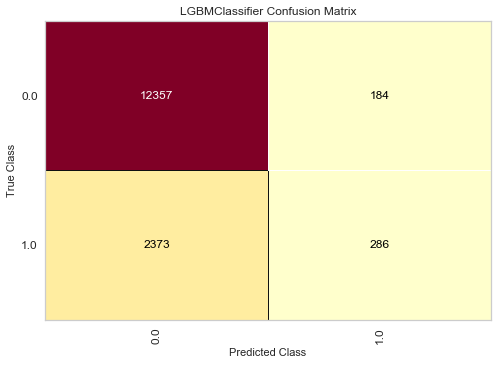

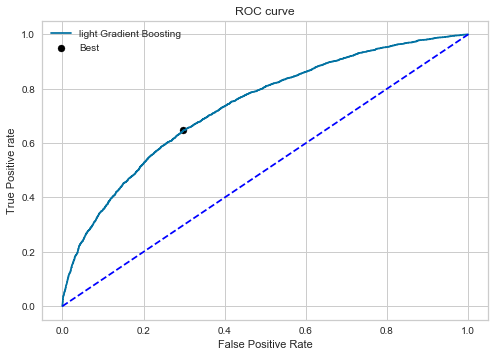

---------Gradient Boosting Classifier------------
Accuracy  (%): 
 83.11842105263158
Precision: 
 60.40268456375839
Recall (%): 
 10.154193305754044
f1 score (%): 
 17.385705086928528
logistic loss :
 5.83070011566355
              precision    recall  f1-score   support

         0.0       0.84      0.99      0.91     12541
         1.0       0.60      0.10      0.17      2659

    accuracy                           0.83     15200
   macro avg       0.72      0.54      0.54     15200
weighted avg       0.80      0.83      0.78     15200

AUC  (%): 
 72.82172690948642
Best Threshold=0.162580, G-Mean=0.668


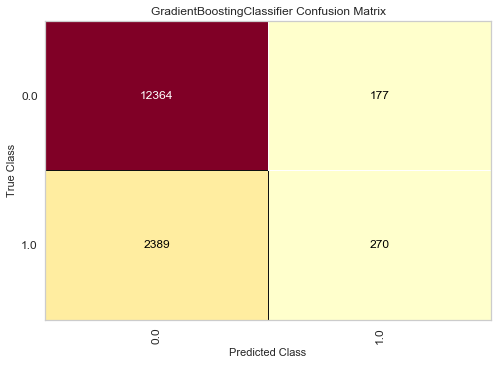

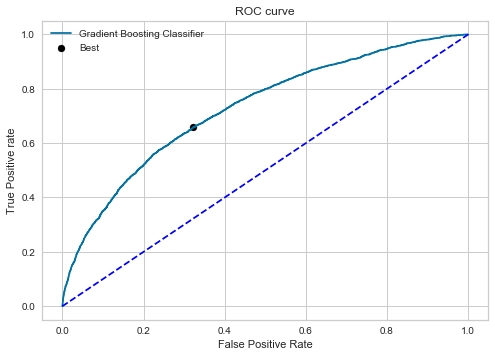

,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,54.852321,4.889056,0.702036,82.657895
1,Nearest Neighbors,40.580986,17.337345,0.637102,81.098684
2,Decision Tree,27.490909,28.431741,0.562659,74.361842
3,Naive Bayes,31.789568,53.177886,0.679676,71.848684
4,Random Forest,56.283186,11.959383,0.716909,82.973684
5,xgboost,55.008210,12.598721,0.728077,82.907895
6,Ada Boost,61.315789,8.762693,0.719291,83.072368
7,SVM,52.352941,3.347123,0.000000,82.559211
8,MLP Classifier,58.590308,10.003761,0.721992,83.019737
9,light Gradient Boosting,60.851064,10.755923,0.734604,83.177632


,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,54.852321,4.889056,0.702036,82.657895
1,Nearest Neighbors,40.580986,17.337345,0.637102,81.098684
2,Decision Tree,27.490909,28.431741,0.562659,74.361842
3,Naive Bayes,31.789568,53.177886,0.679676,71.848684
4,Random Forest,56.283186,11.959383,0.716909,82.973684
5,xgboost,55.008210,12.598721,0.728077,82.907895
6,Ada Boost,61.315789,8.762693,0.719291,83.072368
7,SVM,52.352941,3.347123,0.000000,82.559211
8,MLP Classifier,58.590308,10.003761,0.721992,83.019737
9,light Gradient Boosting,60.851064,10.755923,0.734604,83.177632


In [ ]:
t.fit_model_RFS(df4,'SoldFlag',threshold=5,classification=True,min_max=False,svm_type='Linear')

### ML Algorithms with Cross Validation

_____Cross Validation_____
---------Logistic Regression------------
Mean accuracy  (%): 
 83.58190919378305
Mean AUC  (%): 
 74.48229705742627
Mean Precision: 
 60.58461307165379
Mean Recall (%): 
 8.702721880815627
Mean f1 score (%): 
 15.207847309262132
---------Nearest Neighbors------------
Mean accuracy  (%): 
 81.42817910286905
Mean AUC  (%): 
 66.35377333012062
Mean Precision: 
 39.808958670461806
Mean Recall (%): 
 18.88185992957652
Mean f1 score (%): 
 25.56006433355855
---------Decision Tree------------
Mean accuracy  (%): 
 75.51539417873336
Mean AUC  (%): 
 57.6155923771297
Mean Precision: 
 28.67909546011363
Mean Recall (%): 
 30.45828814716633
Mean f1 score (%): 
 29.578957819766355
---------Naive Bayes------------
Mean accuracy  (%): 
 77.73907646474679
Mean AUC  (%): 
 72.23839831390389
Mean Precision: 
 36.96455039981531
Mean Recall (%): 
 43.30528443855351
Mean f1 score (%): 
 39.62308560088332
---------Random Forest------------
Mean accuracy  (%): 
 83.47661524368183


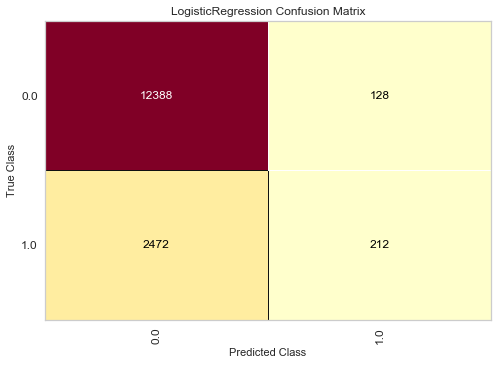

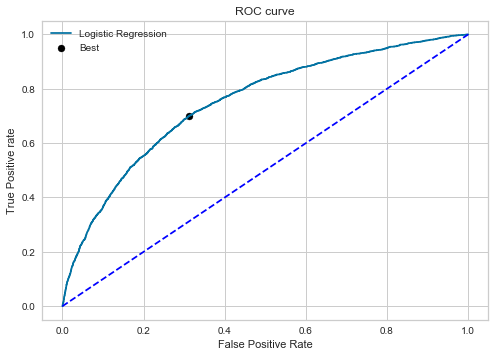

---------Nearest Neighbors------------
Accuracy  (%): 
 81.57894736842105
Precision: 
 45.307443365695796
Recall (%): 
 20.864381520119224
f1 score (%): 
 28.57142857142857
logistic loss :
 6.3624417390534695
              precision    recall  f1-score   support

         0.0       0.85      0.95      0.89     12516
         1.0       0.45      0.21      0.29      2684

    accuracy                           0.82     15200
   macro avg       0.65      0.58      0.59     15200
weighted avg       0.78      0.82      0.79     15200

AUC  (%): 
 67.22088721964946
Best Threshold=0.200000, G-Mean=0.624


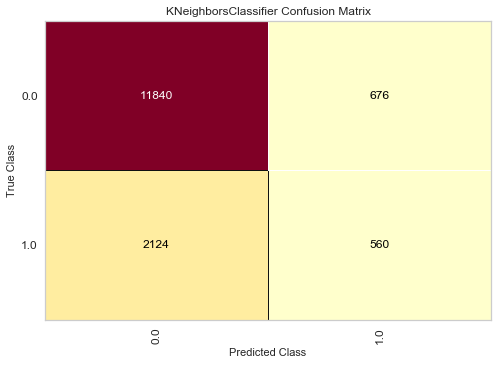

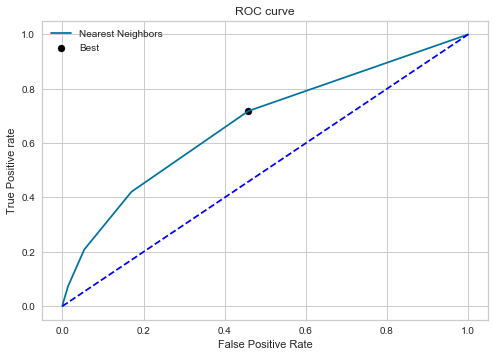

---------Decision Tree------------
Accuracy  (%): 
 74.82894736842105
Precision: 
 29.794762915782023
Recall (%): 
 31.37108792846498
f1 score (%): 
 30.562613430127044
logistic loss :
 8.693877953173011
              precision    recall  f1-score   support

         0.0       0.85      0.84      0.85     12516
         1.0       0.30      0.31      0.31      2684

    accuracy                           0.75     15200
   macro avg       0.57      0.58      0.58     15200
weighted avg       0.75      0.75      0.75     15200

AUC  (%): 
 57.75968905851182
Best Threshold=1.000000, G-Mean=0.514


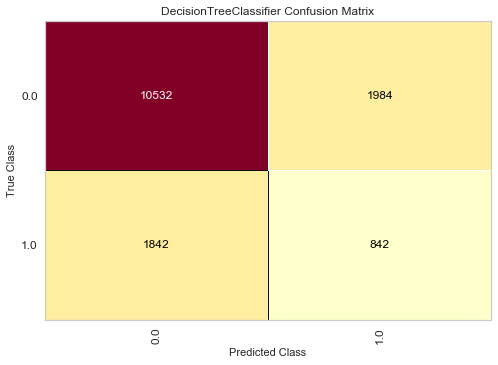

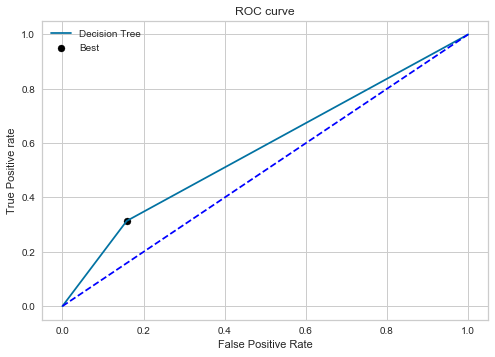

---------Naive Bayes------------
Accuracy  (%): 
 74.69078947368422
Precision: 
 35.709019415089706
Recall (%): 
 54.135618479880776
f1 score (%): 
 43.032726195764845
logistic loss :
 8.74162924592755
              precision    recall  f1-score   support

         0.0       0.89      0.79      0.84     12516
         1.0       0.36      0.54      0.43      2684

    accuracy                           0.75     15200
   macro avg       0.62      0.67      0.63     15200
weighted avg       0.80      0.75      0.77     15200

AUC  (%): 
 72.60426921796436
Best Threshold=0.339136, G-Mean=0.685


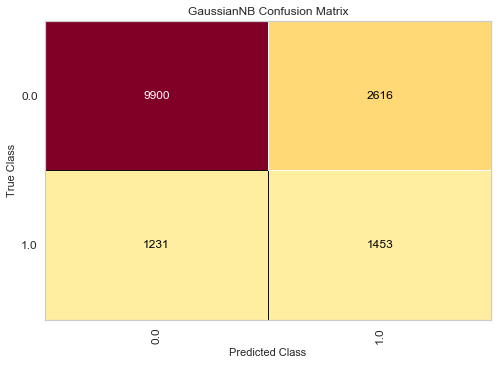

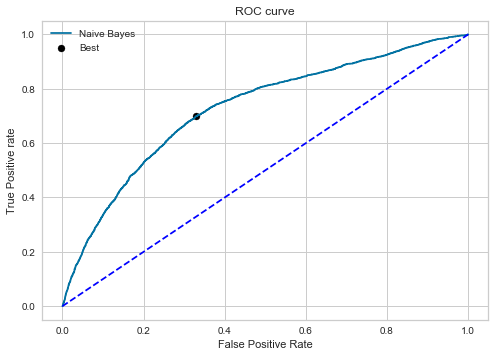

---------Random Forest------------
Accuracy  (%): 
 83.05921052631578
Precision: 
 57.394843962008146
Recall (%): 
 15.760059612518628
f1 score (%): 
 24.729611224788076
logistic loss :
 5.851157913847901
              precision    recall  f1-score   support

         0.0       0.84      0.97      0.90     12516
         1.0       0.57      0.16      0.25      2684

    accuracy                           0.83     15200
   macro avg       0.71      0.57      0.58     15200
weighted avg       0.80      0.83      0.79     15200

AUC  (%): 
 74.77810667621154
Best Threshold=0.190000, G-Mean=0.684


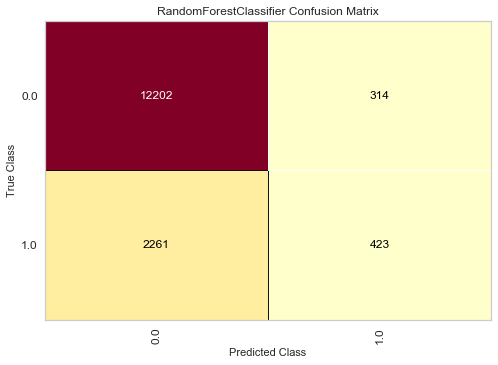

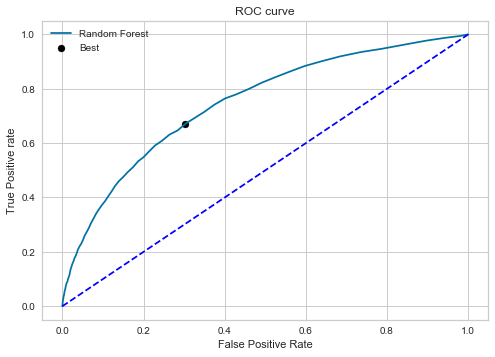

---------xgboost------------
Accuracy  (%): 
 82.9342105263158
Precision: 
 55.44794188861986
Recall (%): 
 17.06408345752608
f1 score (%): 
 26.096866096866094
logistic loss :
 5.894334225016619
              precision    recall  f1-score   support

         0.0       0.85      0.97      0.90     12516
         1.0       0.55      0.17      0.26      2684

    accuracy                           0.83     15200
   macro avg       0.70      0.57      0.58     15200
weighted avg       0.79      0.83      0.79     15200

AUC  (%): 
 75.02346028380246
Best Threshold=0.154869, G-Mean=0.690


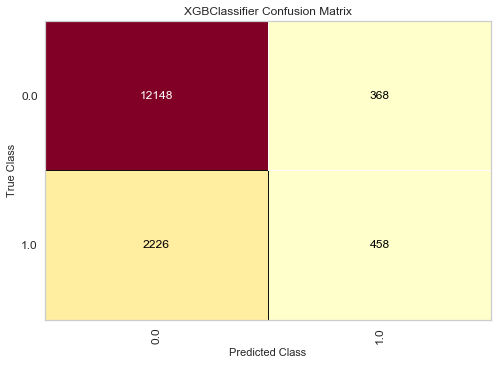

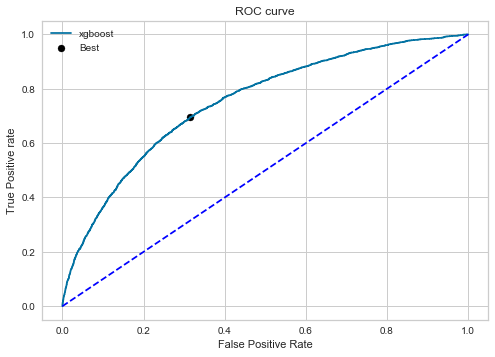

---------Ada Boost------------
Accuracy  (%): 
 83.05263157894737
Precision: 
 59.12162162162162
Recall (%): 
 13.040238450074515
f1 score (%): 
 21.367521367521366
logistic loss :
 5.853426414201845
              precision    recall  f1-score   support

         0.0       0.84      0.98      0.91     12516
         1.0       0.59      0.13      0.21      2684

    accuracy                           0.83     15200
   macro avg       0.72      0.56      0.56     15200
weighted avg       0.80      0.83      0.78     15200

AUC  (%): 
 75.62254144798979
Best Threshold=0.491777, G-Mean=0.697


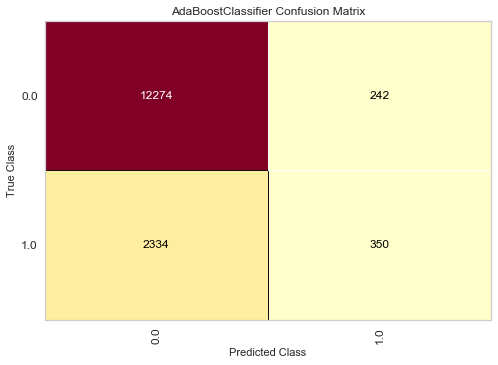

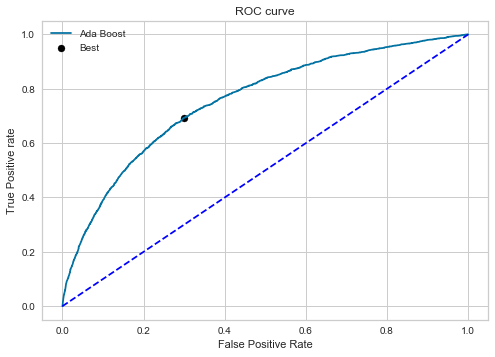

---------SVM------------
Accuracy  (%): 
 82.53947368421053
Precision: 
 57.57575757575758
Recall (%): 
 4.247391952309985
f1 score (%): 
 7.91117279666898
logistic loss :
 6.030656560412966
              precision    recall  f1-score   support

         0.0       0.83      0.99      0.90     12516
         1.0       0.58      0.04      0.08      2684

    accuracy                           0.83     15200
   macro avg       0.70      0.52      0.49     15200
weighted avg       0.78      0.83      0.76     15200

AUC score cannot be calculated for linear SVM


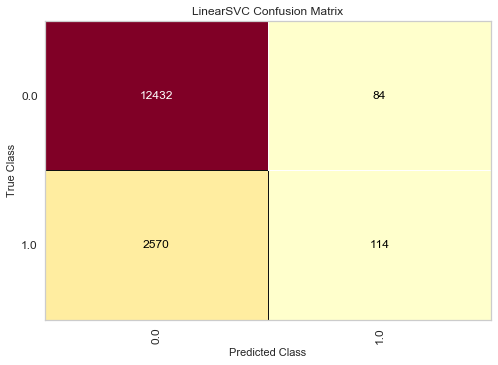

---------MLP Classifier------------
Accuracy  (%): 
 83.03947368421053
Precision: 
 60.6
Recall (%): 
 11.289120715350224
f1 score (%): 
 19.032663316582916
logistic loss :
 5.857968622814045
              precision    recall  f1-score   support

         0.0       0.84      0.98      0.91     12516
         1.0       0.61      0.11      0.19      2684

    accuracy                           0.83     15200
   macro avg       0.72      0.55      0.55     15200
weighted avg       0.80      0.83      0.78     15200

AUC  (%): 
 75.71295626843542
Best Threshold=0.174229, G-Mean=0.695


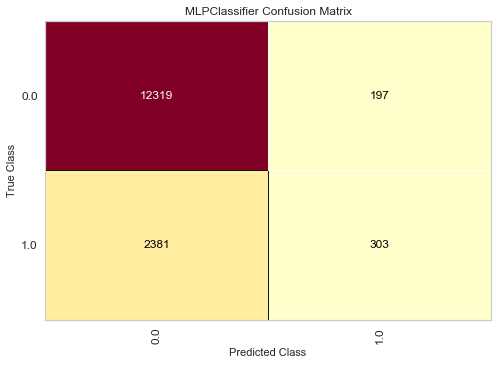

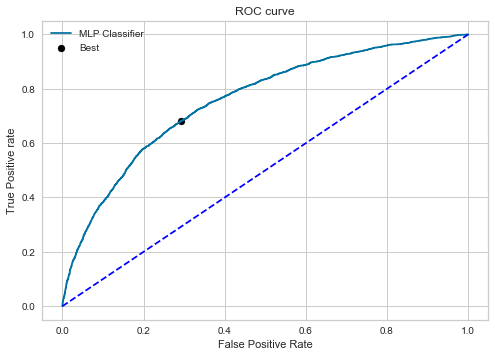

---------light Gradient Boosting------------
Accuracy  (%): 
 83.3092105263158
Precision: 
 61.873990306946695
Recall (%): 
 14.269746646795827
f1 score (%): 
 23.191038449894037
logistic loss :
 5.764806869663285
              precision    recall  f1-score   support

         0.0       0.84      0.98      0.91     12516
         1.0       0.62      0.14      0.23      2684

    accuracy                           0.83     15200
   macro avg       0.73      0.56      0.57     15200
weighted avg       0.80      0.83      0.79     15200

AUC  (%): 
 76.18293442813466
Best Threshold=0.168698, G-Mean=0.697


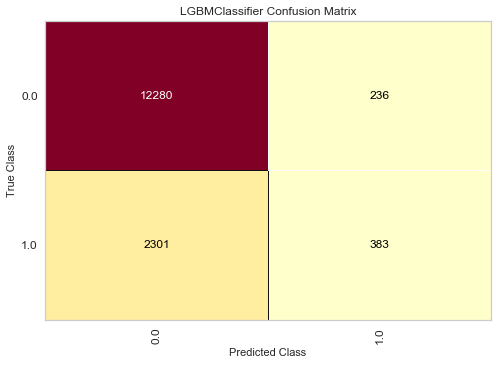

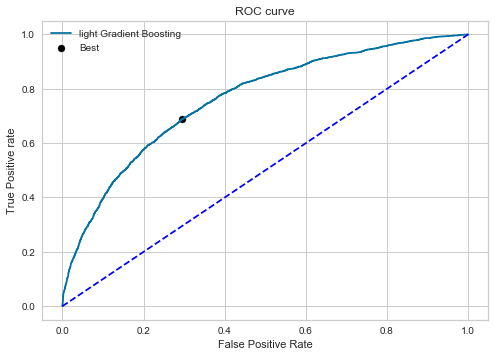

---------Gradient Boosting Classifier------------
Accuracy  (%): 
 83.28947368421052
Precision: 
 62.857142857142854
Recall (%): 
 13.114754098360656
f1 score (%): 
 21.701602959309493
logistic loss :
 5.771622260482804
              precision    recall  f1-score   support

         0.0       0.84      0.98      0.91     12516
         1.0       0.63      0.13      0.22      2684

    accuracy                           0.83     15200
   macro avg       0.73      0.56      0.56     15200
weighted avg       0.80      0.83      0.78     15200

AUC  (%): 
 76.30532917865132
Best Threshold=0.142912, G-Mean=0.697


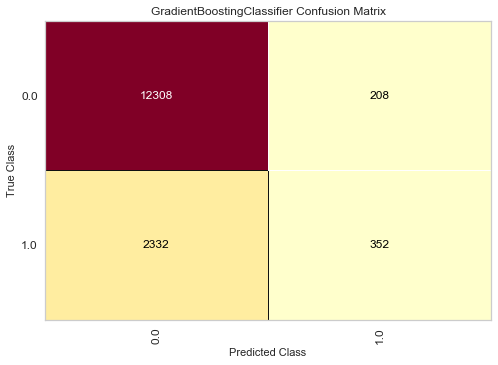

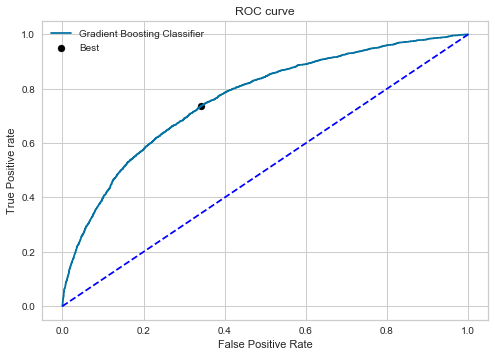

,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,62.352941,7.898659,0.749952,82.894737
1,Nearest Neighbors,45.307443,20.864382,0.672209,81.578947
2,Decision Tree,29.794763,31.371088,0.577597,74.828947
3,Naive Bayes,35.709019,54.135618,0.726043,74.690789
4,Random Forest,57.394844,15.760060,0.747781,83.059211
5,xgboost,55.447942,17.064083,0.750235,82.934211
6,Ada Boost,59.121622,13.040238,0.756225,83.052632
7,SVM,57.575758,4.247392,0.000000,82.539474
8,MLP Classifier,60.600000,11.289121,0.757130,83.039474
9,light Gradient Boosting,61.873990,14.269747,0.761829,83.309211


,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,62.352941,7.898659,0.749952,82.894737
1,Nearest Neighbors,45.307443,20.864382,0.672209,81.578947
2,Decision Tree,29.794763,31.371088,0.577597,74.828947
3,Naive Bayes,35.709019,54.135618,0.726043,74.690789
4,Random Forest,57.394844,15.760060,0.747781,83.059211
5,xgboost,55.447942,17.064083,0.750235,82.934211
6,Ada Boost,59.121622,13.040238,0.756225,83.052632
7,SVM,57.575758,4.247392,0.000000,82.539474
8,MLP Classifier,60.600000,11.289121,0.757130,83.039474
9,light Gradient Boosting,61.873990,14.269747,0.761829,83.309211


In [ ]:
t.fit_model_CV(df4,'SoldFlag',split=10,classification=True,min_max=False,svm_type='Linear')

### ML Algorithms with Cross Validation and Random Forest Feature Selection

StrengthFactor    18.084409
ItemCount         15.765350
LowUserPrice      15.360550
PriceReg          14.947234
LowNetPrice       14.888326
ReleaseYear        8.914483
ReleaseNumber      7.845376
MarketingType      4.194273
dtype: float64
Selected Features =['StrengthFactor', 'ItemCount', 'LowUserPrice', 'PriceReg', 'LowNetPrice', 'ReleaseYear', 'ReleaseNumber']
_____Cross Validation_____
---------Logistic Regression------------
Mean accuracy  (%): 
 83.27046334572718
Mean AUC  (%): 
 70.54301093871224
Mean Precision: 
 56.50110915065999
Mean Recall (%): 
 5.983250994095673
Mean f1 score (%): 
 10.794074895771978
---------Nearest Neighbors------------
Mean accuracy  (%): 
 81.36239347821066
Mean AUC  (%): 
 63.469389414913444
Mean Precision: 
 38.29338922819997
Mean Recall (%): 
 16.291454124325554
Mean f1 score (%): 
 22.83609221264502
---------Decision Tree------------
Mean accuracy  (%): 
 74.43642564067035
Mean AUC  (%): 
 56.451868318217414
Mean Precision: 
 26.782625038299535
Mea

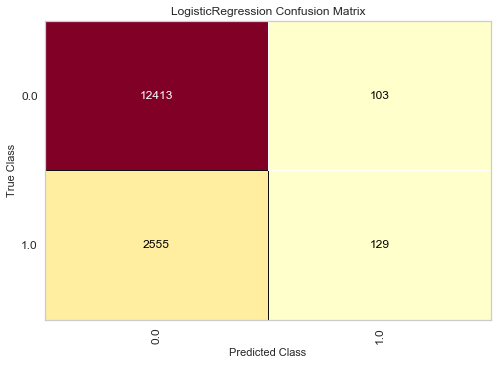

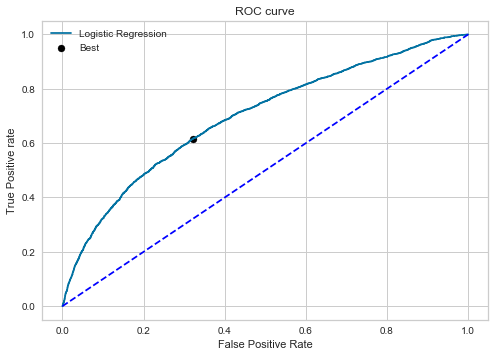

---------Nearest Neighbors------------
Accuracy  (%): 
 81.08552631578947
Precision: 
 41.48082069580731
Recall (%): 
 17.32488822652757
f1 score (%): 
 24.441524310118265
logistic loss :
 6.532862281005423
              precision    recall  f1-score   support

         0.0       0.84      0.95      0.89     12516
         1.0       0.41      0.17      0.24      2684

    accuracy                           0.81     15200
   macro avg       0.63      0.56      0.57     15200
weighted avg       0.77      0.81      0.78     15200

AUC  (%): 
 64.70974231969667
Best Threshold=0.200000, G-Mean=0.605


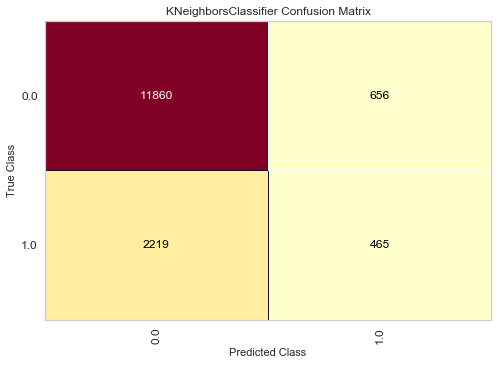

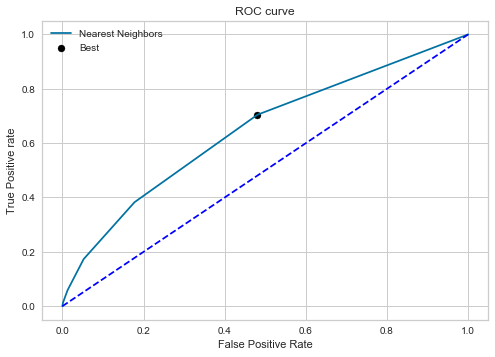

---------Decision Tree------------
Accuracy  (%): 
 74.39473684210526
Precision: 
 28.10007251631617
Recall (%): 
 28.874813710879284
f1 score (%): 
 28.482175670709292
logistic loss :
 8.843848903335294
              precision    recall  f1-score   support

         0.0       0.85      0.84      0.84     12516
         1.0       0.28      0.29      0.28      2684

    accuracy                           0.74     15200
   macro avg       0.56      0.57      0.56     15200
weighted avg       0.75      0.74      0.75     15200

AUC  (%): 
 56.515546836264186
Best Threshold=1.000000, G-Mean=0.493


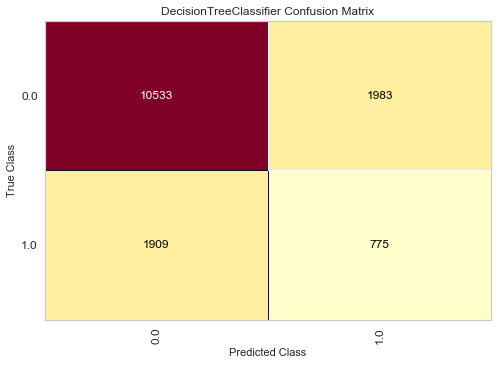

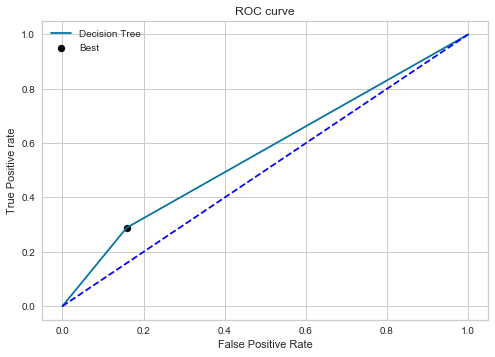

---------Naive Bayes------------
Accuracy  (%): 
 75.02631578947368
Precision: 
 33.99539435808866
Recall (%): 
 44.00149031296572
f1 score (%): 
 38.35660928873011
logistic loss :
 8.625725570525553
              precision    recall  f1-score   support

         0.0       0.87      0.82      0.84     12516
         1.0       0.34      0.44      0.38      2684

    accuracy                           0.75     15200
   macro avg       0.61      0.63      0.61     15200
weighted avg       0.78      0.75      0.76     15200

AUC  (%): 
 67.92764873480574
Best Threshold=0.411901, G-Mean=0.640


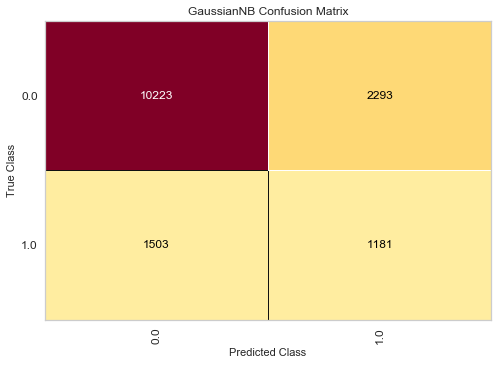

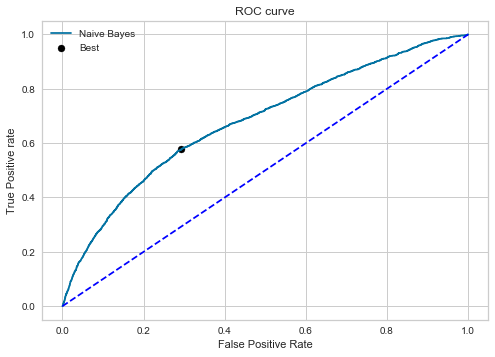

---------Random Forest------------
Accuracy  (%): 
 82.9407894736842
Precision: 
 57.80445969125214
Recall (%): 
 12.555886736214605
f1 score (%): 
 20.630547903275176
logistic loss :
 5.892055519274423
              precision    recall  f1-score   support

         0.0       0.84      0.98      0.90     12516
         1.0       0.58      0.13      0.21      2684

    accuracy                           0.83     15200
   macro avg       0.71      0.55      0.56     15200
weighted avg       0.79      0.83      0.78     15200

AUC  (%): 
 71.66622401418583
Best Threshold=0.210000, G-Mean=0.655


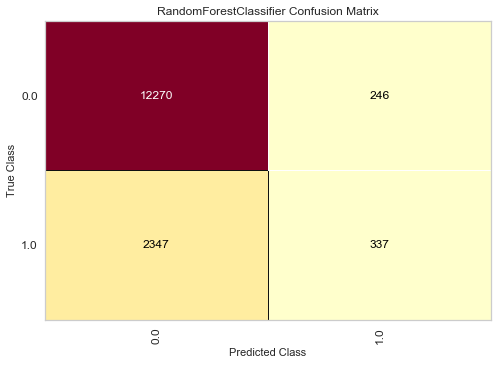

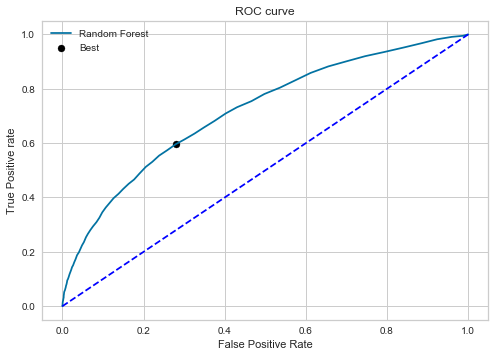

---------xgboost------------
Accuracy  (%): 
 82.73026315789474
Precision: 
 54.76575121163167
Recall (%): 
 12.630402384500744
f1 score (%): 
 20.52679382379655
logistic loss :
 5.964770521310593
              precision    recall  f1-score   support

         0.0       0.84      0.98      0.90     12516
         1.0       0.55      0.13      0.21      2684

    accuracy                           0.83     15200
   macro avg       0.69      0.55      0.55     15200
weighted avg       0.79      0.83      0.78     15200

AUC  (%): 
 72.20428641205127
Best Threshold=0.155866, G-Mean=0.669


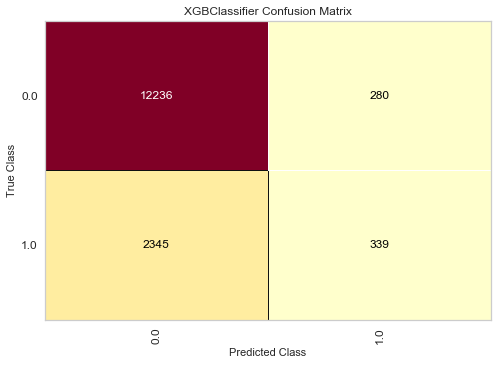

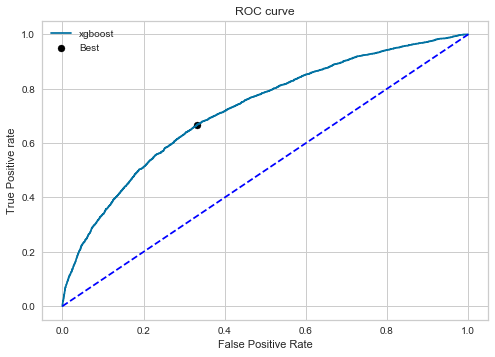

---------Ada Boost------------
Accuracy  (%): 
 82.76973684210527
Precision: 
 58.485639686684074
Recall (%): 
 8.345752608047691
f1 score (%): 
 14.607107923051846
logistic loss :
 5.9511304285699
              precision    recall  f1-score   support

         0.0       0.83      0.99      0.90     12516
         1.0       0.58      0.08      0.15      2684

    accuracy                           0.83     15200
   macro avg       0.71      0.54      0.53     15200
weighted avg       0.79      0.83      0.77     15200

AUC  (%): 
 72.11326878644515
Best Threshold=0.492298, G-Mean=0.670


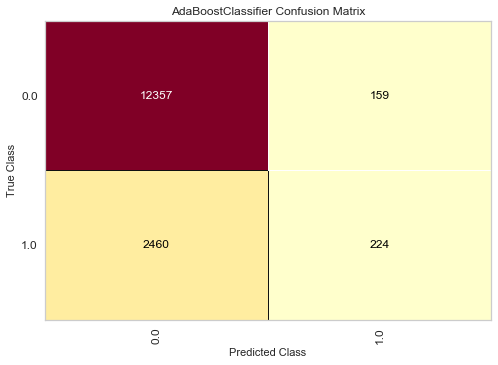

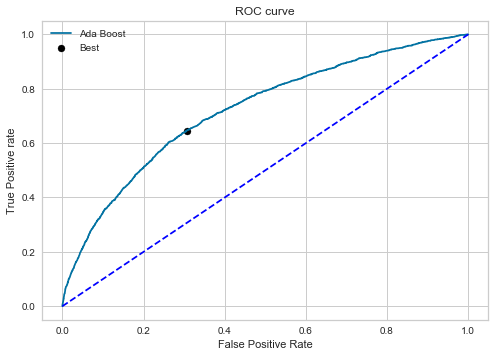

---------SVM------------
Accuracy  (%): 
 82.41447368421052
Precision: 
 53.293413173652695
Recall (%): 
 3.315946348733234
f1 score (%): 
 6.243423360224482
logistic loss :
 6.07382971527604
              precision    recall  f1-score   support

         0.0       0.83      0.99      0.90     12516
         1.0       0.53      0.03      0.06      2684

    accuracy                           0.82     15200
   macro avg       0.68      0.51      0.48     15200
weighted avg       0.78      0.82      0.75     15200

AUC score cannot be calculated for linear SVM


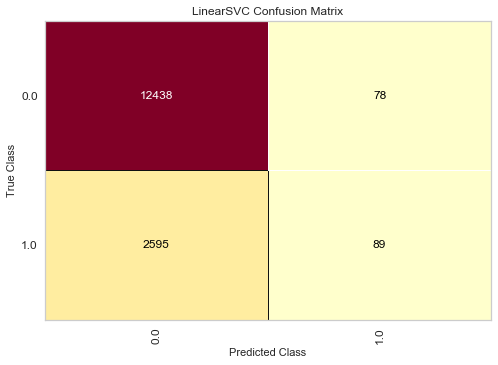

---------MLP Classifier------------
Accuracy  (%): 
 82.69736842105263
Precision: 
 58.08383233532935
Recall (%): 
 7.228017883755589
f1 score (%): 
 12.856196156394963
logistic loss :
 5.976124596201008
              precision    recall  f1-score   support

         0.0       0.83      0.99      0.90     12516
         1.0       0.58      0.07      0.13      2684

    accuracy                           0.83     15200
   macro avg       0.71      0.53      0.52     15200
weighted avg       0.79      0.83      0.77     15200

AUC  (%): 
 72.12387518045456
Best Threshold=0.168599, G-Mean=0.664


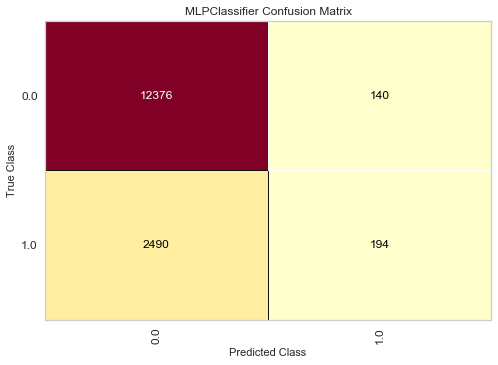

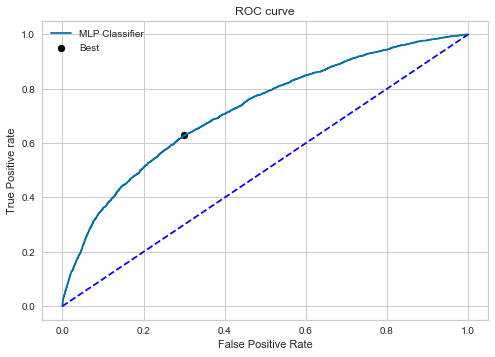

---------light Gradient Boosting------------
Accuracy  (%): 
 83.0328947368421
Precision: 
 60.86956521739131
Recall (%): 
 10.953800298062594
f1 score (%): 
 18.566466687717085
logistic loss :
 5.860240489894011
              precision    recall  f1-score   support

         0.0       0.84      0.98      0.91     12516
         1.0       0.61      0.11      0.19      2684

    accuracy                           0.83     15200
   macro avg       0.72      0.55      0.55     15200
weighted avg       0.80      0.83      0.78     15200

AUC  (%): 
 73.1574717000094
Best Threshold=0.176190, G-Mean=0.672


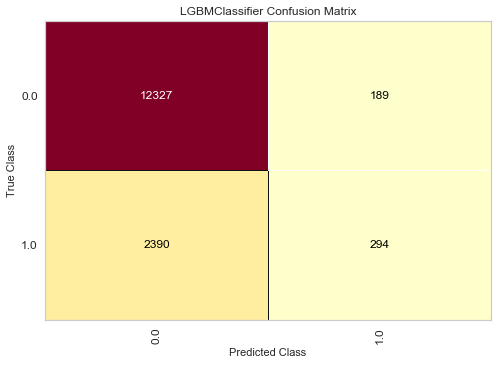

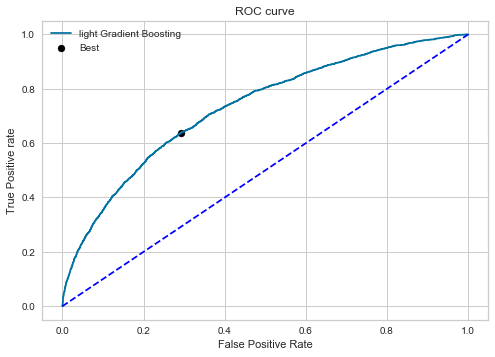

---------Gradient Boosting Classifier------------
Accuracy  (%): 
 83.09210526315789
Precision: 
 62.17948717948718
Recall (%): 
 10.842026825633383
f1 score (%): 
 18.464467005076145
logistic loss :
 5.839789267346421
              precision    recall  f1-score   support

         0.0       0.84      0.99      0.91     12516
         1.0       0.62      0.11      0.18      2684

    accuracy                           0.83     15200
   macro avg       0.73      0.55      0.55     15200
weighted avg       0.80      0.83      0.78     15200

AUC  (%): 
 73.22298396949073
Best Threshold=0.166941, G-Mean=0.675


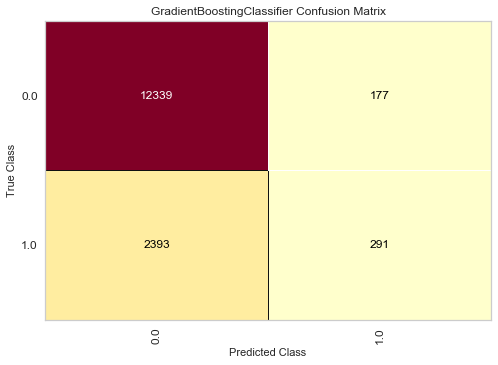

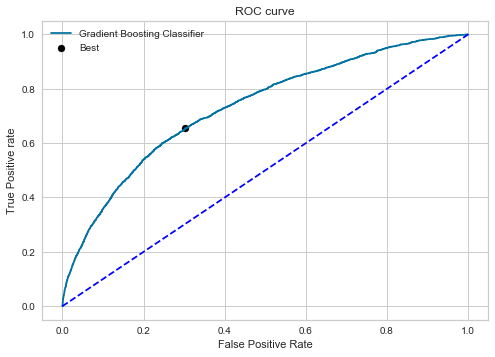

,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,55.603448,4.806259,0.696168,82.513158
1,Nearest Neighbors,41.480821,17.324888,0.647097,81.085526
2,Decision Tree,28.100073,28.874814,0.565155,74.394737
3,Naive Bayes,33.995394,44.001490,0.679276,75.026316
4,Random Forest,57.804460,12.555887,0.716662,82.940789
5,xgboost,54.765751,12.630402,0.722043,82.730263
6,Ada Boost,58.485640,8.345753,0.721133,82.769737
7,SVM,53.293413,3.315946,0.000000,82.414474
8,MLP Classifier,58.083832,7.228018,0.721239,82.697368
9,light Gradient Boosting,60.869565,10.953800,0.731575,83.032895


,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,55.603448,4.806259,0.696168,82.513158
1,Nearest Neighbors,41.480821,17.324888,0.647097,81.085526
2,Decision Tree,28.100073,28.874814,0.565155,74.394737
3,Naive Bayes,33.995394,44.001490,0.679276,75.026316
4,Random Forest,57.804460,12.555887,0.716662,82.940789
5,xgboost,54.765751,12.630402,0.722043,82.730263
6,Ada Boost,58.485640,8.345753,0.721133,82.769737
7,SVM,53.293413,3.315946,0.000000,82.414474
8,MLP Classifier,58.083832,7.228018,0.721239,82.697368
9,light Gradient Boosting,60.869565,10.953800,0.731575,83.032895


In [ ]:
t.fit_model_CV_FS(df4,'SoldFlag',split=10,classification=True,threshold=5,min_max=False,svm_type='Linear')

### ML algorithms with oversampling without Random Forest Feature Selection and Cross Validation

---------Logistic Regression------------
Accuracy  (%): 
 79.92763157894737
Precision: 
 42.558845861807136
Recall (%): 
 42.1587062805566
f1 score (%): 
 42.357831097676176
logistic loss :
 6.932830037617394
              precision    recall  f1-score   support

         0.0       0.88      0.88      0.88     12541
         1.0       0.43      0.42      0.42      2659

    accuracy                           0.80     15200
   macro avg       0.65      0.65      0.65     15200
weighted avg       0.80      0.80      0.80     15200

AUC  (%): 
 74.85869514596112
Best Threshold=0.320951, G-Mean=0.687


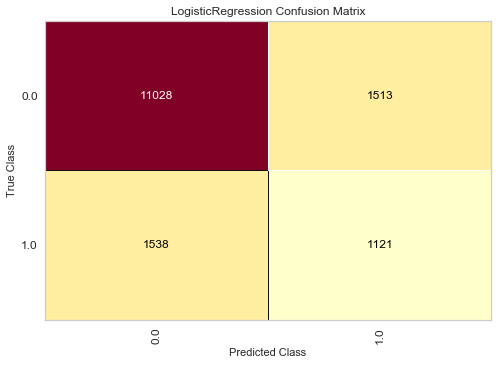

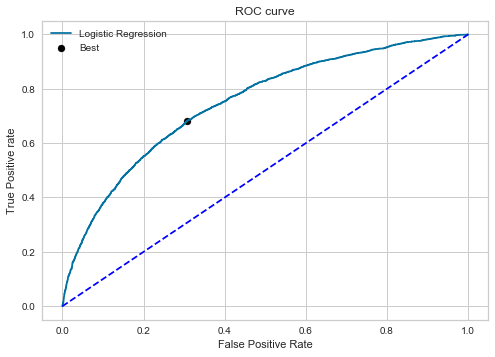

---------Nearest Neighbors------------
Accuracy  (%): 
 72.76973684210526
Precision: 
 30.32961190855928
Recall (%): 
 42.910868747649495
f1 score (%): 
 35.53963557078337
logistic loss :
 9.405137581802622
              precision    recall  f1-score   support

         0.0       0.87      0.79      0.83     12541
         1.0       0.30      0.43      0.36      2659

    accuracy                           0.73     15200
   macro avg       0.59      0.61      0.59     15200
weighted avg       0.77      0.73      0.74     15200

AUC  (%): 
 65.85582141272377
Best Threshold=0.400000, G-Mean=0.627


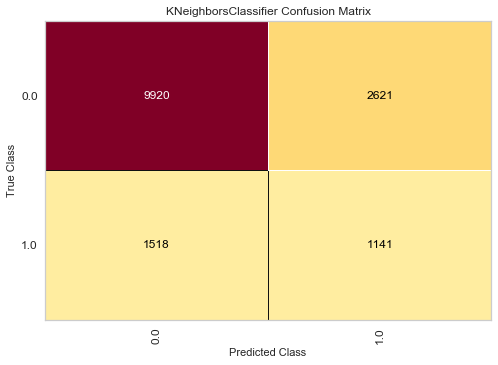

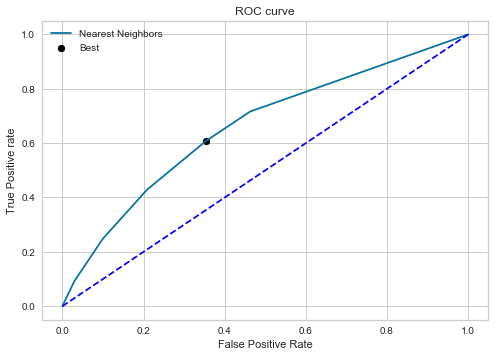

---------Decision Tree------------
Accuracy  (%): 
 75.4342105263158
Precision: 
 29.89150766928545
Recall (%): 
 30.048890560361034
f1 score (%): 
 29.969992498124533
logistic loss :
 8.484821677906625
              precision    recall  f1-score   support

         0.0       0.85      0.85      0.85     12541
         1.0       0.30      0.30      0.30      2659

    accuracy                           0.75     15200
   macro avg       0.58      0.58      0.58     15200
weighted avg       0.75      0.75      0.75     15200

AUC  (%): 
 57.55295177886484
Best Threshold=1.000000, G-Mean=0.506


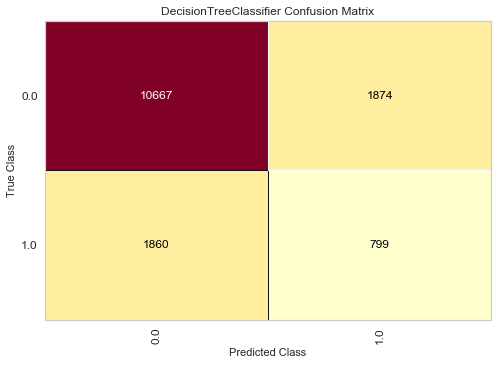

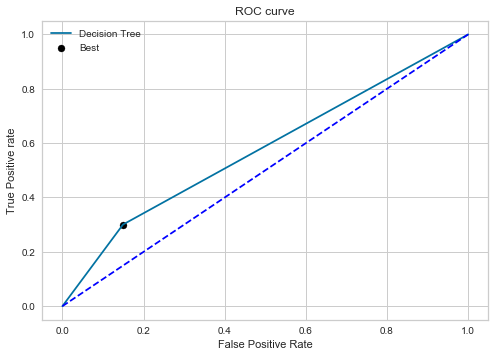

---------Naive Bayes------------
Accuracy  (%): 
 59.31578947368421
Precision: 
 26.787830896878706
Recall (%): 
 76.49492290334712
f1 score (%): 
 39.68006242684354
logistic loss :
 14.052120933436983
              precision    recall  f1-score   support

         0.0       0.92      0.56      0.69     12541
         1.0       0.27      0.76      0.40      2659

    accuracy                           0.59     15200
   macro avg       0.59      0.66      0.54     15200
weighted avg       0.80      0.59      0.64     15200

AUC  (%): 
 72.15216976620557
Best Threshold=0.609405, G-Mean=0.681


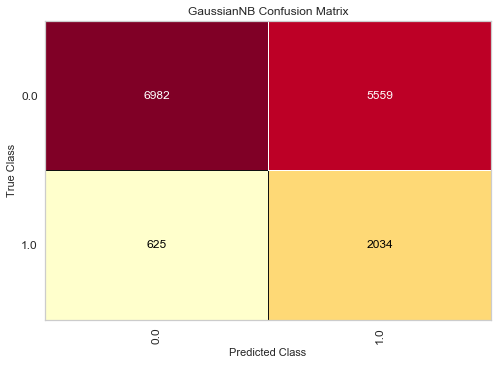

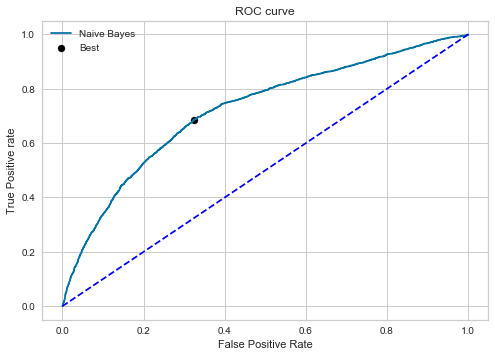

---------Random Forest------------
Accuracy  (%): 
 82.67105263157895
Precision: 
 51.06928999144568
Recall (%): 
 22.45204964272283
f1 score (%): 
 31.19122257053292
logistic loss :
 5.985236473284527
              precision    recall  f1-score   support

         0.0       0.85      0.95      0.90     12541
         1.0       0.51      0.22      0.31      2659

    accuracy                           0.83     15200
   macro avg       0.68      0.59      0.61     15200
weighted avg       0.79      0.83      0.80     15200

AUC  (%): 
 74.70349453866534
Best Threshold=0.230000, G-Mean=0.685


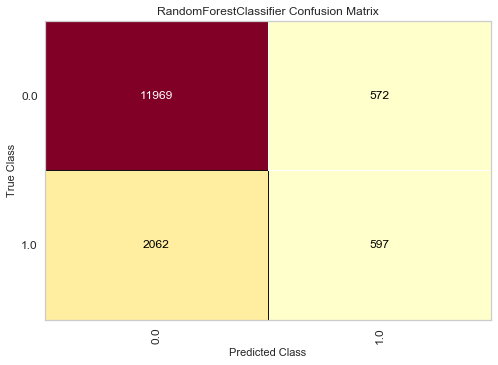

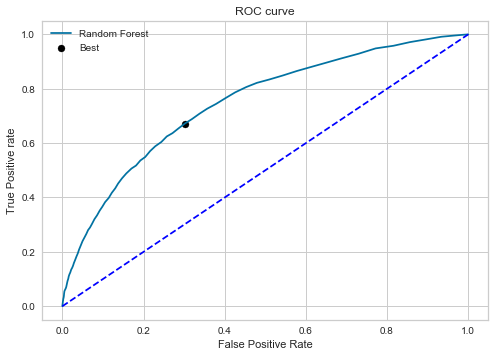

---------xgboost------------
Accuracy  (%): 
 79.71710526315789
Precision: 
 41.94528875379939
Recall (%): 
 41.51936818352765
f1 score (%): 
 41.73124173124174
logistic loss :
 7.005544040156774
              precision    recall  f1-score   support

         0.0       0.88      0.88      0.88     12541
         1.0       0.42      0.42      0.42      2659

    accuracy                           0.80     15200
   macro avg       0.65      0.65      0.65     15200
weighted avg       0.80      0.80      0.80     15200

AUC  (%): 
 75.01187455278315
Best Threshold=0.304942, G-Mean=0.690


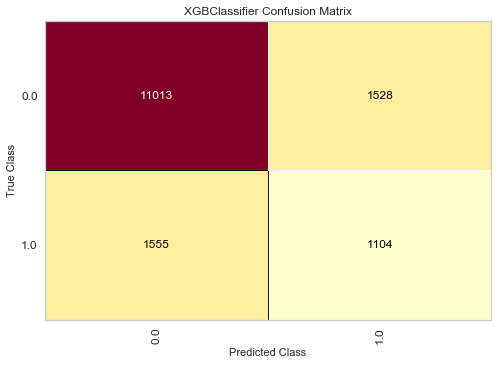

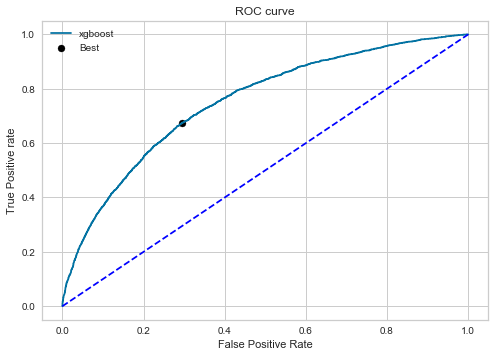

---------Ada Boost------------
Accuracy  (%): 
 79.5592105263158
Precision: 
 41.91919191919192
Recall (%): 
 43.700639338097034
f1 score (%): 
 42.7913828024305
logistic loss :
 7.060083263871718
              precision    recall  f1-score   support

         0.0       0.88      0.87      0.88     12541
         1.0       0.42      0.44      0.43      2659

    accuracy                           0.80     15200
   macro avg       0.65      0.65      0.65     15200
weighted avg       0.80      0.80      0.80     15200

AUC  (%): 
 75.20634612566307
Best Threshold=0.496523, G-Mean=0.688


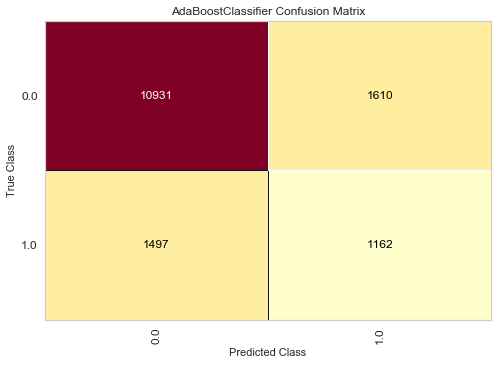

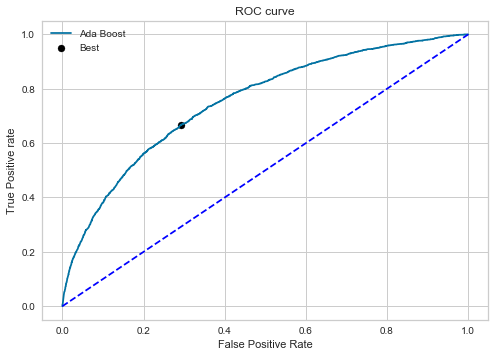

---------SVM------------
Accuracy  (%): 
 80.32236842105263
Precision: 
 43.25751421608449
Recall (%): 
 40.0526513726965
f1 score (%): 
 41.59343878148798
logistic loss :
 6.796486660183411
              precision    recall  f1-score   support

         0.0       0.87      0.89      0.88     12541
         1.0       0.43      0.40      0.42      2659

    accuracy                           0.80     15200
   macro avg       0.65      0.64      0.65     15200
weighted avg       0.80      0.80      0.80     15200

AUC score cannot be calculated for linear SVM


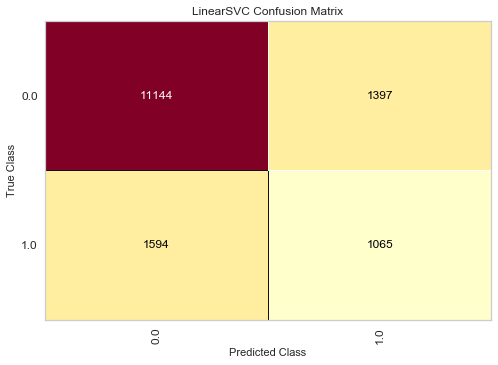

---------MLP Classifier------------
Accuracy  (%): 
 79.88815789473685
Precision: 
 42.737226277372265
Recall (%): 
 44.03911244828883
f1 score (%): 
 43.37840340803852
logistic loss :
 6.946466711026969
              precision    recall  f1-score   support

         0.0       0.88      0.87      0.88     12541
         1.0       0.43      0.44      0.43      2659

    accuracy                           0.80     15200
   macro avg       0.65      0.66      0.66     15200
weighted avg       0.80      0.80      0.80     15200

AUC  (%): 
 75.65192186926618
Best Threshold=0.345602, G-Mean=0.691


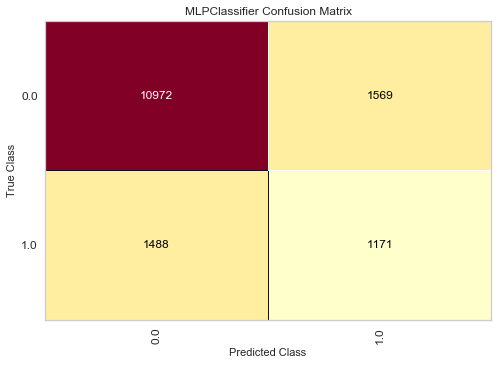

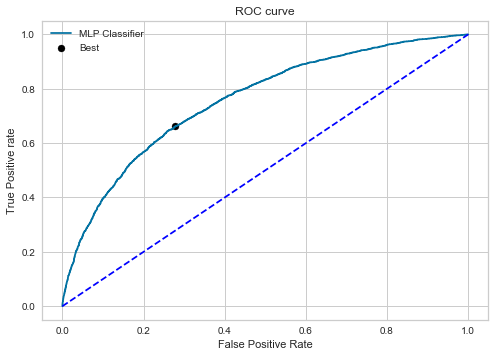

---------light Gradient Boosting------------
Accuracy  (%): 
 79.74342105263158
Precision: 
 42.57425742574257
Recall (%): 
 45.280180518992104
f1 score (%): 
 43.88554765810097
logistic loss :
 6.9964599385629365
              precision    recall  f1-score   support

         0.0       0.88      0.87      0.88     12541
         1.0       0.43      0.45      0.44      2659

    accuracy                           0.80     15200
   macro avg       0.65      0.66      0.66     15200
weighted avg       0.80      0.80      0.80     15200

AUC  (%): 
 76.29402637198804
Best Threshold=0.290004, G-Mean=0.697


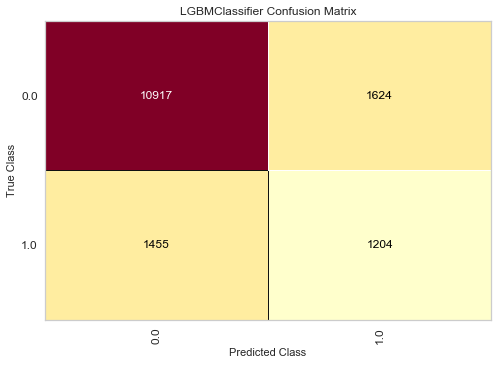

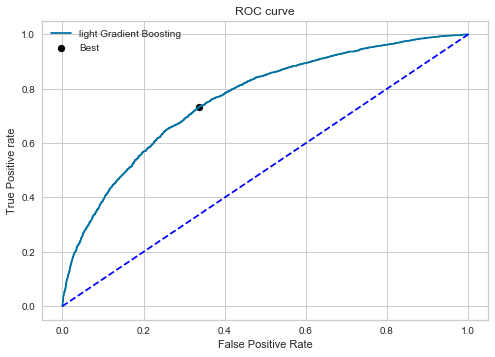

---------Gradient Boosting Classifier------------
Accuracy  (%): 
 79.94736842105263
Precision: 
 43.04612084376117
Recall (%): 
 45.280180518992104
f1 score (%): 
 44.13489736070381
logistic loss :
 6.926017382262767
              precision    recall  f1-score   support

         0.0       0.88      0.87      0.88     12541
         1.0       0.43      0.45      0.44      2659

    accuracy                           0.80     15200
   macro avg       0.66      0.66      0.66     15200
weighted avg       0.80      0.80      0.80     15200

AUC  (%): 
 76.19106659978513
Best Threshold=0.297826, G-Mean=0.696


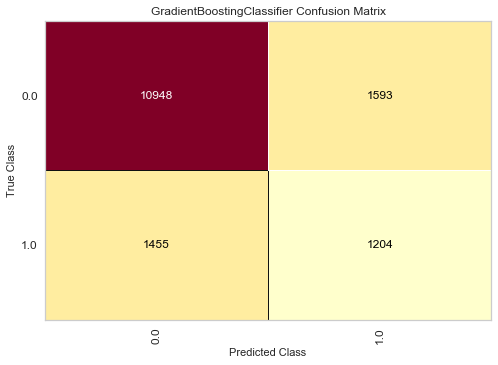

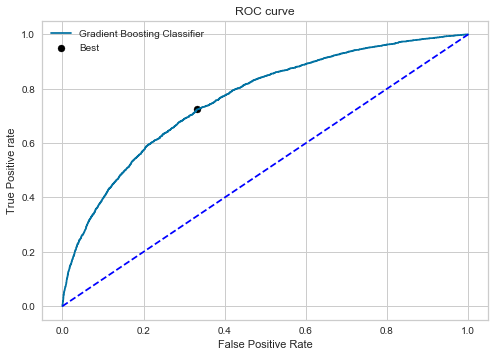

,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,42.558846,42.158706,0.748587,79.927632
1,Nearest Neighbors,30.329612,42.910869,0.658558,72.769737
2,Decision Tree,29.891508,30.048891,0.575530,75.434211
3,Naive Bayes,26.787831,76.494923,0.721522,59.315789
4,Random Forest,51.069290,22.452050,0.747035,82.671053
5,xgboost,41.945289,41.519368,0.750119,79.717105
6,Ada Boost,41.919192,43.700639,0.752063,79.559211
7,SVM,43.257514,40.052651,0.000000,80.322368
8,MLP Classifier,42.737226,44.039112,0.756519,79.888158
9,light Gradient Boosting,42.574257,45.280181,0.762940,79.743421


,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,42.558846,42.158706,0.748587,79.927632
1,Nearest Neighbors,30.329612,42.910869,0.658558,72.769737
2,Decision Tree,29.891508,30.048891,0.575530,75.434211
3,Naive Bayes,26.787831,76.494923,0.721522,59.315789
4,Random Forest,51.069290,22.452050,0.747035,82.671053
5,xgboost,41.945289,41.519368,0.750119,79.717105
6,Ada Boost,41.919192,43.700639,0.752063,79.559211
7,SVM,43.257514,40.052651,0.000000,80.322368
8,MLP Classifier,42.737226,44.039112,0.756519,79.888158
9,light Gradient Boosting,42.574257,45.280181,0.762940,79.743421


In [ ]:
t.fit_model_os(df4,'SoldFlag',ratio=0.5,classification=True,min_max=False,svm_type='Linear')

### ML algorithms with undersampling without Random Forest Feature Selection and Cross Validation

---------Logistic Regression------------
Accuracy  (%): 
 80.05263157894737
Precision: 
 42.74036590112885
Recall (%): 
 41.29371944339977
f1 score (%): 
 42.00459066564652
logistic loss :
 6.889654357709803
              precision    recall  f1-score   support

         0.0       0.88      0.88      0.88     12541
         1.0       0.43      0.41      0.42      2659

    accuracy                           0.80     15200
   macro avg       0.65      0.65      0.65     15200
weighted avg       0.80      0.80      0.80     15200

AUC  (%): 
 74.85744164180976
Best Threshold=0.311704, G-Mean=0.687


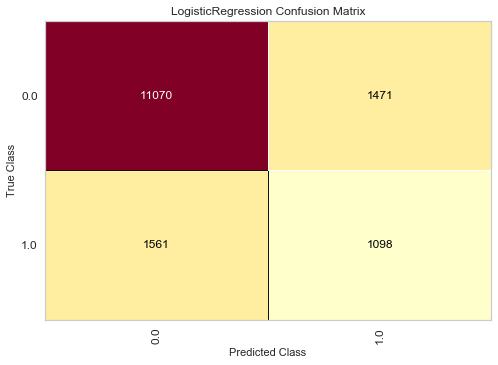

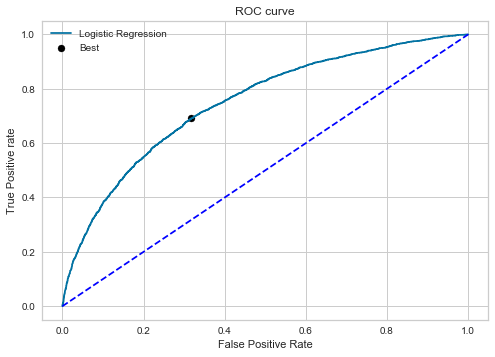

---------Nearest Neighbors------------
Accuracy  (%): 
 75.25657894736842
Precision: 
 33.85111371629543
Recall (%): 
 43.437382474614516
f1 score (%): 
 38.04974468786032
logistic loss :
 8.546193599517041
              precision    recall  f1-score   support

         0.0       0.87      0.82      0.85     12541
         1.0       0.34      0.43      0.38      2659

    accuracy                           0.75     15200
   macro avg       0.61      0.63      0.61     15200
weighted avg       0.78      0.75      0.76     15200

AUC  (%): 
 69.23855530467813
Best Threshold=0.400000, G-Mean=0.648


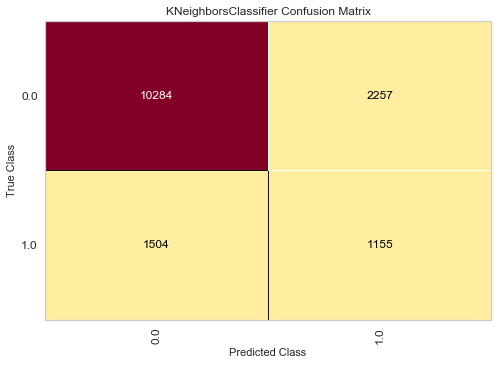

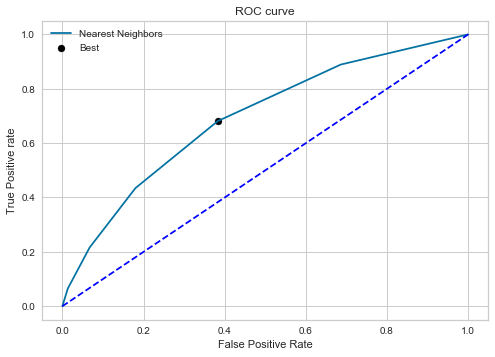

---------Decision Tree------------
Accuracy  (%): 
 67.5921052631579
Precision: 
 26.19197647553035
Recall (%): 
 46.89732982324182
f1 score (%): 
 33.611859838274924
logistic loss :
 11.19347515175656
              precision    recall  f1-score   support

         0.0       0.86      0.72      0.79     12541
         1.0       0.26      0.47      0.34      2659

    accuracy                           0.68     15200
   macro avg       0.56      0.59      0.56     15200
weighted avg       0.76      0.68      0.71     15200

AUC  (%): 
 59.43861786593077
Best Threshold=1.000000, G-Mean=0.581


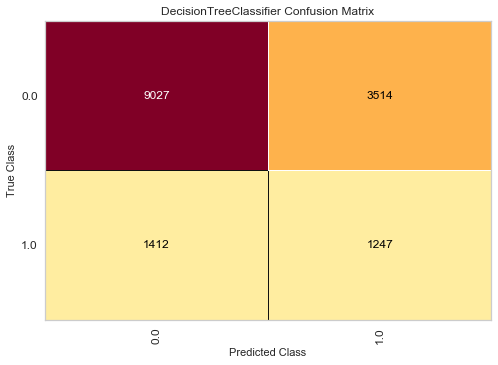

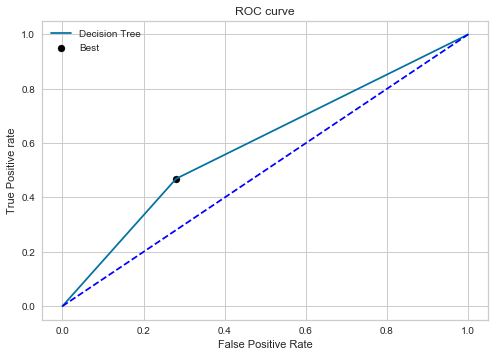

---------Naive Bayes------------
Accuracy  (%): 
 66.88815789473685
Precision: 
 30.50262812089356
Recall (%): 
 69.83828506957502
f1 score (%): 
 42.46027209328913
logistic loss :
 11.436647677125828
              precision    recall  f1-score   support

         0.0       0.91      0.66      0.77     12541
         1.0       0.31      0.70      0.42      2659

    accuracy                           0.67     15200
   macro avg       0.61      0.68      0.60     15200
weighted avg       0.81      0.67      0.71     15200

AUC  (%): 
 72.2236764802947
Best Threshold=0.513186, G-Mean=0.681


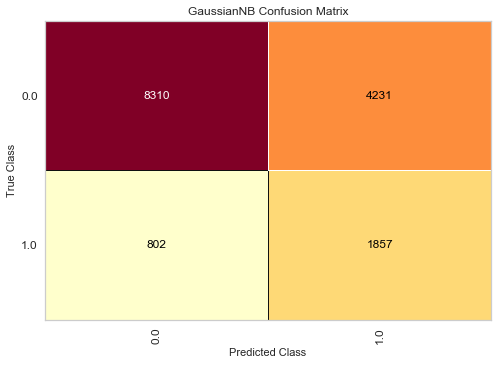

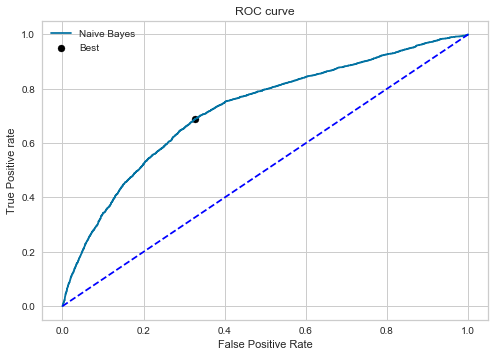

---------Random Forest------------
Accuracy  (%): 
 79.05263157894737
Precision: 
 40.492575153929735
Recall (%): 
 42.04588191049267
f1 score (%): 
 41.254612546125465
logistic loss :
 7.235051169735094
              precision    recall  f1-score   support

         0.0       0.88      0.87      0.87     12541
         1.0       0.40      0.42      0.41      2659

    accuracy                           0.79     15200
   macro avg       0.64      0.64      0.64     15200
weighted avg       0.79      0.79      0.79     15200

AUC  (%): 
 75.1629352976843
Best Threshold=0.340000, G-Mean=0.691


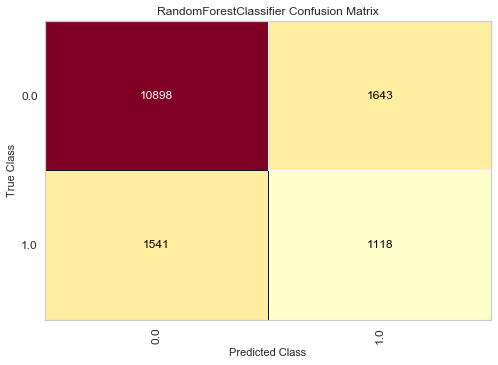

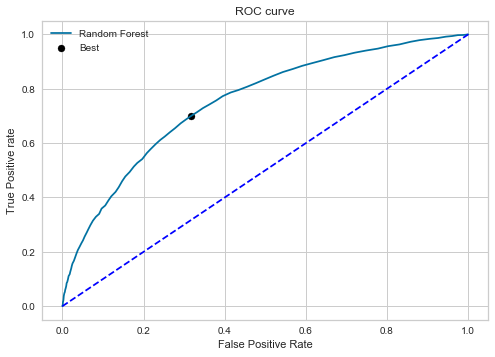

---------xgboost------------
Accuracy  (%): 
 78.92763157894737
Precision: 
 40.516039051603904
Recall (%): 
 43.700639338097034
f1 score (%): 
 42.04812737470599
logistic loss :
 7.27822795434966
              precision    recall  f1-score   support

         0.0       0.88      0.86      0.87     12541
         1.0       0.41      0.44      0.42      2659

    accuracy                           0.79     15200
   macro avg       0.64      0.65      0.65     15200
weighted avg       0.80      0.79      0.79     15200

AUC  (%): 
 75.12157565831683
Best Threshold=0.304192, G-Mean=0.689


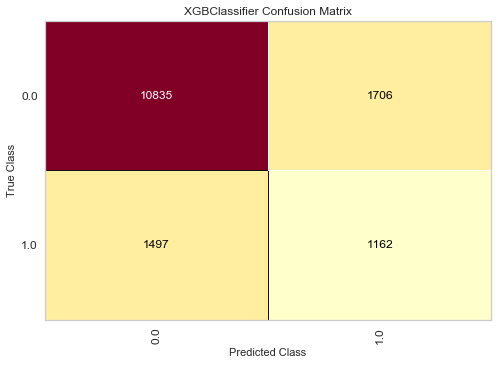

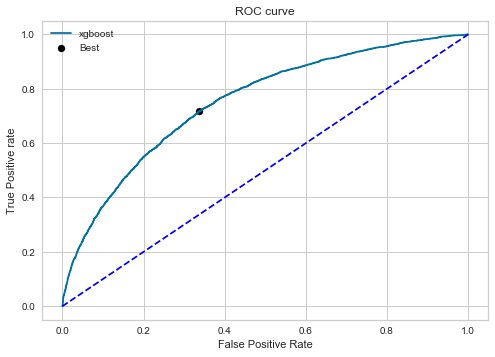

---------Ada Boost------------
Accuracy  (%): 
 79.83552631578948
Precision: 
 42.49260355029586
Recall (%): 
 43.21173373448665
f1 score (%): 
 42.84915159425695
logistic loss :
 6.964644277921395
              precision    recall  f1-score   support

         0.0       0.88      0.88      0.88     12541
         1.0       0.42      0.43      0.43      2659

    accuracy                           0.80     15200
   macro avg       0.65      0.65      0.65     15200
weighted avg       0.80      0.80      0.80     15200

AUC  (%): 
 75.33365326677726
Best Threshold=0.496083, G-Mean=0.689


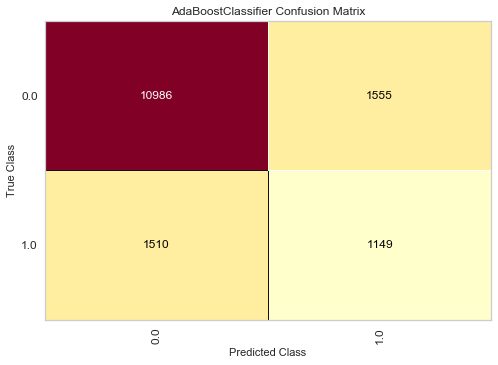

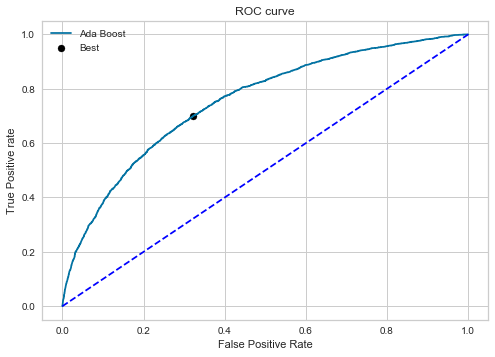

---------SVM------------
Accuracy  (%): 
 80.43421052631578
Precision: 
 43.526510480887794
Recall (%): 
 39.827002632568636
f1 score (%): 
 41.59465828750982
logistic loss :
 6.757856555614043
              precision    recall  f1-score   support

         0.0       0.87      0.89      0.88     12541
         1.0       0.44      0.40      0.42      2659

    accuracy                           0.80     15200
   macro avg       0.65      0.64      0.65     15200
weighted avg       0.80      0.80      0.80     15200

AUC score cannot be calculated for linear SVM


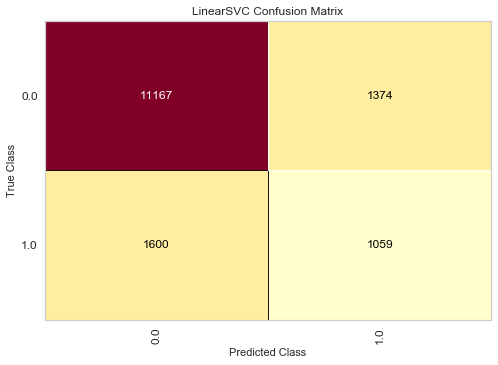

---------MLP Classifier------------
Accuracy  (%): 
 79.40131578947368
Precision: 
 41.607396870554766
Recall (%): 
 44.00150432493419
f1 score (%): 
 42.7709742277463
logistic loss :
 7.114619857331956
              precision    recall  f1-score   support

         0.0       0.88      0.87      0.87     12541
         1.0       0.42      0.44      0.43      2659

    accuracy                           0.79     15200
   macro avg       0.65      0.65      0.65     15200
weighted avg       0.80      0.79      0.80     15200

AUC  (%): 
 75.33620525728637
Best Threshold=0.332266, G-Mean=0.690


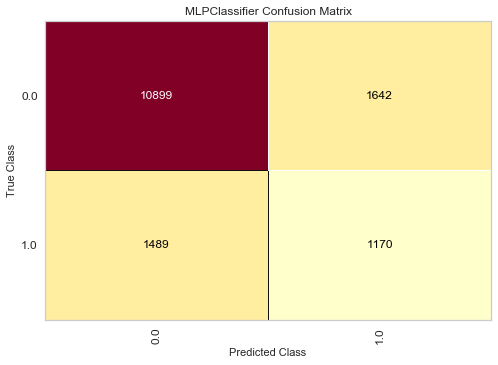

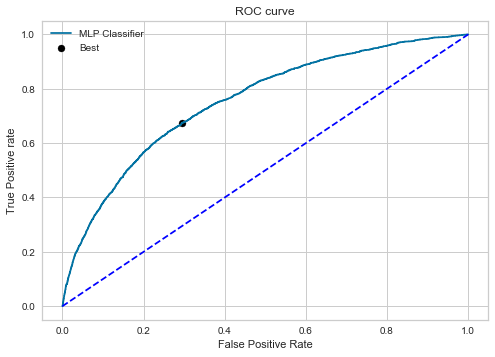

---------light Gradient Boosting------------
Accuracy  (%): 
 79.66447368421052
Precision: 
 42.367491166077734
Recall (%): 
 45.09213990221888
f1 score (%): 
 43.687374749499
logistic loss :
 7.0237277618472085
              precision    recall  f1-score   support

         0.0       0.88      0.87      0.88     12541
         1.0       0.42      0.45      0.44      2659

    accuracy                           0.80     15200
   macro avg       0.65      0.66      0.66     15200
weighted avg       0.80      0.80      0.80     15200

AUC  (%): 
 76.31418589748453
Best Threshold=0.346869, G-Mean=0.695


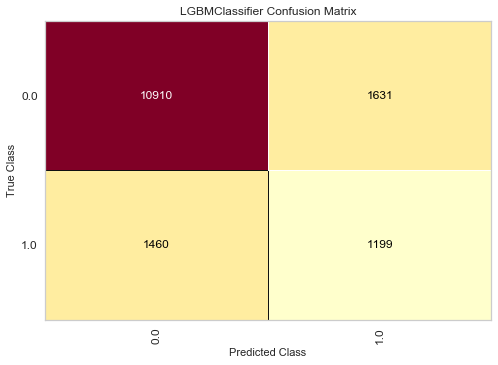

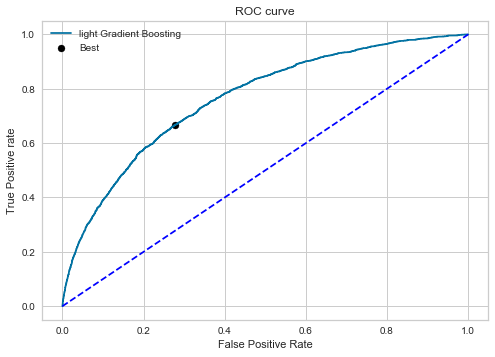

---------Gradient Boosting Classifier------------
Accuracy  (%): 
 80.23026315789473
Precision: 
 43.587842846553
Recall (%): 
 44.227153065062055
f1 score (%): 
 43.905170804554785
logistic loss :
 6.828305266710221
              precision    recall  f1-score   support

         0.0       0.88      0.88      0.88     12541
         1.0       0.44      0.44      0.44      2659

    accuracy                           0.80     15200
   macro avg       0.66      0.66      0.66     15200
weighted avg       0.80      0.80      0.80     15200

AUC  (%): 
 76.08842770065446
Best Threshold=0.329226, G-Mean=0.695


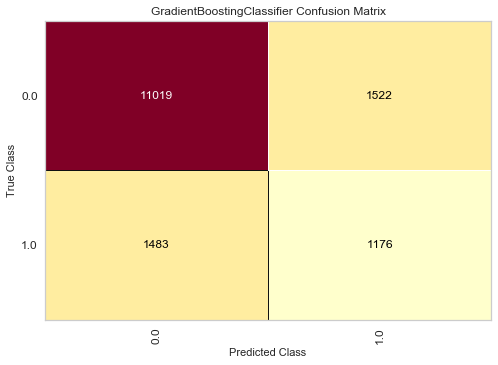

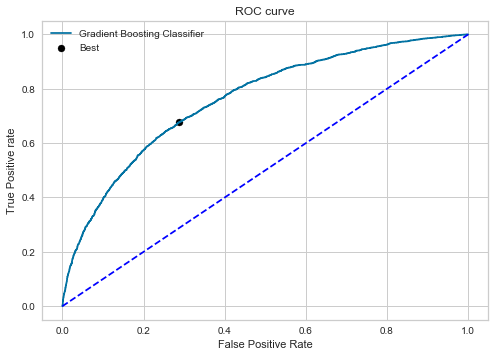

,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,42.740366,41.293719,0.748574,80.052632
1,Nearest Neighbors,33.851114,43.437382,0.692386,75.256579
2,Decision Tree,26.191976,46.897330,0.594386,67.592105
3,Naive Bayes,30.502628,69.838285,0.722237,66.888158
4,Random Forest,40.492575,42.045882,0.751629,79.052632
5,xgboost,40.516039,43.700639,0.751216,78.927632
6,Ada Boost,42.492604,43.211734,0.753337,79.835526
7,SVM,43.526510,39.827003,0.000000,80.434211
8,MLP Classifier,41.607397,44.001504,0.753362,79.401316
9,light Gradient Boosting,42.367491,45.092140,0.763142,79.664474


,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,42.740366,41.293719,0.748574,80.052632
1,Nearest Neighbors,33.851114,43.437382,0.692386,75.256579
2,Decision Tree,26.191976,46.897330,0.594386,67.592105
3,Naive Bayes,30.502628,69.838285,0.722237,66.888158
4,Random Forest,40.492575,42.045882,0.751629,79.052632
5,xgboost,40.516039,43.700639,0.751216,78.927632
6,Ada Boost,42.492604,43.211734,0.753337,79.835526
7,SVM,43.526510,39.827003,0.000000,80.434211
8,MLP Classifier,41.607397,44.001504,0.753362,79.401316
9,light Gradient Boosting,42.367491,45.092140,0.763142,79.664474


In [ ]:
t.fit_model_us(df4,'SoldFlag',ratio=0.5,classification=True,min_max=False,svm_type='Linear')

### ML algorithms with oversampling and Random Forest Feature Selection

StrengthFactor    17.782324
ItemCount         16.243591
LowUserPrice      15.420704
PriceReg          14.968724
LowNetPrice       14.785930
ReleaseYear        9.002418
ReleaseNumber      7.803417
MarketingType      3.992893
dtype: float64
Selected Features =['StrengthFactor', 'ItemCount', 'LowUserPrice', 'PriceReg', 'LowNetPrice', 'ReleaseYear', 'ReleaseNumber']
---------Logistic Regression------------
Accuracy  (%): 
 81.51315789473685
Precision: 
 44.90209318028359
Recall (%): 
 25.00940203083866
f1 score (%): 
 32.1256038647343
logistic loss :
 6.38517198297382
              precision    recall  f1-score   support

         0.0       0.85      0.93      0.89     12541
         1.0       0.45      0.25      0.32      2659

    accuracy                           0.82     15200
   macro avg       0.65      0.59      0.61     15200
weighted avg       0.78      0.82      0.79     15200

AUC  (%): 
 70.73398875606776
Best Threshold=0.324385, G-Mean=0.658


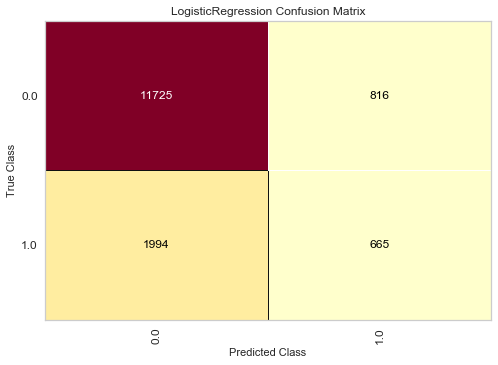

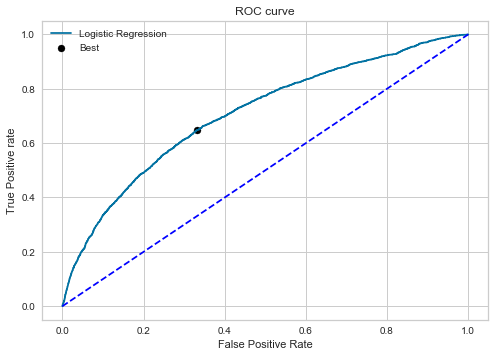

---------Nearest Neighbors------------
Accuracy  (%): 
 71.69078947368422
Precision: 
 28.413865546218485
Recall (%): 
 40.691989469725456
f1 score (%): 
 33.4621926704809
logistic loss :
 9.777798324335224
              precision    recall  f1-score   support

         0.0       0.86      0.78      0.82     12541
         1.0       0.28      0.41      0.33      2659

    accuracy                           0.72     15200
   macro avg       0.57      0.59      0.58     15200
weighted avg       0.76      0.72      0.74     15200

AUC  (%): 
 63.34102219185157
Best Threshold=0.400000, G-Mean=0.603


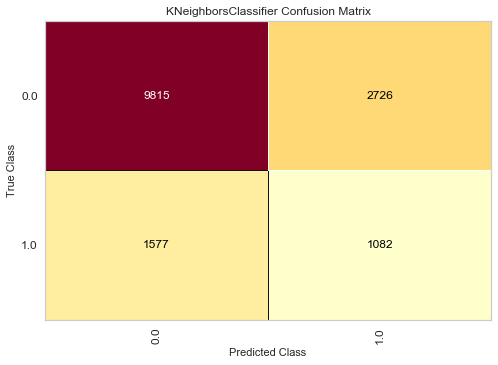

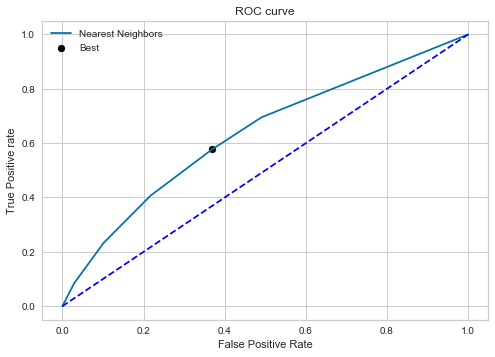

---------Decision Tree------------
Accuracy  (%): 
 74.52631578947368
Precision: 
 27.856882073749546
Recall (%): 
 28.694998119593834
f1 score (%): 
 28.26972952945535
logistic loss :
 8.798402776685277
              precision    recall  f1-score   support

         0.0       0.85      0.84      0.85     12541
         1.0       0.28      0.29      0.28      2659

    accuracy                           0.75     15200
   macro avg       0.56      0.56      0.56     15200
weighted avg       0.75      0.75      0.75     15200

AUC  (%): 
 56.469339423404286
Best Threshold=1.000000, G-Mean=0.492


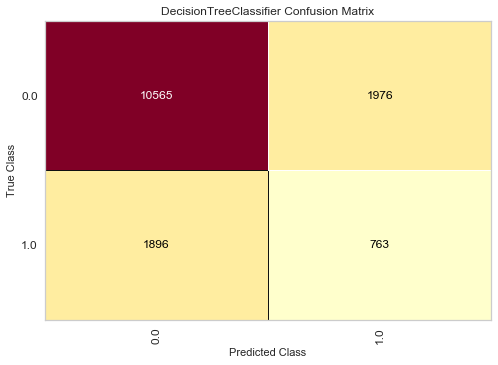

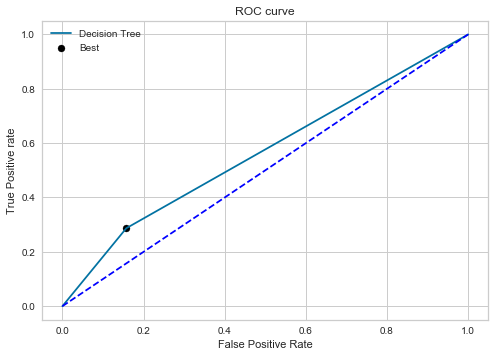

---------Naive Bayes------------
Accuracy  (%): 
 42.76973684210526
Precision: 
 21.083875909613177
Recall (%): 
 82.81308762692741
f1 score (%): 
 33.61062352133099
logistic loss :
 19.767066193509716
              precision    recall  f1-score   support

         0.0       0.90      0.34      0.50     12541
         1.0       0.21      0.83      0.34      2659

    accuracy                           0.43     15200
   macro avg       0.56      0.59      0.42     15200
weighted avg       0.78      0.43      0.47     15200

AUC  (%): 
 67.9061838508541
Best Threshold=0.692532, G-Mean=0.639


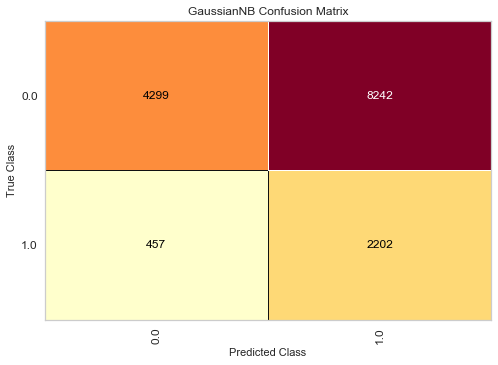

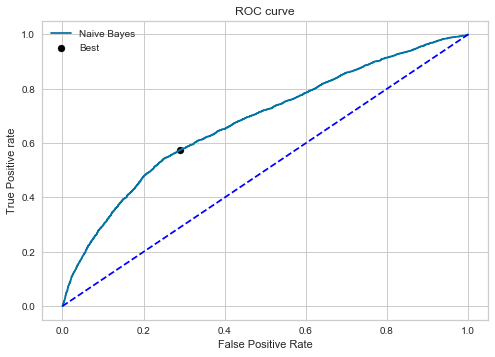

---------Random Forest------------
Accuracy  (%): 
 82.46052631578948
Precision: 
 49.6417604912999
Recall (%): 
 18.239939827002633
f1 score (%): 
 26.67766776677668
logistic loss :
 6.0579454783399695
              precision    recall  f1-score   support

         0.0       0.85      0.96      0.90     12541
         1.0       0.50      0.18      0.27      2659

    accuracy                           0.82     15200
   macro avg       0.67      0.57      0.58     15200
weighted avg       0.79      0.82      0.79     15200

AUC  (%): 
 71.72626474145622
Best Threshold=0.220000, G-Mean=0.663


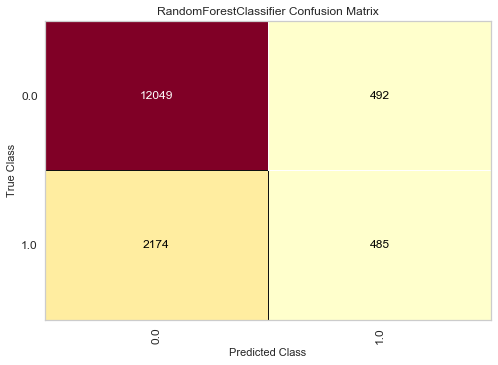

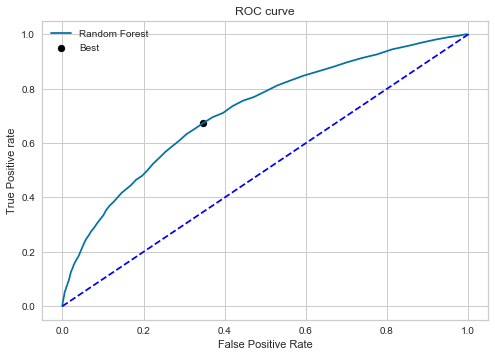

---------xgboost------------
Accuracy  (%): 
 79.72368421052632
Precision: 
 41.07971320118094
Recall (%): 
 36.630312147423844
f1 score (%): 
 38.72763419483101
logistic loss :
 7.003264860968731
              precision    recall  f1-score   support

         0.0       0.87      0.89      0.88     12541
         1.0       0.41      0.37      0.39      2659

    accuracy                           0.80     15200
   macro avg       0.64      0.63      0.63     15200
weighted avg       0.79      0.80      0.79     15200

AUC  (%): 
 72.40768669137549
Best Threshold=0.280811, G-Mean=0.666


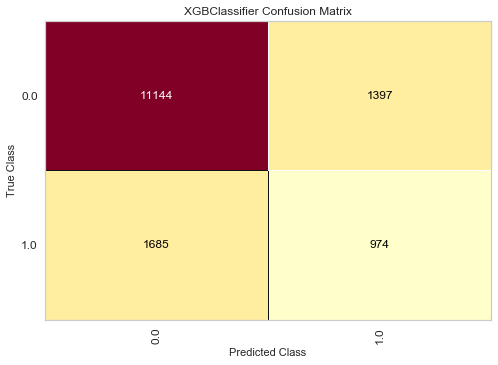

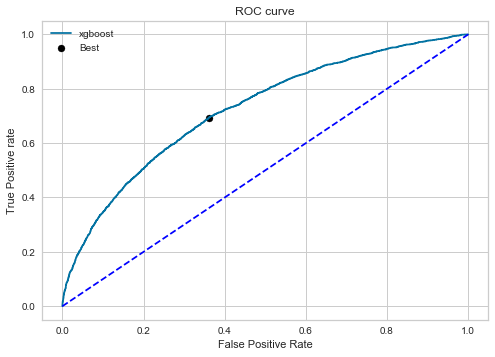

---------Ada Boost------------
Accuracy  (%): 
 79.75657894736841
Precision: 
 40.9366869037294
Recall (%): 
 35.502068446784506
f1 score (%): 
 38.02618328298087
logistic loss :
 6.991901580186848
              precision    recall  f1-score   support

         0.0       0.87      0.89      0.88     12541
         1.0       0.41      0.36      0.38      2659

    accuracy                           0.80     15200
   macro avg       0.64      0.62      0.63     15200
weighted avg       0.79      0.80      0.79     15200

AUC  (%): 
 71.99396284811617
Best Threshold=0.496480, G-Mean=0.668


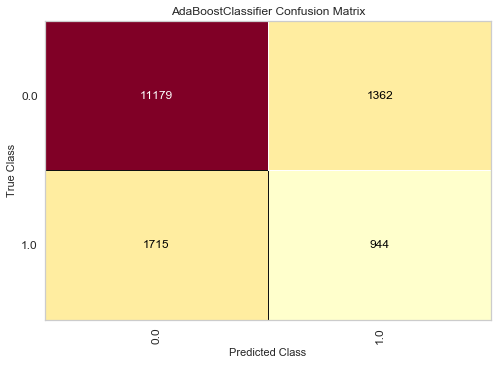

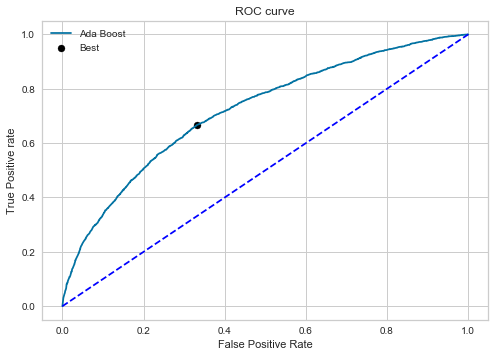

---------SVM------------
Accuracy  (%): 
 81.6907894736842
Precision: 
 45.25267993874426
Recall (%): 
 22.22640090259496
f1 score (%): 
 29.810844892812106
logistic loss :
 6.323814895999935
              precision    recall  f1-score   support

         0.0       0.85      0.94      0.89     12541
         1.0       0.45      0.22      0.30      2659

    accuracy                           0.82     15200
   macro avg       0.65      0.58      0.60     15200
weighted avg       0.78      0.82      0.79     15200

AUC score cannot be calculated for linear SVM


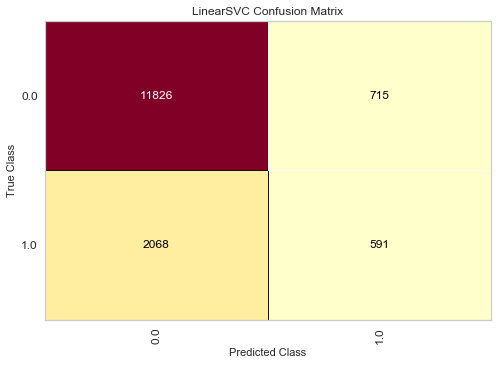

---------MLP Classifier------------
Accuracy  (%): 
 80.26973684210526
Precision: 
 42.23744292237443
Recall (%): 
 34.787514103046256
f1 score (%): 
 38.152196329140025
logistic loss :
 6.814658019676733
              precision    recall  f1-score   support

         0.0       0.87      0.90      0.88     12541
         1.0       0.42      0.35      0.38      2659

    accuracy                           0.80     15200
   macro avg       0.64      0.62      0.63     15200
weighted avg       0.79      0.80      0.79     15200

AUC  (%): 
 71.55958617449696
Best Threshold=0.339249, G-Mean=0.661


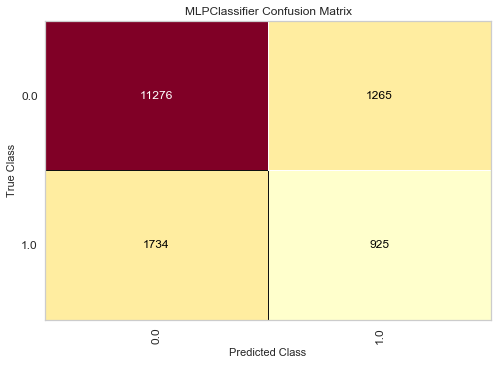

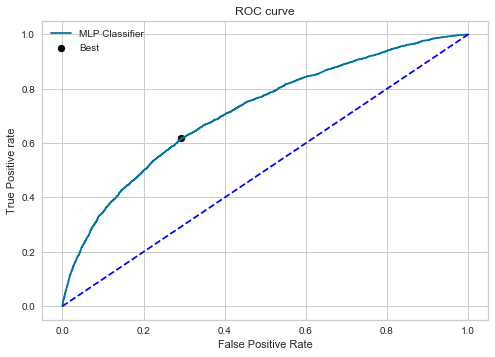

---------light Gradient Boosting------------
Accuracy  (%): 
 79.98026315789474
Precision: 
 42.01995012468828
Recall (%): 
 38.02181271154569
f1 score (%): 
 39.92102665350444
logistic loss :
 6.914645526850548
              precision    recall  f1-score   support

         0.0       0.87      0.89      0.88     12541
         1.0       0.42      0.38      0.40      2659

    accuracy                           0.80     15200
   macro avg       0.65      0.63      0.64     15200
weighted avg       0.79      0.80      0.80     15200

AUC  (%): 
 73.34592255341555
Best Threshold=0.327365, G-Mean=0.673


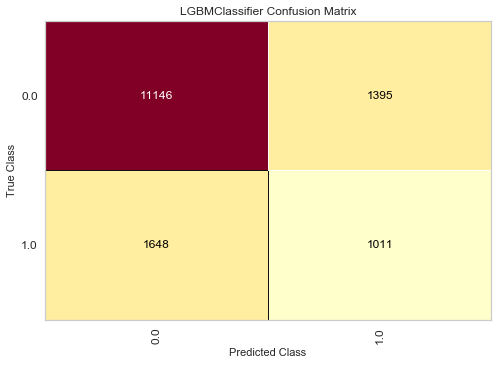

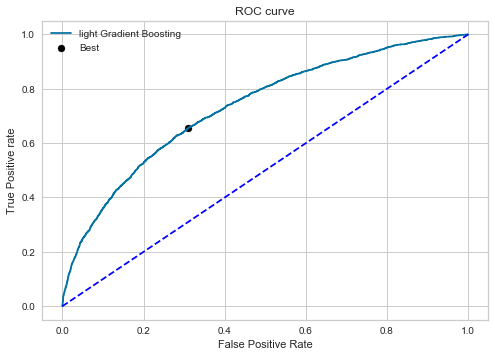

---------Gradient Boosting Classifier------------
Accuracy  (%): 
 79.96052631578947
Precision: 
 41.81125687685146
Recall (%): 
 37.156825874388865
f1 score (%): 
 39.34687375547591
logistic loss :
 6.92146133851082
              precision    recall  f1-score   support

         0.0       0.87      0.89      0.88     12541
         1.0       0.42      0.37      0.39      2659

    accuracy                           0.80     15200
   macro avg       0.64      0.63      0.64     15200
weighted avg       0.79      0.80      0.79     15200

AUC  (%): 
 73.04149347642553
Best Threshold=0.317409, G-Mean=0.670


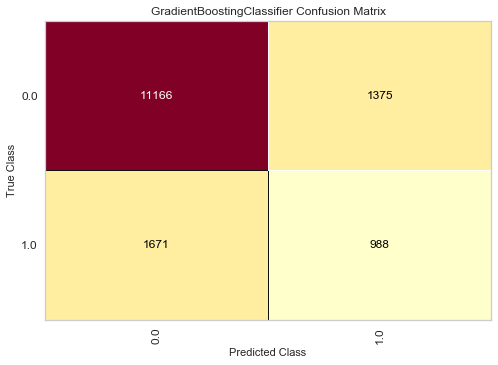

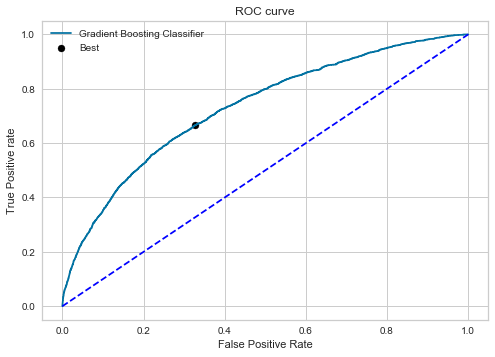

,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,44.902093,25.009402,0.707340,81.513158
1,Nearest Neighbors,28.413866,40.691989,0.633410,71.690789
2,Decision Tree,27.856882,28.694998,0.564693,74.526316
3,Naive Bayes,21.083876,82.813088,0.679062,42.769737
4,Random Forest,49.641760,18.239940,0.717263,82.460526
5,xgboost,41.079713,36.630312,0.724077,79.723684
6,Ada Boost,40.936687,35.502068,0.719940,79.756579
7,SVM,45.252680,22.226401,0.000000,81.690789
8,MLP Classifier,42.237443,34.787514,0.715596,80.269737
9,light Gradient Boosting,42.019950,38.021813,0.733459,79.980263


,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,44.902093,25.009402,0.707340,81.513158
1,Nearest Neighbors,28.413866,40.691989,0.633410,71.690789
2,Decision Tree,27.856882,28.694998,0.564693,74.526316
3,Naive Bayes,21.083876,82.813088,0.679062,42.769737
4,Random Forest,49.641760,18.239940,0.717263,82.460526
5,xgboost,41.079713,36.630312,0.724077,79.723684
6,Ada Boost,40.936687,35.502068,0.719940,79.756579
7,SVM,45.252680,22.226401,0.000000,81.690789
8,MLP Classifier,42.237443,34.787514,0.715596,80.269737
9,light Gradient Boosting,42.019950,38.021813,0.733459,79.980263


In [ ]:
t.fit_model_RFS_os(df4,'SoldFlag',ratio=0.5,threshold=5,classification=True,min_max=False,svm_type='Linear')

### ML algorithms with undersampling and Random Forest Feature Selection

StrengthFactor    18.048257
ItemCount         15.989697
LowUserPrice      15.344453
LowNetPrice       14.991043
PriceReg          14.904001
ReleaseYear        8.953707
ReleaseNumber      7.705932
MarketingType      4.062909
dtype: float64
Selected Features =['StrengthFactor', 'ItemCount', 'LowUserPrice', 'LowNetPrice', 'PriceReg', 'ReleaseYear', 'ReleaseNumber']
---------Logistic Regression------------
Accuracy  (%): 
 81.46052631578947
Precision: 
 44.56596035543404
Recall (%): 
 24.52049642722828
f1 score (%): 
 31.63512857836002
logistic loss :
 6.403350023314092
              precision    recall  f1-score   support

         0.0       0.85      0.94      0.89     12541
         1.0       0.45      0.25      0.32      2659

    accuracy                           0.81     15200
   macro avg       0.65      0.59      0.60     15200
weighted avg       0.78      0.81      0.79     15200

AUC  (%): 
 70.61773374306325
Best Threshold=0.318838, G-Mean=0.657


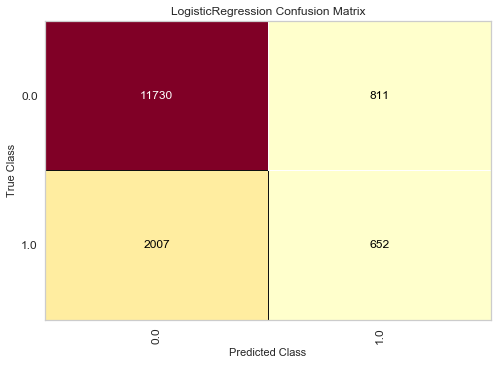

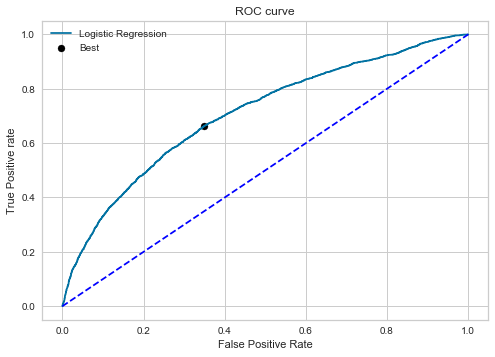

---------Nearest Neighbors------------
Accuracy  (%): 
 73.98684210526316
Precision: 
 31.11694371536891
Recall (%): 
 40.12786761940579
f1 score (%): 
 35.05256241787122
logistic loss :
 8.984750691750458
              precision    recall  f1-score   support

         0.0       0.86      0.81      0.84     12541
         1.0       0.31      0.40      0.35      2659

    accuracy                           0.74     15200
   macro avg       0.59      0.61      0.59     15200
weighted avg       0.77      0.74      0.75     15200

AUC  (%): 
 65.73652260375363
Best Threshold=0.400000, G-Mean=0.622


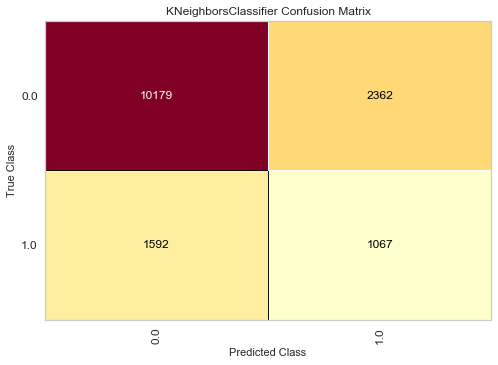

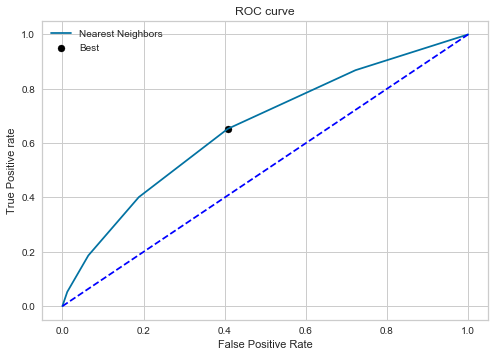

---------Decision Tree------------
Accuracy  (%): 
 67.34868421052632
Precision: 
 25.757575757575758
Recall (%): 
 46.032342986085
f1 score (%): 
 33.031979489947375
logistic loss :
 11.277550541294437
              precision    recall  f1-score   support

         0.0       0.86      0.72      0.78     12541
         1.0       0.26      0.46      0.33      2659

    accuracy                           0.67     15200
   macro avg       0.56      0.59      0.56     15200
weighted avg       0.76      0.67      0.70     15200

AUC  (%): 
 58.950307526851596
Best Threshold=1.000000, G-Mean=0.575


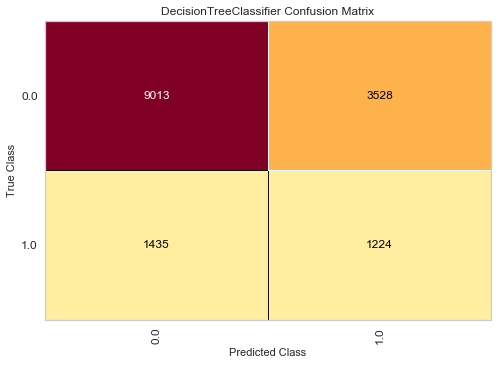

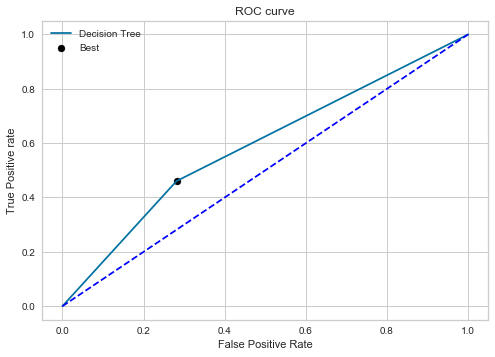

---------Naive Bayes------------
Accuracy  (%): 
 39.76315789473684
Precision: 
 20.593826378202227
Recall (%): 
 85.55848063181647
f1 score (%): 
 33.19713993871297
logistic loss :
 20.805529653977622
              precision    recall  f1-score   support

         0.0       0.91      0.30      0.45     12541
         1.0       0.21      0.86      0.33      2659

    accuracy                           0.40     15200
   macro avg       0.56      0.58      0.39     15200
weighted avg       0.78      0.40      0.43     15200

AUC  (%): 
 67.8668304178916
Best Threshold=0.734190, G-Mean=0.639


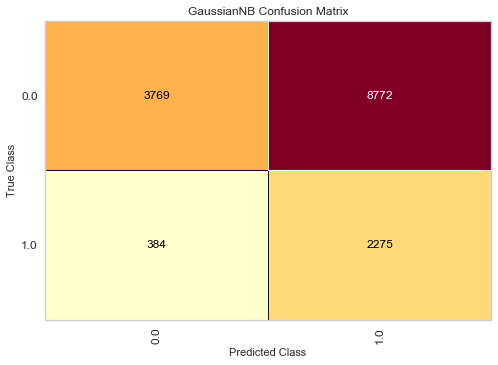

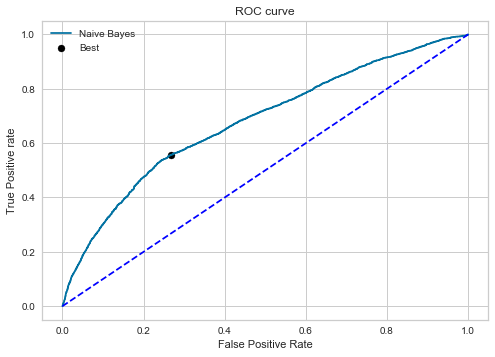

---------Random Forest------------
Accuracy  (%): 
 78.9671052631579
Precision: 
 39.62191358024691
Recall (%): 
 38.62354268522001
f1 score (%): 
 39.11635878880213
logistic loss :
 7.264586809507086
              precision    recall  f1-score   support

         0.0       0.87      0.88      0.87     12541
         1.0       0.40      0.39      0.39      2659

    accuracy                           0.79     15200
   macro avg       0.63      0.63      0.63     15200
weighted avg       0.79      0.79      0.79     15200

AUC  (%): 
 71.9408838445776
Best Threshold=0.340000, G-Mean=0.667


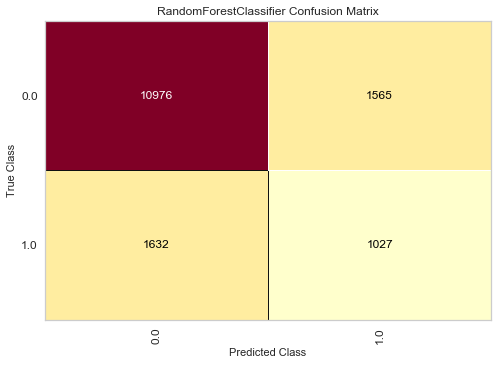

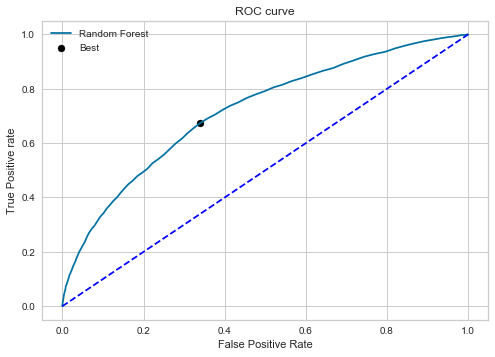

---------xgboost------------
Accuracy  (%): 
 78.44736842105263
Precision: 
 38.76138433515482
Recall (%): 
 40.01504324934186
f1 score (%): 
 39.37823834196891
logistic loss :
 7.444103657434708
              precision    recall  f1-score   support

         0.0       0.87      0.87      0.87     12541
         1.0       0.39      0.40      0.39      2659

    accuracy                           0.78     15200
   macro avg       0.63      0.63      0.63     15200
weighted avg       0.79      0.78      0.79     15200

AUC  (%): 
 72.18510123950269
Best Threshold=0.299574, G-Mean=0.665


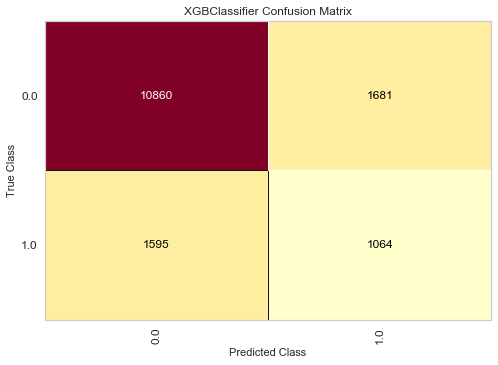

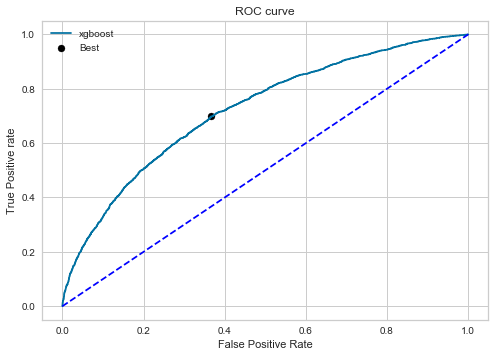

---------Ada Boost------------
Accuracy  (%): 
 79.86842105263158
Precision: 
 41.50063586265367
Recall (%): 
 36.818352764197066
f1 score (%): 
 39.01952969310482
logistic loss :
 6.95327363242634
              precision    recall  f1-score   support

         0.0       0.87      0.89      0.88     12541
         1.0       0.42      0.37      0.39      2659

    accuracy                           0.80     15200
   macro avg       0.64      0.63      0.63     15200
weighted avg       0.79      0.80      0.79     15200

AUC  (%): 
 71.82920052314905
Best Threshold=0.496800, G-Mean=0.662


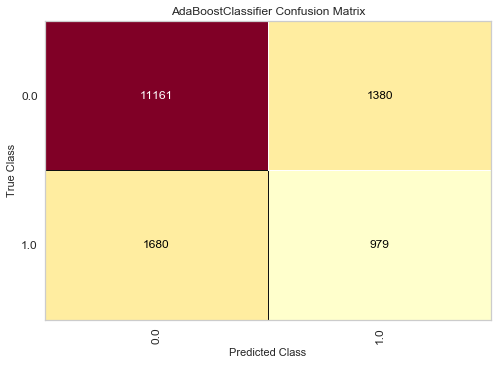

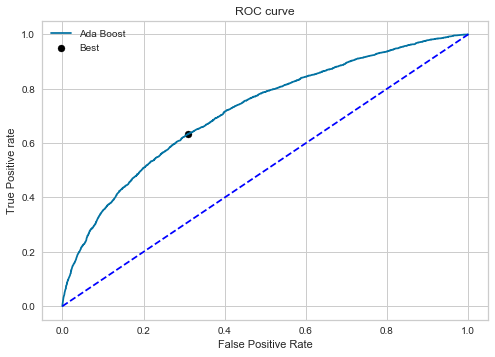

---------SVM------------
Accuracy  (%): 
 81.69736842105263
Precision: 
 45.3514739229025
Recall (%): 
 22.564874012786763
f1 score (%): 
 30.135610246107486
logistic loss :
 6.3215430289199706
              precision    recall  f1-score   support

         0.0       0.85      0.94      0.89     12541
         1.0       0.45      0.23      0.30      2659

    accuracy                           0.82     15200
   macro avg       0.65      0.58      0.60     15200
weighted avg       0.78      0.82      0.79     15200

AUC score cannot be calculated for linear SVM


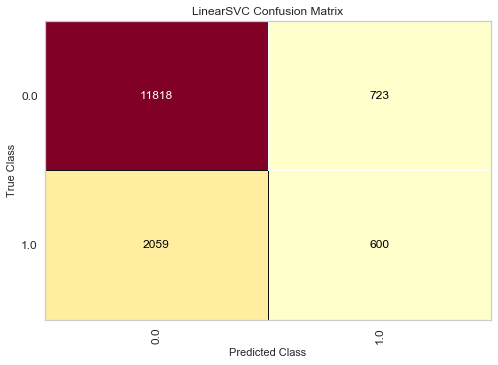

---------MLP Classifier------------
Accuracy  (%): 
 80.41447368421053
Precision: 
 42.857142857142854
Recall (%): 
 35.87814968033095
f1 score (%): 
 39.058341862845445
logistic loss :
 6.7646680536565995
              precision    recall  f1-score   support

         0.0       0.87      0.90      0.88     12541
         1.0       0.43      0.36      0.39      2659

    accuracy                           0.80     15200
   macro avg       0.65      0.63      0.64     15200
weighted avg       0.79      0.80      0.80     15200

AUC  (%): 
 72.20836303783312
Best Threshold=0.346709, G-Mean=0.665


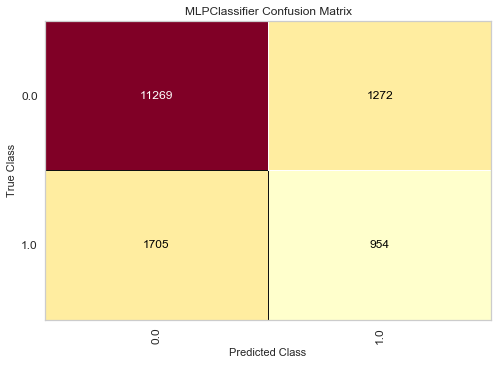

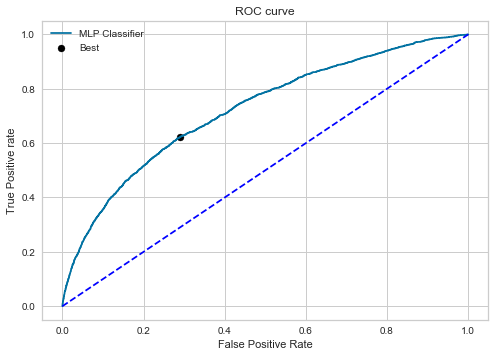

---------light Gradient Boosting------------
Accuracy  (%): 
 79.53947368421052
Precision: 
 41.10453648915187
Recall (%): 
 39.18766453553968
f1 score (%): 
 40.12321909896034
logistic loss :
 7.066893972837863
              precision    recall  f1-score   support

         0.0       0.87      0.88      0.88     12541
         1.0       0.41      0.39      0.40      2659

    accuracy                           0.80     15200
   macro avg       0.64      0.64      0.64     15200
weighted avg       0.79      0.80      0.79     15200

AUC  (%): 
 73.41029808838518
Best Threshold=0.340124, G-Mean=0.671


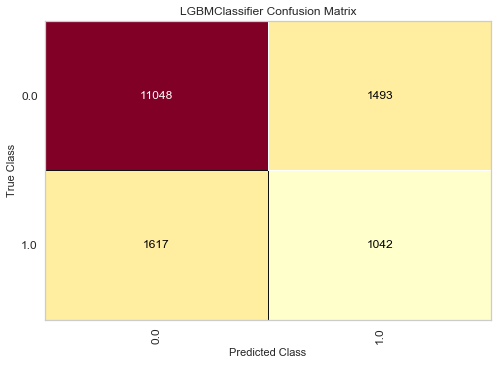

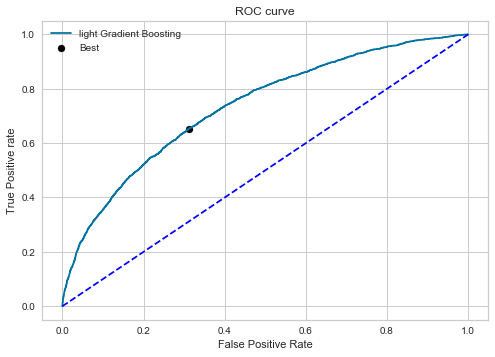

---------Gradient Boosting Classifier------------
Accuracy  (%): 
 80.03289473684211
Precision: 
 42.12070410729254
Recall (%): 
 37.796163971417826
f1 score (%): 
 39.841427155599604
logistic loss :
 6.896466487013489
              precision    recall  f1-score   support

         0.0       0.87      0.89      0.88     12541
         1.0       0.42      0.38      0.40      2659

    accuracy                           0.80     15200
   macro avg       0.65      0.63      0.64     15200
weighted avg       0.79      0.80      0.80     15200

AUC  (%): 
 73.06002464605075
Best Threshold=0.346349, G-Mean=0.669


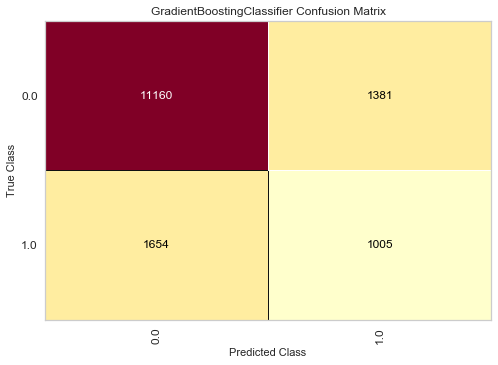

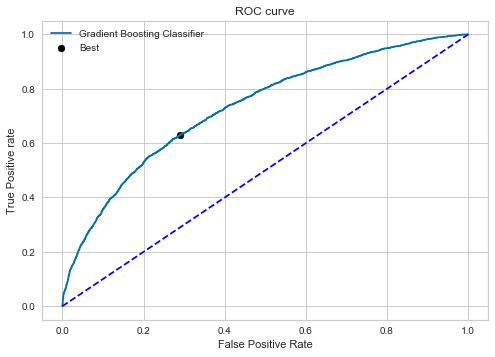

,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,44.565960,24.520496,0.706177,81.460526
1,Nearest Neighbors,31.116944,40.127868,0.657365,73.986842
2,Decision Tree,25.757576,46.032343,0.589503,67.348684
3,Naive Bayes,20.593826,85.558481,0.678668,39.763158
4,Random Forest,39.621914,38.623543,0.719409,78.967105
5,xgboost,38.761384,40.015043,0.721851,78.447368
6,Ada Boost,41.500636,36.818353,0.718292,79.868421
7,SVM,45.351474,22.564874,0.000000,81.697368
8,MLP Classifier,42.857143,35.878150,0.722084,80.414474
9,light Gradient Boosting,41.104536,39.187665,0.734103,79.539474


,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,44.565960,24.520496,0.706177,81.460526
1,Nearest Neighbors,31.116944,40.127868,0.657365,73.986842
2,Decision Tree,25.757576,46.032343,0.589503,67.348684
3,Naive Bayes,20.593826,85.558481,0.678668,39.763158
4,Random Forest,39.621914,38.623543,0.719409,78.967105
5,xgboost,38.761384,40.015043,0.721851,78.447368
6,Ada Boost,41.500636,36.818353,0.718292,79.868421
7,SVM,45.351474,22.564874,0.000000,81.697368
8,MLP Classifier,42.857143,35.878150,0.722084,80.414474
9,light Gradient Boosting,41.104536,39.187665,0.734103,79.539474


In [ ]:
t.fit_model_RFS_us(df4,'SoldFlag',ratio=0.5,threshold=5,classification=True,min_max=False,svm_type='Linear')

### ML algorithms with oversampling and Cross Validation

_____Cross Validation_____
---------Logistic Regression------------
Mean accuracy  (%): 
 72.56231511278969
Mean AUC  (%): 
 74.68915116143606
Mean Precision: 
 63.37500673325187
Mean Recall (%): 
 41.3021062061939
Mean f1 score (%): 
 49.992703511706246
---------Nearest Neighbors------------
Mean accuracy  (%): 
 70.80060987319527
Mean AUC  (%): 
 73.69971058692106
Mean Precision: 
 56.837325970729665
Mean Recall (%): 
 50.43789414513324
Mean f1 score (%): 
 53.433650067964024
---------Decision Tree------------
Mean accuracy  (%): 
 73.0600639746119
Mean AUC  (%): 
 71.230931393988
Mean Precision: 
 58.14862619729273
Mean Recall (%): 
 65.9110966676621
Mean f1 score (%): 
 62.00756402544921
---------Naive Bayes------------
Mean accuracy  (%): 
 53.589222081909995
Mean AUC  (%): 
 71.58777172084929
Mean Precision: 
 40.825477692681154
Mean Recall (%): 
 83.75967467106996
Mean f1 score (%): 
 54.600917811781734
---------Random Forest------------
Mean accuracy  (%): 
 81.24730513251744
M

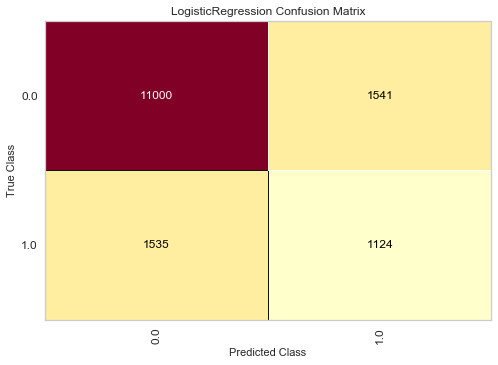

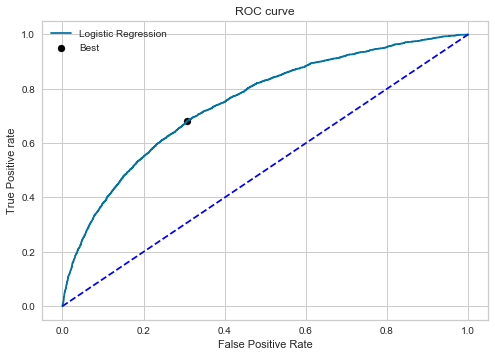

---------Nearest Neighbors------------
Accuracy  (%): 
 73.59210526315789
Precision: 
 31.494127287626334
Recall (%): 
 43.36216622790523
f1 score (%): 
 36.48734177215191
logistic loss :
 9.121095647337263
              precision    recall  f1-score   support

         0.0       0.87      0.80      0.83     12541
         1.0       0.31      0.43      0.36      2659

    accuracy                           0.74     15200
   macro avg       0.59      0.62      0.60     15200
weighted avg       0.77      0.74      0.75     15200

AUC  (%): 
 67.14552424497442
Best Threshold=0.400000, G-Mean=0.633


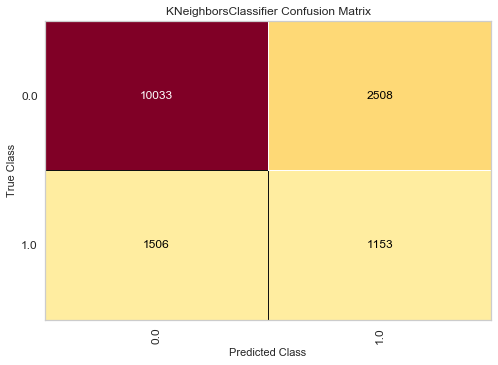

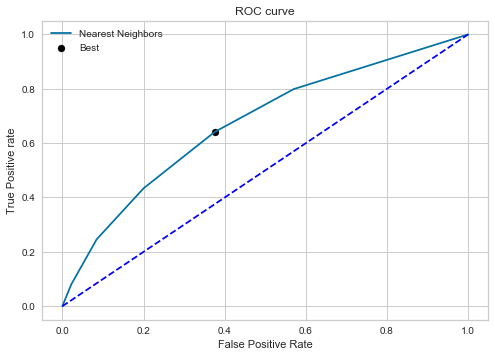

---------Decision Tree------------
Accuracy  (%): 
 72.11842105263158
Precision: 
 27.766826246127852
Recall (%): 
 37.081609627679576
f1 score (%): 
 31.755233494363928
logistic loss :
 9.630091140068417
              precision    recall  f1-score   support

         0.0       0.86      0.80      0.82     12541
         1.0       0.28      0.37      0.32      2659

    accuracy                           0.72     15200
   macro avg       0.57      0.58      0.57     15200
weighted avg       0.76      0.72      0.74     15200

AUC  (%): 
 58.31434759352244
Best Threshold=1.000000, G-Mean=0.543


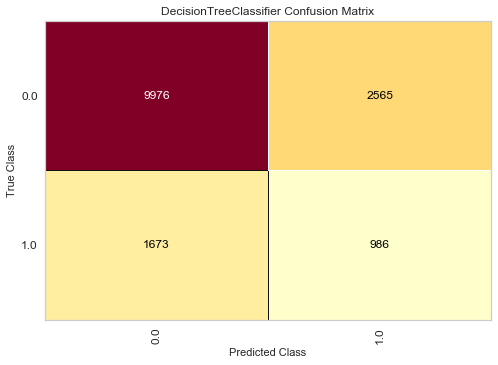

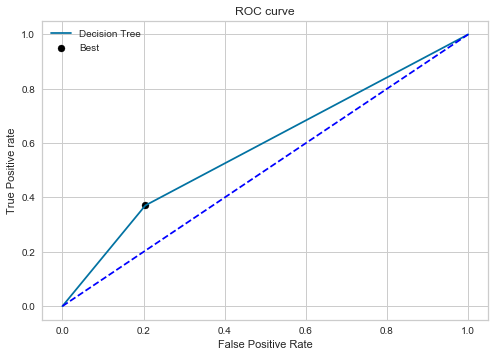

---------Naive Bayes------------
Accuracy  (%): 
 66.76973684210526
Precision: 
 30.41270881100557
Recall (%): 
 69.83828506957502
f1 score (%): 
 42.373074729035935
logistic loss :
 11.477549806590446
              precision    recall  f1-score   support

         0.0       0.91      0.66      0.77     12541
         1.0       0.30      0.70      0.42      2659

    accuracy                           0.67     15200
   macro avg       0.61      0.68      0.60     15200
weighted avg       0.81      0.67      0.71     15200

AUC  (%): 
 72.44418075541859
Best Threshold=0.537206, G-Mean=0.682


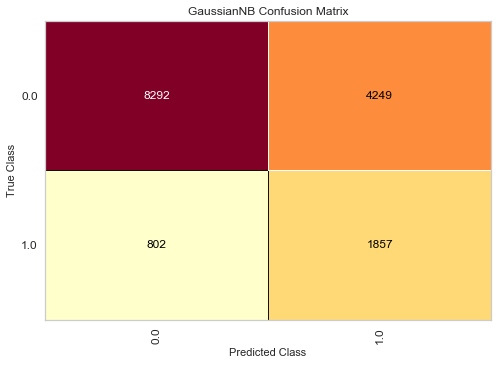

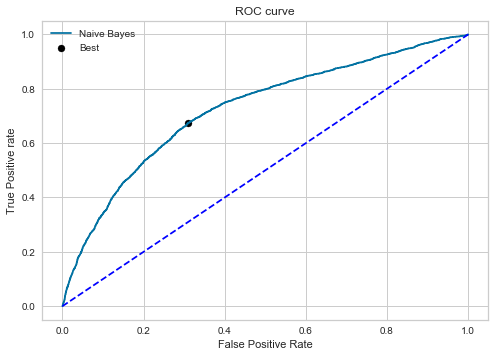

---------Random Forest------------
Accuracy  (%): 
 81.5
Precision: 
 45.794392523364486
Recall (%): 
 31.327566754418957
f1 score (%): 
 37.20410897722197
logistic loss :
 6.389725501681251
              precision    recall  f1-score   support

         0.0       0.86      0.92      0.89     12541
         1.0       0.46      0.31      0.37      2659

    accuracy                           0.81     15200
   macro avg       0.66      0.62      0.63     15200
weighted avg       0.79      0.81      0.80     15200

AUC  (%): 
 74.61995808318103
Best Threshold=0.280000, G-Mean=0.685


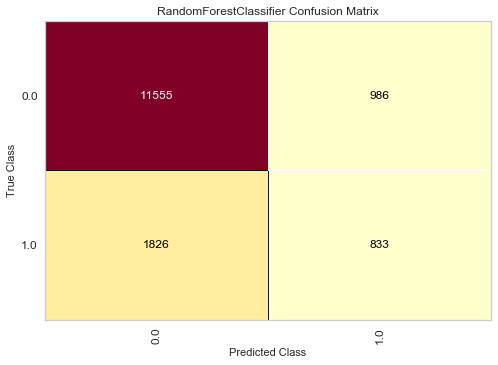

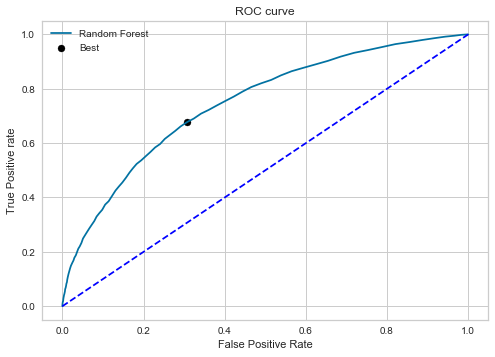

---------xgboost------------
Accuracy  (%): 
 79.10526315789474
Precision: 
 40.57601166605906
Recall (%): 
 41.857841293719446
f1 score (%): 
 41.20696038504258
logistic loss :
 7.216872182503129
              precision    recall  f1-score   support

         0.0       0.88      0.87      0.87     12541
         1.0       0.41      0.42      0.41      2659

    accuracy                           0.79     15200
   macro avg       0.64      0.64      0.64     15200
weighted avg       0.79      0.79      0.79     15200

AUC  (%): 
 74.11561758515184
Best Threshold=0.295838, G-Mean=0.681


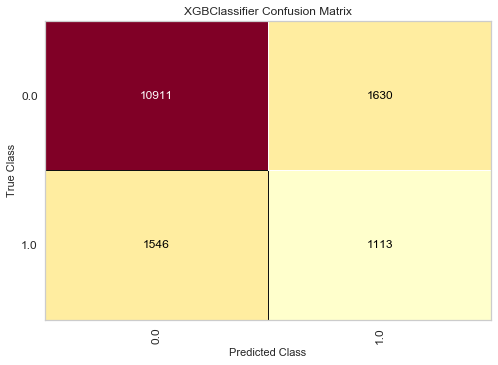

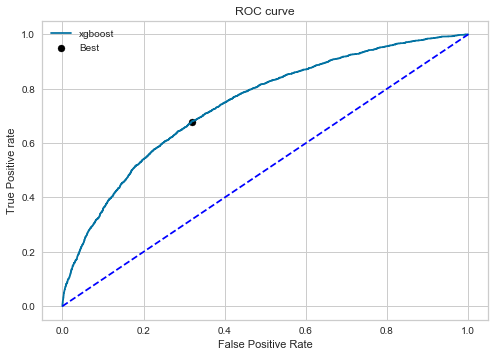

---------Ada Boost------------
Accuracy  (%): 
 79.21052631578948
Precision: 
 41.36504653567735
Recall (%): 
 45.12974802557353
f1 score (%): 
 43.16546762589928
logistic loss :
 7.180519310733323
              precision    recall  f1-score   support

         0.0       0.88      0.86      0.87     12541
         1.0       0.41      0.45      0.43      2659

    accuracy                           0.79     15200
   macro avg       0.65      0.66      0.65     15200
weighted avg       0.80      0.79      0.80     15200

AUC  (%): 
 75.16162931429214
Best Threshold=0.495896, G-Mean=0.688


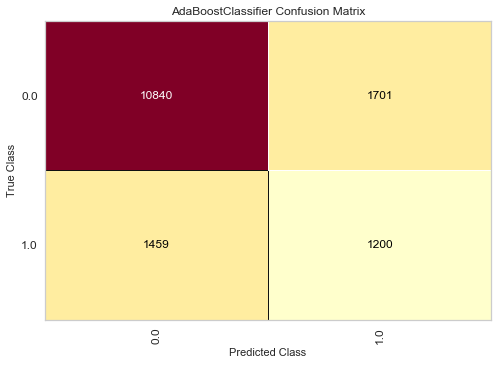

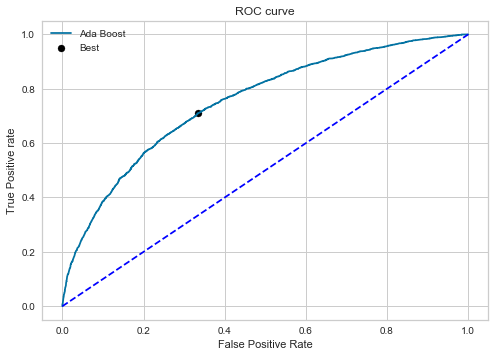

---------SVM------------
Accuracy  (%): 
 80.25
Precision: 
 43.14822213343987
Recall (%): 
 40.616773223016175
f1 score (%): 
 41.844246416117784
logistic loss :
 6.8214831950437524
              precision    recall  f1-score   support

         0.0       0.88      0.89      0.88     12541
         1.0       0.43      0.41      0.42      2659

    accuracy                           0.80     15200
   macro avg       0.65      0.65      0.65     15200
weighted avg       0.80      0.80      0.80     15200

AUC score cannot be calculated for linear SVM


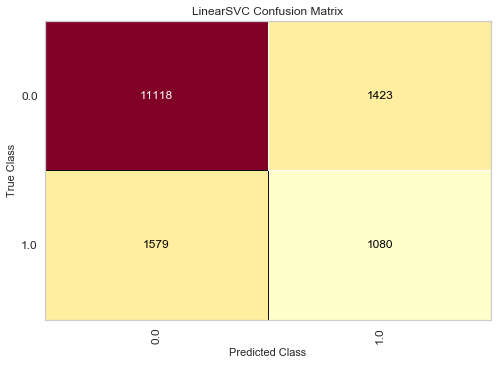

---------MLP Classifier------------
Accuracy  (%): 
 79.44736842105263
Precision: 
 41.968911917098445
Recall (%): 
 45.69386987589319
f1 score (%): 
 43.752250630176455
logistic loss :
 7.098715840880506
              precision    recall  f1-score   support

         0.0       0.88      0.87      0.87     12541
         1.0       0.42      0.46      0.44      2659

    accuracy                           0.79     15200
   macro avg       0.65      0.66      0.66     15200
weighted avg       0.80      0.79      0.80     15200

AUC  (%): 
 75.64648202110689
Best Threshold=0.354728, G-Mean=0.691


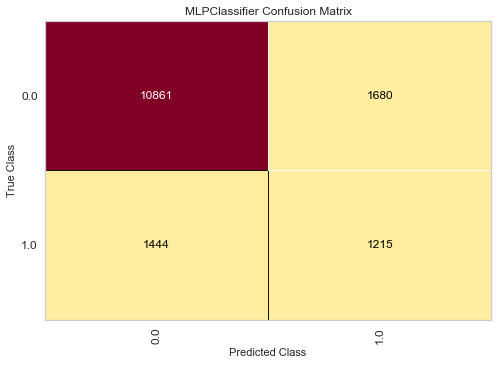

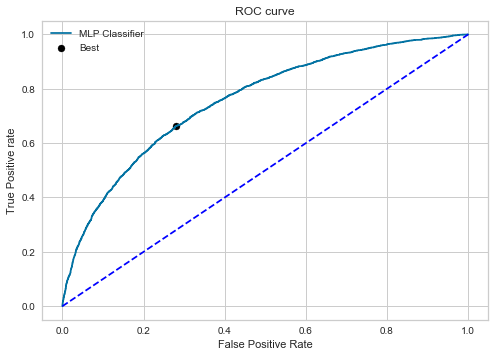

---------light Gradient Boosting------------
Accuracy  (%): 
 79.1842105263158
Precision: 
 41.51260504201681
Recall (%): 
 46.446032342986086
f1 score (%): 
 43.84096556620519
logistic loss :
 7.1896105140148645
              precision    recall  f1-score   support

         0.0       0.88      0.86      0.87     12541
         1.0       0.42      0.46      0.44      2659

    accuracy                           0.79     15200
   macro avg       0.65      0.66      0.66     15200
weighted avg       0.80      0.79      0.80     15200

AUC  (%): 
 75.79255573872643
Best Threshold=0.308968, G-Mean=0.694


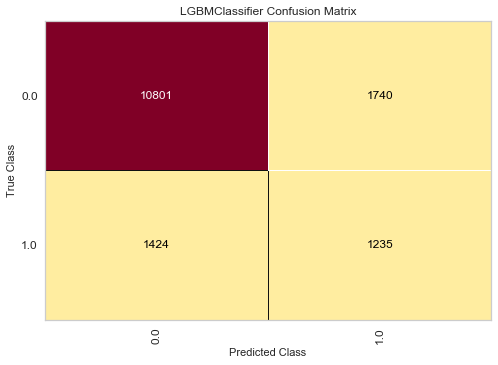

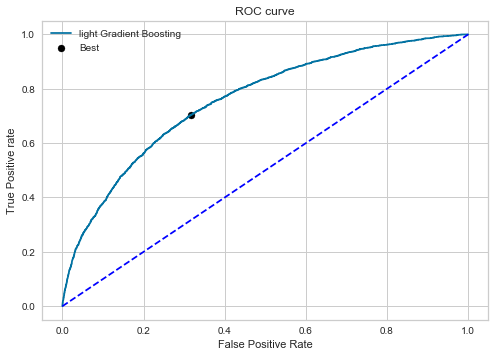

---------Gradient Boosting Classifier------------
Accuracy  (%): 
 79.47368421052632
Precision: 
 42.032492222606294
Recall (%): 
 45.731477999247836
f1 score (%): 
 43.80403458213256
logistic loss :
 7.089626531382354
              precision    recall  f1-score   support

         0.0       0.88      0.87      0.87     12541
         1.0       0.42      0.46      0.44      2659

    accuracy                           0.79     15200
   macro avg       0.65      0.66      0.66     15200
weighted avg       0.80      0.79      0.80     15200

AUC  (%): 
 75.84652688935837
Best Threshold=0.315419, G-Mean=0.693


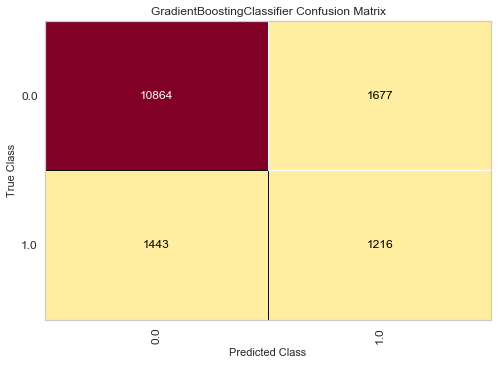

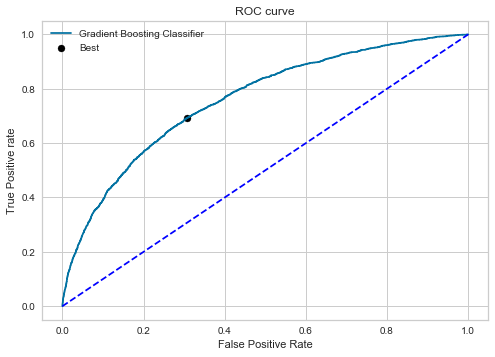

,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,42.176360,42.271531,0.748745,79.763158
1,Nearest Neighbors,31.494127,43.362166,0.671455,73.592105
2,Decision Tree,27.766826,37.081610,0.583143,72.118421
3,Naive Bayes,30.412709,69.838285,0.724442,66.769737
4,Random Forest,45.794393,31.327567,0.746200,81.500000
5,xgboost,40.576012,41.857841,0.741156,79.105263
6,Ada Boost,41.365047,45.129748,0.751616,79.210526
7,SVM,43.148222,40.616773,0.000000,80.250000
8,MLP Classifier,41.968912,45.693870,0.756465,79.447368
9,light Gradient Boosting,41.512605,46.446032,0.757926,79.184211


,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,42.176360,42.271531,0.748745,79.763158
1,Nearest Neighbors,31.494127,43.362166,0.671455,73.592105
2,Decision Tree,27.766826,37.081610,0.583143,72.118421
3,Naive Bayes,30.412709,69.838285,0.724442,66.769737
4,Random Forest,45.794393,31.327567,0.746200,81.500000
5,xgboost,40.576012,41.857841,0.741156,79.105263
6,Ada Boost,41.365047,45.129748,0.751616,79.210526
7,SVM,43.148222,40.616773,0.000000,80.250000
8,MLP Classifier,41.968912,45.693870,0.756465,79.447368
9,light Gradient Boosting,41.512605,46.446032,0.757926,79.184211


In [ ]:
t.fit_model_CV_OS(df4,'SoldFlag',ratio=0.5,split=10,classification=True,min_max=False,svm_type='Linear')

### ML algorithms with undersampling and Cross Validation¶

_____Cross Validation_____
---------Logistic Regression------------
Mean accuracy  (%): 
 71.92311423720592
Mean AUC  (%): 
 74.2730470671293
Mean Precision: 
 62.160792022017276
Mean Recall (%): 
 40.63904159319572
Mean f1 score (%): 
 49.096872128320676
---------Nearest Neighbors------------
Mean accuracy  (%): 
 68.81667301895291
Mean AUC  (%): 
 68.51425941292398
Mean Precision: 
 54.0987562352791
Mean Recall (%): 
 42.701379524945544
Mean f1 score (%): 
 47.71124822537465
---------Decision Tree------------
Mean accuracy  (%): 
 63.74277860549993
Mean AUC  (%): 
 59.51812571310031
Mean Precision: 
 45.90668082773288
Mean Recall (%): 
 46.82532932268437
Mean f1 score (%): 
 46.83650137093587
---------Naive Bayes------------
Mean accuracy  (%): 
 54.52032154118014
Mean AUC  (%): 
 70.91321272388423
Mean Precision: 
 41.36031134432928
Mean Recall (%): 
 83.01545482833731
Mean f1 score (%): 
 54.99072970189002
---------Random Forest------------
Mean accuracy  (%): 
 71.76192786112748
M

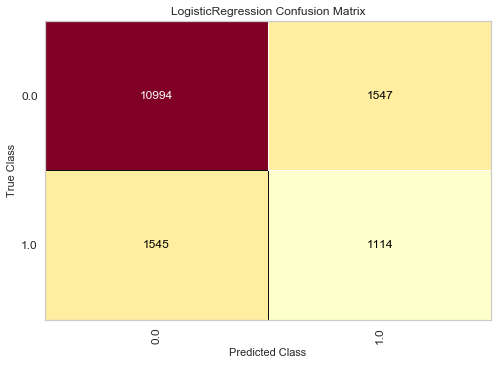

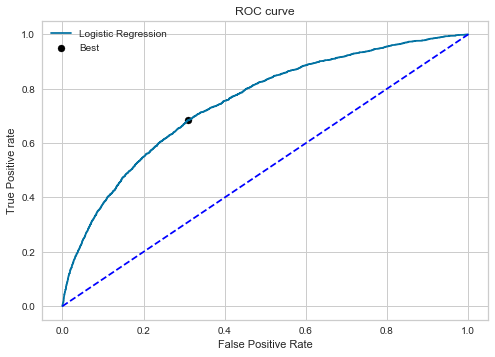

---------Nearest Neighbors------------
Accuracy  (%): 
 75.35526315789474
Precision: 
 34.01940605704205
Recall (%): 
 43.51259872132381
f1 score (%): 
 38.18481848184818
logistic loss :
 8.51210859684005
              precision    recall  f1-score   support

         0.0       0.87      0.82      0.85     12541
         1.0       0.34      0.44      0.38      2659

    accuracy                           0.75     15200
   macro avg       0.61      0.63      0.61     15200
weighted avg       0.78      0.75      0.76     15200

AUC  (%): 
 68.52311481147402
Best Threshold=0.400000, G-Mean=0.642


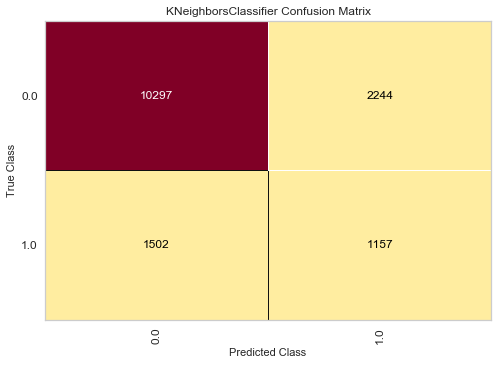

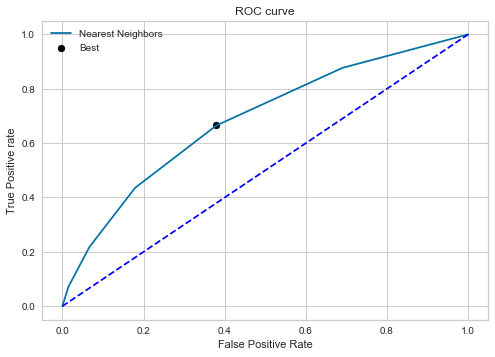

---------Decision Tree------------
Accuracy  (%): 
 67.54605263157895
Precision: 
 25.911016949152543
Recall (%): 
 45.994734862730354
f1 score (%): 
 33.14812305190406
logistic loss :
 11.209380272914986
              precision    recall  f1-score   support

         0.0       0.86      0.72      0.79     12541
         1.0       0.26      0.46      0.33      2659

    accuracy                           0.68     15200
   macro avg       0.56      0.59      0.56     15200
weighted avg       0.76      0.68      0.71     15200

AUC  (%): 
 59.05509807485454
Best Threshold=1.000000, G-Mean=0.576


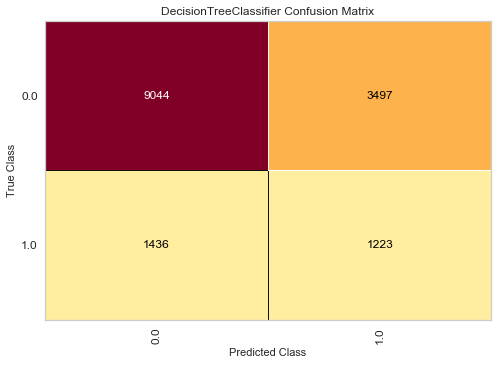

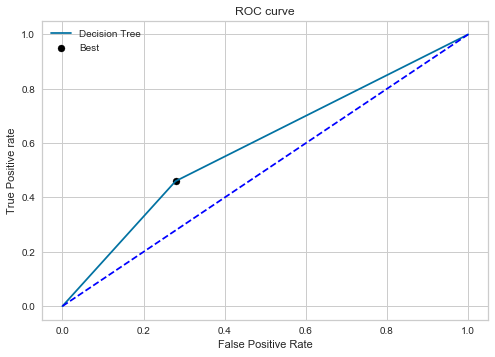

---------Naive Bayes------------
Accuracy  (%): 
 42.473684210526315
Precision: 
 21.57339063813884
Recall (%): 
 86.83715682587439
f1 score (%): 
 34.56069450681036
logistic loss :
 19.869327145916323
              precision    recall  f1-score   support

         0.0       0.92      0.33      0.49     12541
         1.0       0.22      0.87      0.35      2659

    accuracy                           0.42     15200
   macro avg       0.57      0.60      0.42     15200
weighted avg       0.80      0.42      0.46     15200

AUC  (%): 
 72.28282658228883
Best Threshold=0.725049, G-Mean=0.683


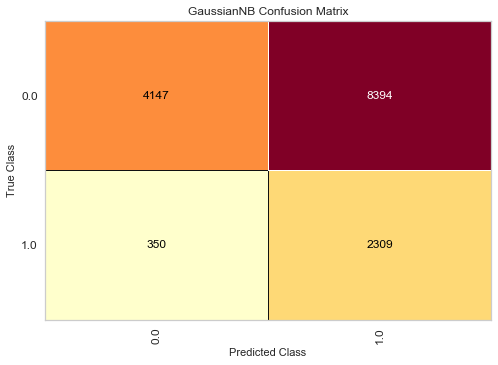

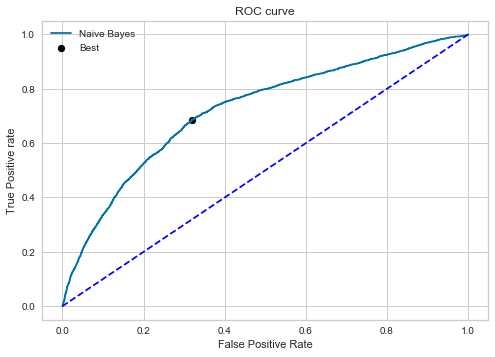

---------Random Forest------------
Accuracy  (%): 
 79.33552631578948
Precision: 
 41.49611856033874
Recall (%): 
 44.227153065062055
f1 score (%): 
 42.81813216821409
logistic loss :
 7.13734357822064
              precision    recall  f1-score   support

         0.0       0.88      0.87      0.87     12541
         1.0       0.41      0.44      0.43      2659

    accuracy                           0.79     15200
   macro avg       0.65      0.66      0.65     15200
weighted avg       0.80      0.79      0.80     15200

AUC  (%): 
 74.534437912395
Best Threshold=0.350000, G-Mean=0.686


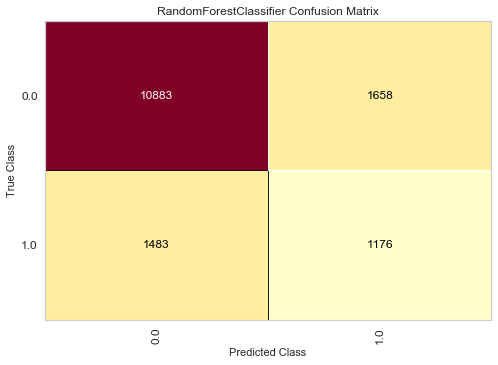

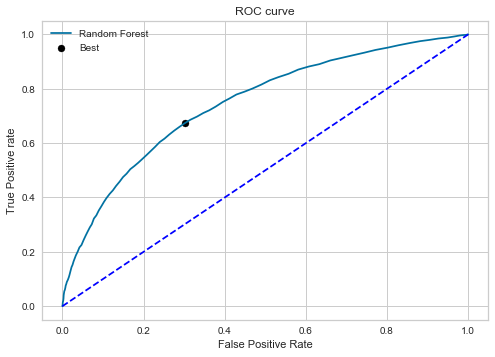

---------xgboost------------
Accuracy  (%): 
 77.80921052631578
Precision: 
 38.68103994927077
Recall (%): 
 45.881910492666414
f1 score (%): 
 41.97488388095648
logistic loss :
 7.664528894833141
              precision    recall  f1-score   support

         0.0       0.88      0.85      0.86     12541
         1.0       0.39      0.46      0.42      2659

    accuracy                           0.78     15200
   macro avg       0.63      0.65      0.64     15200
weighted avg       0.79      0.78      0.79     15200

AUC  (%): 
 73.91754893516772
Best Threshold=0.298278, G-Mean=0.681


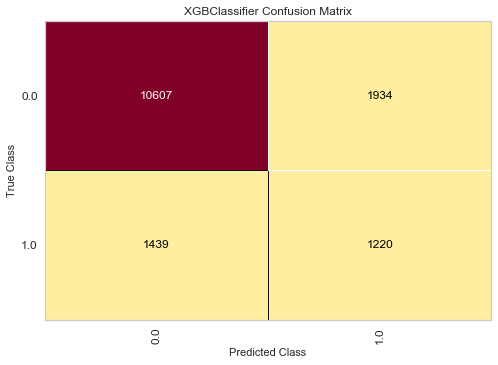

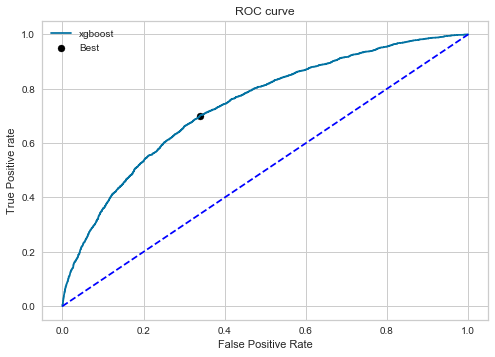

---------Ada Boost------------
Accuracy  (%): 
 79.13815789473684
Precision: 
 41.18457300275482
Recall (%): 
 44.97931553215494
f1 score (%): 
 42.99838216789502
logistic loss :
 7.205514846096879
              precision    recall  f1-score   support

         0.0       0.88      0.86      0.87     12541
         1.0       0.41      0.45      0.43      2659

    accuracy                           0.79     15200
   macro avg       0.65      0.66      0.65     15200
weighted avg       0.80      0.79      0.79     15200

AUC  (%): 
 75.09222626805514
Best Threshold=0.496219, G-Mean=0.688


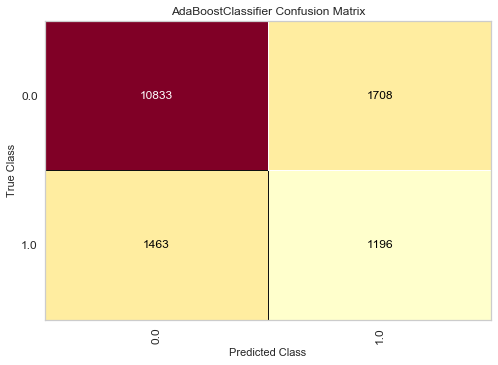

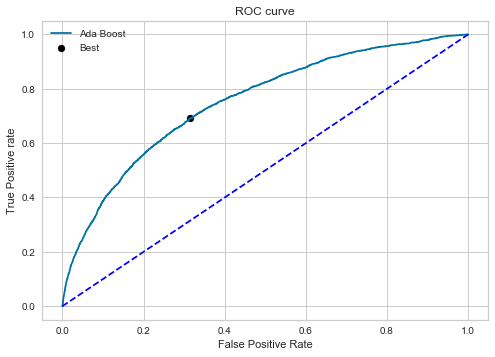

---------SVM------------
Accuracy  (%): 
 80.03947368421052
Precision: 
 42.562475208250696
Recall (%): 
 40.35351635953366
f1 score (%): 
 41.42857142857142
logistic loss :
 6.894197723634075
              precision    recall  f1-score   support

         0.0       0.87      0.88      0.88     12541
         1.0       0.43      0.40      0.41      2659

    accuracy                           0.80     15200
   macro avg       0.65      0.64      0.65     15200
weighted avg       0.80      0.80      0.80     15200

AUC score cannot be calculated for linear SVM


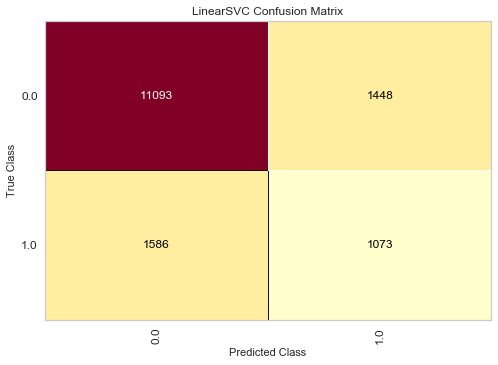

---------MLP Classifier------------
Accuracy  (%): 
 79.92763157894737
Precision: 
 42.772861356932154
Recall (%): 
 43.62542309138774
f1 score (%): 
 43.19493576615155
logistic loss :
 6.932832089216062
              precision    recall  f1-score   support

         0.0       0.88      0.88      0.88     12541
         1.0       0.43      0.44      0.43      2659

    accuracy                           0.80     15200
   macro avg       0.65      0.66      0.66     15200
weighted avg       0.80      0.80      0.80     15200

AUC  (%): 
 75.32435394530988
Best Threshold=0.338198, G-Mean=0.690


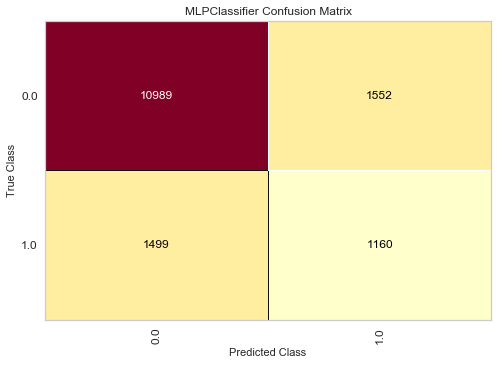

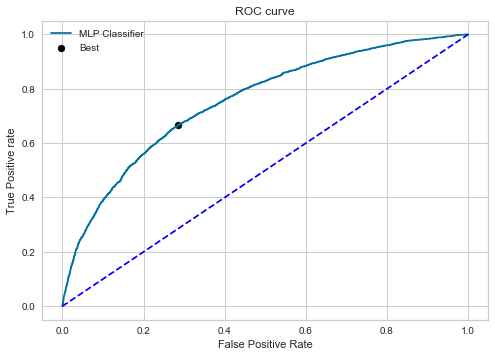

---------light Gradient Boosting------------
Accuracy  (%): 
 78.91447368421053
Precision: 
 40.8939292861908
Recall (%): 
 46.10755923279428
f1 score (%): 
 43.344528902245
logistic loss :
 7.282776002127306
              precision    recall  f1-score   support

         0.0       0.88      0.86      0.87     12541
         1.0       0.41      0.46      0.43      2659

    accuracy                           0.79     15200
   macro avg       0.65      0.66      0.65     15200
weighted avg       0.80      0.79      0.79     15200

AUC  (%): 
 75.5271517245923
Best Threshold=0.317035, G-Mean=0.690


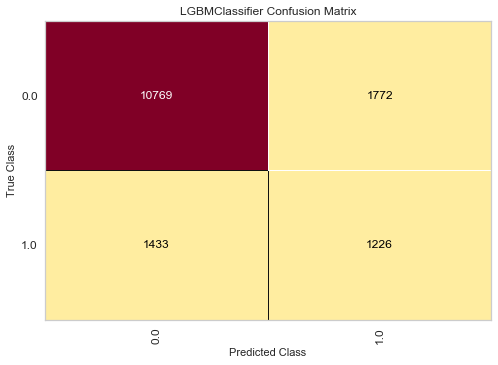

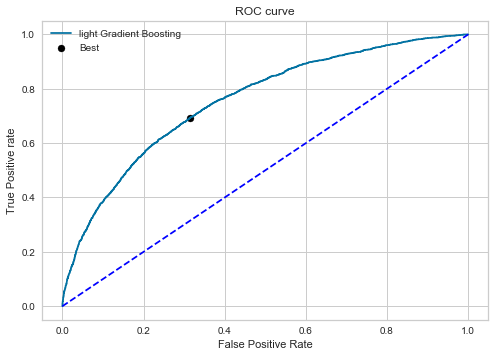

---------Gradient Boosting Classifier------------
Accuracy  (%): 
 79.23026315789473
Precision: 
 41.478439425051334
Recall (%): 
 45.58104550582926
f1 score (%): 
 43.433076509586094
logistic loss :
 7.173702920417017
              precision    recall  f1-score   support

         0.0       0.88      0.86      0.87     12541
         1.0       0.41      0.46      0.43      2659

    accuracy                           0.79     15200
   macro avg       0.65      0.66      0.65     15200
weighted avg       0.80      0.79      0.80     15200

AUC  (%): 
 75.85790138994717
Best Threshold=0.331087, G-Mean=0.693


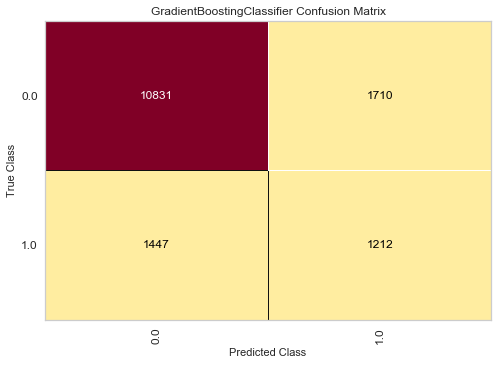

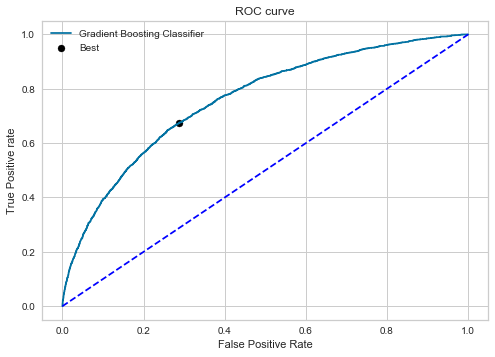

,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,41.863961,41.895449,0.748378,79.657895
1,Nearest Neighbors,34.019406,43.512599,0.685231,75.355263
2,Decision Tree,25.911017,45.994735,0.590551,67.546053
3,Naive Bayes,21.573391,86.837157,0.722828,42.473684
4,Random Forest,41.496119,44.227153,0.745344,79.335526
5,xgboost,38.681040,45.881910,0.739175,77.809211
6,Ada Boost,41.184573,44.979316,0.750922,79.138158
7,SVM,42.562475,40.353516,0.000000,80.039474
8,MLP Classifier,42.772861,43.625423,0.753244,79.927632
9,light Gradient Boosting,40.893929,46.107559,0.755272,78.914474


,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,41.863961,41.895449,0.748378,79.657895
1,Nearest Neighbors,34.019406,43.512599,0.685231,75.355263
2,Decision Tree,25.911017,45.994735,0.590551,67.546053
3,Naive Bayes,21.573391,86.837157,0.722828,42.473684
4,Random Forest,41.496119,44.227153,0.745344,79.335526
5,xgboost,38.681040,45.881910,0.739175,77.809211
6,Ada Boost,41.184573,44.979316,0.750922,79.138158
7,SVM,42.562475,40.353516,0.000000,80.039474
8,MLP Classifier,42.772861,43.625423,0.753244,79.927632
9,light Gradient Boosting,40.893929,46.107559,0.755272,78.914474


In [ ]:
t.fit_model_CV_US(df4,'SoldFlag',ratio=0.5,split=10,classification=True,min_max=False,svm_type='Linear')

E:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\deprecation.py:143: FutureWarning: The sklearn.metrics.classification module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.metrics. Anything that cannot be imported from sklearn.metrics is now part of the private API.
  warnings.warn(message, FutureWarning)


_____Cross Validation_____
---------Logistic Regression------------
Mean accuracy  (%): 
 71.69758497626555
Mean AUC  (%): 
 74.4181498037615
Mean Precision: 
 61.5421337944797
Mean Recall (%): 
 40.381703142827504
Mean f1 score (%): 
 48.73263803833557
---------Nearest Neighbors------------
Mean accuracy  (%): 
 68.78465749627524
Mean AUC  (%): 
 68.3629464718892
Mean Precision: 
 54.051116035781696
Mean Recall (%): 
 42.92853438439997
Mean f1 score (%): 
 47.829275243234385
---------Decision Tree------------
Mean accuracy  (%): 
 63.3667001605396
Mean AUC  (%): 
 59.23571206306399
Mean Precision: 
 45.139156034138054
Mean Recall (%): 
 45.89109013587802
Mean f1 score (%): 
 45.474880757811455
---------Naive Bayes------------
Mean accuracy  (%): 
 55.94967834332374
Mean AUC  (%): 
 71.11197238942553
Mean Precision: 
 41.97248018070264
Mean Recall (%): 
 82.08246032569235
Mean f1 score (%): 
 55.45724604461413
---------Random Forest------------
Mean accuracy  (%): 
 72.05233128905212
M

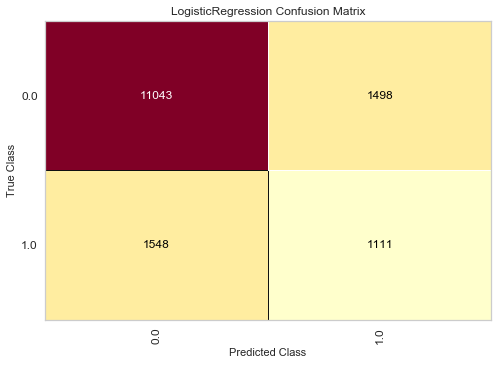

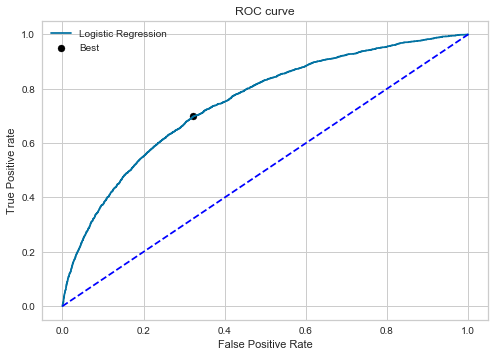

---------Nearest Neighbors------------
Accuracy  (%): 
 75.40789473684211
Precision: 
 34.33962264150943
Recall (%): 
 44.490409928544565
f1 score (%): 
 38.76146788990825
logistic loss :
 8.493931240366003
              precision    recall  f1-score   support

         0.0       0.87      0.82      0.85     12541
         1.0       0.34      0.44      0.39      2659

    accuracy                           0.75     15200
   macro avg       0.61      0.63      0.62     15200
weighted avg       0.78      0.75      0.77     15200

AUC  (%): 
 69.16909228216595
Best Threshold=0.400000, G-Mean=0.649


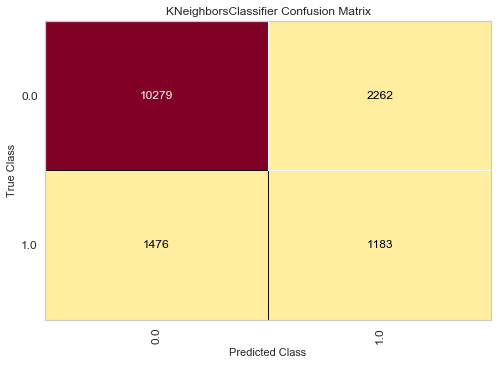

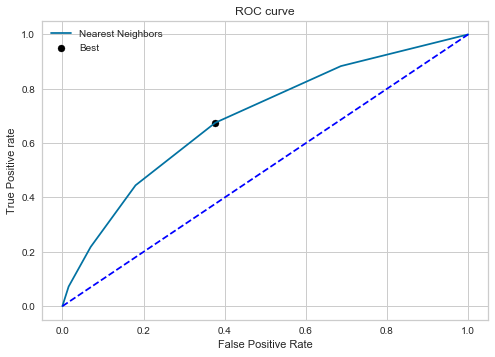

---------Decision Tree------------
Accuracy  (%): 
 67.76973684210526
Precision: 
 26.519916142557655
Recall (%): 
 47.574276043625424
f1 score (%): 
 34.05572755417957
logistic loss :
 11.132122904451334
              precision    recall  f1-score   support

         0.0       0.87      0.72      0.79     12541
         1.0       0.27      0.48      0.34      2659

    accuracy                           0.68     15200
   macro avg       0.57      0.60      0.56     15200
weighted avg       0.76      0.68      0.71     15200

AUC  (%): 
 59.81297328215878
Best Threshold=1.000000, G-Mean=0.585


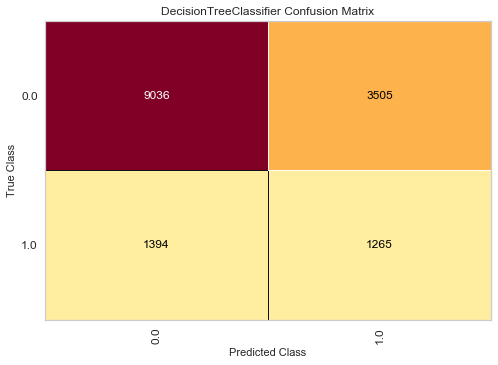

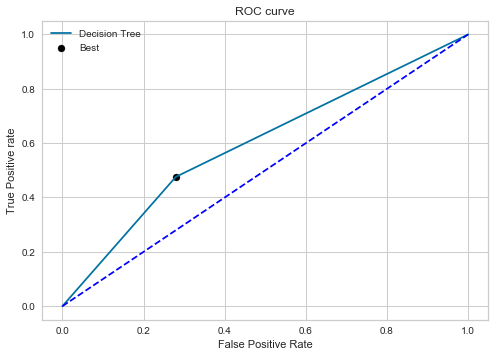

---------Naive Bayes------------
Accuracy  (%): 
 56.10526315789473
Precision: 
 25.699406564127408
Recall (%): 
 79.80443775855585
f1 score (%): 
 38.878710150238184
logistic loss :
 15.161027739281467
              precision    recall  f1-score   support

         0.0       0.92      0.51      0.66     12541
         1.0       0.26      0.80      0.39      2659

    accuracy                           0.56     15200
   macro avg       0.59      0.65      0.52     15200
weighted avg       0.81      0.56      0.61     15200

AUC  (%): 
 72.4953495145925
Best Threshold=0.621770, G-Mean=0.682


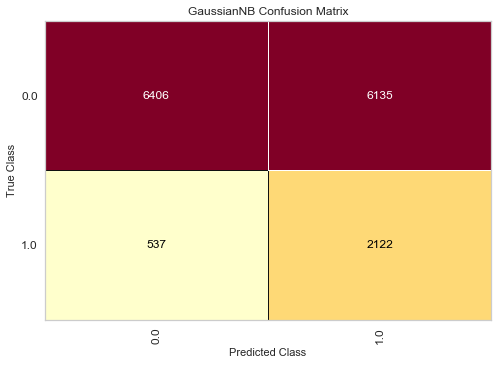

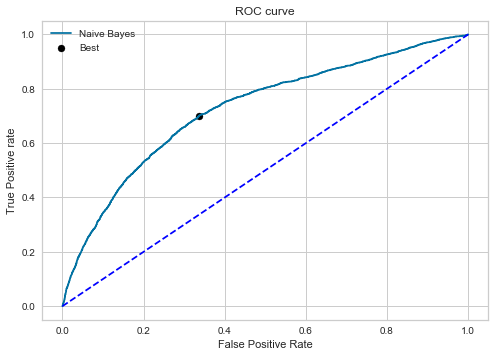

---------Random Forest------------
Accuracy  (%): 
 79.30921052631578
Precision: 
 41.497550734779566
Recall (%): 
 44.6032342986085
f1 score (%): 
 42.99438100416893
logistic loss :
 7.146433466374829
              precision    recall  f1-score   support

         0.0       0.88      0.87      0.87     12541
         1.0       0.41      0.45      0.43      2659

    accuracy                           0.79     15200
   macro avg       0.65      0.66      0.65     15200
weighted avg       0.80      0.79      0.80     15200

AUC  (%): 
 74.6518549657312
Best Threshold=0.350000, G-Mean=0.689


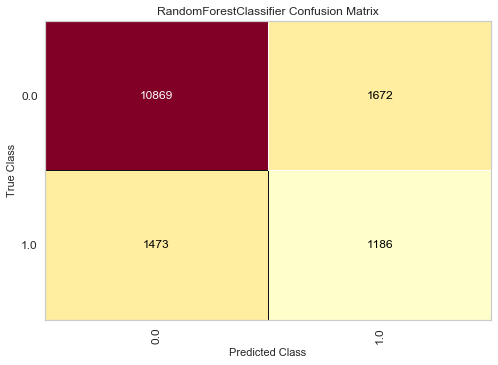

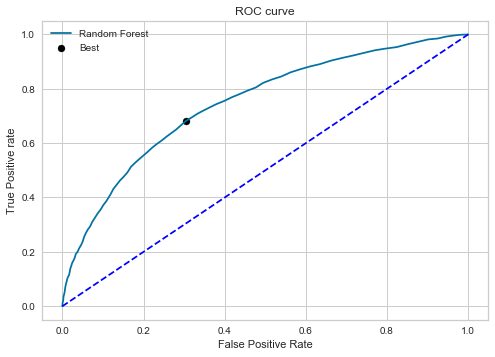

---------xgboost------------
Accuracy  (%): 
 78.17105263157896
Precision: 
 39.456
Recall (%): 
 46.3708160962768
f1 score (%): 
 42.634854771784234
logistic loss :
 7.53955084977971
              precision    recall  f1-score   support

         0.0       0.88      0.85      0.87     12541
         1.0       0.39      0.46      0.43      2659

    accuracy                           0.78     15200
   macro avg       0.64      0.66      0.65     15200
weighted avg       0.80      0.78      0.79     15200

AUC  (%): 
 73.87177504194665
Best Threshold=0.329725, G-Mean=0.681


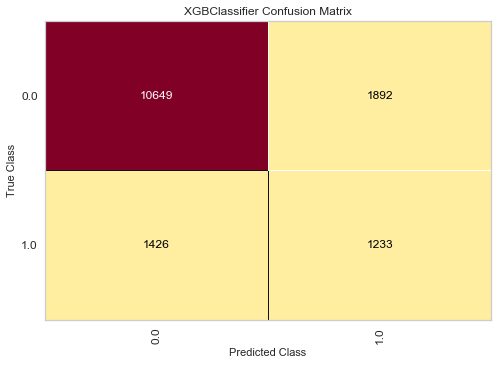

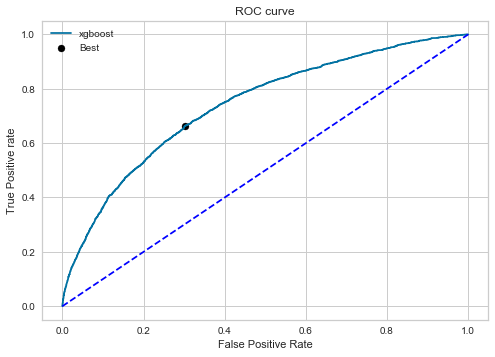

---------Ada Boost------------
Accuracy  (%): 
 79.79605263157895
Precision: 
 42.74647887323943
Recall (%): 
 45.65626175253855
f1 score (%): 
 44.15348245135479
logistic loss :
 6.9782817404073825
              precision    recall  f1-score   support

         0.0       0.88      0.87      0.88     12541
         1.0       0.43      0.46      0.44      2659

    accuracy                           0.80     15200
   macro avg       0.66      0.66      0.66     15200
weighted avg       0.80      0.80      0.80     15200

AUC  (%): 
 75.26768236288771
Best Threshold=0.496560, G-Mean=0.689


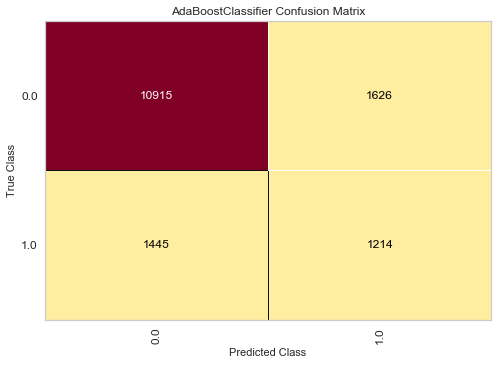

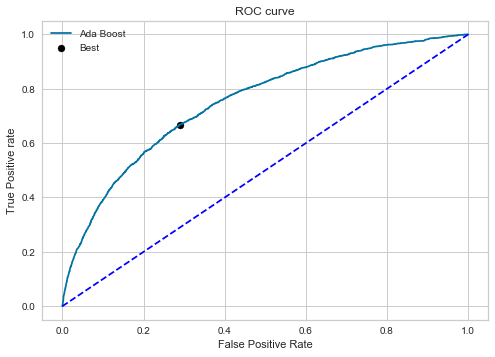

---------SVM------------
Accuracy  (%): 
 80.50657894736842
Precision: 
 43.924860111910476
Recall (%): 
 41.33132756675442
f1 score (%): 
 42.588645611315634
logistic loss :
 6.732862914033877
              precision    recall  f1-score   support

         0.0       0.88      0.89      0.88     12541
         1.0       0.44      0.41      0.43      2659

    accuracy                           0.81     15200
   macro avg       0.66      0.65      0.65     15200
weighted avg       0.80      0.81      0.80     15200

AUC  (%): 
 72.53295613854027
Best Threshold=0.229685, G-Mean=0.686


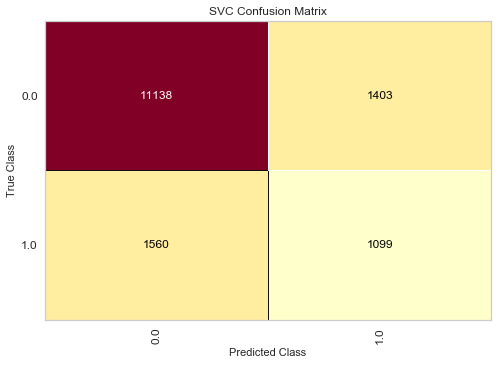

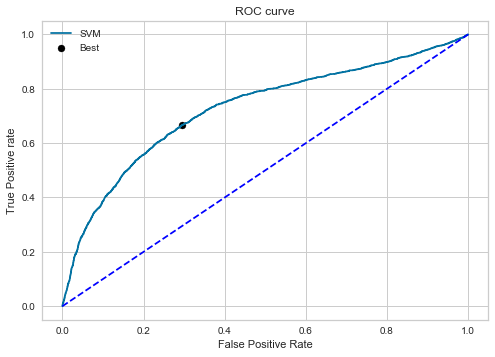

---------MLP Classifier------------
Accuracy  (%): 
 79.20394736842105
Precision: 
 41.380494505494504
Recall (%): 
 45.31778864234675
f1 score (%): 
 43.25973792855861
logistic loss :
 7.182791914284605
              precision    recall  f1-score   support

         0.0       0.88      0.86      0.87     12541
         1.0       0.41      0.45      0.43      2659

    accuracy                           0.79     15200
   macro avg       0.65      0.66      0.65     15200
weighted avg       0.80      0.79      0.80     15200

AUC  (%): 
 75.38773087529766
Best Threshold=0.337298, G-Mean=0.692


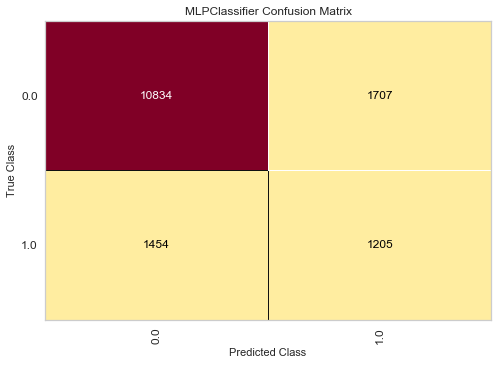

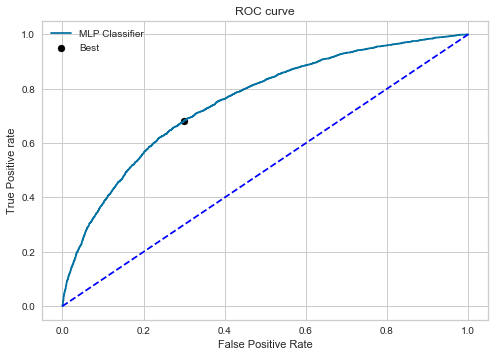

---------light Gradient Boosting------------
Accuracy  (%): 
 78.86184210526316
Precision: 
 40.797342192691026
Recall (%): 
 46.182775479503576
f1 score (%): 
 43.32333744928559
logistic loss :
 7.300954831543989
              precision    recall  f1-score   support

         0.0       0.88      0.86      0.87     12541
         1.0       0.41      0.46      0.43      2659

    accuracy                           0.79     15200
   macro avg       0.65      0.66      0.65     15200
weighted avg       0.80      0.79      0.79     15200

AUC  (%): 
 75.4984425810682
Best Threshold=0.335964, G-Mean=0.693


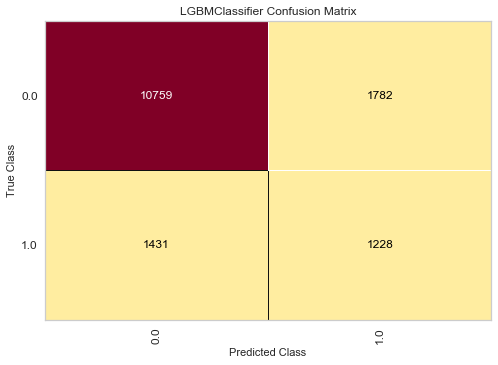

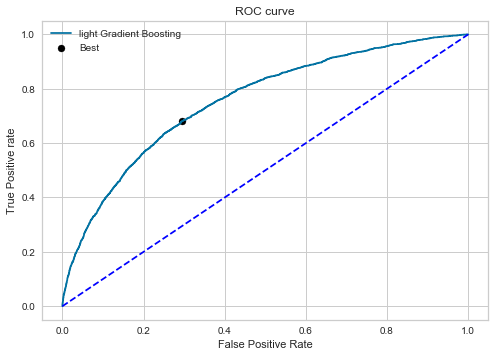

---------Gradient Boosting Classifier------------
Accuracy  (%): 
 79.4671052631579
Precision: 
 42.09986320109439
Recall (%): 
 46.29559984956751
f1 score (%): 
 44.09815511373813
logistic loss :
 7.091899660984576
              precision    recall  f1-score   support

         0.0       0.88      0.87      0.87     12541
         1.0       0.42      0.46      0.44      2659

    accuracy                           0.79     15200
   macro avg       0.65      0.66      0.66     15200
weighted avg       0.80      0.79      0.80     15200

AUC  (%): 
 75.91676810404108
Best Threshold=0.328428, G-Mean=0.693


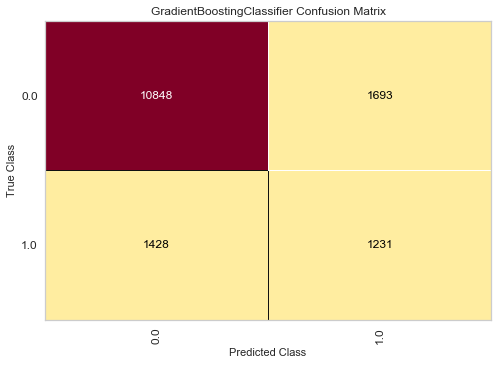

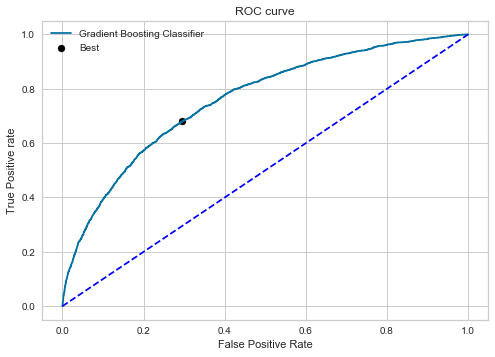

,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,42.583365,41.782625,0.749137,79.960526
1,Nearest Neighbors,34.339623,44.490410,0.691691,75.407895
2,Decision Tree,26.519916,47.574276,0.598130,67.769737
3,Naive Bayes,25.699407,79.804438,0.724953,56.105263
4,Random Forest,41.497551,44.603234,0.746519,79.309211
5,xgboost,39.456000,46.370816,0.738718,78.171053
6,Ada Boost,42.746479,45.656262,0.752677,79.796053
7,SVM,43.924860,41.331328,0.725330,80.506579
8,MLP Classifier,41.380495,45.317789,0.753877,79.203947
9,light Gradient Boosting,40.797342,46.182775,0.754984,78.861842


,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,42.583365,41.782625,0.749137,79.960526
1,Nearest Neighbors,34.339623,44.490410,0.691691,75.407895
2,Decision Tree,26.519916,47.574276,0.598130,67.769737
3,Naive Bayes,25.699407,79.804438,0.724953,56.105263
4,Random Forest,41.497551,44.603234,0.746519,79.309211
5,xgboost,39.456000,46.370816,0.738718,78.171053
6,Ada Boost,42.746479,45.656262,0.752677,79.796053
7,SVM,43.924860,41.331328,0.725330,80.506579
8,MLP Classifier,41.380495,45.317789,0.753877,79.203947
9,light Gradient Boosting,40.797342,46.182775,0.754984,78.861842


In [ ]:
t.fit_model_CV_US(df4,'SoldFlag',ratio=0.5,split=10,classification=True,min_max=False,svm_type='non-Linear',kernel='rbf')

### ML algorithms with oversampling, Random Forest Feature Selection and Cross Validation

StrengthFactor    18.314183
ItemCount         15.945379
LowUserPrice      15.235386
PriceReg          15.085180
LowNetPrice       14.860218
ReleaseYear        8.980535
ReleaseNumber      7.606120
MarketingType      3.972998
dtype: float64
Selected Features =['StrengthFactor', 'ItemCount', 'LowUserPrice', 'PriceReg', 'LowNetPrice', 'ReleaseYear', 'ReleaseNumber']
_____Cross Validation_____
---------Logistic Regression------------
Mean accuracy  (%): 
 70.25452700880864
Mean AUC  (%): 
 70.11810749979026
Mean Precision: 
 64.18027509032737
Mean Recall (%): 
 23.627786463365357
Mean f1 score (%): 
 34.52747334034601
---------Nearest Neighbors------------
Mean accuracy  (%): 
 69.81404880925362
Mean AUC  (%): 
 71.63352508255105
Mean Precision: 
 55.24298874526177
Mean Recall (%): 
 48.263056194775764
Mean f1 score (%): 
 51.50869423205419
---------Decision Tree------------
Mean accuracy  (%): 
 71.79593495461837
Mean AUC  (%): 
 69.83895889172423
Mean Precision: 
 56.458384402043635
Mean 

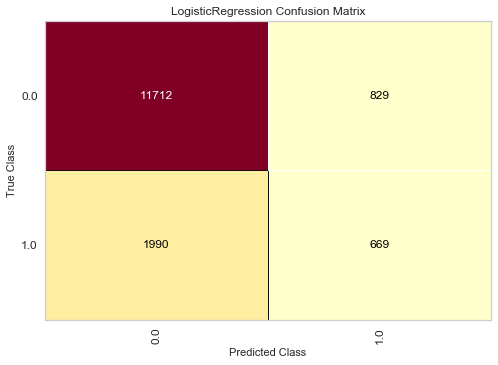

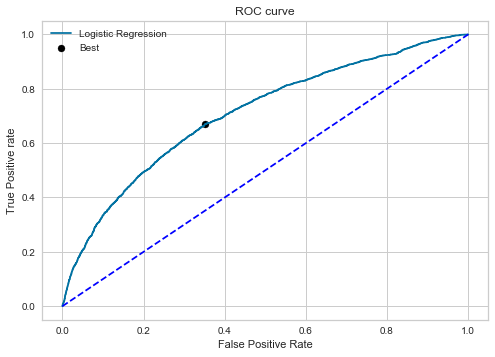

---------Nearest Neighbors------------
Accuracy  (%): 
 72.57894736842105
Precision: 
 29.140171412773014
Recall (%): 
 39.63896201579541
f1 score (%): 
 33.588272785213505
logistic loss :
 9.471030880407982
              precision    recall  f1-score   support

         0.0       0.86      0.80      0.83     12541
         1.0       0.29      0.40      0.34      2659

    accuracy                           0.73     15200
   macro avg       0.58      0.60      0.58     15200
weighted avg       0.76      0.73      0.74     15200

AUC  (%): 
 64.24763856161417
Best Threshold=0.400000, G-Mean=0.611


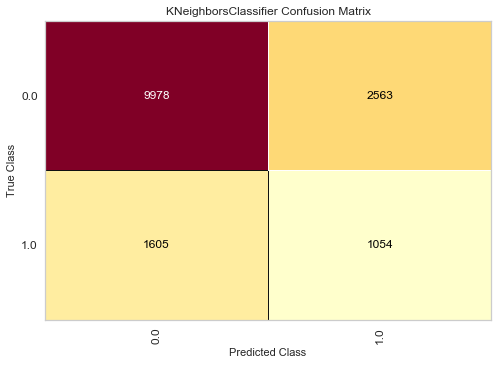

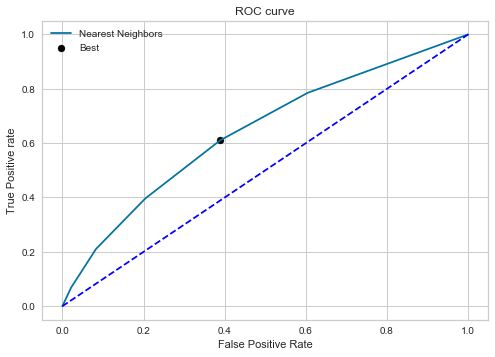

---------Decision Tree------------
Accuracy  (%): 
 71.3092105263158
Precision: 
 26.672149122807014
Recall (%): 
 36.5927040240692
f1 score (%): 
 30.854605993340726
logistic loss :
 9.909588340877058
              precision    recall  f1-score   support

         0.0       0.85      0.79      0.82     12541
         1.0       0.27      0.37      0.31      2659

    accuracy                           0.71     15200
   macro avg       0.56      0.58      0.56     15200
weighted avg       0.75      0.71      0.73     15200

AUC  (%): 
 57.631333273497
Best Threshold=1.000000, G-Mean=0.537


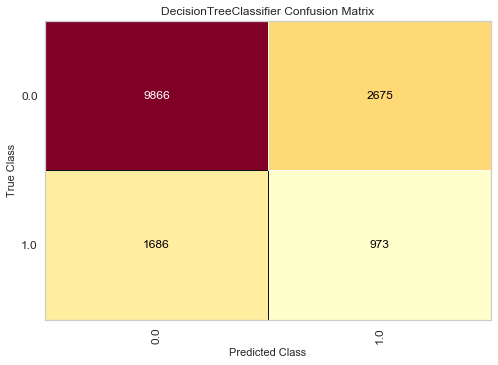

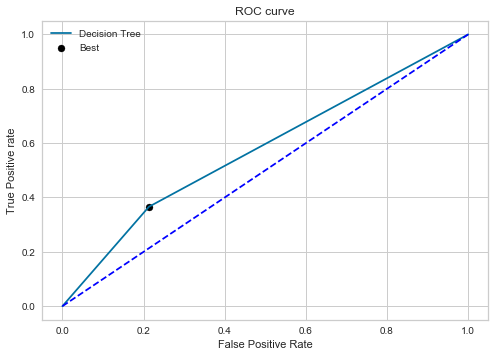

---------Naive Bayes------------
Accuracy  (%): 
 58.19736842105263
Precision: 
 25.003382492220265
Recall (%): 
 69.49981195938322
f1 score (%): 
 36.776119402985074
logistic loss :
 14.438409038277502
              precision    recall  f1-score   support

         0.0       0.90      0.56      0.69     12541
         1.0       0.25      0.69      0.37      2659

    accuracy                           0.58     15200
   macro avg       0.57      0.63      0.53     15200
weighted avg       0.78      0.58      0.63     15200

AUC  (%): 
 68.27619098713123
Best Threshold=0.569278, G-Mean=0.646


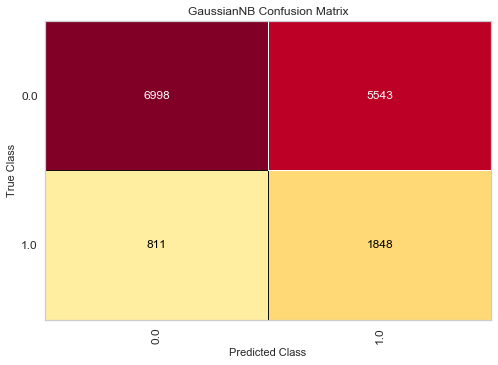

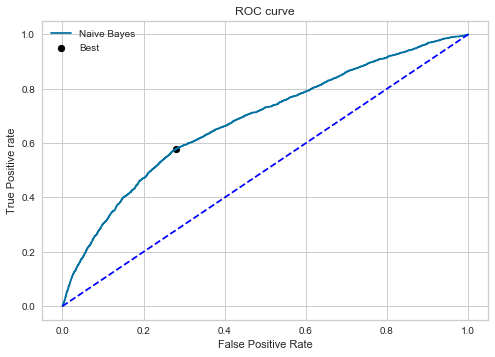

---------Random Forest------------
Accuracy  (%): 
 81.42763157894737
Precision: 
 44.790343074968234
Recall (%): 
 26.513726965024446
f1 score (%): 
 33.309709425939054
logistic loss :
 6.414714514013138
              precision    recall  f1-score   support

         0.0       0.86      0.93      0.89     12541
         1.0       0.45      0.27      0.33      2659

    accuracy                           0.81     15200
   macro avg       0.65      0.60      0.61     15200
weighted avg       0.79      0.81      0.79     15200

AUC  (%): 
 71.6897436880893
Best Threshold=0.270000, G-Mean=0.661


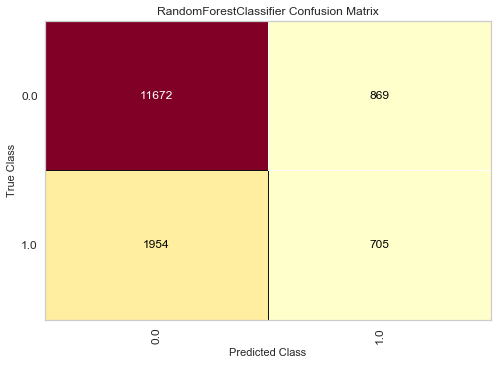

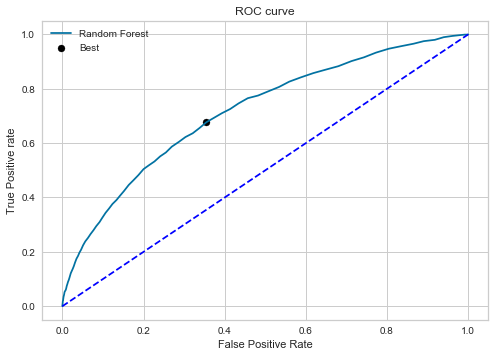

---------xgboost------------
Accuracy  (%): 
 78.63157894736842
Precision: 
 38.234119057131444
Recall (%): 
 35.99097405039488
f1 score (%): 
 37.078651685393254
logistic loss :
 7.380472493966907
              precision    recall  f1-score   support

         0.0       0.87      0.88      0.87     12541
         1.0       0.38      0.36      0.37      2659

    accuracy                           0.79     15200
   macro avg       0.62      0.62      0.62     15200
weighted avg       0.78      0.79      0.78     15200

AUC  (%): 
 71.35833428370739
Best Threshold=0.304888, G-Mean=0.662


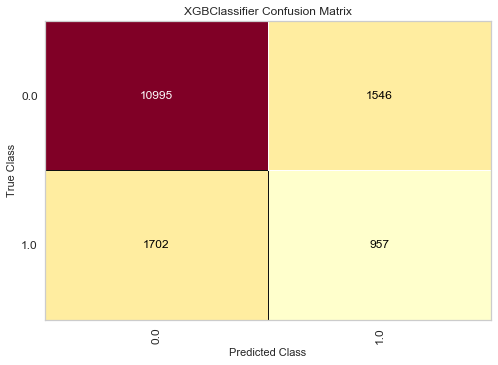

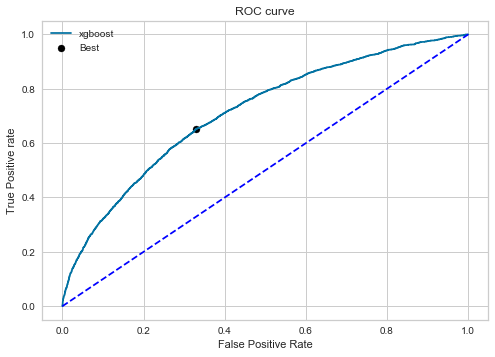

---------Ada Boost------------
Accuracy  (%): 
 80.01973684210526
Precision: 
 41.98473282442748
Recall (%): 
 37.23204212109816
f1 score (%): 
 39.46581622483556
logistic loss :
 6.9010103789887
              precision    recall  f1-score   support

         0.0       0.87      0.89      0.88     12541
         1.0       0.42      0.37      0.39      2659

    accuracy                           0.80     15200
   macro avg       0.64      0.63      0.64     15200
weighted avg       0.79      0.80      0.80     15200

AUC  (%): 
 71.6845932254578
Best Threshold=0.496763, G-Mean=0.660


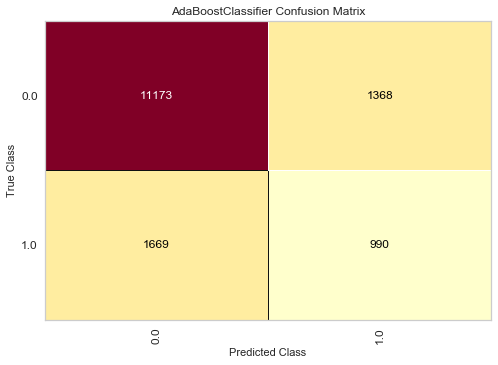

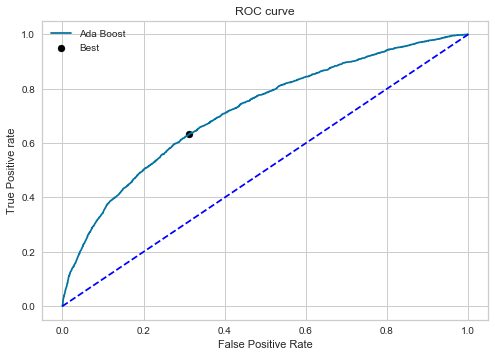

---------SVM------------
Accuracy  (%): 
 81.69736842105263
Precision: 
 45.33029612756264
Recall (%): 
 22.45204964272283
f1 score (%): 
 30.03018108651912
logistic loss :
 6.321542871104688
              precision    recall  f1-score   support

         0.0       0.85      0.94      0.89     12541
         1.0       0.45      0.22      0.30      2659

    accuracy                           0.82     15200
   macro avg       0.65      0.58      0.60     15200
weighted avg       0.78      0.82      0.79     15200

AUC score cannot be calculated for linear SVM


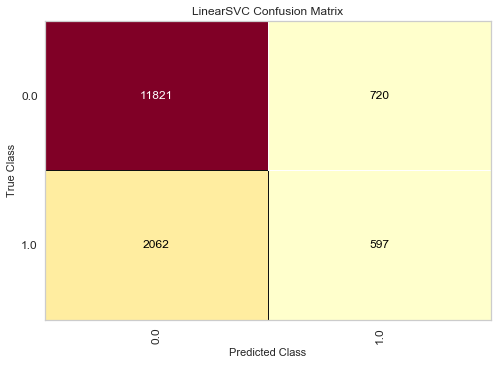

---------MLP Classifier------------
Accuracy  (%): 
 79.4671052631579
Precision: 
 40.7673860911271
Recall (%): 
 38.36028582173749
f1 score (%): 
 39.5272234063166
logistic loss :
 7.091888561309723
              precision    recall  f1-score   support

         0.0       0.87      0.88      0.88     12541
         1.0       0.41      0.38      0.40      2659

    accuracy                           0.79     15200
   macro avg       0.64      0.63      0.64     15200
weighted avg       0.79      0.79      0.79     15200

AUC  (%): 
 72.02775198214843
Best Threshold=0.341877, G-Mean=0.663


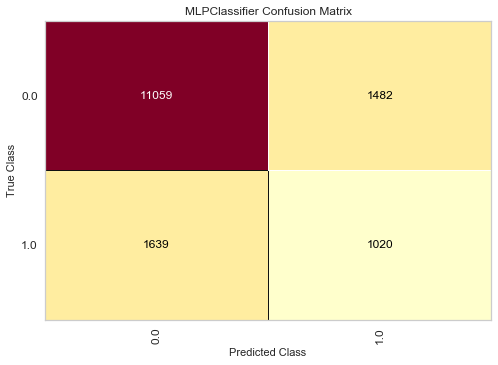

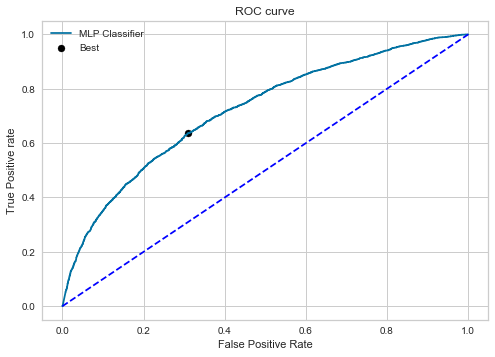

---------light Gradient Boosting------------
Accuracy  (%): 
 79.44736842105263
Precision: 
 40.99186361875242
Recall (%): 
 39.789394509213984
f1 score (%): 
 40.38167938931297
logistic loss :
 7.098707581880734
              precision    recall  f1-score   support

         0.0       0.87      0.88      0.88     12541
         1.0       0.41      0.40      0.40      2659

    accuracy                           0.79     15200
   macro avg       0.64      0.64      0.64     15200
weighted avg       0.79      0.79      0.79     15200

AUC  (%): 
 73.21505432096225
Best Threshold=0.312683, G-Mean=0.669


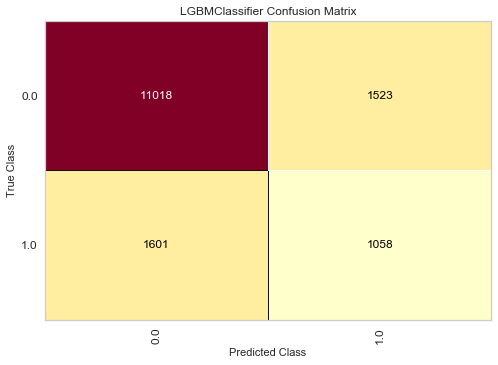

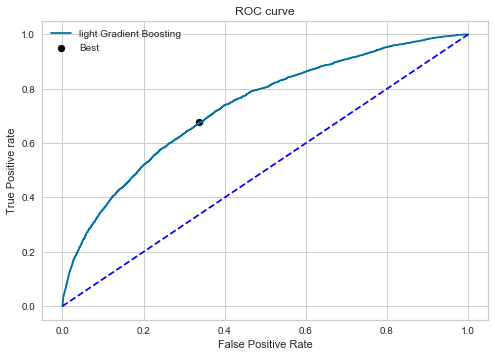

---------Gradient Boosting Classifier------------
Accuracy  (%): 
 79.98026315789474
Precision: 
 42.05298013245033
Recall (%): 
 38.209853328318914
f1 score (%): 
 40.039408866995075
logistic loss :
 6.914645789876018
              precision    recall  f1-score   support

         0.0       0.87      0.89      0.88     12541
         1.0       0.42      0.38      0.40      2659

    accuracy                           0.80     15200
   macro avg       0.65      0.64      0.64     15200
weighted avg       0.79      0.80      0.80     15200

AUC  (%): 
 72.86554857495021
Best Threshold=0.302811, G-Mean=0.667


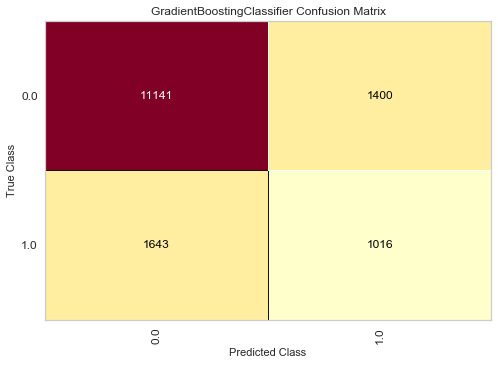

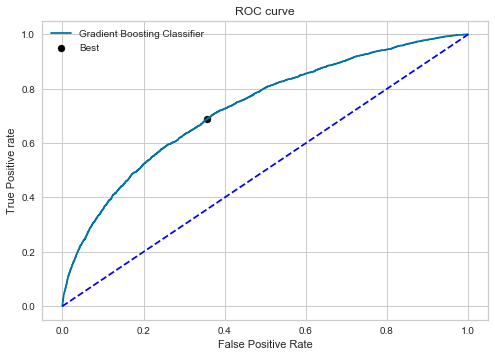

,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,44.659546,25.159835,0.707787,81.453947
1,Nearest Neighbors,29.140171,39.638962,0.642476,72.578947
2,Decision Tree,26.672149,36.592704,0.576313,71.309211
3,Naive Bayes,25.003382,69.499812,0.682762,58.197368
4,Random Forest,44.790343,26.513727,0.716897,81.427632
5,xgboost,38.234119,35.990974,0.713583,78.631579
6,Ada Boost,41.984733,37.232042,0.716846,80.019737
7,SVM,45.330296,22.452050,0.000000,81.697368
8,MLP Classifier,40.767386,38.360286,0.720278,79.467105
9,light Gradient Boosting,40.991864,39.789395,0.732151,79.447368


,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,44.659546,25.159835,0.707787,81.453947
1,Nearest Neighbors,29.140171,39.638962,0.642476,72.578947
2,Decision Tree,26.672149,36.592704,0.576313,71.309211
3,Naive Bayes,25.003382,69.499812,0.682762,58.197368
4,Random Forest,44.790343,26.513727,0.716897,81.427632
5,xgboost,38.234119,35.990974,0.713583,78.631579
6,Ada Boost,41.984733,37.232042,0.716846,80.019737
7,SVM,45.330296,22.452050,0.000000,81.697368
8,MLP Classifier,40.767386,38.360286,0.720278,79.467105
9,light Gradient Boosting,40.991864,39.789395,0.732151,79.447368


In [ ]:
t.fit_model_CV_FS_OS(df4,'SoldFlag',ratio=0.5,split=10,classification=True,threshold=5,min_max=False,svm_type='Linear')

### ML algorithms with undersampling, Random Forest Feature Selection and Cross Validation

StrengthFactor    18.148420
ItemCount         16.007022
LowUserPrice      15.443512
PriceReg          14.924216
LowNetPrice       14.814513
ReleaseYear        8.908874
ReleaseNumber      7.845963
MarketingType      3.907480
dtype: float64
Selected Features =['StrengthFactor', 'ItemCount', 'LowUserPrice', 'PriceReg', 'LowNetPrice', 'ReleaseYear', 'ReleaseNumber']
_____Cross Validation_____
---------Logistic Regression------------
Mean accuracy  (%): 
 69.94539343751083
Mean AUC  (%): 
 70.33283189068193
Mean Precision: 
 63.47221996152194
Mean Recall (%): 
 23.687791722850324
Mean f1 score (%): 
 34.4331421831111
---------Nearest Neighbors------------
Mean accuracy  (%): 
 67.62355196747629
Mean AUC  (%): 
 65.77176239916218
Mean Precision: 
 51.95765905313866
Mean Recall (%): 
 39.25422673996473
Mean f1 score (%): 
 44.70611573108664
---------Decision Tree------------
Mean accuracy  (%): 
 61.679405887991855
Mean AUC  (%): 
 56.99559174359508
Mean Precision: 
 42.995908829917006
Mean R

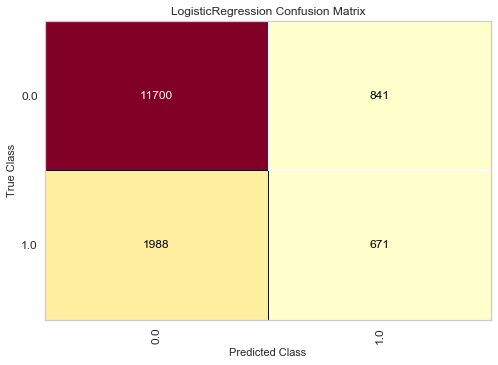

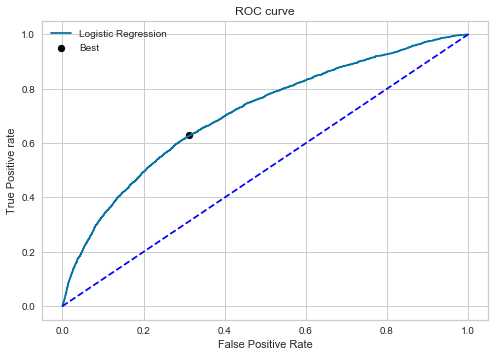

---------Nearest Neighbors------------
Accuracy  (%): 
 74.19078947368422
Precision: 
 31.345926800472256
Recall (%): 
 39.93982700263257
f1 score (%): 
 35.12485530014883
logistic loss :
 8.914307872424818
              precision    recall  f1-score   support

         0.0       0.86      0.81      0.84     12541
         1.0       0.31      0.40      0.35      2659

    accuracy                           0.74     15200
   macro avg       0.59      0.61      0.60     15200
weighted avg       0.77      0.74      0.75     15200

AUC  (%): 
 65.0962923596313
Best Threshold=0.400000, G-Mean=0.615


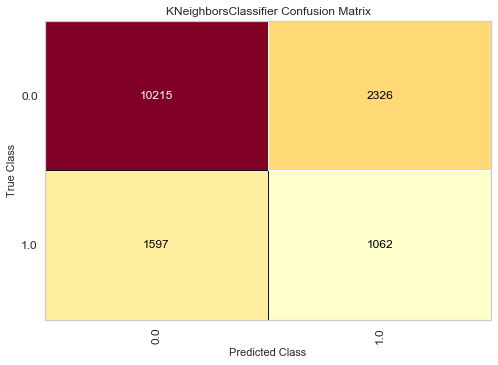

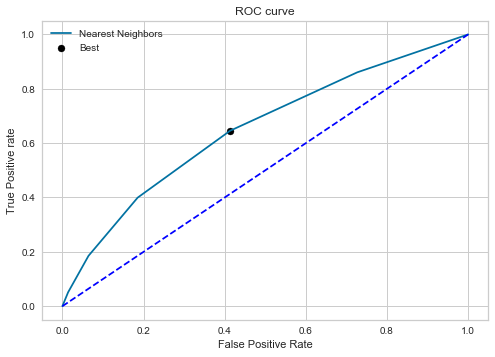

---------Decision Tree------------
Accuracy  (%): 
 67.1907894736842
Precision: 
 25.191815856777495
Recall (%): 
 44.45280180518992
f1 score (%): 
 32.158889946946
logistic loss :
 11.33208450449997
              precision    recall  f1-score   support

         0.0       0.86      0.72      0.78     12541
         1.0       0.25      0.44      0.32      2659

    accuracy                           0.67     15200
   macro avg       0.56      0.58      0.55     15200
weighted avg       0.75      0.67      0.70     15200

AUC  (%): 
 58.232301548476464
Best Threshold=1.000000, G-Mean=0.566


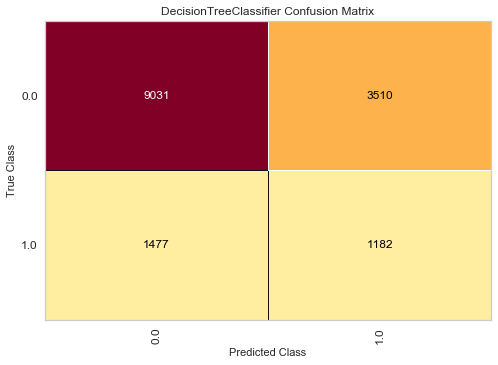

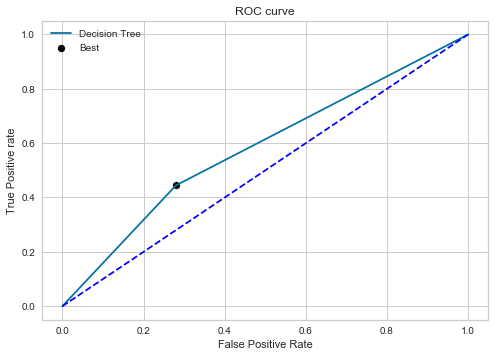

---------Naive Bayes------------
Accuracy  (%): 
 50.53947368421052
Precision: 
 22.65616207090602
Recall (%): 
 75.70515231289959
f1 score (%): 
 34.87525987525988
logistic loss :
 17.08342209016308
              precision    recall  f1-score   support

         0.0       0.90      0.45      0.60     12541
         1.0       0.23      0.76      0.35      2659

    accuracy                           0.51     15200
   macro avg       0.56      0.60      0.48     15200
weighted avg       0.78      0.51      0.56     15200

AUC  (%): 
 68.64319481142844
Best Threshold=0.597216, G-Mean=0.647


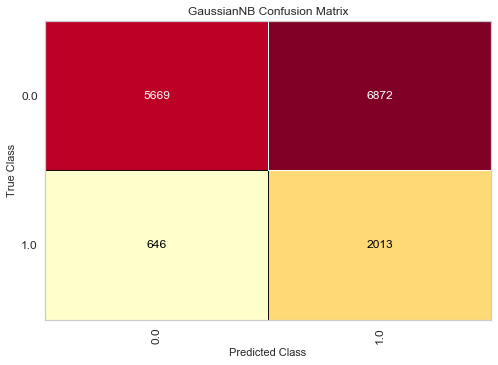

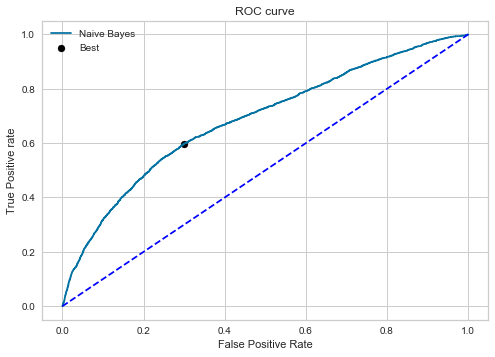

---------Random Forest------------
Accuracy  (%): 
 78.94736842105263
Precision: 
 39.51143854207057
Recall (%): 
 38.322677698382854
f1 score (%): 
 38.907980145093546
logistic loss :
 7.271403410243769
              precision    recall  f1-score   support

         0.0       0.87      0.88      0.87     12541
         1.0       0.40      0.38      0.39      2659

    accuracy                           0.79     15200
   macro avg       0.63      0.63      0.63     15200
weighted avg       0.79      0.79      0.79     15200

AUC  (%): 
 72.12764096906187
Best Threshold=0.360000, G-Mean=0.664


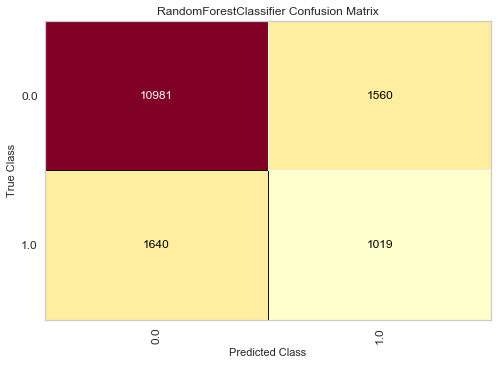

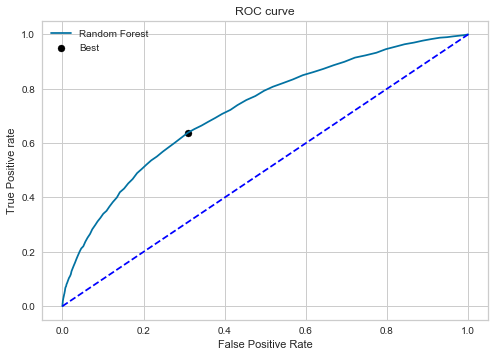

---------xgboost------------
Accuracy  (%): 
 77.54605263157895
Precision: 
 37.044673539518904
Recall (%): 
 40.54155697630688
f1 score (%): 
 38.71431136649308
logistic loss :
 7.755415045942255
              precision    recall  f1-score   support

         0.0       0.87      0.85      0.86     12541
         1.0       0.37      0.41      0.39      2659

    accuracy                           0.78     15200
   macro avg       0.62      0.63      0.62     15200
weighted avg       0.78      0.78      0.78     15200

AUC  (%): 
 71.37521610576503
Best Threshold=0.330387, G-Mean=0.660


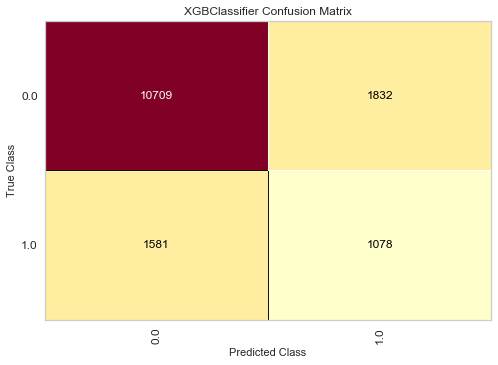

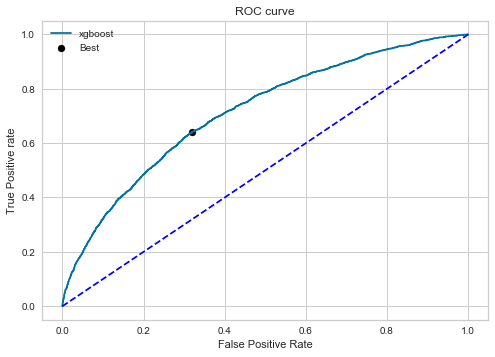

---------Ada Boost------------
Accuracy  (%): 
 79.75
Precision: 
 41.178947368421056
Recall (%): 
 36.78074464084242
f1 score (%): 
 38.855780691299174
logistic loss :
 6.99417570928586
              precision    recall  f1-score   support

         0.0       0.87      0.89      0.88     12541
         1.0       0.41      0.37      0.39      2659

    accuracy                           0.80     15200
   macro avg       0.64      0.63      0.63     15200
weighted avg       0.79      0.80      0.79     15200

AUC  (%): 
 71.8657200771091
Best Threshold=0.496397, G-Mean=0.663


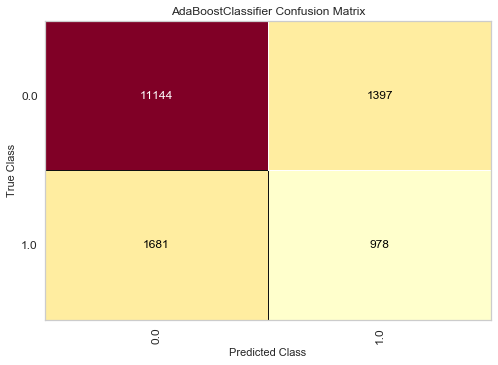

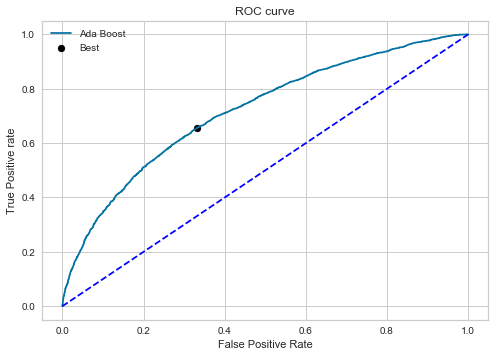

---------SVM------------
Accuracy  (%): 
 81.74342105263158
Precision: 
 45.517774343122106
Recall (%): 
 22.15118465588567
f1 score (%): 
 29.800151783455604
logistic loss :
 6.3056360665832525
              precision    recall  f1-score   support

         0.0       0.85      0.94      0.90     12541
         1.0       0.46      0.22      0.30      2659

    accuracy                           0.82     15200
   macro avg       0.65      0.58      0.60     15200
weighted avg       0.78      0.82      0.79     15200

AUC score cannot be calculated for linear SVM


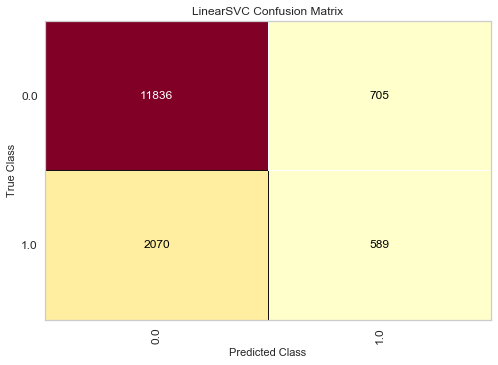

---------MLP Classifier------------
Accuracy  (%): 
 80.3157894736842
Precision: 
 42.503376857271505
Recall (%): 
 35.502068446784506
f1 score (%): 
 38.688524590163944
logistic loss :
 6.7987526354928365
              precision    recall  f1-score   support

         0.0       0.87      0.90      0.88     12541
         1.0       0.43      0.36      0.39      2659

    accuracy                           0.80     15200
   macro avg       0.65      0.63      0.63     15200
weighted avg       0.79      0.80      0.80     15200

AUC  (%): 
 72.17686199869917
Best Threshold=0.341568, G-Mean=0.665


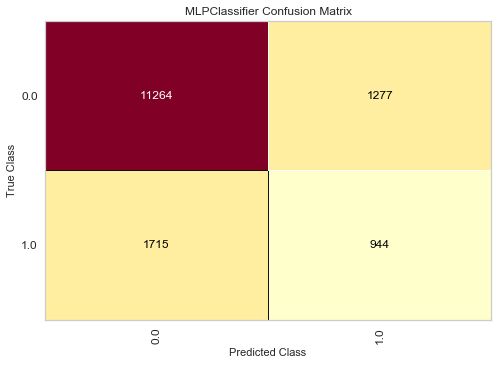

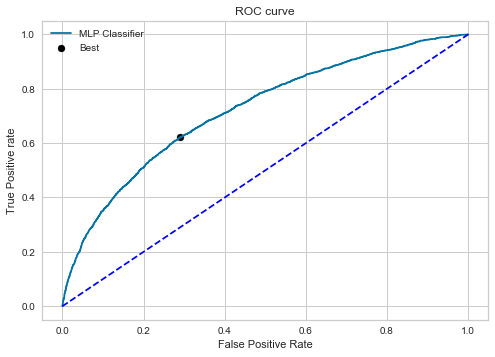

---------light Gradient Boosting------------
Accuracy  (%): 
 79.07236842105263
Precision: 
 40.15094339622641
Recall (%): 
 40.01504324934186
f1 score (%): 
 40.08287813147485
logistic loss :
 7.228231307482577
              precision    recall  f1-score   support

         0.0       0.87      0.87      0.87     12541
         1.0       0.40      0.40      0.40      2659

    accuracy                           0.79     15200
   macro avg       0.64      0.64      0.64     15200
weighted avg       0.79      0.79      0.79     15200

AUC  (%): 
 72.79583665089602
Best Threshold=0.321423, G-Mean=0.668


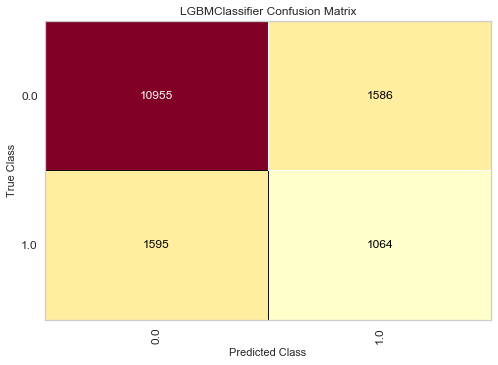

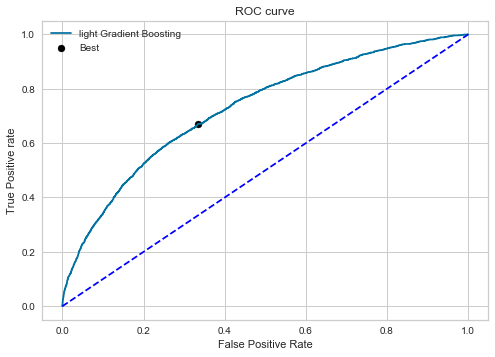

---------Gradient Boosting Classifier------------
Accuracy  (%): 
 79.90131578947368
Precision: 
 41.777408637873755
Recall (%): 
 37.83377209477247
f1 score (%): 
 39.707913953029404
logistic loss :
 6.94191335013482
              precision    recall  f1-score   support

         0.0       0.87      0.89      0.88     12541
         1.0       0.42      0.38      0.40      2659

    accuracy                           0.80     15200
   macro avg       0.64      0.63      0.64     15200
weighted avg       0.79      0.80      0.80     15200

AUC  (%): 
 72.95881618108325
Best Threshold=0.320893, G-Mean=0.670


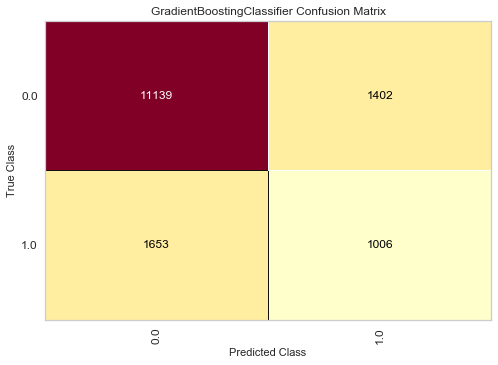

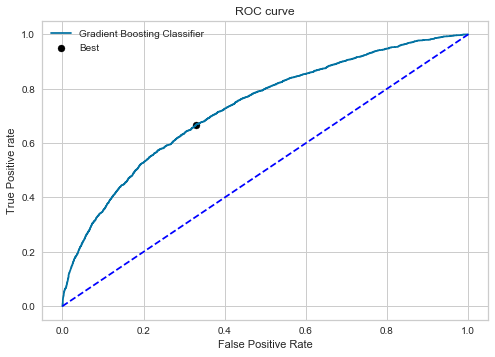

,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,44.378307,25.235051,0.707794,81.388158
1,Nearest Neighbors,31.345927,39.939827,0.650963,74.190789
2,Decision Tree,25.191816,44.452802,0.582323,67.190789
3,Naive Bayes,22.656162,75.705152,0.686432,50.539474
4,Random Forest,39.511439,38.322678,0.721276,78.947368
5,xgboost,37.044674,40.541557,0.713752,77.546053
6,Ada Boost,41.178947,36.780745,0.718657,79.750000
7,SVM,45.517774,22.151185,0.000000,81.743421
8,MLP Classifier,42.503377,35.502068,0.721769,80.315789
9,light Gradient Boosting,40.150943,40.015043,0.727958,79.072368


,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,44.378307,25.235051,0.707794,81.388158
1,Nearest Neighbors,31.345927,39.939827,0.650963,74.190789
2,Decision Tree,25.191816,44.452802,0.582323,67.190789
3,Naive Bayes,22.656162,75.705152,0.686432,50.539474
4,Random Forest,39.511439,38.322678,0.721276,78.947368
5,xgboost,37.044674,40.541557,0.713752,77.546053
6,Ada Boost,41.178947,36.780745,0.718657,79.750000
7,SVM,45.517774,22.151185,0.000000,81.743421
8,MLP Classifier,42.503377,35.502068,0.721769,80.315789
9,light Gradient Boosting,40.150943,40.015043,0.727958,79.072368


In [ ]:
t.fit_model_CV_FS_US(df4,'SoldFlag',ratio=0.5,split=10,classification=True,threshold=5,min_max=False,svm_type='Linear')

Above techniques have failed to produce a model with satisfactory results. Only random forest has achieved a cross validation f1 score of 69% and a cross validation recall score of 64% as a result of oversampling. However the same model had poor results on the test dataset.

#### LDA

In [ ]:
ldadf=t.lda(df4,'SoldFlag',1)

In [ ]:
ldadf

,Feature 1,SoldFlag
0,0.648050,0.0
1,0.624757,0.0
2,0.705506,0.0
3,0.654487,1.0
4,0.495565,1.0
...,...,...
75991,-0.590137,0.0
75992,-0.572411,0.0
75993,-0.870823,0.0
75994,-0.925170,0.0


---------Logistic Regression------------
Accuracy  (%): 
 83.05263157894737
Precision: 
 59.76470588235294
Recall (%): 
 9.552463332079729
f1 score (%): 
 16.472114137483786
logistic loss :
 5.853422679240164
              precision    recall  f1-score   support

         0.0       0.84      0.99      0.91     12541
         1.0       0.60      0.10      0.16      2659

    accuracy                           0.83     15200
   macro avg       0.72      0.54      0.54     15200
weighted avg       0.80      0.83      0.78     15200

AUC  (%): 
 74.75940442239263
Best Threshold=0.163988, G-Mean=0.686


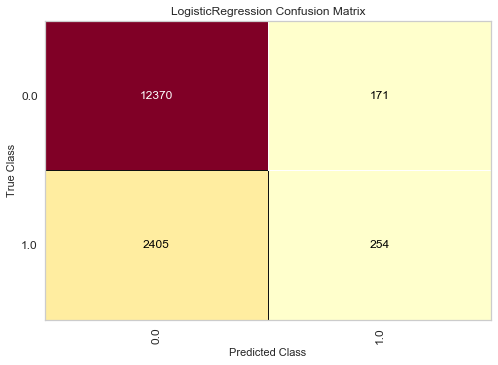

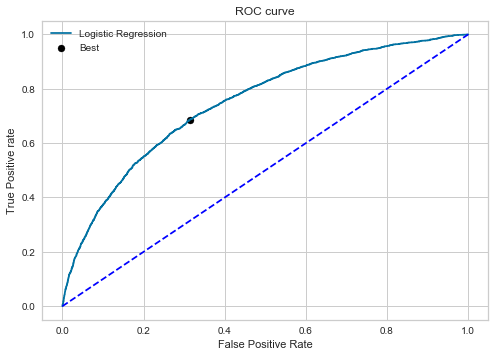

---------Nearest Neighbors------------
Accuracy  (%): 
 80.70394736842104
Precision: 
 38.54515050167224
Recall (%): 
 17.33734486649116
f1 score (%): 
 23.916990920881968
logistic loss :
 6.664659136209488
              precision    recall  f1-score   support

         0.0       0.84      0.94      0.89     12541
         1.0       0.39      0.17      0.24      2659

    accuracy                           0.81     15200
   macro avg       0.61      0.56      0.56     15200
weighted avg       0.76      0.81      0.78     15200

AUC  (%): 
 64.64910475363259
Best Threshold=0.200000, G-Mean=0.605


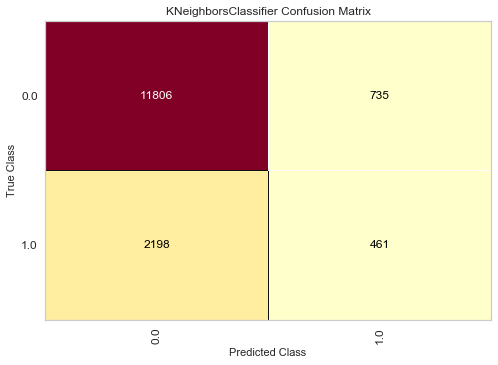

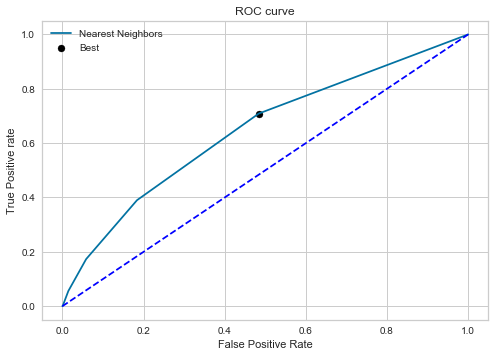

---------Decision Tree------------
Accuracy  (%): 
 75.15131578947368
Precision: 
 27.49597423510467
Recall (%): 
 25.686348251222263
f1 score (%): 
 26.560373322963255
logistic loss :
 8.58252621832562
              precision    recall  f1-score   support

         0.0       0.84      0.86      0.85     12541
         1.0       0.27      0.26      0.27      2659

    accuracy                           0.75     15200
   macro avg       0.56      0.56      0.56     15200
weighted avg       0.74      0.75      0.75     15200

AUC  (%): 
 55.65808982940619
Best Threshold=0.500000, G-Mean=0.469


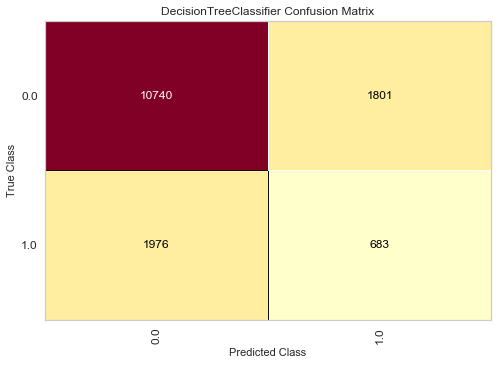

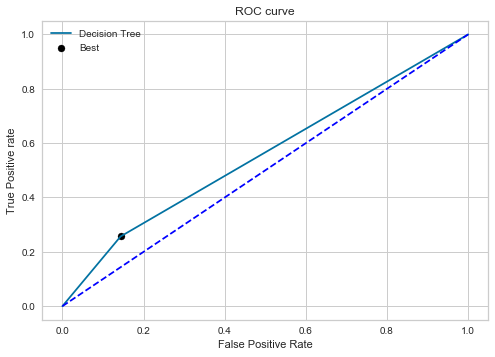

---------Naive Bayes------------
Accuracy  (%): 
 82.96710526315789
Precision: 
 54.97159090909091
Recall (%): 
 14.55434373824746
f1 score (%): 
 23.015165031222125
logistic loss :
 5.882970102553233
              precision    recall  f1-score   support

         0.0       0.84      0.97      0.90     12541
         1.0       0.55      0.15      0.23      2659

    accuracy                           0.83     15200
   macro avg       0.70      0.56      0.57     15200
weighted avg       0.79      0.83      0.79     15200

AUC  (%): 
 74.7525191460014
Best Threshold=0.139515, G-Mean=0.686


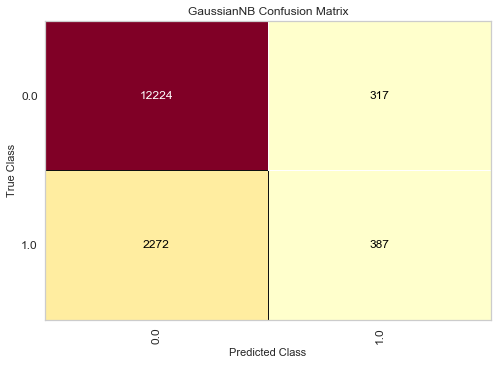

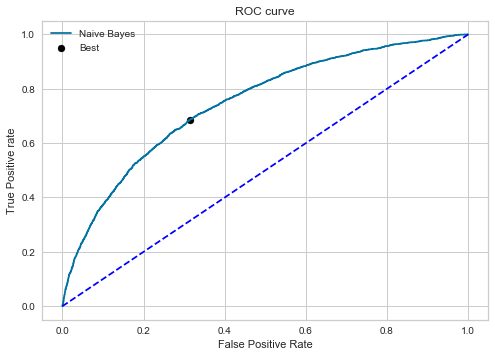

---------Random Forest------------
Accuracy  (%): 
 75.15131578947368
Precision: 
 27.47784045124899
Recall (%): 
 25.64874012786762
f1 score (%): 
 26.53180315113791
logistic loss :
 8.582526165720527
              precision    recall  f1-score   support

         0.0       0.84      0.86      0.85     12541
         1.0       0.27      0.26      0.27      2659

    accuracy                           0.75     15200
   macro avg       0.56      0.56      0.56     15200
weighted avg       0.74      0.75      0.75     15200

AUC  (%): 
 63.35859823929448
Best Threshold=0.020000, G-Mean=0.610


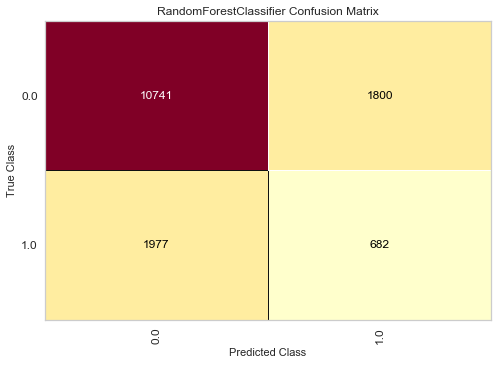

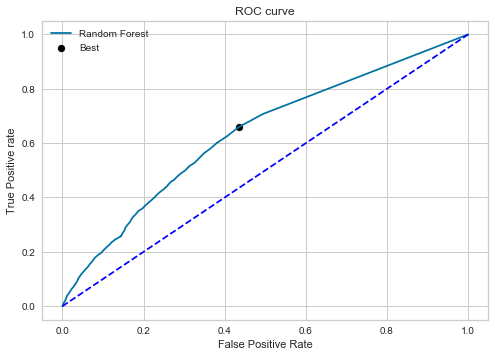

---------xgboost------------
Accuracy  (%): 
 82.83552631578948
Precision: 
 55.68181818181818
Recall (%): 
 9.213990221887927
f1 score (%): 
 15.811552113585027
logistic loss :
 5.92840944314611
              precision    recall  f1-score   support

         0.0       0.84      0.98      0.90     12541
         1.0       0.56      0.09      0.16      2659

    accuracy                           0.83     15200
   macro avg       0.70      0.54      0.53     15200
weighted avg       0.79      0.83      0.77     15200

AUC  (%): 
 74.1997807927118
Best Threshold=0.167588, G-Mean=0.681


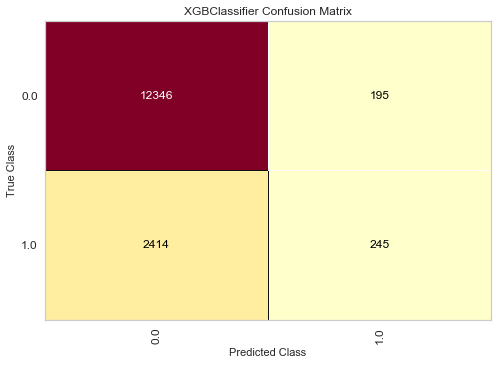

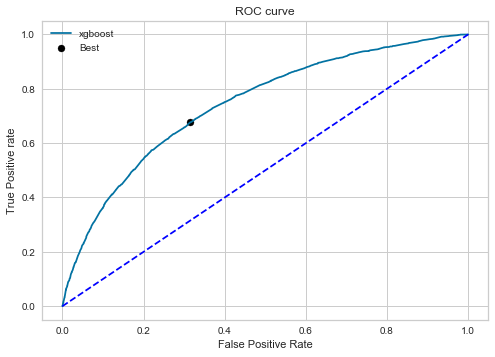

---------Ada Boost------------
Accuracy  (%): 
 83.01973684210526
Precision: 
 55.96330275229357
Recall (%): 
 13.764573147799924
f1 score (%): 
 22.094778146694836
logistic loss :
 5.864790273639761
              precision    recall  f1-score   support

         0.0       0.84      0.98      0.90     12541
         1.0       0.56      0.14      0.22      2659

    accuracy                           0.83     15200
   macro avg       0.70      0.56      0.56     15200
weighted avg       0.79      0.83      0.79     15200

AUC  (%): 
 74.63109567748285
Best Threshold=0.492155, G-Mean=0.686


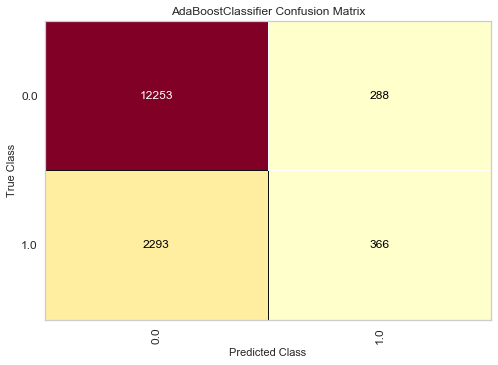

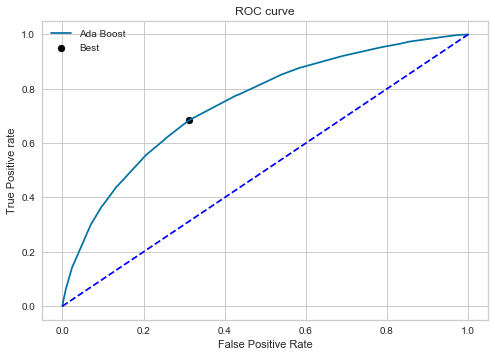

---------SVM------------
Accuracy  (%): 
 82.96710526315789
Precision: 
 60.29411764705882
Recall (%): 
 7.709665287702144
f1 score (%): 
 13.671223741247083
logistic loss :
 5.882960528426108
              precision    recall  f1-score   support

         0.0       0.83      0.99      0.91     12541
         1.0       0.60      0.08      0.14      2659

    accuracy                           0.83     15200
   macro avg       0.72      0.53      0.52     15200
weighted avg       0.79      0.83      0.77     15200

AUC  (%): 
 58.58914089353675
Best Threshold=0.156632, G-Mean=0.578


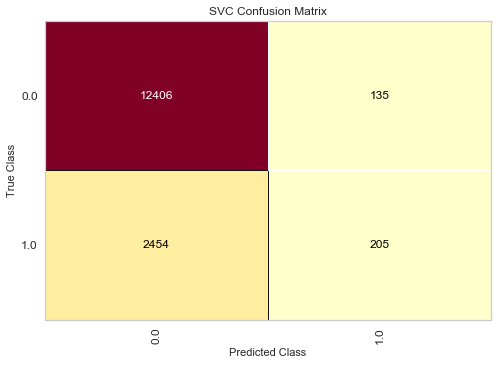

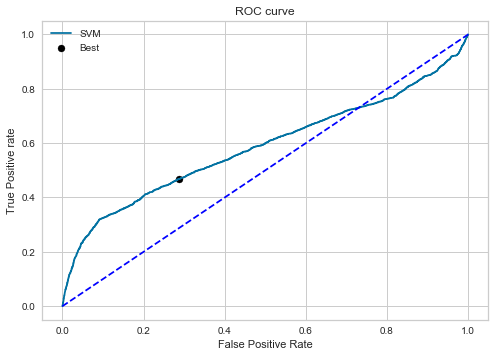

---------MLP Classifier------------
Accuracy  (%): 
 82.95394736842105
Precision: 
 62.142857142857146
Recall (%): 
 6.543813463708161
f1 score (%): 
 11.84076216400136
logistic loss :
 5.887503578719814
              precision    recall  f1-score   support

         0.0       0.83      0.99      0.91     12541
         1.0       0.62      0.07      0.12      2659

    accuracy                           0.83     15200
   macro avg       0.73      0.53      0.51     15200
weighted avg       0.80      0.83      0.77     15200

AUC  (%): 
 74.75940442239263
Best Threshold=0.163267, G-Mean=0.686


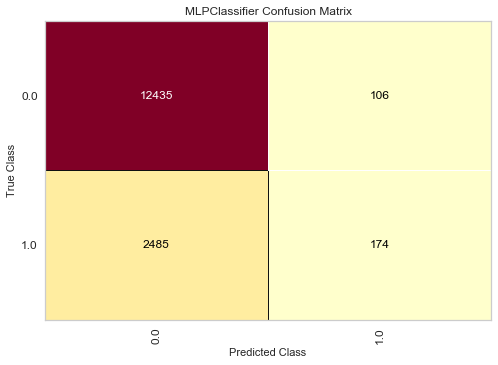

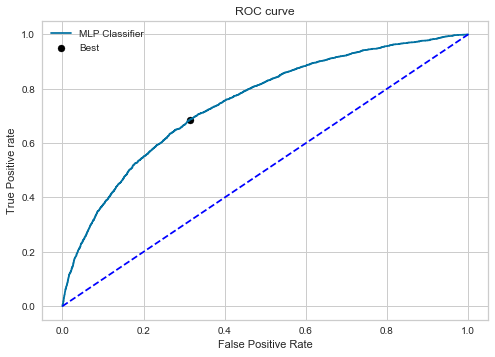

---------light Gradient Boosting------------
Accuracy  (%): 
 83.125
Precision: 
 59.67078189300411
Recall (%): 
 10.906355772846934
f1 score (%): 
 18.441971383147855
logistic loss :
 5.82842882723962
              precision    recall  f1-score   support

         0.0       0.84      0.98      0.91     12541
         1.0       0.60      0.11      0.18      2659

    accuracy                           0.83     15200
   macro avg       0.72      0.55      0.55     15200
weighted avg       0.80      0.83      0.78     15200

AUC  (%): 
 74.46442010933735
Best Threshold=0.156919, G-Mean=0.686


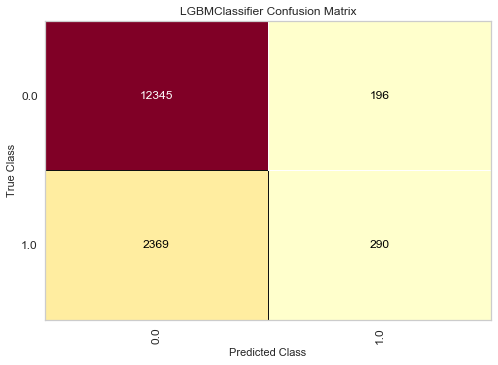

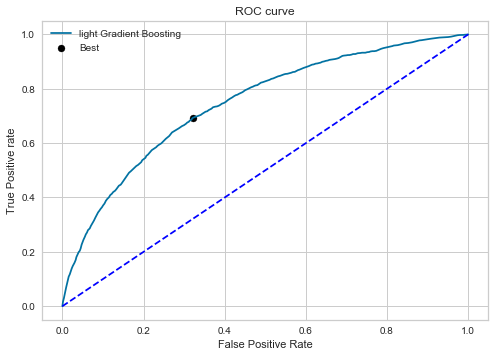

---------Gradient Boosting Classifier------------
Accuracy  (%): 
 83.00657894736842
Precision: 
 58.05084745762712
Recall (%): 
 10.304625799172621
f1 score (%): 
 17.502395400830405
logistic loss :
 5.869330115022729
              precision    recall  f1-score   support

         0.0       0.84      0.98      0.91     12541
         1.0       0.58      0.10      0.18      2659

    accuracy                           0.83     15200
   macro avg       0.71      0.54      0.54     15200
weighted avg       0.79      0.83      0.78     15200

AUC  (%): 
 74.64280304639894
Best Threshold=0.161938, G-Mean=0.685


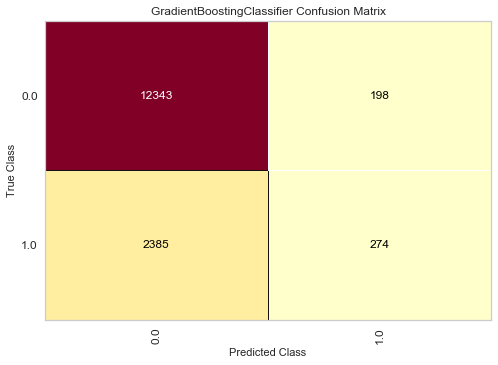

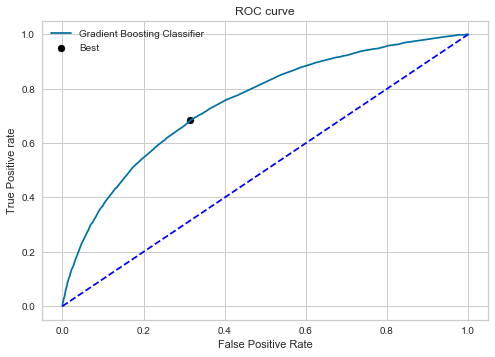

,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,59.764706,9.552463,0.747594,83.052632
1,Nearest Neighbors,38.545151,17.337345,0.646491,80.703947
2,Decision Tree,27.495974,25.686348,0.556581,75.151316
3,Naive Bayes,54.971591,14.554344,0.747525,82.967105
4,Random Forest,27.477840,25.648740,0.633586,75.151316
5,xgboost,55.681818,9.213990,0.741998,82.835526
6,Ada Boost,55.963303,13.764573,0.746311,83.019737
7,SVM,60.294118,7.709665,0.585891,82.967105
8,MLP Classifier,62.142857,6.543813,0.747594,82.953947
9,light Gradient Boosting,59.670782,10.906356,0.744644,83.125000


,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,59.764706,9.552463,0.747594,83.052632
1,Nearest Neighbors,38.545151,17.337345,0.646491,80.703947
2,Decision Tree,27.495974,25.686348,0.556581,75.151316
3,Naive Bayes,54.971591,14.554344,0.747525,82.967105
4,Random Forest,27.477840,25.648740,0.633586,75.151316
5,xgboost,55.681818,9.213990,0.741998,82.835526
6,Ada Boost,55.963303,13.764573,0.746311,83.019737
7,SVM,60.294118,7.709665,0.585891,82.967105
8,MLP Classifier,62.142857,6.543813,0.747594,82.953947
9,light Gradient Boosting,59.670782,10.906356,0.744644,83.125000


In [ ]:
t.fit_model(ldadf,'SoldFlag',classification=True,min_max=False,svm_type = "non-Linear",kernel='rbf')

_____Cross Validation_____
---------Logistic Regression------------
Mean accuracy  (%): 
 83.59505939046828
Mean AUC  (%): 
 74.20626380484137
Mean Precision: 
 59.37070944644943
Mean Recall (%): 
 9.945977426999237
Mean f1 score (%): 
 17.022515233757247
---------Nearest Neighbors------------
Mean accuracy  (%): 
 81.10359652971833
Mean AUC  (%): 
 64.16416264831076
Mean Precision: 
 37.400589384497536
Mean Recall (%): 
 17.146644173996865
Mean f1 score (%): 
 23.48982218377391
---------Decision Tree------------
Mean accuracy  (%): 
 74.94513983510774
Mean AUC  (%): 
 55.46508914290121
Mean Precision: 
 26.081026437885562
Mean Recall (%): 
 26.003936217214928
Mean f1 score (%): 
 26.023183386619685
---------Naive Bayes------------
Mean accuracy  (%): 
 83.33627398905337
Mean AUC  (%): 
 74.12380954611974
Mean Precision: 
 52.85938860896593
Mean Recall (%): 
 15.126186555274396
Mean f1 score (%): 
 23.48657740751856
---------Random Forest------------
Mean accuracy  (%): 
 74.9495258000

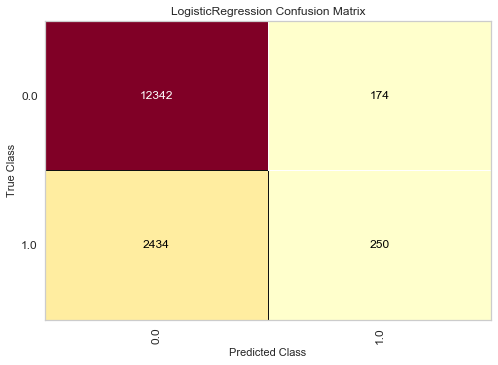

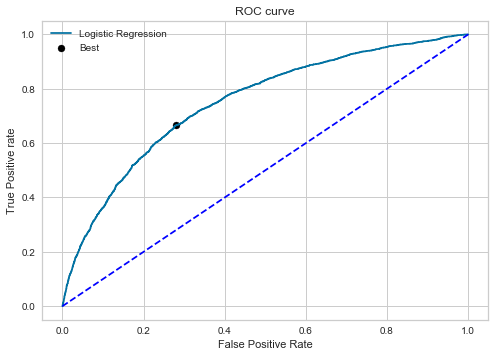

---------Nearest Neighbors------------
Accuracy  (%): 
 80.625
Precision: 
 39.796716184519155
Recall (%): 
 18.964232488822653
f1 score (%): 
 25.687610396164516
logistic loss :
 6.691928432436396
              precision    recall  f1-score   support

         0.0       0.84      0.94      0.89     12516
         1.0       0.40      0.19      0.26      2684

    accuracy                           0.81     15200
   macro avg       0.62      0.56      0.57     15200
weighted avg       0.77      0.81      0.78     15200

AUC  (%): 
 64.69165965328911
Best Threshold=0.200000, G-Mean=0.602


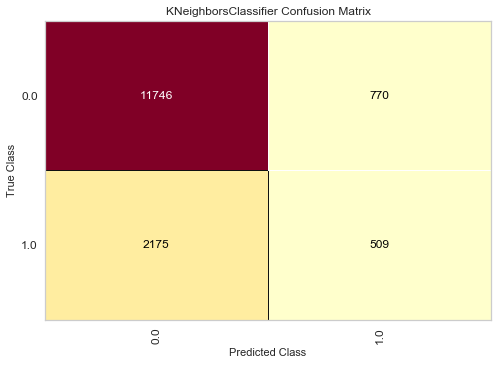

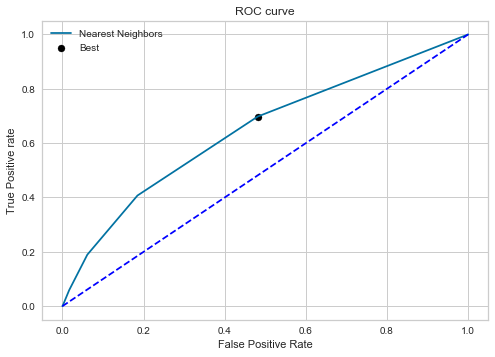

---------Decision Tree------------
Accuracy  (%): 
 74.61842105263158
Precision: 
 27.44043043812452
Recall (%): 
 26.60208643815201
f1 score (%): 
 27.01475595913735
logistic loss :
 8.76658611654695
              precision    recall  f1-score   support

         0.0       0.84      0.85      0.85     12516
         1.0       0.27      0.27      0.27      2684

    accuracy                           0.75     15200
   macro avg       0.56      0.56      0.56     15200
weighted avg       0.74      0.75      0.74     15200

AUC  (%): 
 55.729375787963086
Best Threshold=1.000000, G-Mean=0.475


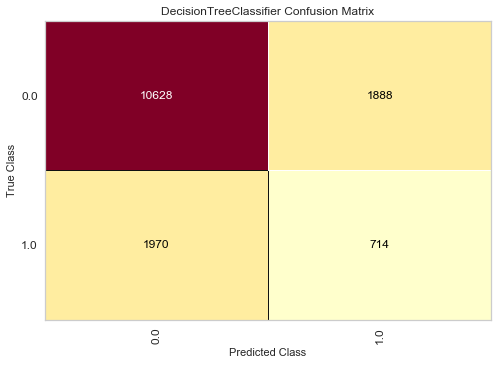

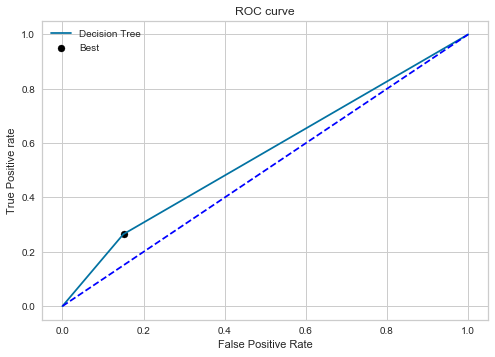

---------Naive Bayes------------
Accuracy  (%): 
 82.82236842105263
Precision: 
 54.96598639455782
Recall (%): 
 15.052160953800298
f1 score (%): 
 23.63264112313542
logistic loss :
 5.932961173280341
              precision    recall  f1-score   support

         0.0       0.84      0.97      0.90     12516
         1.0       0.55      0.15      0.24      2684

    accuracy                           0.83     15200
   macro avg       0.70      0.56      0.57     15200
weighted avg       0.79      0.83      0.79     15200

AUC  (%): 
 74.90233663355018
Best Threshold=0.155218, G-Mean=0.692


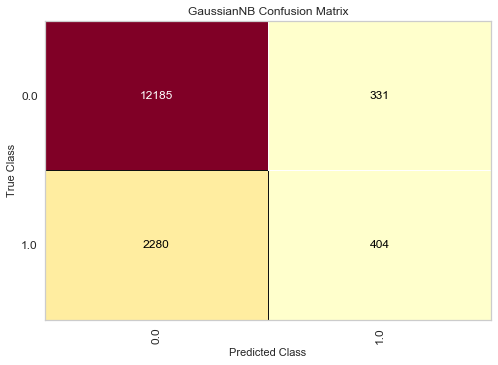

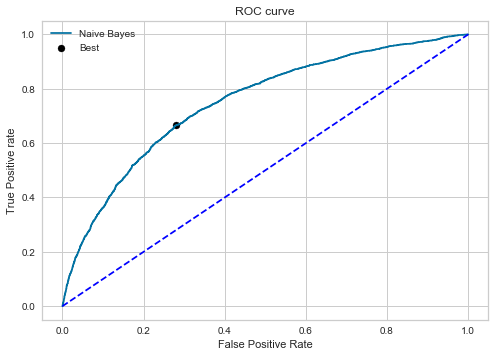

---------Random Forest------------
Accuracy  (%): 
 74.625
Precision: 
 27.416249518675397
Recall (%): 
 26.527570789865873
f1 score (%): 
 26.964590039765195
logistic loss :
 8.764313670810948
              precision    recall  f1-score   support

         0.0       0.84      0.85      0.85     12516
         1.0       0.27      0.27      0.27      2684

    accuracy                           0.75     15200
   macro avg       0.56      0.56      0.56     15200
weighted avg       0.74      0.75      0.74     15200

AUC  (%): 
 63.15782564338511
Best Threshold=0.030000, G-Mean=0.609


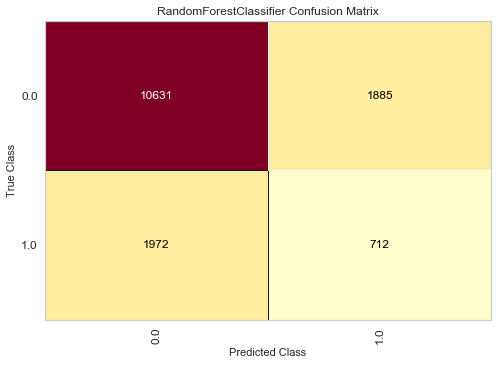

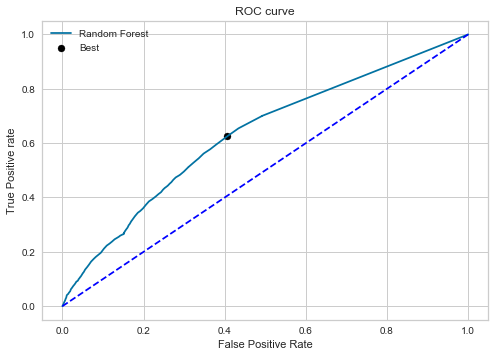

---------xgboost------------
Accuracy  (%): 
 82.69736842105263
Precision: 
 55.42168674698795
Recall (%): 
 10.283159463487332
f1 score (%): 
 17.347580138277813
logistic loss :
 5.9761289098187245
              precision    recall  f1-score   support

         0.0       0.84      0.98      0.90     12516
         1.0       0.55      0.10      0.17      2684

    accuracy                           0.83     15200
   macro avg       0.70      0.54      0.54     15200
weighted avg       0.79      0.83      0.77     15200

AUC  (%): 
 73.86188897287478
Best Threshold=0.172580, G-Mean=0.685


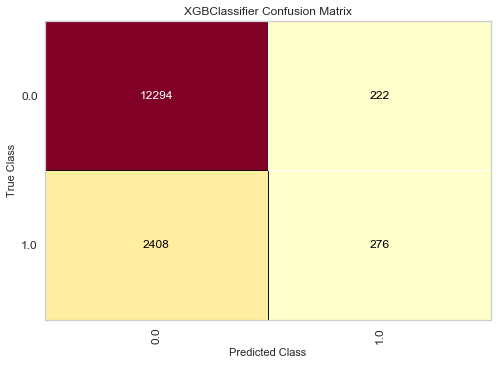

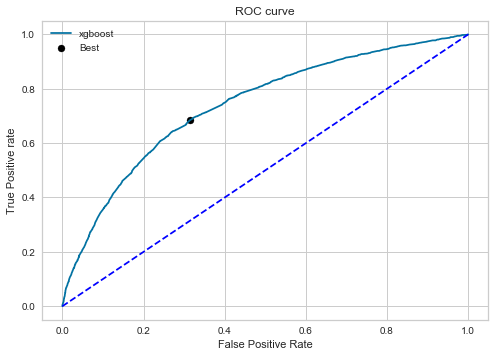

---------Ada Boost------------
Accuracy  (%): 
 82.78289473684211
Precision: 
 54.94830132939439
Recall (%): 
 13.859910581222056
f1 score (%): 
 22.13626896756918
logistic loss :
 5.9465935330722015
              precision    recall  f1-score   support

         0.0       0.84      0.98      0.90     12516
         1.0       0.55      0.14      0.22      2684

    accuracy                           0.83     15200
   macro avg       0.70      0.56      0.56     15200
weighted avg       0.79      0.83      0.78     15200

AUC  (%): 
 74.6084460474795
Best Threshold=0.492037, G-Mean=0.691


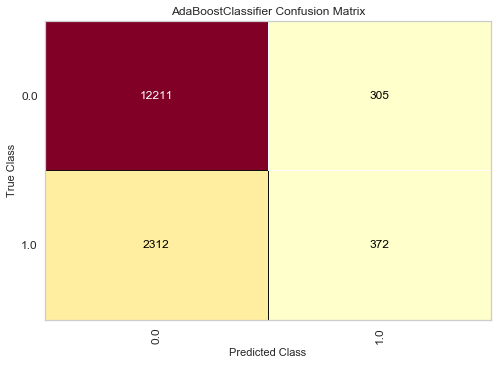

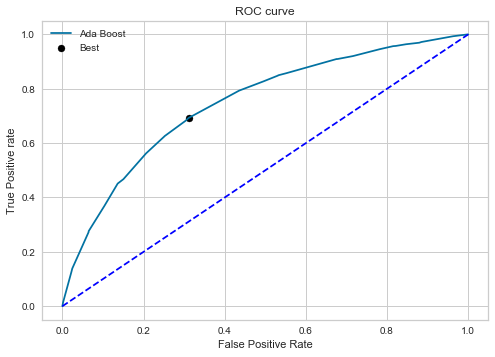

---------SVM------------
Accuracy  (%): 
 82.79605263157895
Precision: 
 59.24932975871313
Recall (%): 
 8.23397913561848
f1 score (%): 
 14.458619561661761
logistic loss :
 5.942040908651371
              precision    recall  f1-score   support

         0.0       0.83      0.99      0.90     12516
         1.0       0.59      0.08      0.14      2684

    accuracy                           0.83     15200
   macro avg       0.71      0.54      0.52     15200
weighted avg       0.79      0.83      0.77     15200

AUC  (%): 
 59.20398640857437
Best Threshold=0.155668, G-Mean=0.585


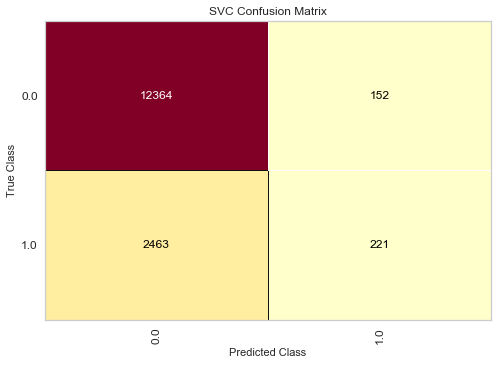

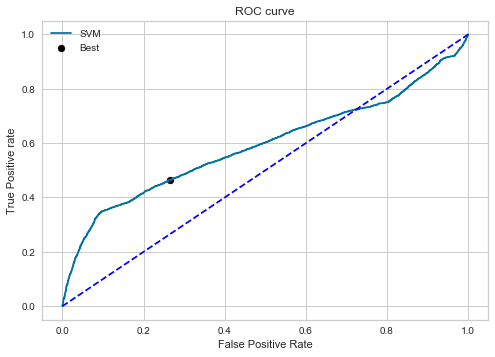

---------MLP Classifier------------
Accuracy  (%): 
 82.875
Precision: 
 58.59872611464968
Recall (%): 
 10.283159463487332
f1 score (%): 
 17.496038034865293
logistic loss :
 5.914775715621803
              precision    recall  f1-score   support

         0.0       0.84      0.98      0.90     12516
         1.0       0.59      0.10      0.17      2684

    accuracy                           0.83     15200
   macro avg       0.71      0.54      0.54     15200
weighted avg       0.79      0.83      0.78     15200

AUC  (%): 
 74.90560815390279
Best Threshold=0.183425, G-Mean=0.692


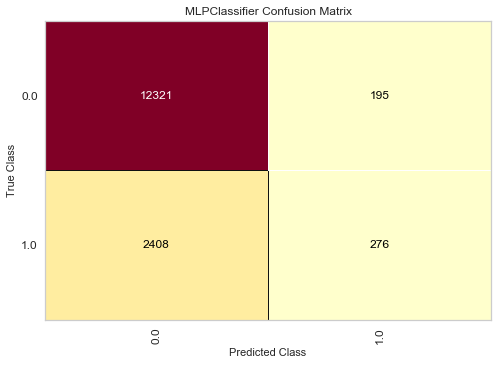

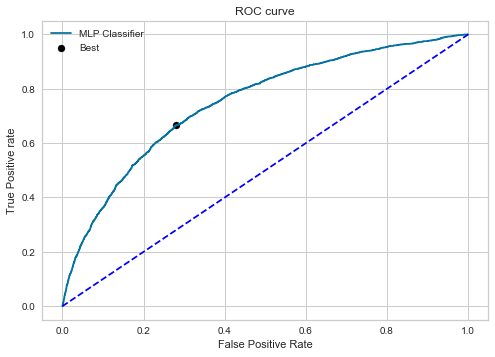

---------light Gradient Boosting------------
Accuracy  (%): 
 82.6907894736842
Precision: 
 54.70692717584369
Recall (%): 
 11.475409836065573
f1 score (%): 
 18.971358176778566
logistic loss :
 5.978402933707547
              precision    recall  f1-score   support

         0.0       0.84      0.98      0.90     12516
         1.0       0.55      0.11      0.19      2684

    accuracy                           0.83     15200
   macro avg       0.69      0.55      0.55     15200
weighted avg       0.79      0.83      0.78     15200

AUC  (%): 
 74.33664789843961
Best Threshold=0.188844, G-Mean=0.691


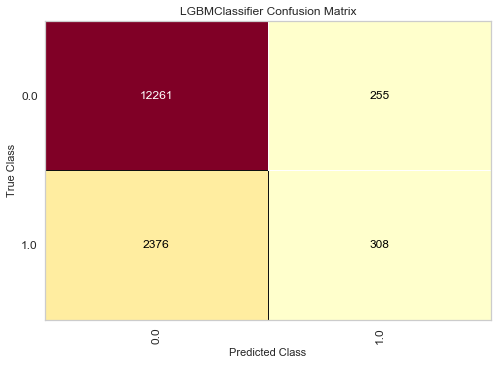

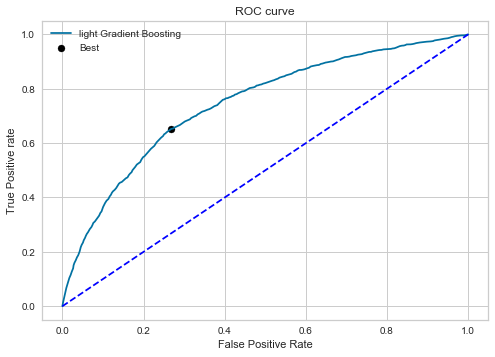

---------Gradient Boosting Classifier------------
Accuracy  (%): 
 82.78947368421052
Precision: 
 55.92334494773519
Recall (%): 
 11.959761549925485
f1 score (%): 
 19.70534069981584
logistic loss :
 5.944318509686592
              precision    recall  f1-score   support

         0.0       0.84      0.98      0.90     12516
         1.0       0.56      0.12      0.20      2684

    accuracy                           0.83     15200
   macro avg       0.70      0.55      0.55     15200
weighted avg       0.79      0.83      0.78     15200

AUC  (%): 
 74.65273957531082
Best Threshold=0.158588, G-Mean=0.690


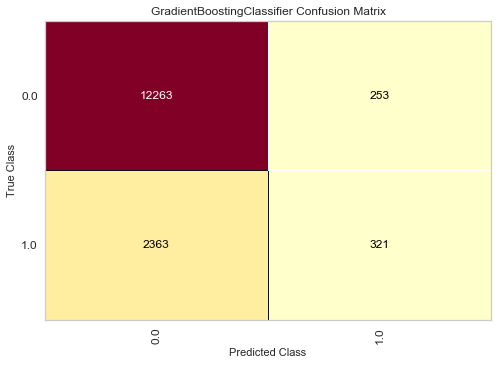

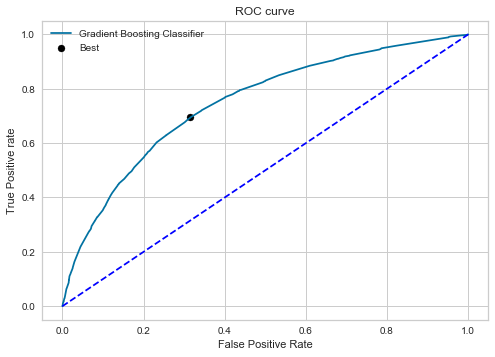

,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,58.962264,9.314456,0.749056,82.842105
1,Nearest Neighbors,39.796716,18.964232,0.646917,80.625000
2,Decision Tree,27.440430,26.602086,0.557294,74.618421
3,Naive Bayes,54.965986,15.052161,0.749023,82.822368
4,Random Forest,27.416250,26.527571,0.631578,74.625000
5,xgboost,55.421687,10.283159,0.738619,82.697368
6,Ada Boost,54.948301,13.859911,0.746084,82.782895
7,SVM,59.249330,8.233979,0.592040,82.796053
8,MLP Classifier,58.598726,10.283159,0.749056,82.875000
9,light Gradient Boosting,54.706927,11.475410,0.743366,82.690789


,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,58.962264,9.314456,0.749056,82.842105
1,Nearest Neighbors,39.796716,18.964232,0.646917,80.625000
2,Decision Tree,27.440430,26.602086,0.557294,74.618421
3,Naive Bayes,54.965986,15.052161,0.749023,82.822368
4,Random Forest,27.416250,26.527571,0.631578,74.625000
5,xgboost,55.421687,10.283159,0.738619,82.697368
6,Ada Boost,54.948301,13.859911,0.746084,82.782895
7,SVM,59.249330,8.233979,0.592040,82.796053
8,MLP Classifier,58.598726,10.283159,0.749056,82.875000
9,light Gradient Boosting,54.706927,11.475410,0.743366,82.690789


In [ ]:
t.fit_model_CV(ldadf,'SoldFlag',split=10,classification=True,min_max=False,svm_type = "non-Linear",kernel='rbf')

---------Logistic Regression------------
Accuracy  (%): 
 80.21052631578948
Precision: 
 42.83367556468172
Recall (%): 
 39.22527265889432
f1 score (%): 
 40.95013741656851
logistic loss :
 6.835115291810141
              precision    recall  f1-score   support

         0.0       0.87      0.89      0.88     12541
         1.0       0.43      0.39      0.41      2659

    accuracy                           0.80     15200
   macro avg       0.65      0.64      0.65     15200
weighted avg       0.80      0.80      0.80     15200

AUC  (%): 
 74.75940442239263
Best Threshold=0.323172, G-Mean=0.686


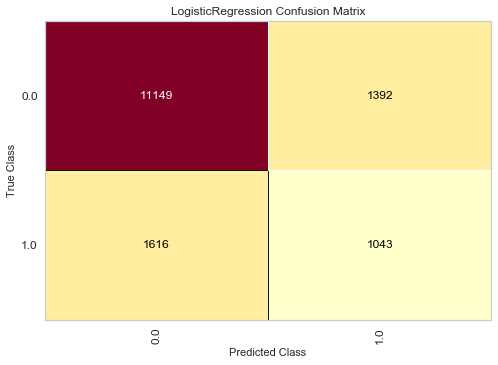

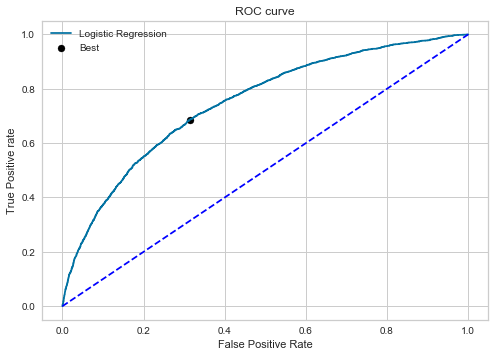

---------Nearest Neighbors------------
Accuracy  (%): 
 74.3092105263158
Precision: 
 32.13876146788991
Recall (%): 
 42.1587062805566
f1 score (%): 
 36.473076297380835
logistic loss :
 8.873408846660757
              precision    recall  f1-score   support

         0.0       0.87      0.81      0.84     12541
         1.0       0.32      0.42      0.36      2659

    accuracy                           0.74     15200
   macro avg       0.60      0.62      0.60     15200
weighted avg       0.77      0.74      0.76     15200

AUC  (%): 
 67.38018442044881
Best Threshold=0.400000, G-Mean=0.636


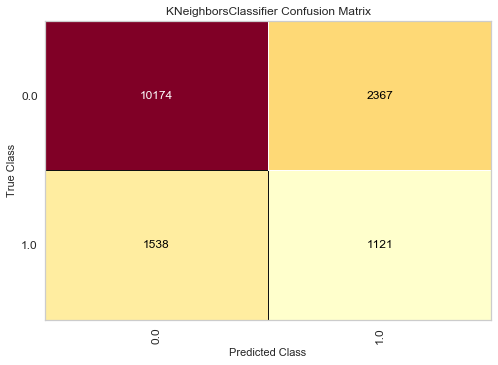

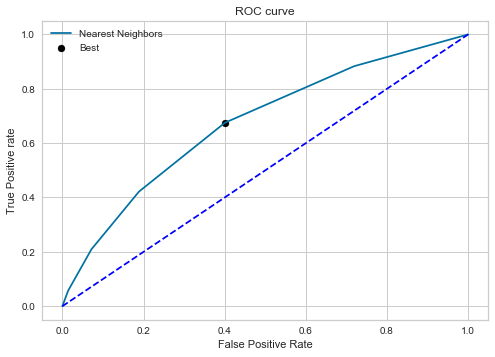

---------Decision Tree------------
Accuracy  (%): 
 67.57894736842105
Precision: 
 25.438406581511146
Recall (%): 
 44.18954494170741
f1 score (%): 
 32.289090409453145
logistic loss :
 11.198016045241411
              precision    recall  f1-score   support

         0.0       0.86      0.73      0.79     12541
         1.0       0.25      0.44      0.32      2659

    accuracy                           0.68     15200
   macro avg       0.56      0.58      0.55     15200
weighted avg       0.75      0.68      0.71     15200

AUC  (%): 
 58.35742405376706
Best Threshold=1.000000, G-Mean=0.566


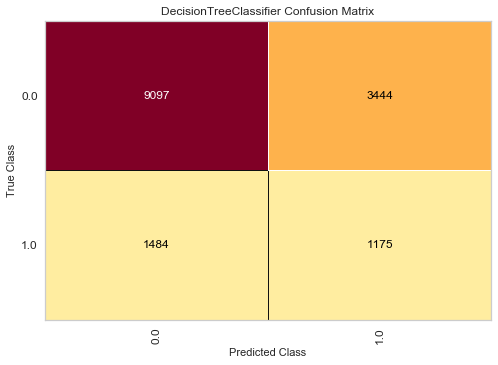

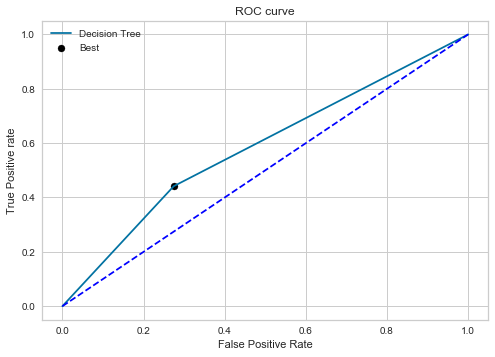

---------Naive Bayes------------
Accuracy  (%): 
 80.97368421052632
Precision: 
 44.64367816091954
Recall (%): 
 36.51748777735991
f1 score (%): 
 40.173769135291685
logistic loss :
 6.571520003249187
              precision    recall  f1-score   support

         0.0       0.87      0.90      0.89     12541
         1.0       0.45      0.37      0.40      2659

    accuracy                           0.81     15200
   macro avg       0.66      0.63      0.64     15200
weighted avg       0.80      0.81      0.80     15200

AUC  (%): 
 74.7512476489675
Best Threshold=0.282788, G-Mean=0.686


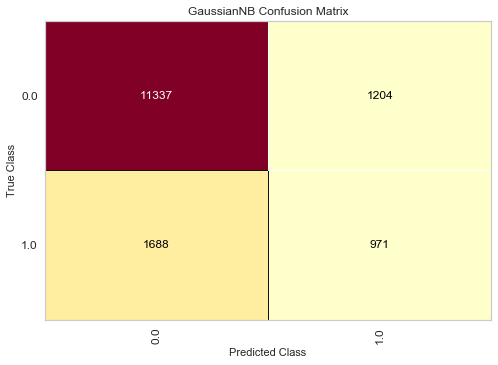

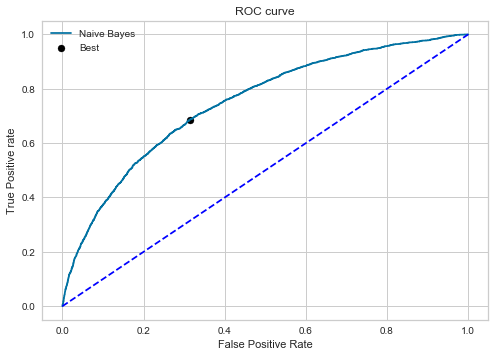

---------Random Forest------------
Accuracy  (%): 
 67.59868421052632
Precision: 
 25.444299956653666
Recall (%): 
 44.151936818352766
f1 score (%): 
 32.28378935789908
logistic loss :
 11.191198971058881
              precision    recall  f1-score   support

         0.0       0.86      0.73      0.79     12541
         1.0       0.25      0.44      0.32      2659

    accuracy                           0.68     15200
   macro avg       0.56      0.58      0.55     15200
weighted avg       0.75      0.68      0.71     15200

AUC  (%): 
 64.77459011538805
Best Threshold=0.230000, G-Mean=0.606


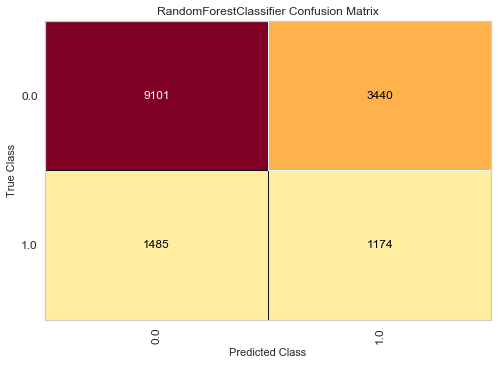

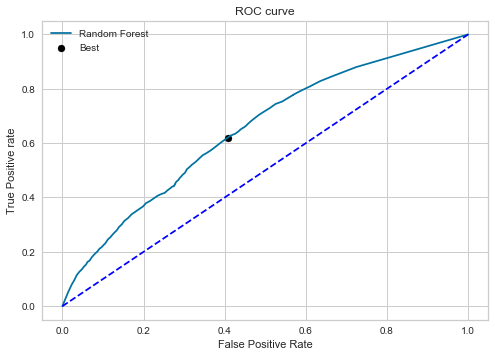

---------xgboost------------
Accuracy  (%): 
 78.6907894736842
Precision: 
 39.81741573033708
Recall (%): 
 42.64761188416698
f1 score (%): 
 41.183947702923554
logistic loss :
 7.360030740336255
              precision    recall  f1-score   support

         0.0       0.88      0.86      0.87     12541
         1.0       0.40      0.43      0.41      2659

    accuracy                           0.79     15200
   macro avg       0.64      0.64      0.64     15200
weighted avg       0.79      0.79      0.79     15200

AUC  (%): 
 73.95304439422897
Best Threshold=0.308293, G-Mean=0.680


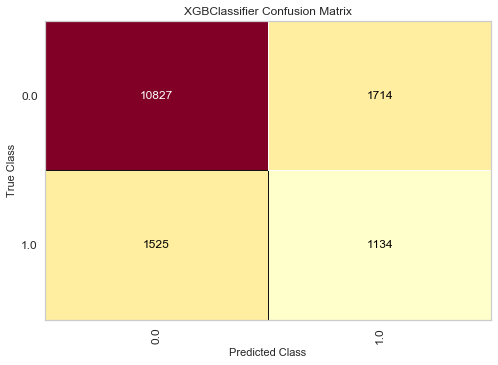

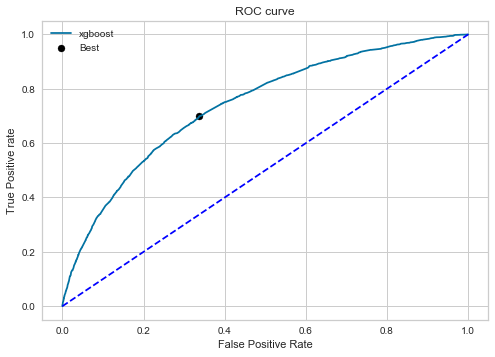

---------Ada Boost------------
Accuracy  (%): 
 79.19736842105263
Precision: 
 41.1350017624251
Recall (%): 
 43.888679954870256
f1 score (%): 
 42.467248908296945
logistic loss :
 7.1850622558168435
              precision    recall  f1-score   support

         0.0       0.88      0.87      0.87     12541
         1.0       0.41      0.44      0.42      2659

    accuracy                           0.79     15200
   macro avg       0.65      0.65      0.65     15200
weighted avg       0.80      0.79      0.79     15200

AUC  (%): 
 74.52781053398708
Best Threshold=0.496301, G-Mean=0.684


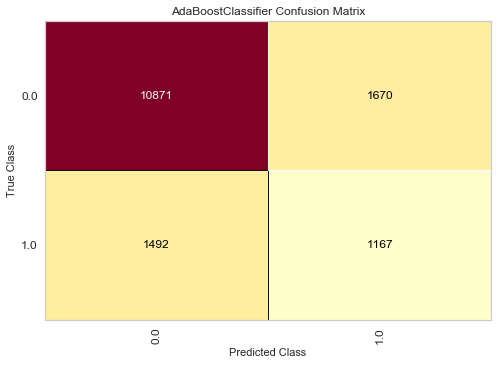

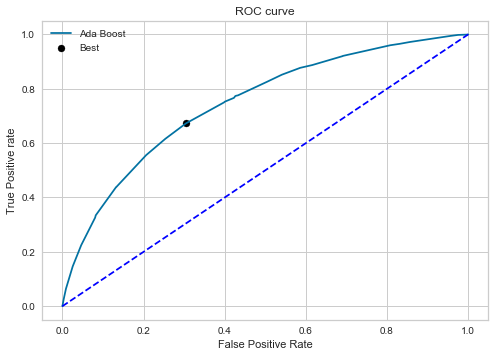

---------SVM------------
Accuracy  (%): 
 79.86842105263158
Precision: 
 42.16490816725283
Recall (%): 
 40.57916509966153
f1 score (%): 
 41.356841701801464
logistic loss :
 6.9532788929357485
              precision    recall  f1-score   support

         0.0       0.88      0.88      0.88     12541
         1.0       0.42      0.41      0.41      2659

    accuracy                           0.80     15200
   macro avg       0.65      0.64      0.65     15200
weighted avg       0.80      0.80      0.80     15200

AUC  (%): 
 69.95141231982865
Best Threshold=0.233074, G-Mean=0.681


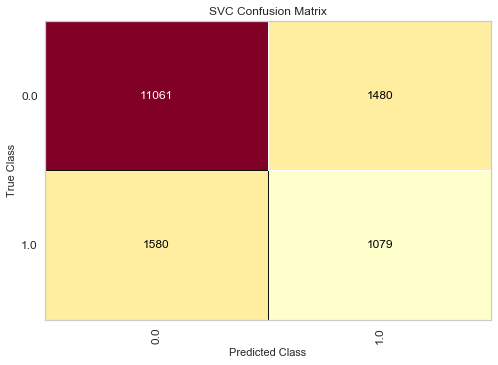

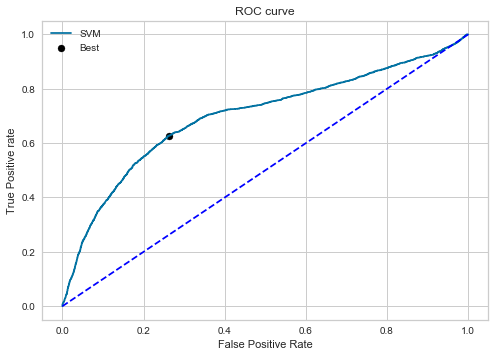

---------MLP Classifier------------
Accuracy  (%): 
 78.36842105263158
Precision: 
 39.923101570009614
Recall (%): 
 46.859721699887174
f1 score (%): 
 43.11418685121107
logistic loss :
 7.471381317871575
              precision    recall  f1-score   support

         0.0       0.88      0.85      0.87     12541
         1.0       0.40      0.47      0.43      2659

    accuracy                           0.78     15200
   macro avg       0.64      0.66      0.65     15200
weighted avg       0.80      0.78      0.79     15200

AUC  (%): 
 74.75940442239263
Best Threshold=0.338913, G-Mean=0.686


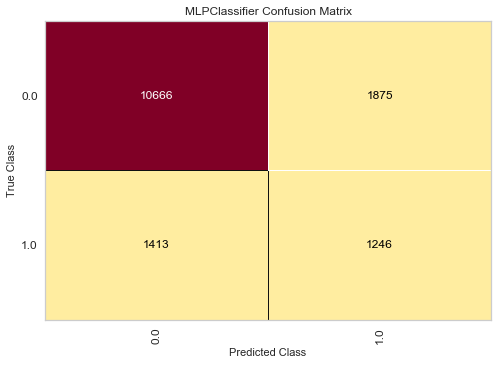

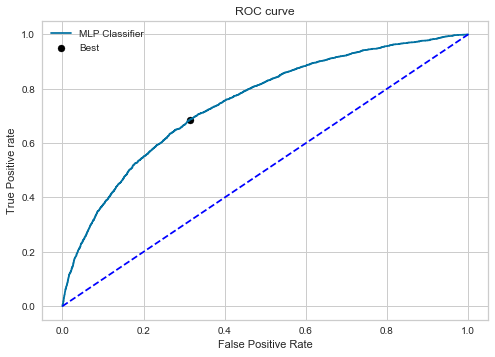

---------light Gradient Boosting------------
Accuracy  (%): 
 79.00657894736842
Precision: 
 40.60070671378092
Recall (%): 
 43.21173373448665
f1 score (%): 
 41.86554928037895
logistic loss :
 7.250959184173695
              precision    recall  f1-score   support

         0.0       0.88      0.87      0.87     12541
         1.0       0.41      0.43      0.42      2659

    accuracy                           0.79     15200
   macro avg       0.64      0.65      0.65     15200
weighted avg       0.80      0.79      0.79     15200

AUC  (%): 
 74.3126321520996
Best Threshold=0.338207, G-Mean=0.684


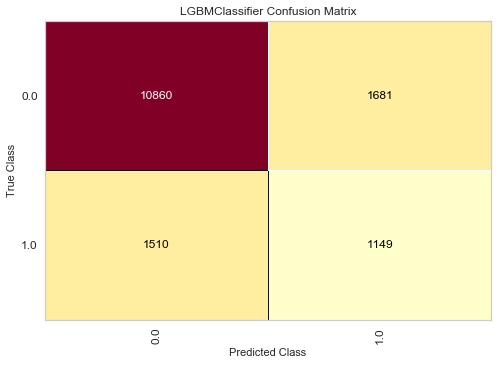

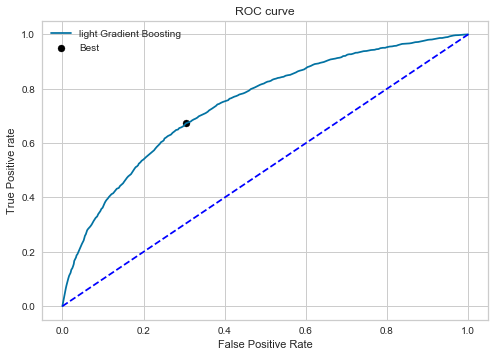

---------Gradient Boosting Classifier------------
Accuracy  (%): 
 79.27631578947368
Precision: 
 41.26023495906016
Recall (%): 
 43.58781496803309
f1 score (%): 
 42.39209948792978
logistic loss :
 7.157793748666347
              precision    recall  f1-score   support

         0.0       0.88      0.87      0.87     12541
         1.0       0.41      0.44      0.42      2659

    accuracy                           0.79     15200
   macro avg       0.65      0.65      0.65     15200
weighted avg       0.80      0.79      0.79     15200

AUC  (%): 
 74.66028163239467
Best Threshold=0.311299, G-Mean=0.685


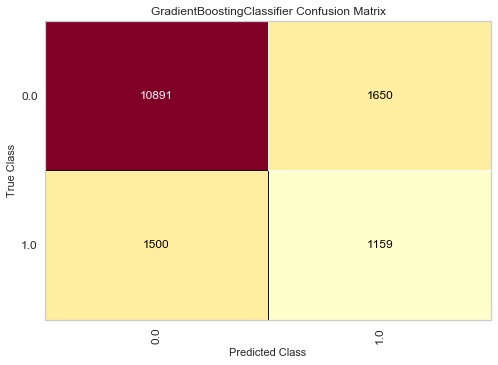

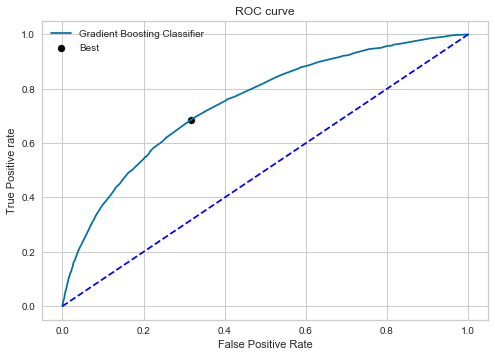

,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,42.833676,39.225273,0.747594,80.210526
1,Nearest Neighbors,32.138761,42.158706,0.673802,74.309211
2,Decision Tree,25.438407,44.189545,0.583574,67.578947
3,Naive Bayes,44.643678,36.517488,0.747512,80.973684
4,Random Forest,25.444300,44.151937,0.647746,67.598684
5,xgboost,39.817416,42.647612,0.739530,78.690789
6,Ada Boost,41.135002,43.888680,0.745278,79.197368
7,SVM,42.164908,40.579165,0.699514,79.868421
8,MLP Classifier,39.923102,46.859722,0.747594,78.368421
9,light Gradient Boosting,40.600707,43.211734,0.743126,79.006579


,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,42.833676,39.225273,0.747594,80.210526
1,Nearest Neighbors,32.138761,42.158706,0.673802,74.309211
2,Decision Tree,25.438407,44.189545,0.583574,67.578947
3,Naive Bayes,44.643678,36.517488,0.747512,80.973684
4,Random Forest,25.444300,44.151937,0.647746,67.598684
5,xgboost,39.817416,42.647612,0.739530,78.690789
6,Ada Boost,41.135002,43.888680,0.745278,79.197368
7,SVM,42.164908,40.579165,0.699514,79.868421
8,MLP Classifier,39.923102,46.859722,0.747594,78.368421
9,light Gradient Boosting,40.600707,43.211734,0.743126,79.006579


In [ ]:
t.fit_model_us(ldadf,'SoldFlag',ratio=0.5,classification=True,min_max=False,svm_type = "non-Linear",kernel='rbf')

---------Logistic Regression------------
Accuracy  (%): 
 80.43421052631578
Precision: 
 43.37400084139672
Recall (%): 
 38.77397517863859
f1 score (%): 
 40.94519459888801
logistic loss :
 6.7578550826714086
              precision    recall  f1-score   support

         0.0       0.87      0.89      0.88     12541
         1.0       0.43      0.39      0.41      2659

    accuracy                           0.80     15200
   macro avg       0.65      0.64      0.65     15200
weighted avg       0.80      0.80      0.80     15200

AUC  (%): 
 74.75940442239263
Best Threshold=0.321931, G-Mean=0.686


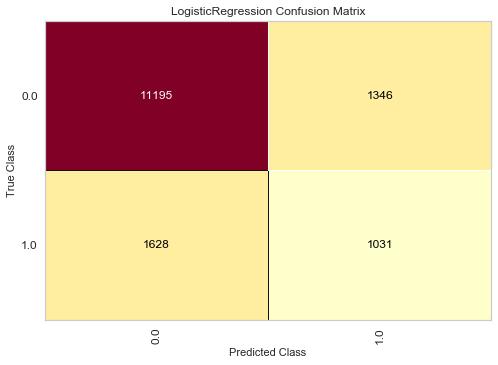

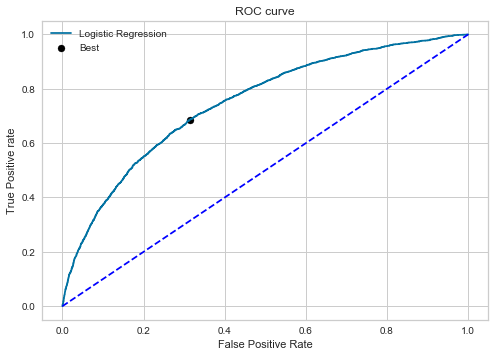

---------Nearest Neighbors------------
Accuracy  (%): 
 71.48026315789474
Precision: 
 28.256357031655423
Recall (%): 
 40.955246333207974
f1 score (%): 
 33.440810686319665
logistic loss :
 9.850513589396861
              precision    recall  f1-score   support

         0.0       0.86      0.78      0.82     12541
         1.0       0.28      0.41      0.33      2659

    accuracy                           0.71     15200
   macro avg       0.57      0.59      0.58     15200
weighted avg       0.76      0.71      0.73     15200

AUC  (%): 
 63.76357154400433
Best Threshold=0.400000, G-Mean=0.607


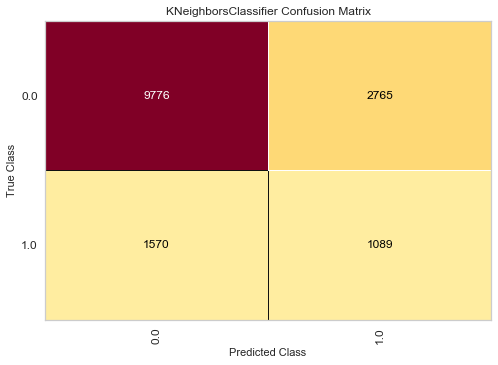

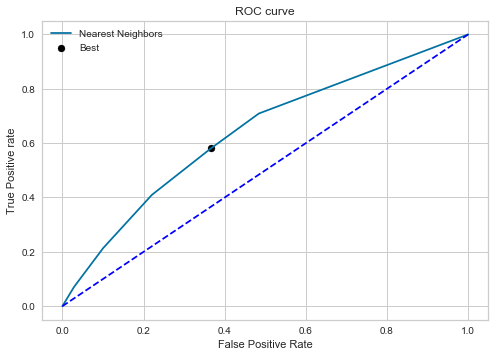

---------Decision Tree------------
Accuracy  (%): 
 75.11842105263158
Precision: 
 27.45885186672019
Recall (%): 
 25.723956374576908
f1 score (%): 
 26.563106796116497
logistic loss :
 8.593887973559776
              precision    recall  f1-score   support

         0.0       0.84      0.86      0.85     12541
         1.0       0.27      0.26      0.27      2659

    accuracy                           0.75     15200
   macro avg       0.56      0.56      0.56     15200
weighted avg       0.74      0.75      0.75     15200

AUC  (%): 
 55.65808383177866
Best Threshold=0.666667, G-Mean=0.469


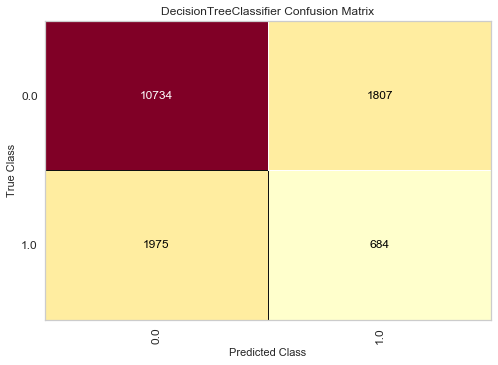

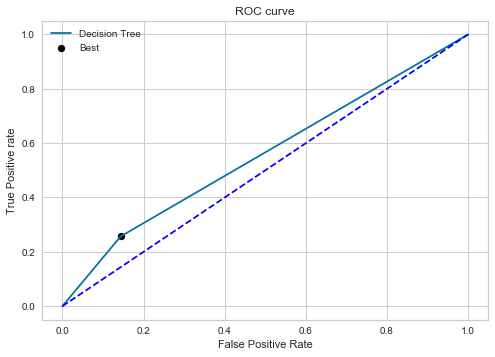

---------Naive Bayes------------
Accuracy  (%): 
 81.06578947368422
Precision: 
 44.89986027014439
Recall (%): 
 36.2542309138774
f1 score (%): 
 40.11652101539742
logistic loss :
 6.539706867652163
              precision    recall  f1-score   support

         0.0       0.87      0.91      0.89     12541
         1.0       0.45      0.36      0.40      2659

    accuracy                           0.81     15200
   macro avg       0.66      0.63      0.64     15200
weighted avg       0.80      0.81      0.80     15200

AUC  (%): 
 74.75528705110119
Best Threshold=0.285788, G-Mean=0.686


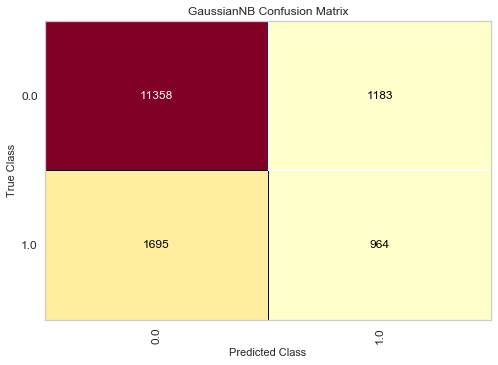

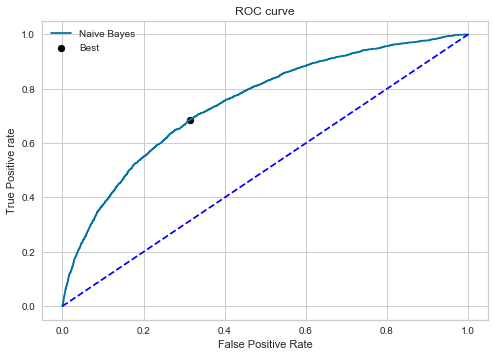

---------Random Forest------------
Accuracy  (%): 
 75.10526315789474
Precision: 
 27.436823104693143
Recall (%): 
 25.723956374576908
f1 score (%): 
 26.552795031055897
logistic loss :
 8.598432654611399
              precision    recall  f1-score   support

         0.0       0.84      0.86      0.85     12541
         1.0       0.27      0.26      0.27      2659

    accuracy                           0.75     15200
   macro avg       0.56      0.56      0.56     15200
weighted avg       0.74      0.75      0.75     15200

AUC  (%): 
 63.43265244567207
Best Threshold=0.040000, G-Mean=0.610


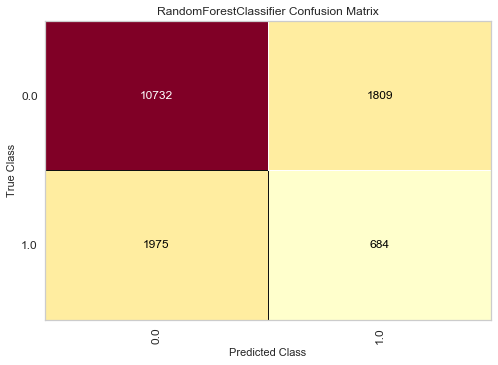

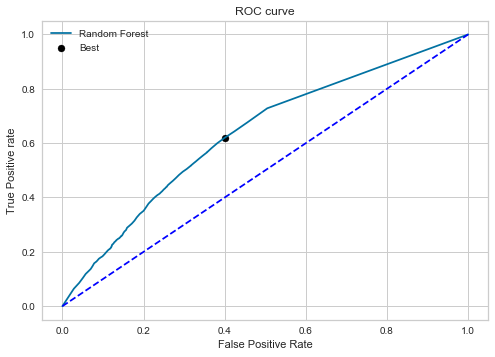

---------xgboost------------
Accuracy  (%): 
 79.59210526315789
Precision: 
 41.54257350133639
Recall (%): 
 40.91763820985333
f1 score (%): 
 41.227737779461926
logistic loss :
 7.048717668465695
              precision    recall  f1-score   support

         0.0       0.88      0.88      0.88     12541
         1.0       0.42      0.41      0.41      2659

    accuracy                           0.80     15200
   macro avg       0.65      0.64      0.64     15200
weighted avg       0.79      0.80      0.80     15200

AUC  (%): 
 74.0034199671636
Best Threshold=0.328957, G-Mean=0.678


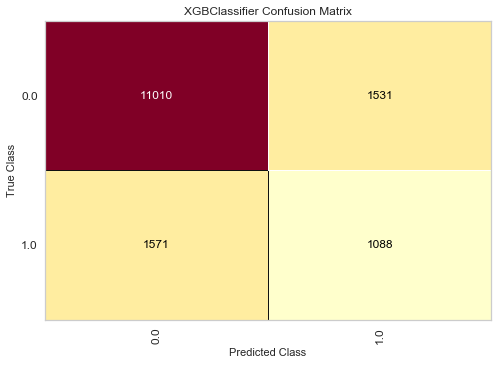

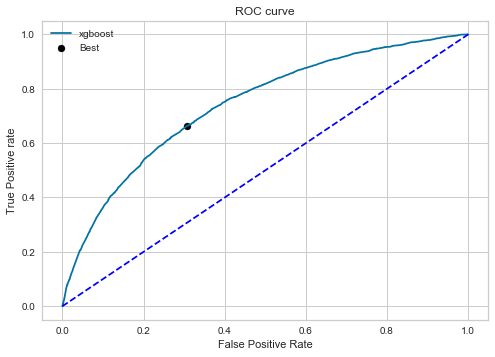

---------Ada Boost------------
Accuracy  (%): 
 81.125
Precision: 
 45.00950570342205
Recall (%): 
 35.61489281684844
f1 score (%): 
 39.76485408356078
logistic loss :
 6.519254908633256
              precision    recall  f1-score   support

         0.0       0.87      0.91      0.89     12541
         1.0       0.45      0.36      0.40      2659

    accuracy                           0.81     15200
   macro avg       0.66      0.63      0.64     15200
weighted avg       0.80      0.81      0.80     15200

AUC  (%): 
 74.47936319829964
Best Threshold=0.496223, G-Mean=0.684


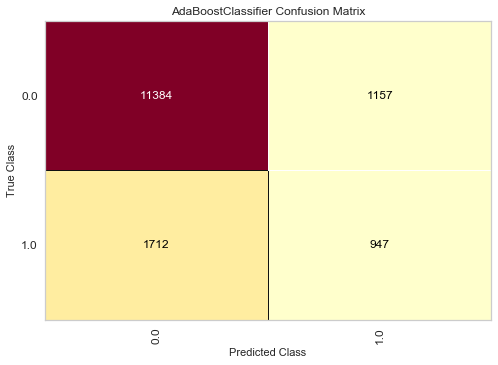

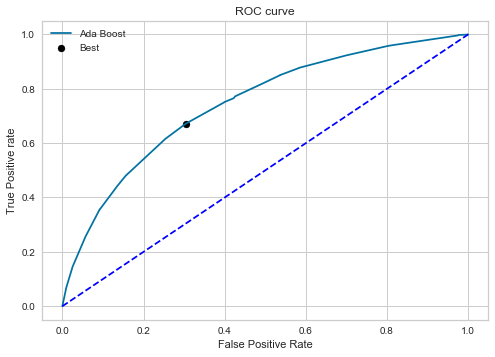

---------SVM------------
Accuracy  (%): 
 80.08552631578948
Precision: 
 42.59855189058729
Recall (%): 
 39.827002632568636
f1 score (%): 
 41.166180758017504
logistic loss :
 6.878290603482075
              precision    recall  f1-score   support

         0.0       0.87      0.89      0.88     12541
         1.0       0.43      0.40      0.41      2659

    accuracy                           0.80     15200
   macro avg       0.65      0.64      0.65     15200
weighted avg       0.80      0.80      0.80     15200

AUC  (%): 
 69.67760113132047
Best Threshold=0.235544, G-Mean=0.680


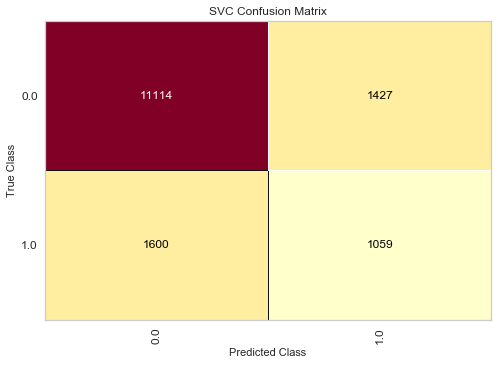

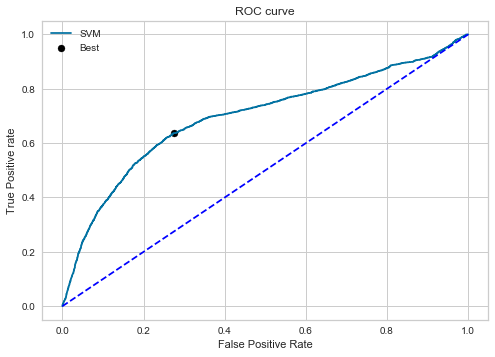

---------MLP Classifier------------
Accuracy  (%): 
 79.90131578947368
Precision: 
 42.27769110764431
Recall (%): 
 40.76720571643475
f1 score (%): 
 41.50871146850469
logistic loss :
 6.9419174533321595
              precision    recall  f1-score   support

         0.0       0.88      0.88      0.88     12541
         1.0       0.42      0.41      0.42      2659

    accuracy                           0.80     15200
   macro avg       0.65      0.64      0.65     15200
weighted avg       0.80      0.80      0.80     15200

AUC  (%): 
 74.75940442239263
Best Threshold=0.355851, G-Mean=0.686


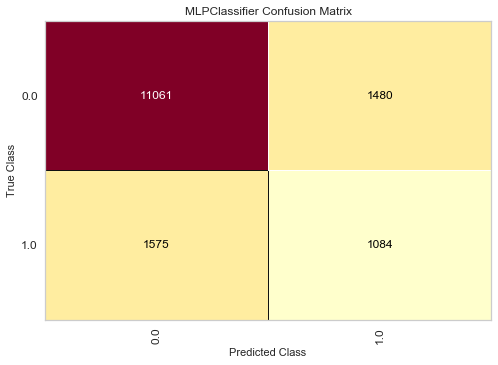

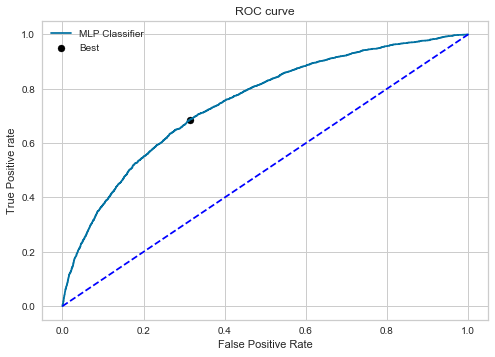

---------light Gradient Boosting------------
Accuracy  (%): 
 79.88157894736842
Precision: 
 42.34752589182969
Recall (%): 
 41.51936818352765
f1 score (%): 
 41.92935814660083
logistic loss :
 6.948735527011477
              precision    recall  f1-score   support

         0.0       0.88      0.88      0.88     12541
         1.0       0.42      0.42      0.42      2659

    accuracy                           0.80     15200
   macro avg       0.65      0.65      0.65     15200
weighted avg       0.80      0.80      0.80     15200

AUC  (%): 
 74.49672033233814
Best Threshold=0.355681, G-Mean=0.683


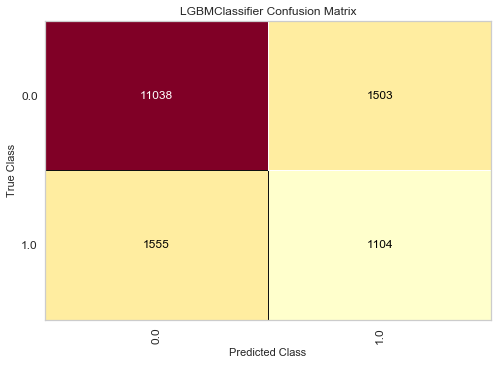

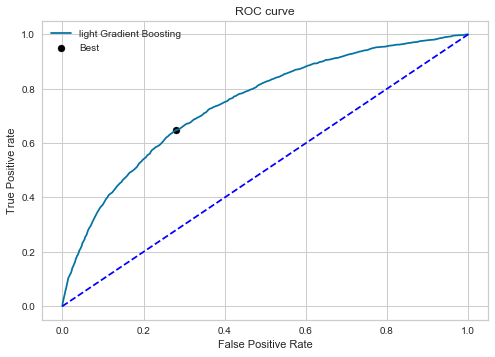

---------Gradient Boosting Classifier------------
Accuracy  (%): 
 79.36842105263158
Precision: 
 41.39920663541291
Recall (%): 
 43.174125611132006
f1 score (%): 
 42.26804123711341
logistic loss :
 7.125980402648945
              precision    recall  f1-score   support

         0.0       0.88      0.87      0.87     12541
         1.0       0.41      0.43      0.42      2659

    accuracy                           0.79     15200
   macro avg       0.65      0.65      0.65     15200
weighted avg       0.80      0.79      0.80     15200

AUC  (%): 
 74.65240674746289
Best Threshold=0.308718, G-Mean=0.685


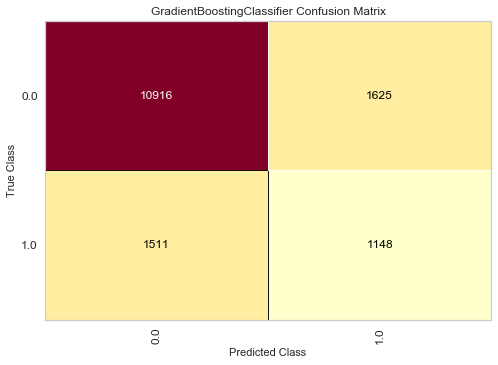

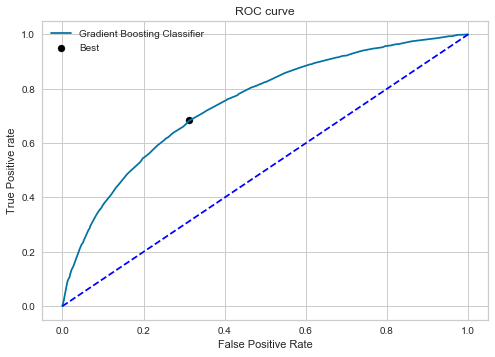

,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,43.374001,38.773975,0.747594,80.434211
1,Nearest Neighbors,28.256357,40.955246,0.637636,71.480263
2,Decision Tree,27.458852,25.723956,0.556581,75.118421
3,Naive Bayes,44.899860,36.254231,0.747553,81.065789
4,Random Forest,27.436823,25.723956,0.634327,75.105263
5,xgboost,41.542574,40.917638,0.740034,79.592105
6,Ada Boost,45.009506,35.614893,0.744794,81.125000
7,SVM,42.598552,39.827003,0.696776,80.085526
8,MLP Classifier,42.277691,40.767206,0.747594,79.901316
9,light Gradient Boosting,42.347526,41.519368,0.744967,79.881579


,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,43.374001,38.773975,0.747594,80.434211
1,Nearest Neighbors,28.256357,40.955246,0.637636,71.480263
2,Decision Tree,27.458852,25.723956,0.556581,75.118421
3,Naive Bayes,44.899860,36.254231,0.747553,81.065789
4,Random Forest,27.436823,25.723956,0.634327,75.105263
5,xgboost,41.542574,40.917638,0.740034,79.592105
6,Ada Boost,45.009506,35.614893,0.744794,81.125000
7,SVM,42.598552,39.827003,0.696776,80.085526
8,MLP Classifier,42.277691,40.767206,0.747594,79.901316
9,light Gradient Boosting,42.347526,41.519368,0.744967,79.881579


In [ ]:
t.fit_model_os(ldadf,'SoldFlag',ratio=0.5,classification=True,min_max=False,svm_type = "non-Linear",kernel='rbf')

_____Cross Validation_____
---------Logistic Regression------------
Mean accuracy  (%): 
 72.33331393533093
Mean AUC  (%): 
 74.1871228134171
Mean Precision: 
 64.11388094406287
Mean Recall (%): 
 37.9475995573278
Mean f1 score (%): 
 47.64655716713532
---------Nearest Neighbors------------
Mean accuracy  (%): 
 70.49673434629702
Mean AUC  (%): 
 71.86219502455596
Mean Precision: 
 56.29230098965671
Mean Recall (%): 
 49.9467915049098
Mean f1 score (%): 
 52.92053440499289
---------Decision Tree------------
Mean accuracy  (%): 
 72.76494470599417
Mean AUC  (%): 
 70.95970480414894
Mean Precision: 
 57.9747004502266
Mean Recall (%): 
 65.49997365046464
Mean f1 score (%): 
 61.49116961211294
---------Naive Bayes------------
Mean accuracy  (%): 
 72.2540284801471
Mean AUC  (%): 
 74.15409369693873
Mean Precision: 
 65.97737863608776
Mean Recall (%): 
 34.03615156252745
Mean f1 score (%): 
 44.87580678954
---------Random Forest------------
Mean accuracy  (%): 
 72.76053747985031
Mean AUC  

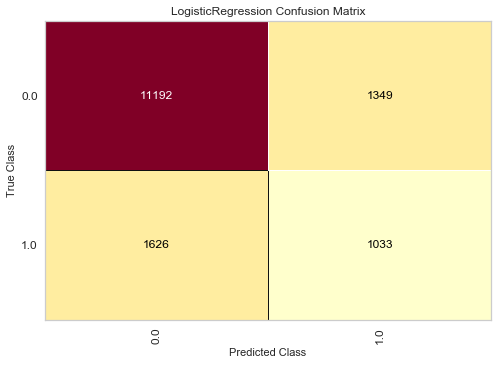

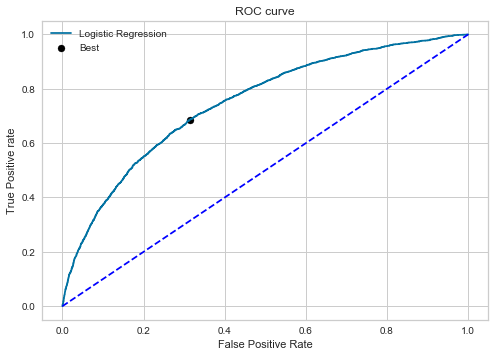

---------Nearest Neighbors------------
Accuracy  (%): 
 72.625
Precision: 
 30.079575596816976
Recall (%): 
 42.64761188416698
f1 score (%): 
 35.277648156789546
logistic loss :
 9.455128705134825
              precision    recall  f1-score   support

         0.0       0.87      0.79      0.83     12541
         1.0       0.30      0.43      0.35      2659

    accuracy                           0.73     15200
   macro avg       0.58      0.61      0.59     15200
weighted avg       0.77      0.73      0.74     15200

AUC  (%): 
 65.441953626404
Best Threshold=0.400000, G-Mean=0.617


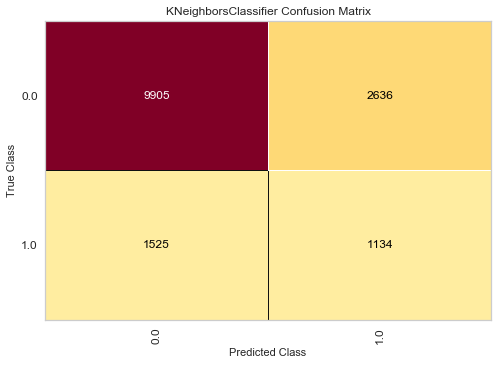

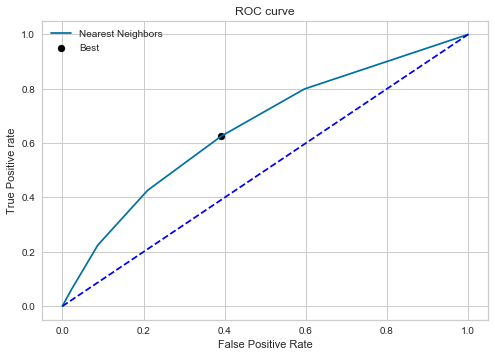

---------Decision Tree------------
Accuracy  (%): 
 71.90789473684211
Precision: 
 26.645404465062338
Recall (%): 
 34.56186536291839
f1 score (%): 
 30.091683038637857
logistic loss :
 9.702802512353093
              precision    recall  f1-score   support

         0.0       0.85      0.80      0.82     12541
         1.0       0.27      0.35      0.30      2659

    accuracy                           0.72     15200
   macro avg       0.56      0.57      0.56     15200
weighted avg       0.75      0.72      0.73     15200

AUC  (%): 
 57.194311646142125
Best Threshold=1.000000, G-Mean=0.525


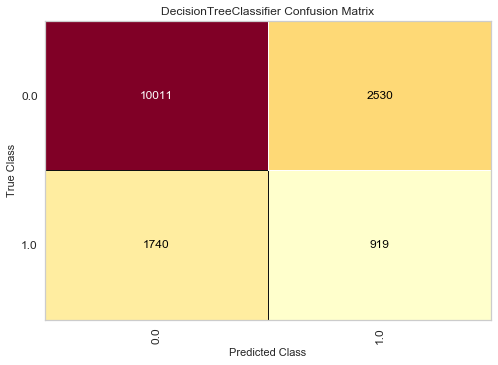

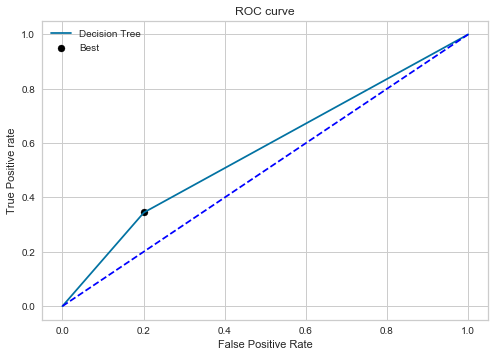

---------Naive Bayes------------
Accuracy  (%): 
 81.13815789473684
Precision: 
 45.09433962264151
Recall (%): 
 35.953365927040245
f1 score (%): 
 40.00836995187279
logistic loss :
 6.514710701027479
              precision    recall  f1-score   support

         0.0       0.87      0.91      0.89     12541
         1.0       0.45      0.36      0.40      2659

    accuracy                           0.81     15200
   macro avg       0.66      0.63      0.64     15200
weighted avg       0.80      0.81      0.80     15200

AUC  (%): 
 74.75111869997585
Best Threshold=0.284561, G-Mean=0.686


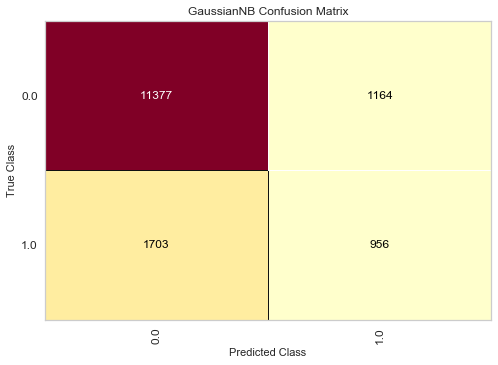

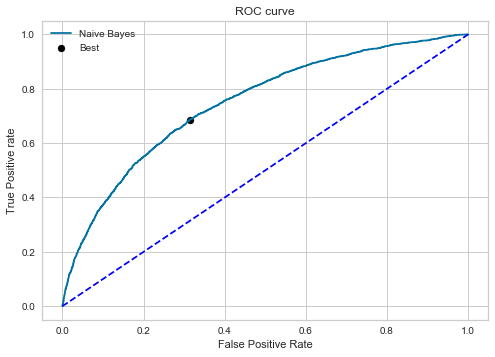

---------Random Forest------------
Accuracy  (%): 
 71.92105263157896
Precision: 
 26.66086451987235
Recall (%): 
 34.56186536291839
f1 score (%): 
 30.101539469374387
logistic loss :
 9.698257831301468
              precision    recall  f1-score   support

         0.0       0.85      0.80      0.82     12541
         1.0       0.27      0.35      0.30      2659

    accuracy                           0.72     15200
   macro avg       0.56      0.57      0.56     15200
weighted avg       0.75      0.72      0.73     15200

AUC  (%): 
 64.29658220097876
Best Threshold=0.090000, G-Mean=0.609


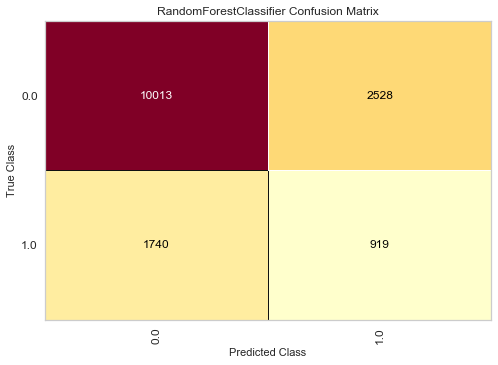

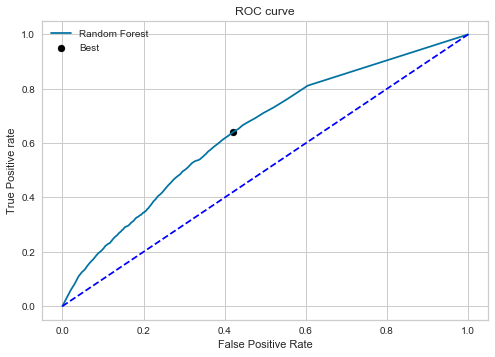

---------xgboost------------
Accuracy  (%): 
 78.99342105263158
Precision: 
 40.511727078891255
Recall (%): 
 42.87326062429484
f1 score (%): 
 41.6590535355381
logistic loss :
 7.255503391779471
              precision    recall  f1-score   support

         0.0       0.88      0.87      0.87     12541
         1.0       0.41      0.43      0.42      2659

    accuracy                           0.79     15200
   macro avg       0.64      0.65      0.64     15200
weighted avg       0.79      0.79      0.79     15200

AUC  (%): 
 73.69695919385168
Best Threshold=0.304006, G-Mean=0.678


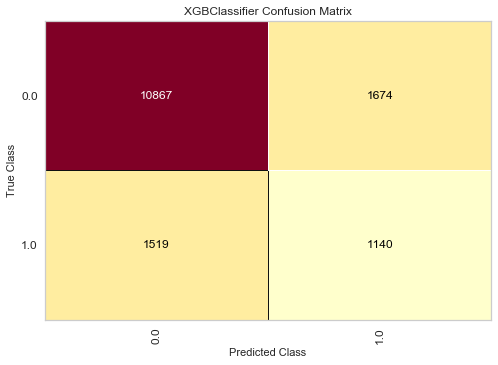

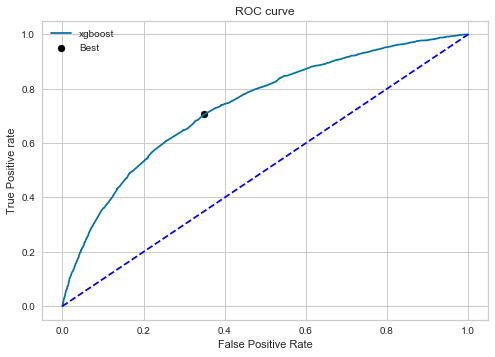

---------Ada Boost------------
Accuracy  (%): 
 79.09868421052632
Precision: 
 40.994436717663426
Recall (%): 
 44.33997743512599
f1 score (%): 
 42.601626016260155
logistic loss :
 7.21914799496515
              precision    recall  f1-score   support

         0.0       0.88      0.86      0.87     12541
         1.0       0.41      0.44      0.43      2659

    accuracy                           0.79     15200
   macro avg       0.64      0.65      0.65     15200
weighted avg       0.80      0.79      0.79     15200

AUC  (%): 
 74.31285406431776
Best Threshold=0.496082, G-Mean=0.684


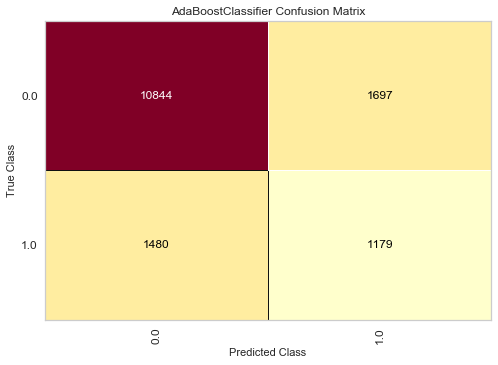

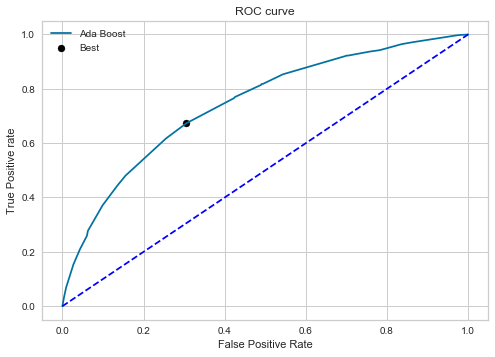

---------SVM------------
Accuracy  (%): 
 79.78947368421052
Precision: 
 42.060745866974244
Recall (%): 
 41.143286949981196
f1 score (%): 
 41.59695817490494
logistic loss :
 6.980547768321903
              precision    recall  f1-score   support

         0.0       0.88      0.88      0.88     12541
         1.0       0.42      0.41      0.42      2659

    accuracy                           0.80     15200
   macro avg       0.65      0.65      0.65     15200
weighted avg       0.80      0.80      0.80     15200

AUC  (%): 
 70.24119818923229
Best Threshold=0.235179, G-Mean=0.684


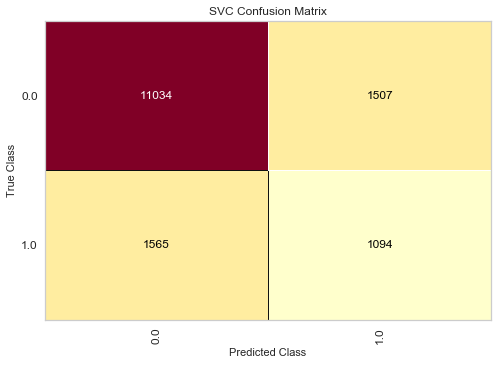

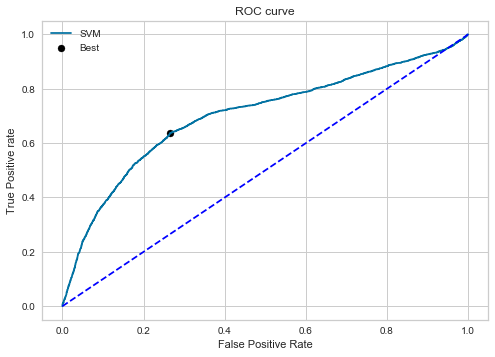

---------MLP Classifier------------
Accuracy  (%): 
 79.1907894736842
Precision: 
 41.14546732255798
Recall (%): 
 44.03911244828883
f1 score (%): 
 42.54314259763851
logistic loss :
 7.1873348067630305
              precision    recall  f1-score   support

         0.0       0.88      0.87      0.87     12541
         1.0       0.41      0.44      0.43      2659

    accuracy                           0.79     15200
   macro avg       0.65      0.65      0.65     15200
weighted avg       0.80      0.79      0.79     15200

AUC  (%): 
 74.76098179843
Best Threshold=0.327394, G-Mean=0.686


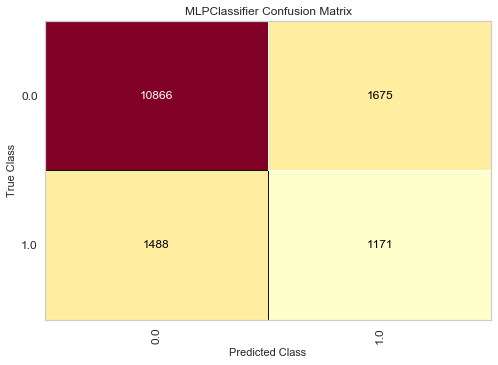

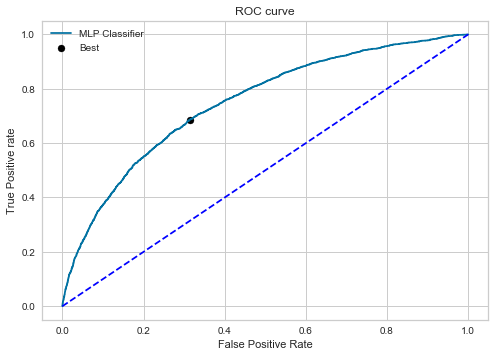

---------light Gradient Boosting------------
Accuracy  (%): 
 78.82894736842105
Precision: 
 40.457494025264594
Recall (%): 
 44.565626175253854
f1 score (%): 
 42.41231209735147
logistic loss :
 7.312314272154003
              precision    recall  f1-score   support

         0.0       0.88      0.86      0.87     12541
         1.0       0.40      0.45      0.42      2659

    accuracy                           0.79     15200
   macro avg       0.64      0.65      0.65     15200
weighted avg       0.80      0.79      0.79     15200

AUC  (%): 
 74.19410853648623
Best Threshold=0.335313, G-Mean=0.682


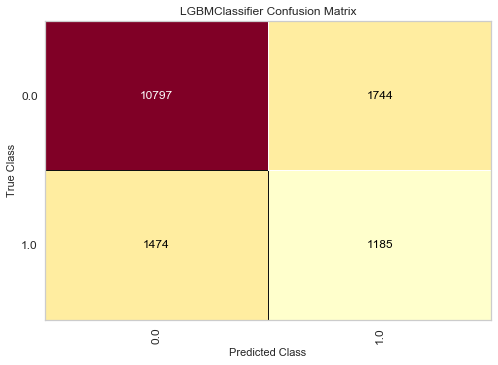

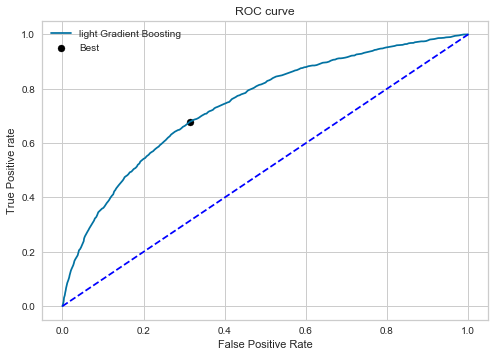

---------Gradient Boosting Classifier------------
Accuracy  (%): 
 79.01973684210526
Precision: 
 40.84944751381215
Recall (%): 
 44.490409928544565
f1 score (%): 
 42.59225922592259
logistic loss :
 7.24641629169527
              precision    recall  f1-score   support

         0.0       0.88      0.86      0.87     12541
         1.0       0.41      0.44      0.43      2659

    accuracy                           0.79     15200
   macro avg       0.64      0.65      0.65     15200
weighted avg       0.80      0.79      0.79     15200

AUC  (%): 
 74.6203134426115
Best Threshold=0.318972, G-Mean=0.685


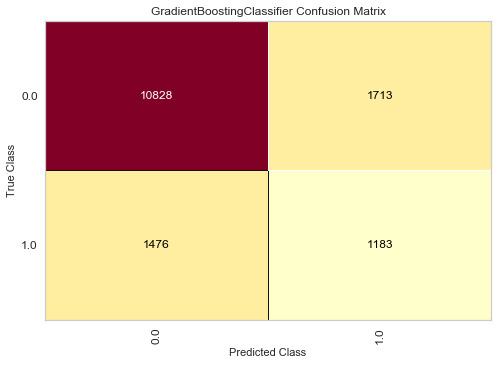

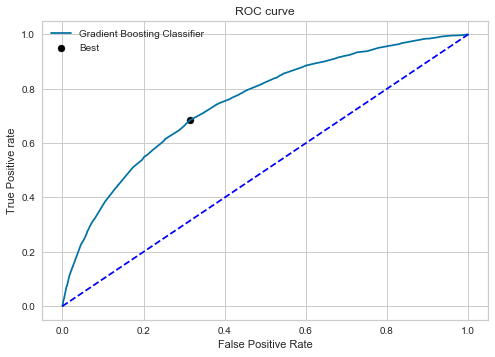

,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,43.366919,38.849191,0.747594,80.427632
1,Nearest Neighbors,30.079576,42.647612,0.654420,72.625000
2,Decision Tree,26.645404,34.561865,0.571943,71.907895
3,Naive Bayes,45.094340,35.953366,0.747511,81.138158
4,Random Forest,26.660865,34.561865,0.642966,71.921053
5,xgboost,40.511727,42.873261,0.736970,78.993421
6,Ada Boost,40.994437,44.339977,0.743129,79.098684
7,SVM,42.060746,41.143287,0.702412,79.789474
8,MLP Classifier,41.145467,44.039112,0.747610,79.190789
9,light Gradient Boosting,40.457494,44.565626,0.741941,78.828947


,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,43.366919,38.849191,0.747594,80.427632
1,Nearest Neighbors,30.079576,42.647612,0.654420,72.625000
2,Decision Tree,26.645404,34.561865,0.571943,71.907895
3,Naive Bayes,45.094340,35.953366,0.747511,81.138158
4,Random Forest,26.660865,34.561865,0.642966,71.921053
5,xgboost,40.511727,42.873261,0.736970,78.993421
6,Ada Boost,40.994437,44.339977,0.743129,79.098684
7,SVM,42.060746,41.143287,0.702412,79.789474
8,MLP Classifier,41.145467,44.039112,0.747610,79.190789
9,light Gradient Boosting,40.457494,44.565626,0.741941,78.828947


In [ ]:
t.fit_model_CV_OS(ldadf,'SoldFlag',ratio=0.5,split=10,classification=True,min_max=False,svm_type = "non-Linear",kernel='rbf')

_____Cross Validation_____
---------Logistic Regression------------
Mean accuracy  (%): 
 72.33161244124136
Mean AUC  (%): 
 74.82851129751631
Mean Precision: 
 63.97150981799088
Mean Recall (%): 
 39.09200290426304
Mean f1 score (%): 
 48.50887863533579
---------Nearest Neighbors------------
Mean accuracy  (%): 
 69.03146114133258
Mean AUC  (%): 
 67.83971780467158
Mean Precision: 
 54.47234574319671
Mean Recall (%): 
 43.667669328907785
Mean f1 score (%): 
 48.464974831128984
---------Decision Tree------------
Mean accuracy  (%): 
 62.68990448471408
Mean AUC  (%): 
 58.235722184487614
Mean Precision: 
 44.18699372494821
Mean Recall (%): 
 44.92604501607717
Mean f1 score (%): 
 44.54669607081486
---------Naive Bayes------------
Mean accuracy  (%): 
 72.40696210572514
Mean AUC  (%): 
 74.78977167406674
Mean Precision: 
 66.06150968443613
Mean Recall (%): 
 35.450990561145105
Mean f1 score (%): 
 46.1235921265054
---------Random Forest------------
Mean accuracy  (%): 
 62.71139831144682

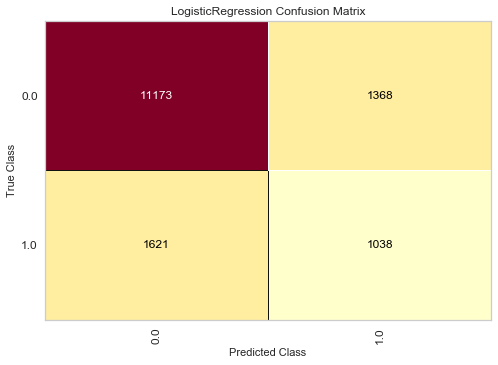

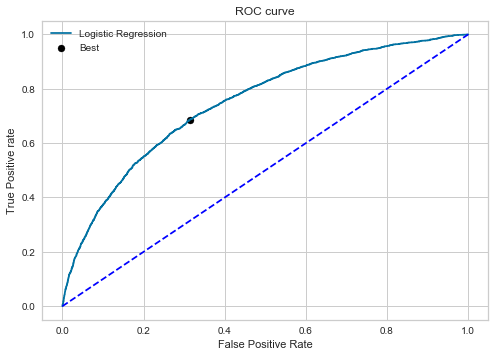

---------Nearest Neighbors------------
Accuracy  (%): 
 74.52631578947368
Precision: 
 32.302305223227314
Recall (%): 
 41.63219255359157
f1 score (%): 
 36.37857377587906
logistic loss :
 8.798420872837646
              precision    recall  f1-score   support

         0.0       0.87      0.82      0.84     12541
         1.0       0.32      0.42      0.36      2659

    accuracy                           0.75     15200
   macro avg       0.60      0.62      0.60     15200
weighted avg       0.77      0.75      0.76     15200

AUC  (%): 
 67.10144168271357
Best Threshold=0.400000, G-Mean=0.630


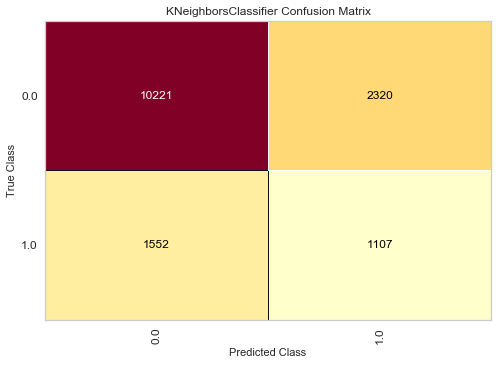

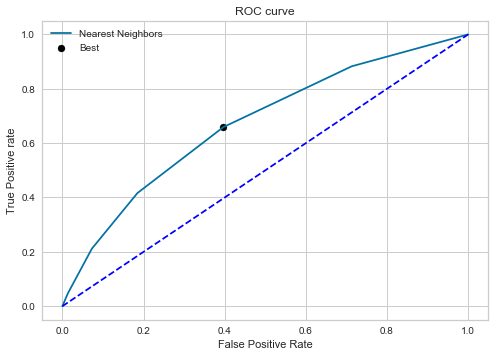

---------Decision Tree------------
Accuracy  (%): 
 67.82894736842105
Precision: 
 25.755270593349273
Recall (%): 
 44.565626175253854
f1 score (%): 
 32.64462809917355
logistic loss :
 11.111667631311498
              precision    recall  f1-score   support

         0.0       0.86      0.73      0.79     12541
         1.0       0.26      0.45      0.33      2659

    accuracy                           0.68     15200
   macro avg       0.56      0.59      0.56     15200
weighted avg       0.76      0.68      0.71     15200

AUC  (%): 
 58.65285519007246
Best Threshold=1.000000, G-Mean=0.569


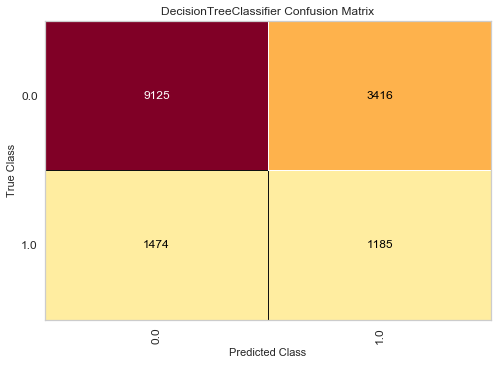

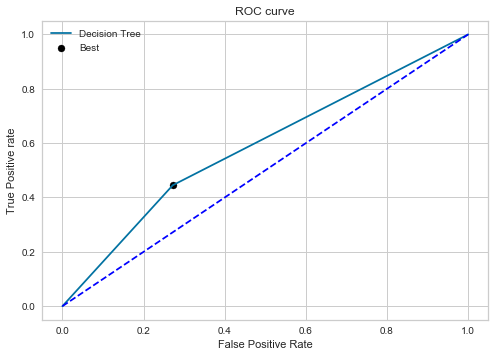

---------Naive Bayes------------
Accuracy  (%): 
 81.125
Precision: 
 45.05649717514124
Recall (%): 
 35.99097405039488
f1 score (%): 
 40.0167259042442
logistic loss :
 6.519255434684197
              precision    recall  f1-score   support

         0.0       0.87      0.91      0.89     12541
         1.0       0.45      0.36      0.40      2659

    accuracy                           0.81     15200
   macro avg       0.66      0.63      0.64     15200
weighted avg       0.80      0.81      0.80     15200

AUC  (%): 
 74.75809993840737
Best Threshold=0.287932, G-Mean=0.686


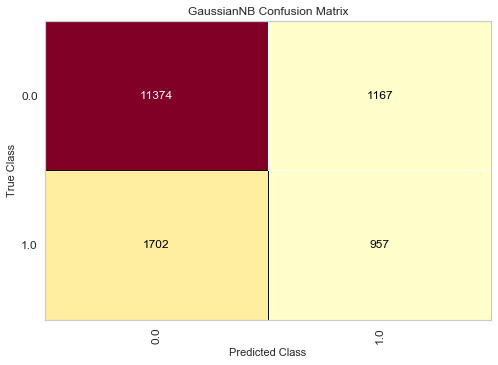

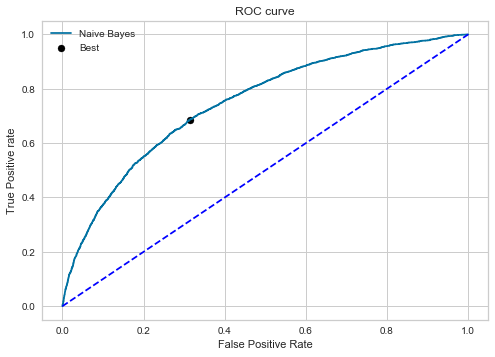

---------Random Forest------------
Accuracy  (%): 
 67.84210526315789
Precision: 
 25.766470971950422
Recall (%): 
 44.565626175253854
f1 score (%): 
 32.653623587765225
logistic loss :
 11.107122950259875
              precision    recall  f1-score   support

         0.0       0.86      0.73      0.79     12541
         1.0       0.26      0.45      0.33      2659

    accuracy                           0.68     15200
   macro avg       0.56      0.59      0.56     15200
weighted avg       0.76      0.68      0.71     15200

AUC  (%): 
 65.02694629085572
Best Threshold=0.240000, G-Mean=0.609


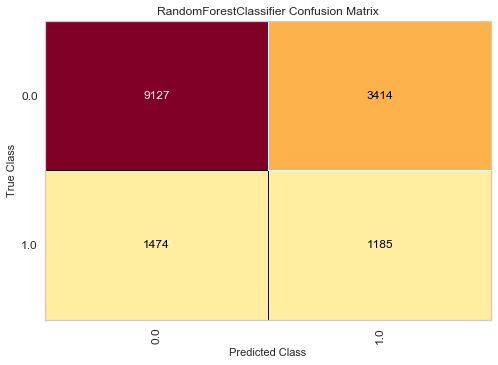

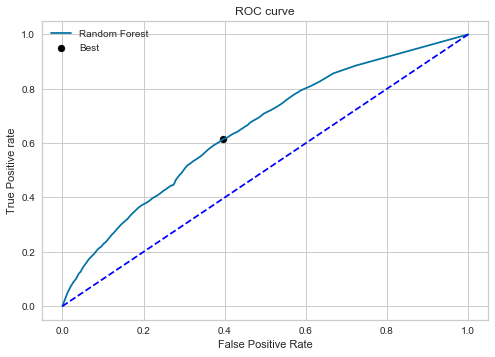

---------xgboost------------
Accuracy  (%): 
 78.90131578947368
Precision: 
 39.74550898203593
Recall (%): 
 39.93982700263257
f1 score (%): 
 39.842431063590325
logistic loss :
 7.287312055943499
              precision    recall  f1-score   support

         0.0       0.87      0.87      0.87     12541
         1.0       0.40      0.40      0.40      2659

    accuracy                           0.79     15200
   macro avg       0.63      0.64      0.64     15200
weighted avg       0.79      0.79      0.79     15200

AUC  (%): 
 73.52346732203142
Best Threshold=0.335039, G-Mean=0.677


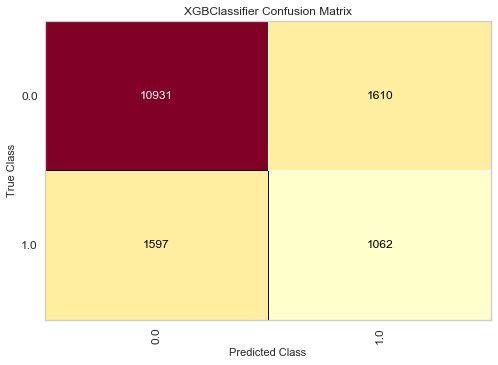

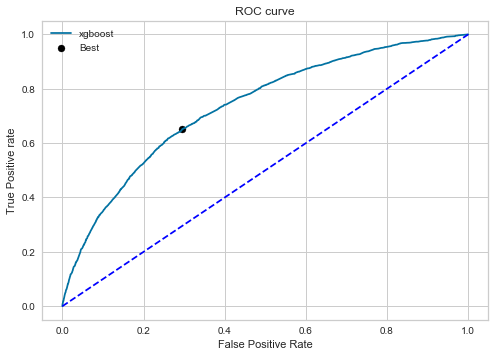

---------Ada Boost------------
Accuracy  (%): 
 80.0592105263158
Precision: 
 42.51207729468599
Recall (%): 
 39.7141782625047
f1 score (%): 
 41.06552595761229
logistic loss :
 6.8873798077700386
              precision    recall  f1-score   support

         0.0       0.87      0.89      0.88     12541
         1.0       0.43      0.40      0.41      2659

    accuracy                           0.80     15200
   macro avg       0.65      0.64      0.65     15200
weighted avg       0.80      0.80      0.80     15200

AUC  (%): 
 74.45673714848618
Best Threshold=0.496208, G-Mean=0.683


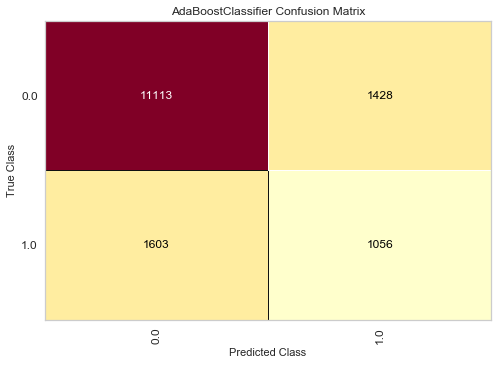

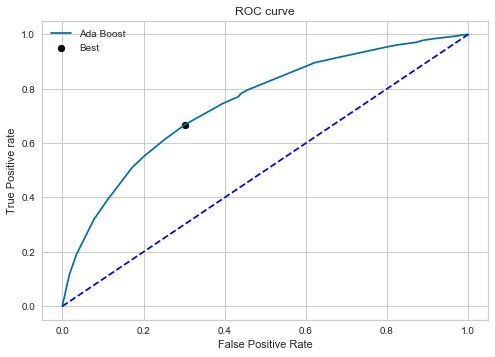

---------SVM------------
Accuracy  (%): 
 80.16447368421052
Precision: 
 42.758340113913754
Recall (%): 
 39.52613764573148
f1 score (%): 
 41.078757084229046
logistic loss :
 6.851022096331579
              precision    recall  f1-score   support

         0.0       0.87      0.89      0.88     12541
         1.0       0.43      0.40      0.41      2659

    accuracy                           0.80     15200
   macro avg       0.65      0.64      0.65     15200
weighted avg       0.80      0.80      0.80     15200

AUC  (%): 
 70.05444856178241
Best Threshold=0.235170, G-Mean=0.681


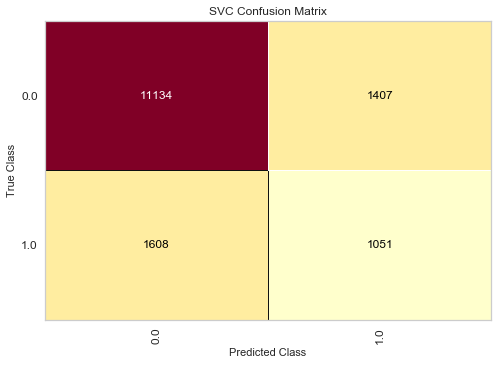

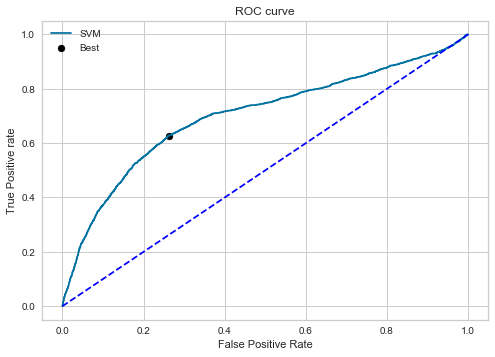

---------MLP Classifier------------
Accuracy  (%): 
 78.82894736842105
Precision: 
 40.57971014492754
Recall (%): 
 45.280180518992104
f1 score (%): 
 42.8012797724849
logistic loss :
 7.312315271650791
              precision    recall  f1-score   support

         0.0       0.88      0.86      0.87     12541
         1.0       0.41      0.45      0.43      2659

    accuracy                           0.79     15200
   macro avg       0.64      0.66      0.65     15200
weighted avg       0.80      0.79      0.79     15200

AUC  (%): 
 74.75940442239263
Best Threshold=0.332881, G-Mean=0.686


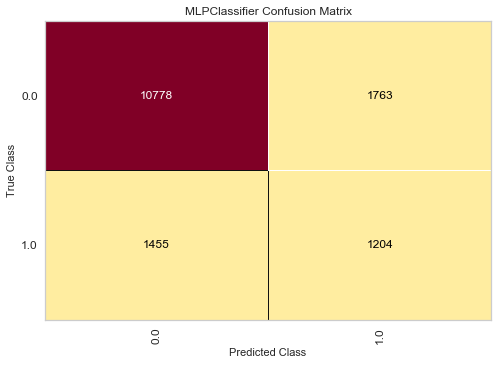

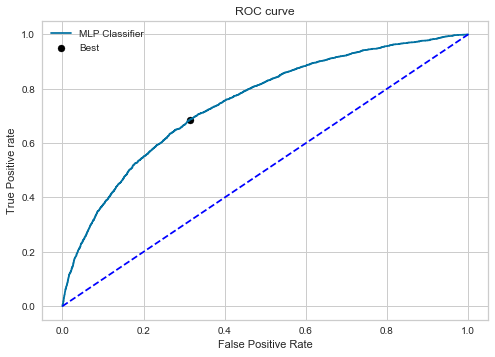

---------light Gradient Boosting------------
Accuracy  (%): 
 79.13157894736842
Precision: 
 40.763413755851644
Recall (%): 
 42.57239563745769
f1 score (%): 
 41.648270787343634
logistic loss :
 7.207783819896668
              precision    recall  f1-score   support

         0.0       0.88      0.87      0.87     12541
         1.0       0.41      0.43      0.42      2659

    accuracy                           0.79     15200
   macro avg       0.64      0.65      0.64     15200
weighted avg       0.79      0.79      0.79     15200

AUC  (%): 
 73.98641519374183
Best Threshold=0.345087, G-Mean=0.683


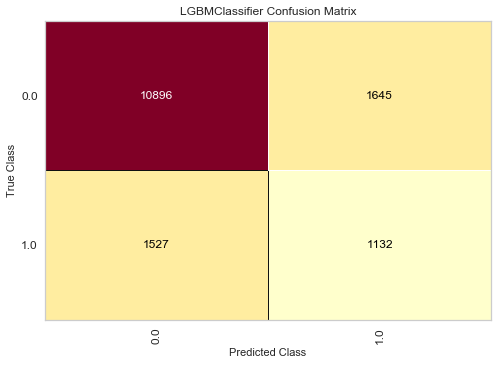

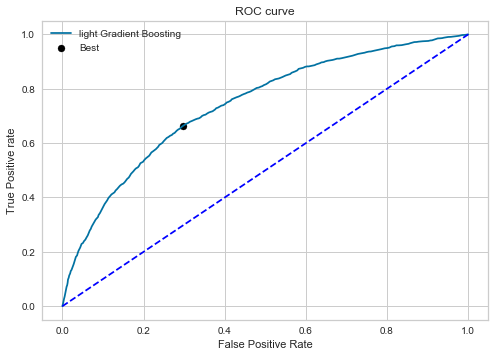

---------Gradient Boosting Classifier------------
Accuracy  (%): 
 79.88815789473685
Precision: 
 42.17151848937844
Recall (%): 
 40.31590823617901
f1 score (%): 
 41.22284176119977
logistic loss :
 6.946461503122655
              precision    recall  f1-score   support

         0.0       0.87      0.88      0.88     12541
         1.0       0.42      0.40      0.41      2659

    accuracy                           0.80     15200
   macro avg       0.65      0.64      0.65     15200
weighted avg       0.80      0.80      0.80     15200

AUC  (%): 
 74.58265733823673
Best Threshold=0.329442, G-Mean=0.685


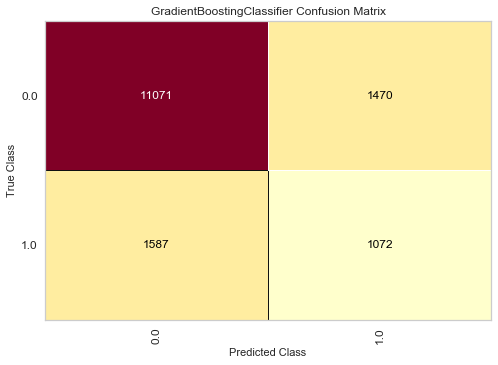

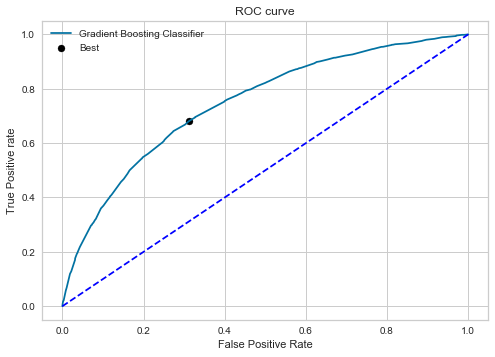

,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,43.142145,39.037232,0.747594,80.335526
1,Nearest Neighbors,32.302305,41.632193,0.671014,74.526316
2,Decision Tree,25.755271,44.565626,0.586529,67.828947
3,Naive Bayes,45.056497,35.990974,0.747581,81.125000
4,Random Forest,25.766471,44.565626,0.650269,67.842105
5,xgboost,39.745509,39.939827,0.735235,78.901316
6,Ada Boost,42.512077,39.714178,0.744567,80.059211
7,SVM,42.758340,39.526138,0.700544,80.164474
8,MLP Classifier,40.579710,45.280181,0.747594,78.828947
9,light Gradient Boosting,40.763414,42.572396,0.739864,79.131579


,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,43.142145,39.037232,0.747594,80.335526
1,Nearest Neighbors,32.302305,41.632193,0.671014,74.526316
2,Decision Tree,25.755271,44.565626,0.586529,67.828947
3,Naive Bayes,45.056497,35.990974,0.747581,81.125000
4,Random Forest,25.766471,44.565626,0.650269,67.842105
5,xgboost,39.745509,39.939827,0.735235,78.901316
6,Ada Boost,42.512077,39.714178,0.744567,80.059211
7,SVM,42.758340,39.526138,0.700544,80.164474
8,MLP Classifier,40.579710,45.280181,0.747594,78.828947
9,light Gradient Boosting,40.763414,42.572396,0.739864,79.131579


In [ ]:
t.fit_model_CV_US(ldadf,'SoldFlag',ratio=0.5,split=10,classification=True,min_max=False,svm_type = "non-Linear",kernel='rbf')

#### PCA

In [ ]:
import warnings
warnings.filterwarnings('ignore')

0it [00:00, ?it/s]

Logistic Regression


7it [00:20,  2.99s/it]


,Number of components,Accuracy,Precision,Recall,F1 score
0,1,0.828425,0.432168,0.0116179,0.0225499
1,2,0.827057,0.420154,0.0452336,0.0771278
2,3,0.829215,0.543257,0.0947008,0.149525
3,4,0.829241,0.545119,0.0997785,0.156131
4,5,0.828965,0.543989,0.100009,0.155835
5,6,0.829359,0.54412,0.10024,0.156349
6,7,0.83032,0.556915,0.0990071,0.153858


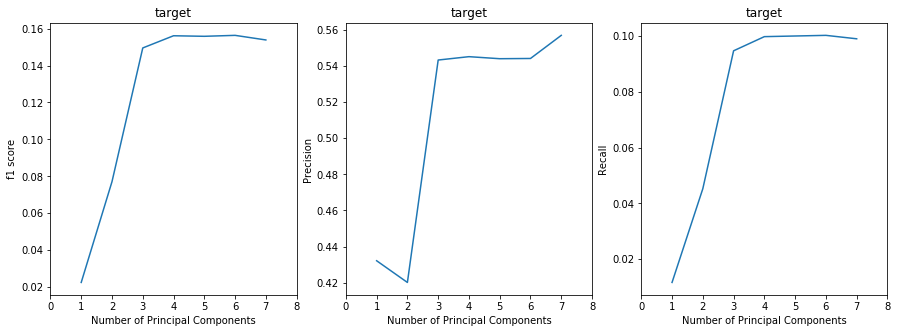

0it [00:00, ?it/s]



Nearest Neighbors


7it [03:29, 29.96s/it]


,Number of components,Accuracy,Precision,Recall,F1 score
0,1,0.805345,0.302992,0.106952,0.157828
1,2,0.804635,0.338415,0.140791,0.188541
2,3,0.803649,0.415242,0.186253,0.226795
3,4,0.804583,0.425176,0.189102,0.231794
4,5,0.804109,0.418137,0.196409,0.235046
5,6,0.803307,0.424768,0.19733,0.235239
6,7,0.802491,0.415314,0.201793,0.237364


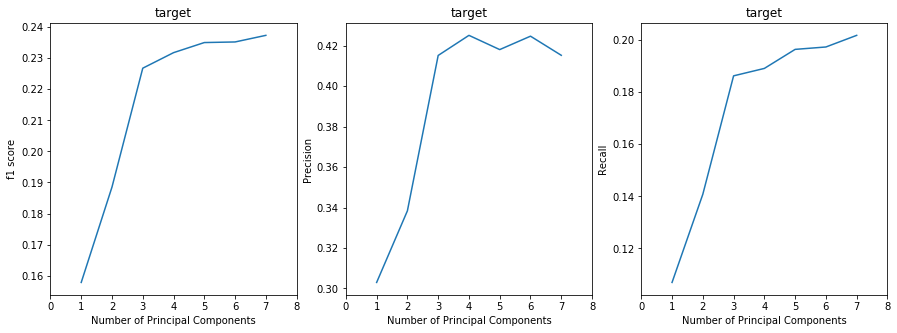

0it [00:00, ?it/s]



Decision Tree


7it [03:12, 27.45s/it]


,Number of components,Accuracy,Precision,Recall,F1 score
0,1,0.730972,0.213493,0.213372,0.213349
1,2,0.733975,0.236647,0.24167,0.23413
2,3,0.73958,0.267622,0.28036,0.262406
3,4,0.739567,0.268238,0.277978,0.263257
4,5,0.737607,0.26775,0.288828,0.269149
5,6,0.741186,0.274526,0.297366,0.272516
6,7,0.73908,0.273734,0.30452,0.277518


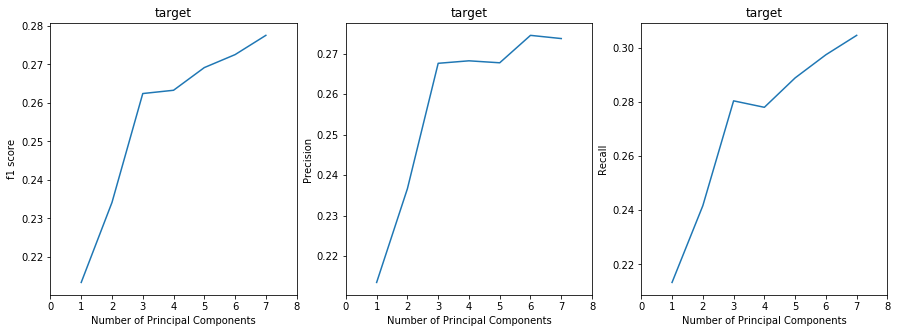

0it [00:00, ?it/s]



Naive Bayes


7it [00:09,  1.32s/it]


,Number of components,Accuracy,Precision,Recall,F1 score
0,1,0.828596,0.429793,0.0113866,0.0220533
1,2,0.829083,0.461815,0.0378493,0.0670854
2,3,0.830241,0.599686,0.083083,0.13392
3,4,0.829754,0.614417,0.118548,0.176576
4,5,0.826189,0.569528,0.149167,0.206947
5,6,0.826018,0.557605,0.157476,0.216137
6,7,0.824847,0.657798,0.168321,0.221551


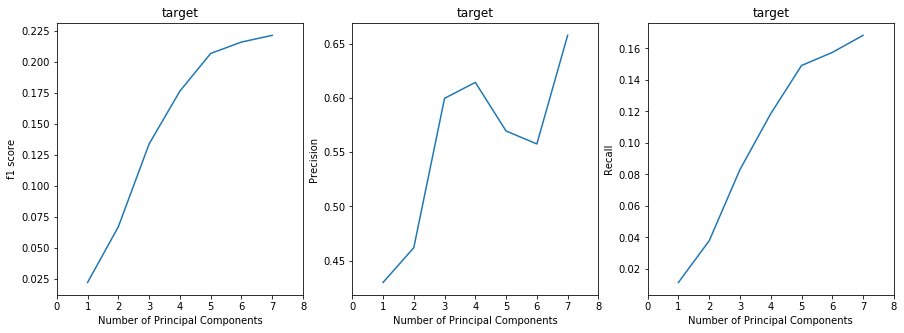

0it [00:00, ?it/s]



Random Forest


7it [1:46:07, 909.68s/it]


,Number of components,Accuracy,Precision,Recall,F1 score
0,1,0.731012,0.213676,0.212756,0.213236
1,2,0.806635,0.34356,0.13256,0.18211
2,3,0.817741,0.474795,0.146245,0.195733
3,4,0.820912,0.522313,0.147169,0.204315
4,5,0.823399,0.54719,0.14786,0.203981
5,6,0.824689,0.584926,0.151399,0.208197
6,7,0.826004,0.600148,0.151014,0.212194


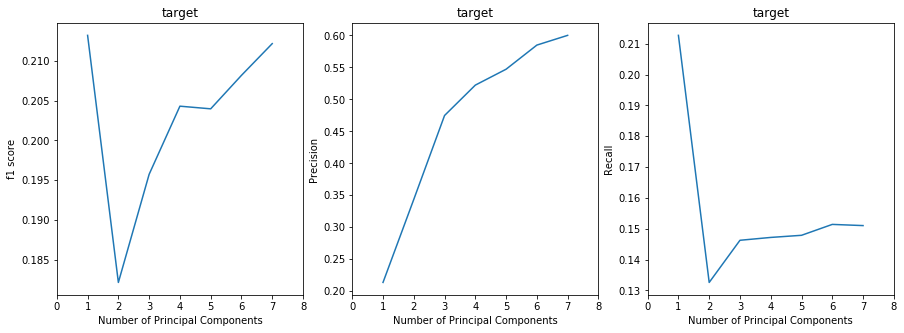

0it [00:00, ?it/s]



xgboost


7it [35:02, 300.30s/it]


,Number of components,Accuracy,Precision,Recall,F1 score
0,1,0.827307,0.432418,0.0333143,0.0614012
1,2,0.828478,0.498432,0.0620833,0.104938
2,3,0.827623,0.563911,0.113702,0.168632
3,4,0.82807,0.580279,0.120781,0.178928
4,5,0.826399,0.547115,0.125473,0.182447
5,6,0.825912,0.567951,0.145398,0.202356
6,7,0.826531,0.607864,0.153706,0.210171


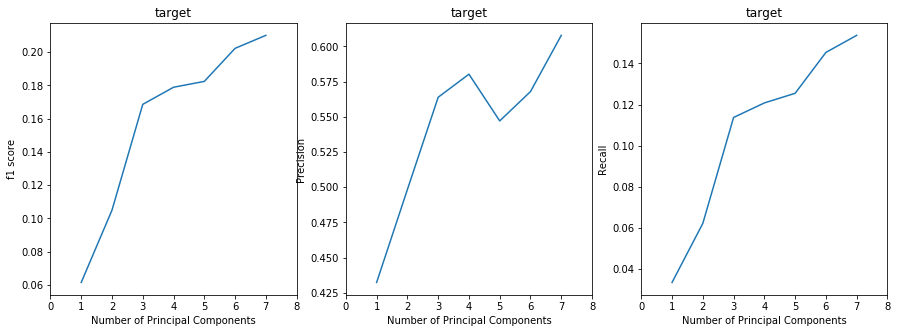

0it [00:00, ?it/s]



Ada Boost


7it [16:59, 145.71s/it]


,Number of components,Accuracy,Precision,Recall,F1 score
0,1,0.828451,0.0341667,0.00315627,0.00577872
1,2,0.828294,0.485156,0.0591612,0.101165
2,3,0.827149,0.60164,0.118395,0.172762
3,4,0.827531,0.589825,0.131781,0.190279
4,5,0.826899,0.578424,0.131704,0.188652
5,6,0.827952,0.605798,0.143243,0.202476
6,7,0.827347,0.606946,0.147089,0.2055


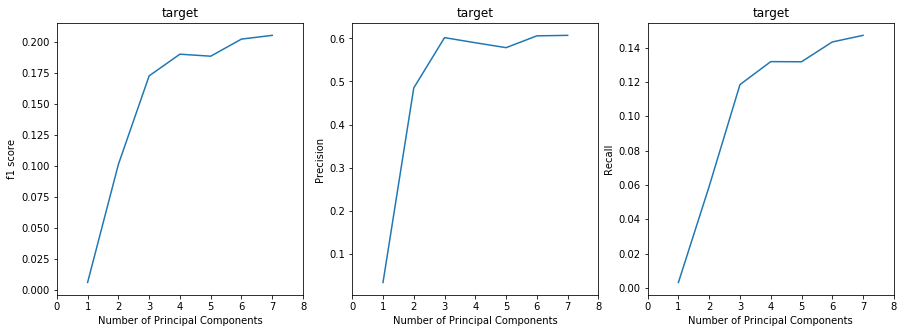

0it [00:00, ?it/s]



SVM


1it [8:40:19, 31219.25s/it]

In [ ]:
t.PCA_plot(df4,'SoldFlag',1,8,1,ib=True,kernel='rbf')

SVM is computationally intractable(one iteration took 8 hours and 40 minutes to complete) therefore it has been removed from the PCA analysis. The code has been modified in the template.

0it [00:00, ?it/s]

Logistic Regression


7it [00:20,  2.91s/it]


,Number of components,Accuracy,Precision,Recall,F1 score
0,1,0.828425,0.432168,0.0116179,0.0225499
1,2,0.827057,0.420154,0.0452336,0.0771278
2,3,0.829215,0.543257,0.0947008,0.149525
3,4,0.829241,0.545119,0.0997785,0.156131
4,5,0.828965,0.543989,0.100009,0.155835
5,6,0.829359,0.54412,0.10024,0.156349
6,7,0.83032,0.556915,0.0990071,0.153858


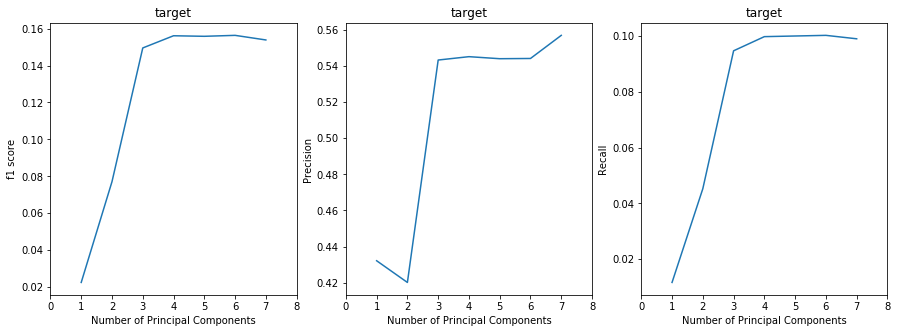

0it [00:00, ?it/s]



Nearest Neighbors


7it [03:59, 34.18s/it]


,Number of components,Accuracy,Precision,Recall,F1 score
0,1,0.805345,0.302992,0.106952,0.157828
1,2,0.804635,0.338415,0.140791,0.188541
2,3,0.803649,0.415242,0.186253,0.226795
3,4,0.804583,0.425176,0.189102,0.231794
4,5,0.804109,0.418137,0.196409,0.235046
5,6,0.803307,0.424768,0.19733,0.235239
6,7,0.802491,0.415314,0.201793,0.237364


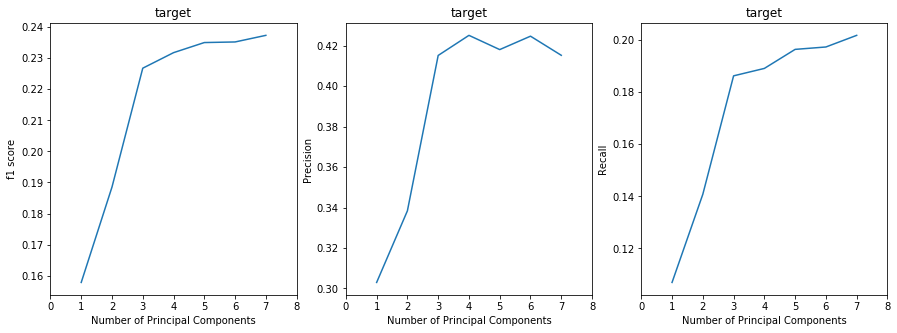

0it [00:00, ?it/s]



Decision Tree


7it [03:23, 29.11s/it]


,Number of components,Accuracy,Precision,Recall,F1 score
0,1,0.730972,0.213493,0.213372,0.213349
1,2,0.73329,0.232959,0.244978,0.233847
2,3,0.739738,0.267489,0.277513,0.261783
3,4,0.739449,0.270067,0.283287,0.263919
4,5,0.73862,0.270245,0.288289,0.268202
5,6,0.741844,0.273496,0.294057,0.272337
6,7,0.739607,0.275415,0.30652,0.275919


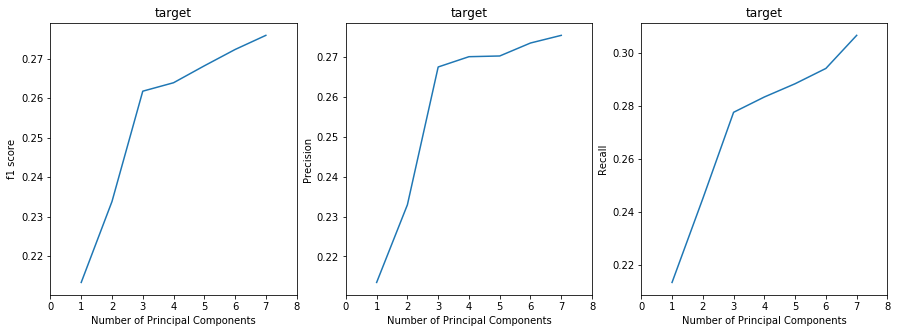

0it [00:00, ?it/s]



Naive Bayes


7it [00:08,  1.19s/it]


,Number of components,Accuracy,Precision,Recall,F1 score
0,1,0.828596,0.429793,0.0113866,0.0220533
1,2,0.829083,0.461815,0.0378493,0.0670854
2,3,0.830241,0.599686,0.083083,0.13392
3,4,0.829754,0.614417,0.118548,0.176576
4,5,0.826189,0.569528,0.149167,0.206947
5,6,0.826018,0.557605,0.157476,0.216137
6,7,0.824847,0.657798,0.168321,0.221551


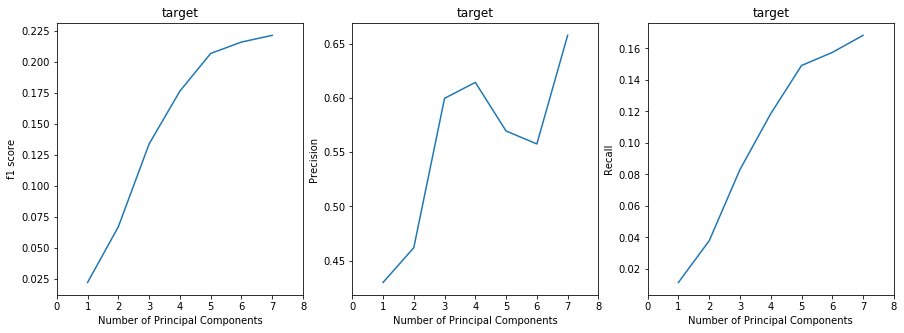

0it [00:00, ?it/s]



Random Forest


7it [1:28:21, 757.43s/it]


,Number of components,Accuracy,Precision,Recall,F1 score
0,1,0.73117,0.213394,0.21291,0.212817
1,2,0.806017,0.346729,0.131021,0.18083
2,3,0.818096,0.490287,0.145784,0.196006
3,4,0.820649,0.528198,0.147324,0.201488
4,5,0.822741,0.542383,0.147244,0.208003
5,6,0.82507,0.598532,0.155169,0.207177
6,7,0.82611,0.594847,0.155091,0.208586


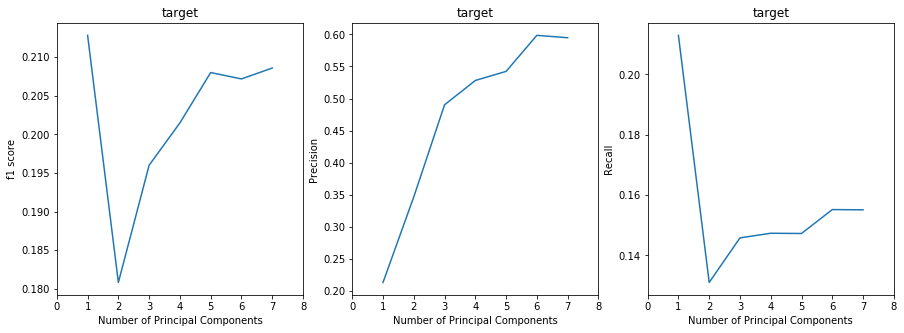

0it [00:00, ?it/s]



xgboost


7it [35:22, 303.17s/it]


,Number of components,Accuracy,Precision,Recall,F1 score
0,1,0.827307,0.432418,0.0333143,0.0614012
1,2,0.828478,0.498432,0.0620833,0.104938
2,3,0.827623,0.563911,0.113702,0.168632
3,4,0.82807,0.580279,0.120781,0.178928
4,5,0.826399,0.547115,0.125473,0.182447
5,6,0.825912,0.567951,0.145398,0.202356
6,7,0.826531,0.607864,0.153706,0.210171


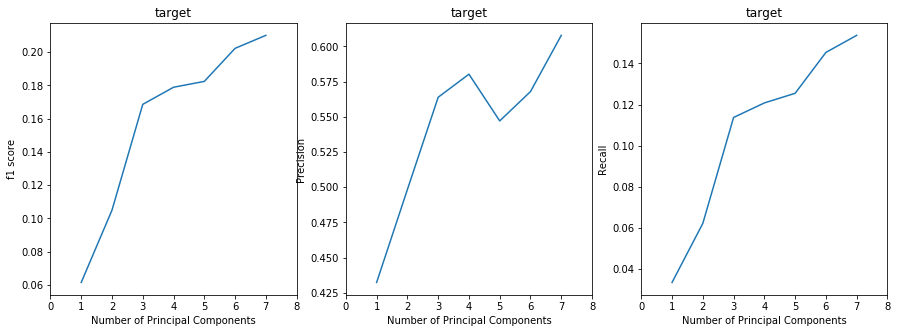

0it [00:00, ?it/s]



Ada Boost


7it [16:25, 140.83s/it]


,Number of components,Accuracy,Precision,Recall,F1 score
0,1,0.828451,0.0341667,0.00315627,0.00577872
1,2,0.828294,0.485156,0.0591612,0.101165
2,3,0.827149,0.60164,0.118395,0.172762
3,4,0.827531,0.589825,0.131781,0.190279
4,5,0.826899,0.578424,0.131704,0.188652
5,6,0.827952,0.605798,0.143243,0.202476
6,7,0.827347,0.606946,0.147089,0.2055


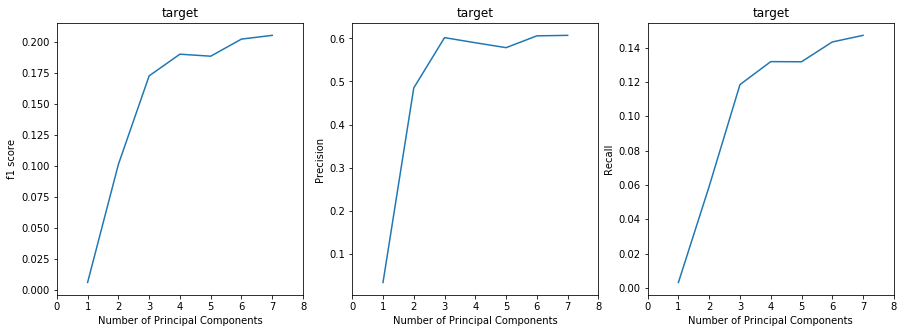

0it [00:00, ?it/s]



MLP Classifier


7it [31:59, 274.24s/it]


,Number of components,Accuracy,Precision,Recall,F1 score
0,1,0.828767,0.341468,0.00961722,0.0181706
1,2,0.830083,0.482856,0.0363109,0.0681034
2,3,0.829057,0.597028,0.0920839,0.143016
3,4,0.827767,0.601697,0.102624,0.160371
4,5,0.829846,0.63679,0.101314,0.158077
5,6,0.828452,0.619488,0.113775,0.161612
6,7,0.827425,0.564226,0.133548,0.184768


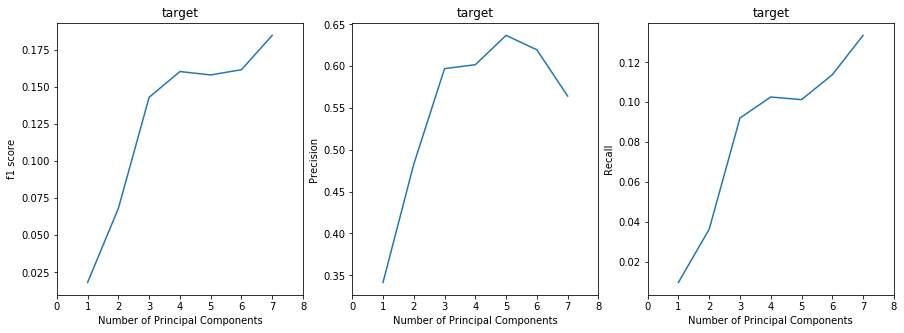

0it [00:00, ?it/s]



light Gradient Boosting


7it [02:45, 23.59s/it]


,Number of components,Accuracy,Precision,Recall,F1 score
0,1,0.828688,0.474493,0.0205426,0.0391982
1,2,0.829899,0.538406,0.0604676,0.102979
2,3,0.830175,0.615233,0.116086,0.173749
3,4,0.829741,0.586474,0.117087,0.174583
4,5,0.829583,0.612433,0.122165,0.180476
5,6,0.828675,0.638992,0.133857,0.190948
6,7,0.829649,0.657133,0.137395,0.195215


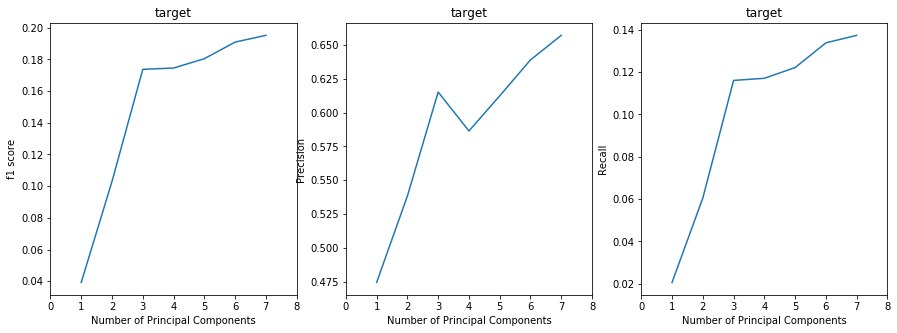

0it [00:00, ?it/s]



Gradient Boosting Classifier


7it [1:00:33, 519.05s/it]


,Number of components,Accuracy,Precision,Recall,F1 score
0,1,0.827859,0.415951,0.015466,0.0296492
1,2,0.829728,0.519462,0.0607733,0.101477
2,3,0.829268,0.630507,0.121164,0.178132
3,4,0.828925,0.608663,0.12924,0.187059
4,5,0.828741,0.618954,0.128856,0.186114
5,6,0.82907,0.663849,0.13801,0.19575
6,7,0.829781,0.712445,0.141548,0.199487


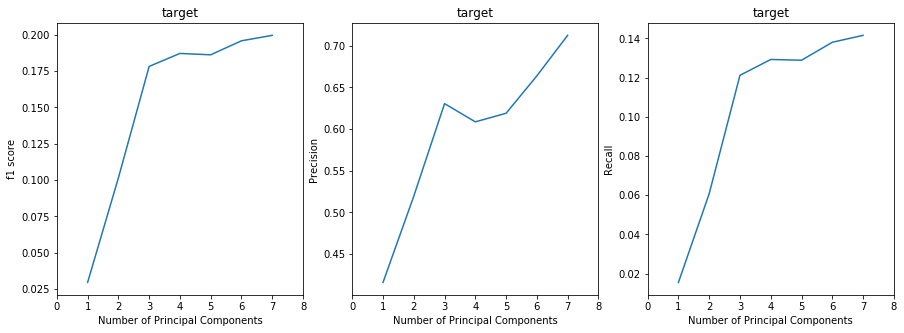

In [ ]:
t.PCA_plot(df4,'SoldFlag',1,8,1,ib=True)

## MCMC 

In [32]:
df4=pd.read_csv('cleaned_encoded.csv')

In [33]:
df4

,SoldFlag,MarketingType,ReleaseNumber,StrengthFactor,PriceReg,ReleaseYear,ItemCount,LowUserPrice,LowNetPrice
0,0.0,0,15,682743.0,44.99,2015,8,28.97,31.84
1,0.0,0,7,1016014.0,24.81,2005,39,0.00,15.54
2,0.0,0,0,340464.0,46.00,2013,34,30.19,27.97
3,1.0,0,4,334011.0,100.00,2006,20,133.93,83.15
4,1.0,0,2,1287938.0,121.95,2010,28,4.00,23.99
...,...,...,...,...,...,...,...,...,...
75991,0.0,1,2,119056.0,64.99,2008,34,32.49,53.00
75992,0.0,1,6,1115312.0,21.50,2004,53,47.99,21.97
75993,0.0,1,7,1315446.0,142.75,2006,19,47.99,53.99
75994,0.0,1,2,877788.0,50.00,2012,21,27.07,32.62


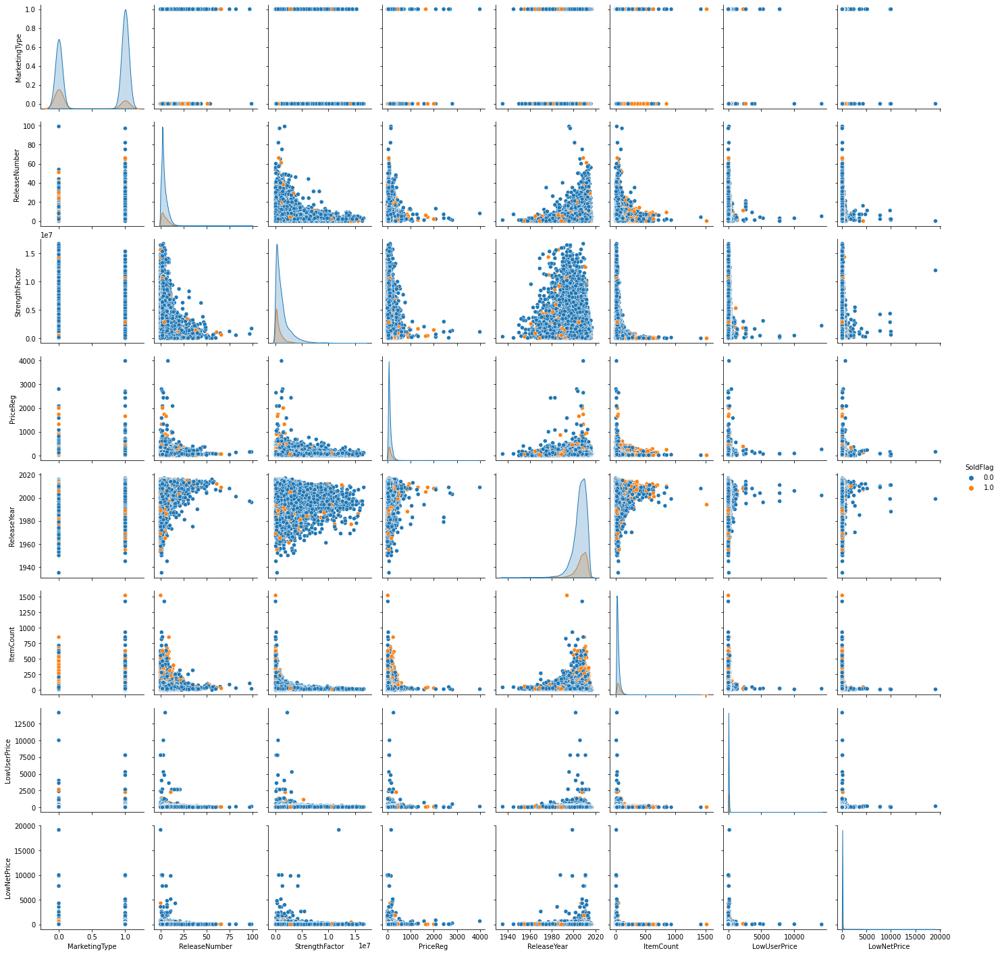

In [ ]:
import seaborn as sns
sns.pairplot(df4, hue='SoldFlag', diag_kind='kde')

Results of the pair plot explain the poor performance of Machine Learning techniques uptil now. Only the feature Item count separates the two classes otherwise the dataset is quite overlapped and it is difficult to train a model to separatae the two classes.

In [34]:
import pymc3 as pm
import arviz as az

Selecting only item count as the input variable for the first attempt.

In [ ]:
y_0=pd.Categorical(df4['SoldFlag']).codes

In [ ]:

x_n = 'ItemCount'
x_0 = df4[x_n].values
x_c = x_0 - x_0.mean()

In [ ]:
from sklearn.model_selection import train_test_split
x_c_train, x_c_test, y_0_train, y_0_test=train_test_split(x_c,y_0,test_size=0.2)

In [ ]:
with pm.Model() as model_0:
  x_c_train = pm.Data('x', x_c_train)
  y_0_train = pm.Data('y', y_0_train)
  α = pm.Normal('α', mu=0, sd=10)
  β = pm.Normal('β', mu=0, sd=10)
  μ = α + pm.math.dot(x_c_train, β)
  θ = pm.Deterministic('θ', pm.math.sigmoid(μ))
  bd = pm.Deterministic('bd', -α/β)
  yl = pm.Bernoulli('yl', p=θ, observed=y_0_train)
  trace_0 = pm.sample(1000)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: FutureWarning: In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
  # Remove the CWD from sys.path while we load stuff.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [β, α]


Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 172 seconds.


In [ ]:
az.summary(trace_0,var_names=['β','α'])

Got error No model on context stack. trying to find log_likelihood in translation.
/usr/local/lib/python3.7/dist-packages/arviz/data/io_pymc3_3x.py:102: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  FutureWarning,


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
β,0.015,0.000,0.014,0.015,0.0,0.0,1495.0,1381.0,1.0
α,-1.653,0.011,-1.674,-1.633,0.0,0.0,1562.0,1133.0,1.0


Got error No model on context stack. trying to find log_likelihood in translation.
/usr/local/lib/python3.7/dist-packages/arviz/data/io_pymc3_3x.py:102: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  FutureWarning,
Got error No model on context stack. trying to find log_likelihood in translation.


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fec6c6c6d90>,
      dtype=object)

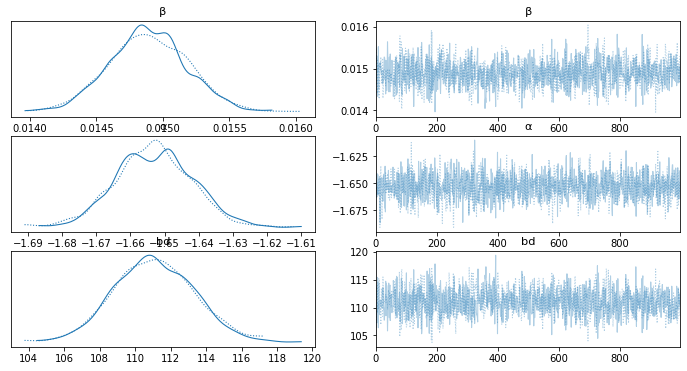

In [ ]:
az.plot_trace(trace_0,var_names=['β','α','bd'])

Got error No model on context stack. trying to find log_likelihood in translation.
/usr/local/lib/python3.7/dist-packages/arviz/data/io_pymc3_3x.py:102: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/arviz/plots/plot_utils.py:277: UserWarning: rcParams['plot.max_subplots'] (40) is smaller than the number of variables to plot (60799) in plot_posterior, generating only 40 plots
  UserWarning,


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fec6bf918d0>,
      dtype=object)

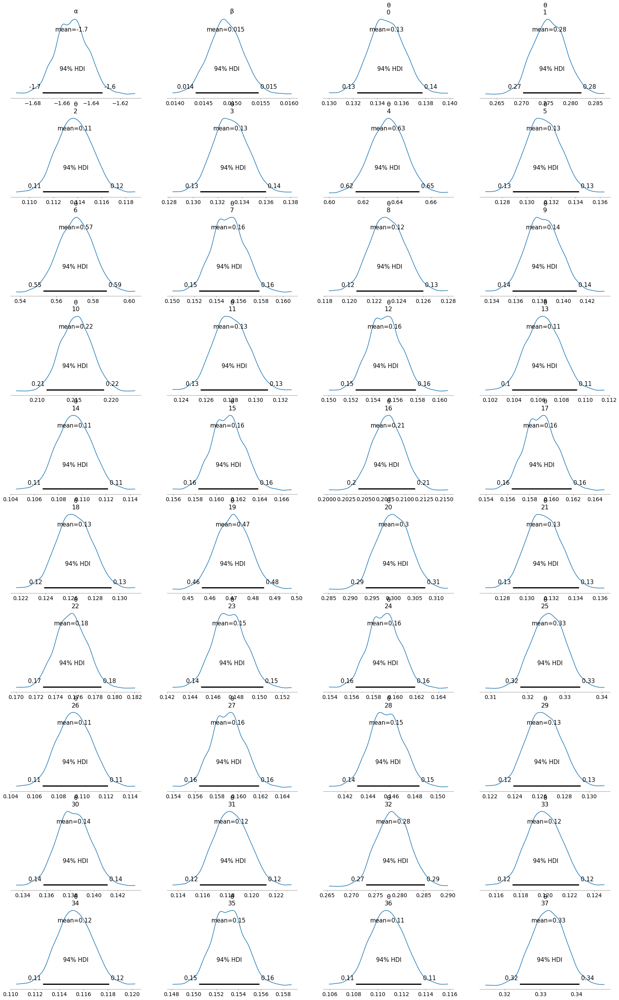

In [ ]:
az.plot_posterior(trace_0)

Got error No model on context stack. trying to find log_likelihood in translation.
/usr/local/lib/python3.7/dist-packages/arviz/data/io_pymc3_3x.py:102: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  FutureWarning,


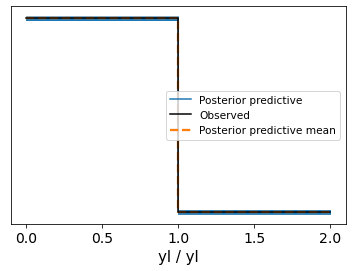

In [ ]:
prior_predictive = pm.sample_prior_predictive(model=model_0)

posterior_predictive = pm.sample_posterior_predictive(model=model_0,trace=trace_0)
dataset = az.from_pymc3(trace=trace_0, posterior_predictive=posterior_predictive,prior=prior_predictive)
az.plot_ppc(dataset);


Posterior predictive check shows the logistic regression model has captured the distribution.

/usr/local/lib/python3.7/dist-packages/arviz/plots/hdiplot.py:157: FutureWarning: hdi currently interprets 2d data as (draw, shape) but this will change in a future release to (chain, draw) for coherence with other functions
  hdi_data = hdi(y, hdi_prob=hdi_prob, circular=circular, multimodal=False, **hdi_kwargs)


([<matplotlib.axis.XTick at 0x7fec67f9e050>,
 [Text(0, 0, '-156.2'),
  Text(0, 0, '43.8'),
  Text(0, 0, '243.8'),
  Text(0, 0, '443.8'),
  Text(0, 0, '643.8'),
  Text(0, 0, '843.8'),
  Text(0, 0, '1043.8'),
  Text(0, 0, '1243.8'),
  Text(0, 0, '1443.8'),
  Text(0, 0, '1643.8')])

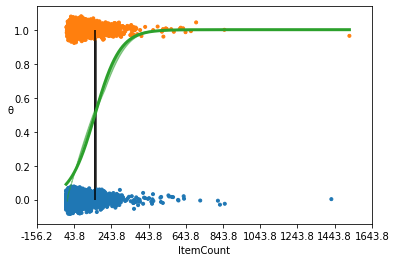

In [ ]:
theta = trace_0['θ'].mean(axis=0)
idx = np.argsort(x_c_train)
plt.plot(x_c_train[idx], theta[idx], color='C2', lw=3)
plt.vlines(trace_0['bd'].mean(), 0, 1, color='k')
bd_hpd = az.hdi(trace_0['bd'])
plt.fill_betweenx([0, 1], bd_hpd[0], bd_hpd[1], color='k', alpha=0.5)
plt.scatter(x_c_train, np.random.normal(y_0_train, 0.02),
marker='.', color=[f'C{x}' for x in y_0_train])
az.plot_hdi(x_c_train, trace_0['θ'], color='C2')
plt.xlabel(x_n)
plt.ylabel('θ', rotation=0)
# use original scale for xticks
locs, _ = plt.xticks()
plt.xticks(locs, np.round(locs + x_0.mean(), 1))

Generating predictions for test set.

In [ ]:
with model_0:
  pm.set_data({'x': x_c_test})
  y_pred = pm.sample_posterior_predictive(trace_0)

In [ ]:
y_pred['yl'].mean(axis=0)

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 1, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 1, ..., 0, 0, 0],
       [1, 0, 0, ..., 1, 1, 1]])

In [ ]:
predictions=np.mean(y_pred['yl'],axis=0)

In [ ]:
predictions

array([0.1455, 0.2585, 0.2305, ..., 0.127 , 0.1635, 0.0975])

In [ ]:
predictions2=[]
for i in predictions:
  if i>0.5:
    predictions2.append(1)
  else:
    predictions2.append(0)


In [ ]:
len(predictions2)

15200

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_0_test, predictions2))

              precision    recall  f1-score   support

           0       0.83      0.99      0.90     12534
           1       0.55      0.05      0.10      2666

    accuracy                           0.83     15200
   macro avg       0.69      0.52      0.50     15200
weighted avg       0.78      0.83      0.76     15200



The above model was built with priors selected from the normal distribution. However as distribution plot suggests, the item count feature has a skewed distribution. In such cases, the student's t-distribution could lead better results due to its capability to handle outliers better as compared to the normal distribution.(Bayesian Analysis with Python
Second Edition, Osvaldo Martin, Page 60)

In [ ]:
from sklearn.model_selection import train_test_split
x_c_train, x_c_test, y_0_train, y_0_test=train_test_split(x_c,y_0,test_size=0.2)

In [ ]:
with pm.Model() as model_1:
  x_c_train = pm.Data('x', x_c_train)
  y_0_train = pm.Data('y', y_0_train)
  α = pm.StudentT('α', nu=1, mu=0, sd=10)
  β = pm.StudentT('β', nu=1, mu=0, sd=10)
  μ = α + pm.math.dot(x_c_train, β)
  θ = pm.Deterministic('θ', pm.math.sigmoid(μ))
  bd = pm.Deterministic('bd', -α/β)
  yl = pm.Bernoulli('yl', p=θ, observed=y_0_train)
  trace_1 = pm.sample(1000)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:10: FutureWarning: In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
  # Remove the CWD from sys.path while we load stuff.
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [β, α]


Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 160 seconds.


In [ ]:
az.summary(trace_1,var_names=['β','α'])

Got error No model on context stack. trying to find log_likelihood in translation.
/usr/local/lib/python3.7/dist-packages/arviz/data/io_pymc3_3x.py:102: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  FutureWarning,


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
β,0.015,0.000,0.014,0.015,0.0,0.0,1375.0,1147.0,1.0
α,-1.654,0.011,-1.678,-1.636,0.0,0.0,1653.0,1482.0,1.0


Identical results have been acieved when compared with gaussian priors.

Got error No model on context stack. trying to find log_likelihood in translation.
/usr/local/lib/python3.7/dist-packages/arviz/data/io_pymc3_3x.py:102: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  FutureWarning,


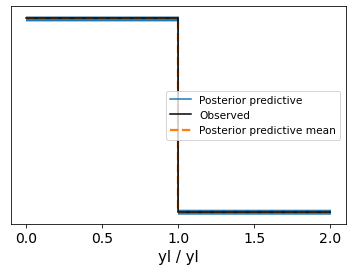

In [ ]:
prior_predictive = pm.sample_prior_predictive(model=model_1)

posterior_predictive = pm.sample_posterior_predictive(model=model_1,trace=trace_1)
dataset = az.from_pymc3(trace=trace_1, posterior_predictive=posterior_predictive,prior=prior_predictive)
az.plot_ppc(dataset);

In [ ]:
with model_1:
  pm.set_data({'x': x_c_test})
  y_pred = pm.sample_posterior_predictive(trace_1)

In [ ]:
predictions=np.mean(y_pred['yl'],axis=0)

In [ ]:
predictions

array([0.118 , 0.171 , 0.1285, ..., 0.111 , 0.3475, 0.1405])

In [ ]:
predictions2=[]
for i in predictions:
  if i>0.5:
    predictions2.append(1)
  else:
    predictions2.append(0)


In [ ]:
len(predictions2)

15200

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_0_test, predictions2))

              precision    recall  f1-score   support

           0       0.83      0.99      0.91     12586
           1       0.52      0.05      0.09      2614

    accuracy                           0.83     15200
   macro avg       0.68      0.52      0.50     15200
weighted avg       0.78      0.83      0.76     15200



Metropolis Hastings

In [ ]:
y_0=pd.Categorical(df4['SoldFlag']).codes

In [ ]:

x_n = 'ItemCount'
x_0 = df4[x_n].values
x_c = x_0 - x_0.mean()#Centering around mean

In [ ]:
from sklearn.model_selection import train_test_split
x_c_train, x_c_test, y_0_train, y_0_test=train_test_split(x_c,y_0,test_size=0.2)

In [ ]:
with pm.Model() as model_0:
  x_c_train = pm.Data('x', x_c_train)
  y_0_train = pm.Data('y', y_0_train)
  α = pm.Normal('α', mu=0, sd=10)
  β = pm.Normal('β', mu=0, sd=10)
  μ = α + pm.math.dot(x_c_train, β)
  θ = pm.Deterministic('θ', pm.math.sigmoid(μ))
  bd = pm.Deterministic('bd', -α/β)
  step1=pm.Metropolis()
  yl = pm.Bernoulli('yl', p=θ, observed=y_0_train)
  trace_0 = pm.sample(1000,step=step1)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:11: FutureWarning: In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
  # This is added back by InteractiveShellApp.init_path()
Sequential sampling (2 chains in 1 job)
CompoundStep
>Metropolis: [β]
>Metropolis: [α]


Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 10 seconds.
The rhat statistic is larger than 1.05 for some parameters. This indicates slight problems during sampling.
The estimated number of effective samples is smaller than 200 for some parameters.


In [ ]:
az.summary(trace_0,var_names=['β','α'])

Got error No model on context stack. trying to find log_likelihood in translation.
/usr/local/lib/python3.7/dist-packages/arviz/data/io_pymc3_3x.py:102: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  FutureWarning,


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
β,-1.291,11.016,-21.055,15.547,4.685,3.505,6.0,60.0,1.27
α,-3.013,8.822,-17.662,13.333,2.579,1.871,15.0,321.0,1.10


r_hat value suggests the chains have not converged.

Got error No model on context stack. trying to find log_likelihood in translation.
/usr/local/lib/python3.7/dist-packages/arviz/data/io_pymc3_3x.py:102: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  FutureWarning,
Got error No model on context stack. trying to find log_likelihood in translation.


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f3ae83b1590>,
      dtype=object)

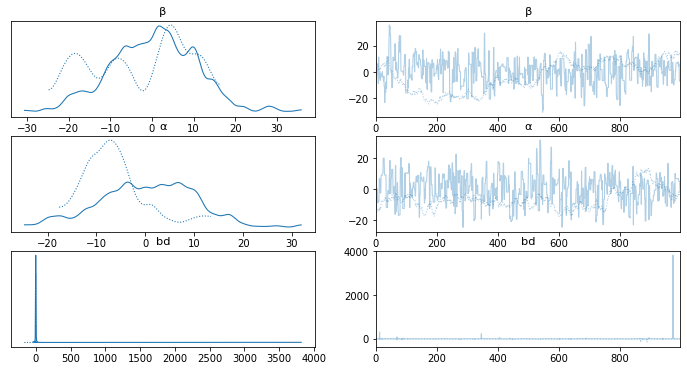

In [ ]:
az.plot_trace(trace_0,var_names=['β','α','bd'])

Trace plots confirms non-convergence of chains.

Got error No model on context stack. trying to find log_likelihood in translation.
/usr/local/lib/python3.7/dist-packages/arviz/data/io_pymc3_3x.py:102: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/arviz/plots/plot_utils.py:277: UserWarning: rcParams['plot.max_subplots'] (40) is smaller than the number of variables to plot (60799) in plot_posterior, generating only 40 plots
  UserWarning,


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fec6bf918d0>,
      dtype=object)

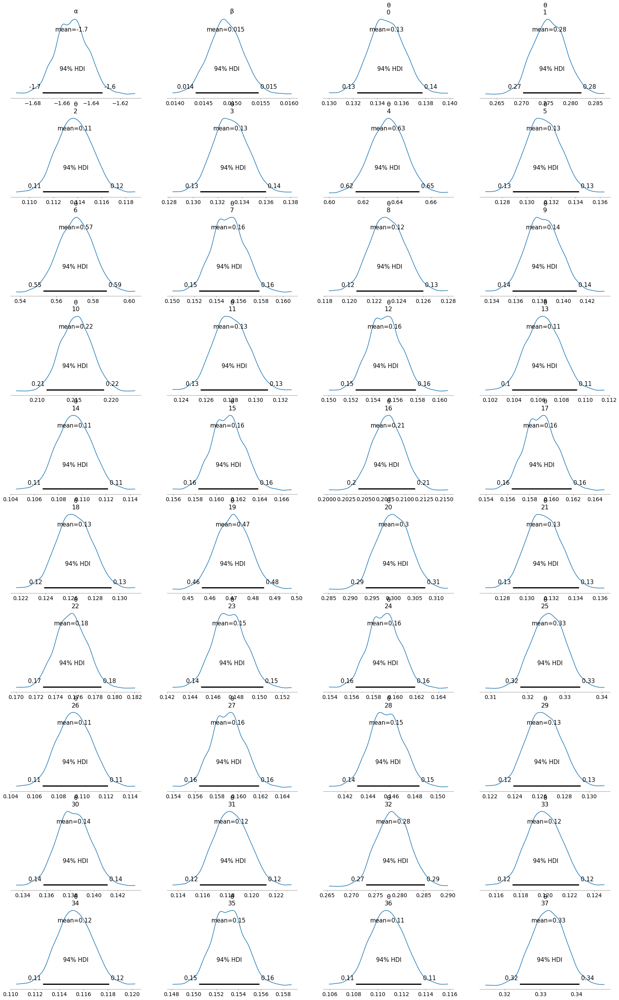

In [ ]:
az.plot_posterior(trace_0)

Got error No model on context stack. trying to find log_likelihood in translation.
/usr/local/lib/python3.7/dist-packages/arviz/data/io_pymc3_3x.py:102: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  FutureWarning,


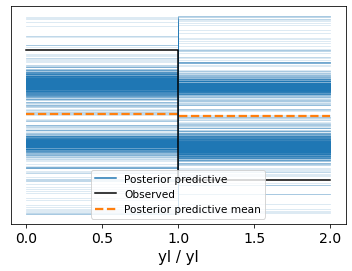

In [ ]:
#prior_predictive = pm.sample_prior_predictive(model=model_0)
#posterior_predictive = pm.sample_posterior_predictive(model=model_0,trace=trace_0)
#dataset = az.from_pymc3(trace=trace_0, posterior_predictive=posterior_predictive,prior=prior_predictive)
#az.plot_ppc(dataset);
t.plot_ppc(model_0,trace_0)

In [ ]:
t.pred(model_0,trace_0,x_c_test,y_0_test)

              precision    recall  f1-score   support

           0       0.72      0.32      0.44     12631
           1       0.11      0.40      0.17      2569

    accuracy                           0.33     15200
   macro avg       0.41      0.36      0.30     15200
weighted avg       0.62      0.33      0.39     15200



NUTS has performed better than metropolis hastings.

Selecting item count and marketing type as variables.

In [ ]:
y_0=pd.Categorical(df4['SoldFlag']).codes

In [ ]:

x_n = ['ItemCount','MarketingType']
x_c = df4[x_n].values
from sklearn.preprocessing import StandardScaler
ss=StandardScaler()
ss=ss.fit(x_c)
x_c=ss.fit_transform(x_c)

In [ ]:
from sklearn.model_selection import train_test_split
x_c_train, x_c_test, y_0_train, y_0_test=train_test_split(x_c,y_0,test_size=0.2,stratify=y_0)

In [ ]:
import theano
X_shared = theano.shared(x_c_train)
#y_shared=theano.shared(x_c_train)

In [ ]:
X_shared

<TensorType(float64, matrix)>

In [ ]:
with pm.Model() as model_0:
  
  α = pm.Normal('α', mu=0, sd=10)
  β = pm.Normal('β', mu=0, sd=10,shape=len(x_n))
  μ = α + pm.math.dot(X_shared, β)
  θ = pm.Deterministic('θ', pm.math.sigmoid(μ))
  bd = pm.Deterministic('bd', -α/β[1] - β[0]/β[1] * X_shared[:,0])
  #start=pm.find_MAP()
  step1=pm.NUTS()
  yl = pm.Bernoulli('yl', p=θ, observed=y_0_train)
  trace_0 = pm.sample(1000,step=step1)

WARNING (theano.tensor.blas): We did not find a dynamic library in the library_dir of the library we use for blas. If you use ATLAS, make sure to compile it with dynamics library.
WARNING (theano.tensor.blas): We did not find a dynamic library in the library_dir of the library we use for blas. If you use ATLAS, make sure to compile it with dynamics library.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:11: FutureWarning: In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
  # This is added back by InteractiveShellApp.init_path()
Sequential sampling (2 chains in 1 job)
NUTS: [β, α]


Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 23 seconds.


In [ ]:
az.summary(trace_0,var_names=['β','α'])

Got error No model on context stack. trying to find log_likelihood in translation.
/usr/local/lib/python3.7/dist-packages/arviz/data/io_pymc3_3x.py:102: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  FutureWarning,


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
β[0],0.149,10.359,-19.760,19.051,0.204,0.249,2559.0,1293.0,1.0
β[1],0.030,9.814,-18.054,17.089,0.185,0.217,2820.0,1402.0,1.0
α,-0.026,9.789,-19.951,16.882,0.192,0.231,2603.0,1237.0,1.0


In [ ]:
az.plot_trace(trace_0,var_names=['bd'])

Got error No model on context stack. trying to find log_likelihood in translation.
/usr/local/lib/python3.7/dist-packages/arviz/data/io_pymc3_3x.py:102: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  FutureWarning,
Got error No model on context stack. trying to find log_likelihood in translation.


In [ ]:
az.plot_posterior(trace_0)

In [ ]:
t.plot_ppc(model_0,trace_0)

In [ ]:
X_shared.set_value( x_c_test)

Lack of available RAM has prevented the plots to be generated.

In [ ]:
with model_0:
  y_pred = pm.sample_posterior_predictive(trace_0)

In [ ]:
predictions=np.mean(y_pred['yl'],axis=0)

In [ ]:
predictions

array([0.4995, 0.503 , 0.4885, ..., 0.5275, 0.494 , 0.514 ])

In [ ]:
predictions2=[]
for i in predictions:
  if i>0.5:
    predictions2.append(1)
  else:
    predictions2.append(0)


In [ ]:
len(predictions2)

15200

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_0_test, predictions2))

              precision    recall  f1-score   support

           0       0.82      0.48      0.60     12601
           1       0.16      0.48      0.24      2599

    accuracy                           0.48     15200
   macro avg       0.49      0.48      0.42     15200
weighted avg       0.70      0.48      0.54     15200



Accuracy and f1-score are still poor.

In [ ]:
y_0=pd.Categorical(df4['SoldFlag']).codes

In [ ]:

x_n = ['ItemCount','MarketingType']
x_c = df4[x_n].values
from sklearn.preprocessing import StandardScaler
ss=StandardScaler()
ss=ss.fit(x_c)
x_c=ss.fit_transform(x_c)

In [ ]:
from sklearn.model_selection import train_test_split
x_c_train, x_c_test, y_0_train, y_0_test=train_test_split(x_c,y_0,test_size=0.2,stratify=y_0)

In [ ]:
import theano
X_shared = theano.shared(x_c_train)
y_shared=theano.shared(y_0_train)

In [ ]:
p=x_c_train.shape[1]

In [ ]:
X_shared

<TensorType(float64, matrix)>

Using Hierarchical approach with beta sampled from laplace distribution.

In [ ]:
with pm.Model() as model:
    
    mu_beta = pm.Normal('mu_beta', mu=0, sd=2)    
    sd_beta = pm.HalfNormal('sd', sd=1)
    beta = pm.Laplace('beta', mu=mu_beta, b=sd_beta, shape=p)    
    
    cutpoints = pm.Normal("cutpoints", mu=[-0.001,0], sd=20, shape=2,
                           transform=pm.distributions.transforms.ordered)
    
    lp = pm.Deterministic('lp', pm.math.dot(X_shared, beta))

    y_obs = pm.OrderedLogistic("y_obs", eta=lp, cutpoints=cutpoints, observed=y_shared)
    
    trace = pm.sample(1000)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: FutureWarning: In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
  
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [cutpoints, beta, sd, mu_beta]


Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 1528 seconds.
There was 1 divergence after tuning. Increase `target_accept` or reparameterize.
There was 1 divergence after tuning. Increase `target_accept` or reparameterize.


In [ ]:
az.summary(trace,var_names=['cutpoints'])

Got error No model on context stack. trying to find log_likelihood in translation.
/usr/local/lib/python3.7/dist-packages/arviz/data/io_pymc3_3x.py:102: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  FutureWarning,


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
cutpoints[0],1.753,0.012,1.729,1.774,0.000,0.0,1482.0,1122.0,1.0
cutpoints[1],29.132,8.988,17.208,47.432,0.281,0.2,1267.0,1246.0,1.0


In [ ]:
az.plot_trace(trace_0,var_names=['bd'])

Got error No model on context stack. trying to find log_likelihood in translation.
/usr/local/lib/python3.7/dist-packages/arviz/data/io_pymc3_3x.py:102: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  FutureWarning,
Got error No model on context stack. trying to find log_likelihood in translation.


In [ ]:
X_shared.set_value( x_c_test)

Lack of available RAM has prevented the plots to be generated.

In [ ]:
with model:
  y_pred = pm.sample_posterior_predictive(trace)

In [ ]:
predictions2=y_pred['y_obs']

In [ ]:
predictions2=predictions2[0:1093]

In [ ]:
predictions2.shape

(1093, 15200)

In [ ]:
probs=np.mean(predictions2,axis=0)

In [ ]:
preds=[]
for p in probs:
  if p>0.85:
    preds.append(1)
  else:
    preds.append(0)

In [ ]:
preds.index(0)

0

In [ ]:
len([i for i,x in enumerate(preds) if x==1])

50

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(list(y_0_test), preds))

              precision    recall  f1-score   support

           0       0.83      1.00      0.91     12601
           1       0.52      0.01      0.02      2599

    accuracy                           0.83     15200
   macro avg       0.68      0.50      0.46     15200
weighted avg       0.78      0.83      0.75     15200



In [ ]:
def logistic(x):
    return 1 / (1 + np.exp(-x))
cutpoints = trace['cutpoints']
c1 = np.mean(logistic(cutpoints[:,0]))
c2 = np.mean(logistic(cutpoints[:,1]))

In [ ]:
c1

0.8523008339127892

Under Sampling the majority class

In [37]:
x,y=t.under_sample(df4,'SoldFlag',ratio=0.8)

In [38]:
x

,MarketingType,ReleaseNumber,StrengthFactor,PriceReg,ReleaseYear,ItemCount,LowUserPrice,LowNetPrice
0,0,5,1126745.0,54.95,2003,38,52.19,43.49
1,0,9,1772564.0,181.25,2011,28,0.00,0.00
2,1,3,221191.0,134.95,2010,35,126.39,84.35
3,1,2,238816.0,60.00,2003,30,4.41,7.26
4,1,5,2807848.0,60.00,2007,22,46.04,8.94
...,...,...,...,...,...,...,...,...
23253,1,4,330851.0,152.93,2011,30,91.05,63.99
23254,1,7,4301835.0,0.00,2011,12,113.98,21.94
23255,1,2,1227615.0,116.00,2013,35,105.98,4.96
23256,0,1,25541.0,103.91,2011,175,83.99,32.98


In [39]:
x.columns

Index(['MarketingType', 'ReleaseNumber', 'StrengthFactor', 'PriceReg',
       'ReleaseYear', 'ItemCount', 'LowUserPrice', 'LowNetPrice'],
      dtype='object')

In [40]:

x_n = ['ItemCount','MarketingType']
x_c = x[x_n].values
from sklearn.preprocessing import StandardScaler
ss=StandardScaler()
ss=ss.fit(x_c)
x_c=ss.fit_transform(x_c)

In [41]:
y_0=pd.Categorical(y).codes

In [42]:
from sklearn.model_selection import train_test_split
x_c_train, x_c_test, y_0_train, y_0_test=train_test_split(x_c,y_0,test_size=0.2,stratify=y_0)

In [43]:
p=x_c_train.shape[1]

In [44]:
import theano
X_shared = theano.shared(x_c_train)
y_shared=theano.shared(y_0_train)

In [45]:
import pymc3 as pm
import arviz as az

In [46]:
with pm.Model() as model:
    
    mu_beta = pm.Normal('mu_beta', mu=0, sd=2)    
    sd_beta = pm.HalfNormal('sd', sd=1)
    beta = pm.Laplace('beta', mu=mu_beta, b=sd_beta, shape=p)    
    
    cutpoints = pm.Normal("cutpoints", mu=[-0.001,0], sd=20, shape=2,
                           transform=pm.distributions.transforms.ordered)
    
    lp = pm.Deterministic('lp', pm.math.dot(X_shared, beta))

    y_obs = pm.OrderedLogistic("y_obs", eta=lp, cutpoints=cutpoints, observed=y_shared)
    
    trace = pm.sample(1000)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:14: FutureWarning: In v4.0, pm.sample will return an `arviz.InferenceData` object instead of a `MultiTrace` by default. You can pass return_inferencedata=True or return_inferencedata=False to be safe and silence this warning.
  
Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Sequential sampling (2 chains in 1 job)
NUTS: [cutpoints, beta, sd, mu_beta]


Sampling 2 chains for 1_000 tune and 1_000 draw iterations (2_000 + 2_000 draws total) took 466 seconds.
There were 23 divergences after tuning. Increase `target_accept` or reparameterize.
There were 52 divergences after tuning. Increase `target_accept` or reparameterize.


In [50]:
az.summary(trace,var_names=['cutpoints'])

Got error No model on context stack. trying to find log_likelihood in translation.
/usr/local/lib/python3.7/dist-packages/arviz/data/io_pymc3_3x.py:102: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  FutureWarning,


,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
cutpoints[0],0.219,0.016,0.188,0.249,0.00,0.000,1707.0,1392.0,1.0
cutpoints[1],24.021,9.820,11.111,41.728,0.28,0.198,1306.0,1354.0,1.0


Got error No model on context stack. trying to find log_likelihood in translation.
/usr/local/lib/python3.7/dist-packages/arviz/data/io_pymc3_3x.py:102: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  FutureWarning,
Got error No model on context stack. trying to find log_likelihood in translation.


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fd8d03df710>,
      dtype=object)

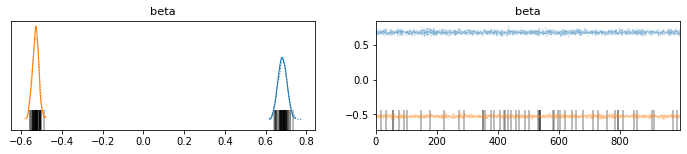

In [51]:
az.plot_trace(trace,var_names=['beta'])

Got error No model on context stack. trying to find log_likelihood in translation.
/usr/local/lib/python3.7/dist-packages/arviz/data/io_pymc3_3x.py:102: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  FutureWarning,
/usr/local/lib/python3.7/dist-packages/arviz/plots/plot_utils.py:277: UserWarning: rcParams['plot.max_subplots'] (40) is smaller than the number of variables to plot (18612) in plot_posterior, generating only 40 plots
  UserWarning,


array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7fd8cd52b450>,
      dtype=object)

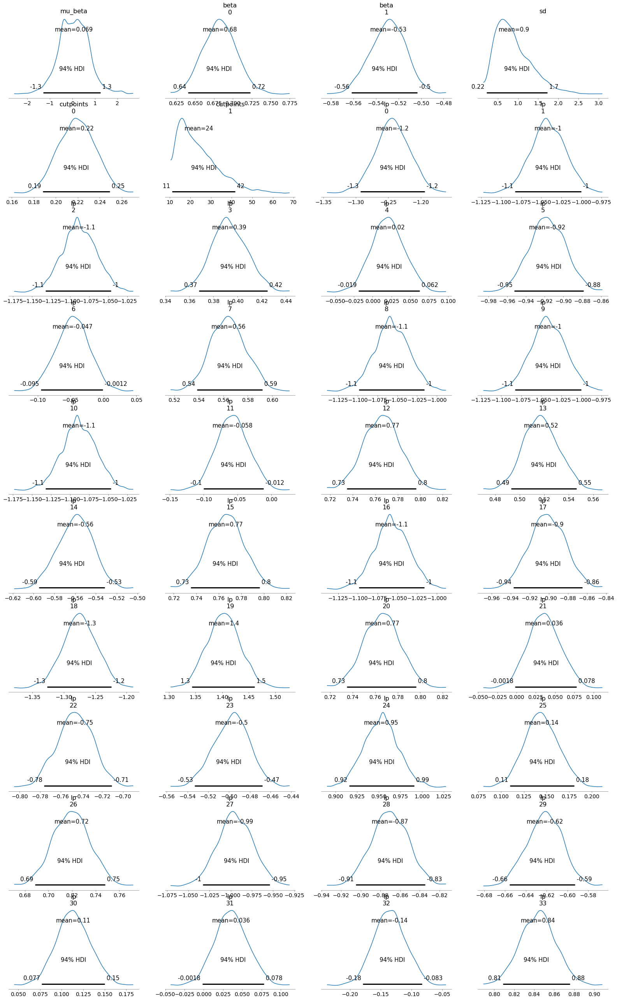

In [52]:
az.plot_posterior(trace)

In [53]:
X_shared.set_value( x_c_test)

In [54]:
with model:
  y_pred = pm.sample_posterior_predictive(trace)

In [55]:
predictions2=y_pred['y_obs']

In [56]:
predictions2.shape

(2000, 4652)

In [57]:
probs=np.mean(predictions2,axis=0)

In [58]:
preds=[]
for p in probs:
  if p>0.5:
    preds.append(1)
  else:
    preds.append(0)

In [59]:
preds.index(0)

0

In [60]:
len([i for i,x in enumerate(preds) if x==1])

1754

In [61]:
from sklearn.metrics import classification_report
print(classification_report(list(y_0_test), preds))

              precision    recall  f1-score   support

           0       0.70      0.79      0.74      2584
           1       0.69      0.58      0.63      2068

    accuracy                           0.70      4652
   macro avg       0.70      0.69      0.69      4652
weighted avg       0.70      0.70      0.69      4652



Undersampling has greatly improved performance of the model.